# Comparative Analysis of Synthetic Minority Oversampling Technique (SMOTE) and Undersampling Techniques on Imbalanced Health Data: Case Study of Stroke Prediction


#1.Problem Definition

In healthcare, predictive models can significantly improve patient outcomes by enabling early intervention and personalized treatment plans. However, many healthcare datasets, such as those predicting stroke occurrences, suffer from class imbalance. This study evaluates the effectiveness of various undersampling techniques on an imbalanced healthcare dataset related to stroke prediction.

Many healthcare datasets are imbalanced, leading to biased models that perform poorly in identifying the minority class. This study aims to:



###**Implement Undersampling and Oversampling Techniques**
   

Apply various undersampling and oversampling methods to balance the dataset.



####Undersampling Techniques



#####Prototype Generation
- **Cluster Centroids:** Reduces the dataset by synthesizing centroids from clusters using K-means, rather than selecting individual samples.



#####Prototype Selection






###### Controlled Undersampling Techniques
- **Random Undersampling:** Randomly selects a subset of data from the targeted classes.
- **NearMiss:** Uses three different rules based on nearest neighbors to select samples:
  - **NearMiss-1:** Chooses samples with the smallest average distance to the closest samples of the minority class.
  - **NearMiss-2:** Chooses samples with the smallest average distance to the farthest samples of the minority class.
  - **NearMiss-3:** Keeps samples based on a two-step nearest-neighbor selection process.

##### Cleaning Undersampling Techniques
- **Tomek Links:** Removes pairs of samples from different classes that are each other's closest neighbors.
- **Edited Nearest Neighbors (ENN):** Removes majority samples if any or most neighbors belong to a different class.
- **Repeated Edited Nearest Neighbors (RENN):** Extends ENN by repeating the process multiple times.
- **All KNN:** Increases the neighborhood size in each iteration of ENN to progressively clean the dataset.
- **Condensed Nearest Neighbor (CNN):** Adds samples that are difficult to classify based on a 1-nearest neighbor rule.
- **One-Sided Selection (OSS):** Combines CNN and Tomek Links to remove noisy or difficult-to-classify majority samples.
- **Neighborhood Cleaning Rule (NCR):** Uses a combination of ENN and nearest-neighbor classification to remove noisy samples.



#####Additional Undersampling Techniques


- **Instance Hardness Threshold:** Retains samples that are easier to classify by removing instances classified with low probability, based on a specified classifier.

#### Oversampling Techniques






- **Synthetic Minority Oversampling Technique (SMOTE)**: Generates synthetic samples by interpolating between existing minority class samples.

**Source:** https://imbalanced-learn.org/stable/introduction.html

###**Comparative Analysis**
   



Compare model performance on oversampled Vs. undersampled datasets using metrics such as accuracy, precision, recall, F1-score, and AUC-ROC.

###**Insights and Recommendations**
   

Identify which undersampling techniques yield the most significant improvements and provide recommendations for handling class imbalance in similar datasets.

By addressing class imbalance through these techniques, this study aims to enhance model accuracy and reliability, particularly in identifying minority class instances in healthcare prediction tasks.

#2.Dataset

The dataset used in this project contains information necessary to predict the occurrence of a stroke. Each row in the dataset represents a patient, and the dataset includes the following attributes:

- **id:** Unique identifier
- **gender:** "Male", "Female", or "Other"
- **age:** Age of the patient
- **hypertension:** 0 if the patient doesn't have hypertension, 1 if the patient has hypertension
- **heart_disease:** 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease
- **ever_married:** "No" or "Yes"
- **work_type:** "Children", "Govt_job", "Never_worked", "Private", or "Self-employed"
- **Residence_type:** "Rural" or "Urban"
- **avg_glucose_level:** Average glucose level in the blood
- **bmi:** Body mass index
- **smoking_status:** "Formerly smoked", "Never smoked", "Smokes", or "Unknown"
- **stroke:** 1 if the patient had a stroke, 0 if not

#3.Data Inspecting and Preprocessing

In [107]:
# Install necessary libraries
!pip install -U imbalanced-learn
!pip install -U scikit-learn

In [108]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
# Define resampling methods
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import ClusterCentroids
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import NearMiss
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.under_sampling import RepeatedEditedNearestNeighbours
from imblearn.under_sampling import AllKNN
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.under_sampling import OneSidedSelection
from imblearn.under_sampling import NeighbourhoodCleaningRule
from imblearn.under_sampling import InstanceHardnessThreshold

In [109]:
from google.colab import files
uploaded = files.upload()

Saving healthcare-dataset-stroke-data.csv to healthcare-dataset-stroke-data (2).csv


In [110]:
# Load healthcare-dataset-stroke-data.csv
import pandas as pd
file_path = 'healthcare-dataset-stroke-data.csv'
data = pd.read_csv(file_path)
display(data.head())

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [111]:
# Check the shape of the dataset (#Rows, #Columns)
print("Shape of the dataset:")
print(data.shape)

Shape of the dataset:
(5110, 12)


In [112]:
# Check Dataset Information
print("Dataset Information:")
print(data.info)

Streaming output truncated to the last 5000 lines.
110           Rural             129.98  22.6  formerly smoked       1  
111           Urban              68.53  24.2           smokes       1  
112           Urban             106.41   NaN  formerly smoked       1  
113           Rural             224.10  56.6     never smoked       1  
114           Urban              82.10  27.1          Unknown       1  
115           Rural             216.94  30.9     never smoked       1  
116           Rural              76.11  27.3           smokes       1  
117           Urban              72.96  31.3           smokes       1  
118           Urban              82.28  24.0  formerly smoked       1  
119           Urban             105.22  31.0     never smoked       1  
120           Rural              59.86  28.0  formerly smoked       1  
121           Urban              62.55  30.3          Unknown       1  
122           Rural             259.63  31.7           smokes       1  
123          

In [113]:
print("\nSummary Statistics:")
data.describe().T


Summary Statistics:


,count,mean,std,min,25%,50%,75%,max
id,5110.0,36517.829354,21161.721625,67.00,17741.250,36932.000,54682.00,72940.00
age,5110.0,43.226614,22.612647,0.08,25.000,45.000,61.00,82.00
hypertension,5110.0,0.097456,0.296607,0.00,0.000,0.000,0.00,1.00
heart_disease,5110.0,0.054012,0.226063,0.00,0.000,0.000,0.00,1.00
avg_glucose_level,5110.0,106.147677,45.283560,55.12,77.245,91.885,114.09,271.74
bmi,4909.0,28.893237,7.854067,10.30,23.500,28.100,33.10,97.60
stroke,5110.0,0.048728,0.215320,0.00,0.000,0.000,0.00,1.00


In [114]:
# Check for missing values
print("\nMissing Values:")
print(data.isnull().sum())


Missing Values:
id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64


In [115]:
# Fill missing BMI values with the mean
data['bmi'].fillna(data['bmi'].mean(), inplace=True)

In [116]:
# Check any duplicated values
print("\nDuplicated Values:")
print(data.duplicated().sum())


Duplicated Values:
0


In [117]:
# Analyze the distribution of the target variable
print("\nTarget Variable Distribution (stroke):")
print(data['stroke'].value_counts())


Target Variable Distribution (stroke):
stroke
0    4861
1     249
Name: count, dtype: int64


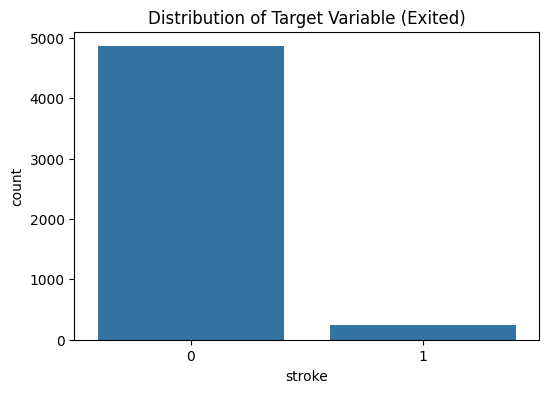

In [118]:
# Visualize the target variable distribution
plt.figure(figsize=(6, 4))
sns.countplot(x='stroke', data=data)
plt.title('Distribution of Target Variable (Exited)')
plt.show()

In [119]:
# Check datatypes
data.dtypes

,0
id,int64
gender,object
age,float64
hypertension,int64
heart_disease,int64
ever_married,object
work_type,object
Residence_type,object
avg_glucose_level,float64
bmi,float64


In [120]:
data['age'].astype(int)

,age
0,67
1,61
2,80
3,49
4,79
5,81
6,74
7,69
8,59
9,78


In [121]:
print(data['ever_married'].value_counts())

ever_married
Yes    3353
No     1757
Name: count, dtype: int64


In [122]:
print(data['work_type'].value_counts())

work_type
Private          2925
Self-employed     819
children          687
Govt_job          657
Never_worked       22
Name: count, dtype: int64


In [123]:
print(data['gender'].value_counts())

gender
Female    2994
Male      2115
Other        1
Name: count, dtype: int64


In [124]:
print(data['Residence_type'].value_counts())

Residence_type
Urban    2596
Rural    2514
Name: count, dtype: int64


In [125]:
print(data['smoking_status'].value_counts())

smoking_status
never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: count, dtype: int64


In [126]:
# Encode categorical variables
categorical_features = ['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']
for feature in categorical_features:
    label_encoder = LabelEncoder()  # Create a new LabelEncoder for each feature
    data[feature] = label_encoder.fit_transform(data[feature])


In [127]:
data.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,1,2,1,228.69,36.600000,1,1
1,51676,0,61.0,0,0,1,3,0,202.21,28.893237,2,1
2,31112,1,80.0,0,1,1,2,0,105.92,32.500000,2,1
3,60182,0,49.0,0,0,1,2,1,171.23,34.400000,3,1
4,1665,0,79.0,1,0,1,3,0,174.12,24.000000,2,1


In [128]:
data.isnull().sum()

,0
id,0
gender,0
age,0
hypertension,0
heart_disease,0
ever_married,0
work_type,0
Residence_type,0
avg_glucose_level,0
bmi,0


#4.Exploratory Data Analysis

##Correlation matrix

In [129]:
# Correlation matrix
print("\nCorrelation matrix:")
data.corr()


Correlation matrix:


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
id,1.000000,0.002511,0.003538,0.003550,-0.001296,0.013690,-0.015757,-0.001403,0.001092,0.002999,0.014074,0.006388
gender,0.002511,1.000000,-0.028202,0.020994,0.085447,-0.031005,0.056422,-0.006738,0.055180,-0.026109,-0.062581,0.008929
age,0.003538,-0.028202,1.000000,0.276398,0.263796,0.679125,-0.361642,0.014180,0.238171,0.325942,0.265199,0.245257
hypertension,0.003550,0.020994,0.276398,1.000000,0.108306,0.164243,-0.051761,-0.007913,0.174474,0.160189,0.111038,0.127904
heart_disease,-0.001296,0.085447,0.263796,0.108306,1.000000,0.114644,-0.028023,0.003092,0.161857,0.038899,0.048460,0.134914
ever_married,0.013690,-0.031005,0.679125,0.164243,0.114644,1.000000,-0.352722,0.006261,0.155068,0.335705,0.259647,0.108340
work_type,-0.015757,0.056422,-0.361642,-0.051761,-0.028023,-0.352722,1.000000,-0.007316,-0.050513,-0.299448,-0.305927,-0.032316
Residence_type,-0.001403,-0.006738,0.014180,-0.007913,0.003092,0.006261,-0.007316,1.000000,-0.004946,-0.000120,0.008237,0.015458
avg_glucose_level,0.001092,0.055180,0.238171,0.174474,0.161857,0.155068,-0.050513,-0.004946,1.000000,0.168751,0.063437,0.131945
bmi,0.002999,-0.026109,0.325942,0.160189,0.038899,0.335705,-0.299448,-0.000120,0.168751,1.000000,0.219148,0.038947


In [130]:
# Drop id column
data = data.drop(columns='id')

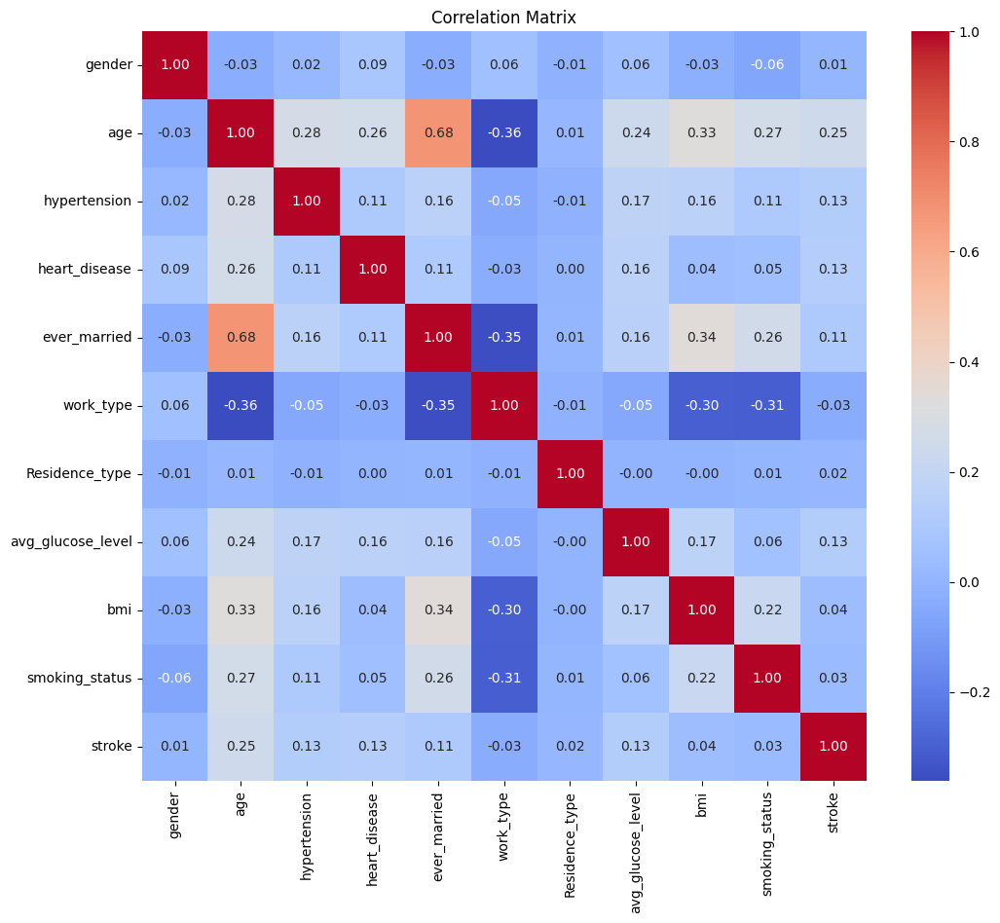

In [131]:
# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

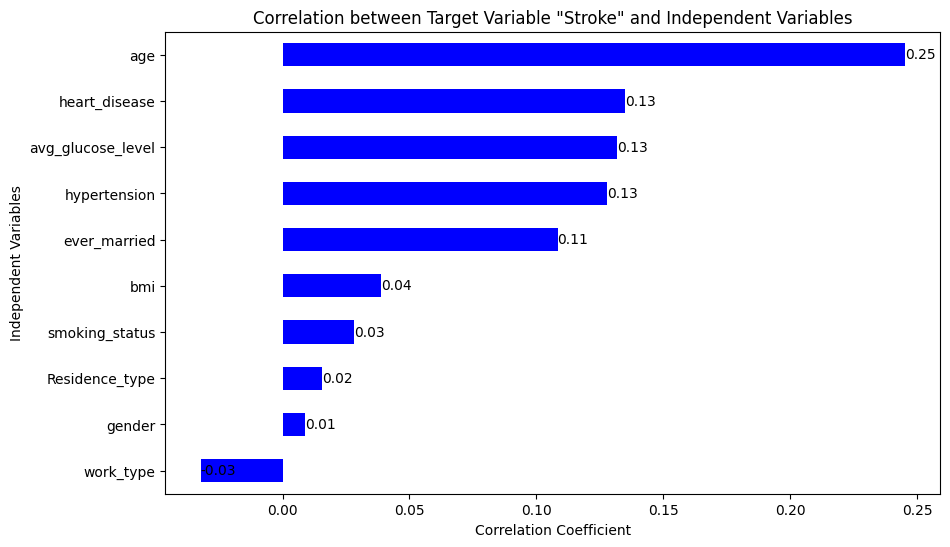

In [132]:
# Calculate correlation of the 'stroke' column with other variables
correlation = data.corr()['stroke'].drop('stroke')  # Drop 'stroke' itself

# Plotting the horizontal bar chart
plt.figure(figsize=(10, 6))
ax = correlation.sort_values().plot(kind='barh', color='blue')
plt.title('Correlation between Target Variable "Stroke" and Independent Variables')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Independent Variables')

# Adding correlation values at the end of each bar
for index, value in enumerate(correlation.sort_values()):
    ax.text(value, index, f'{value:.2f}', va='center', ha='left', color='black')

plt.show()

##Distribution of numerical features

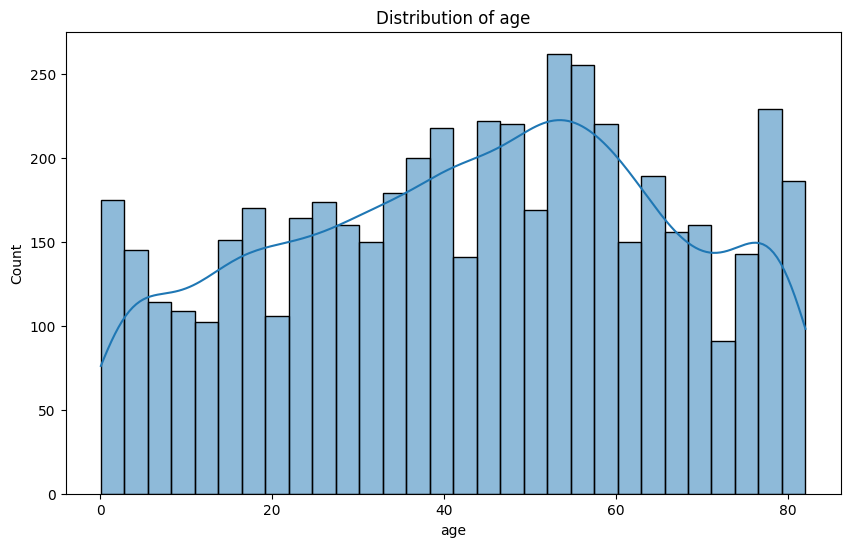

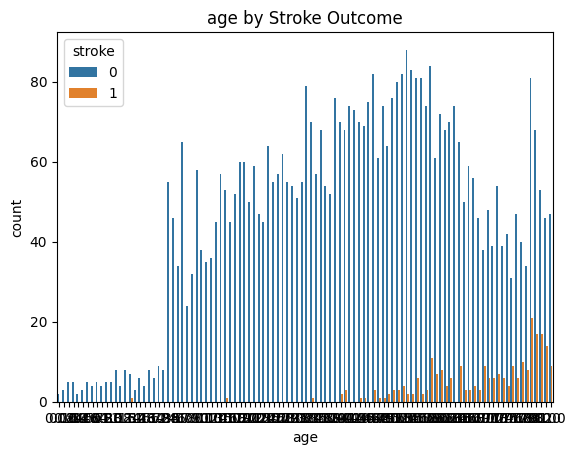

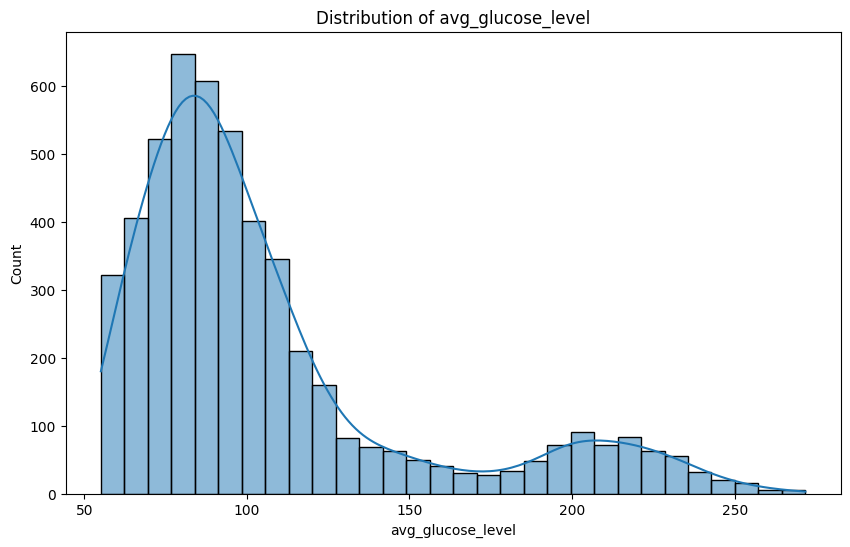

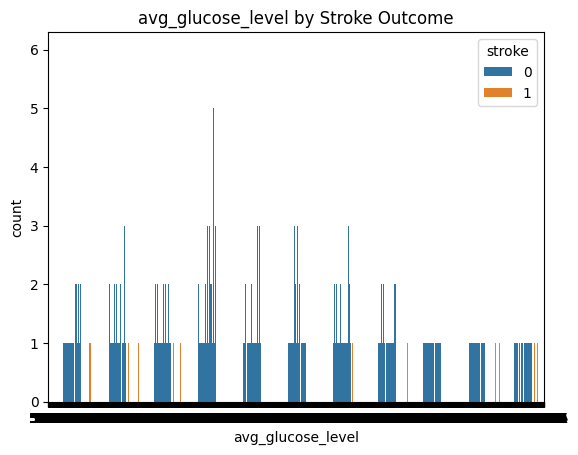

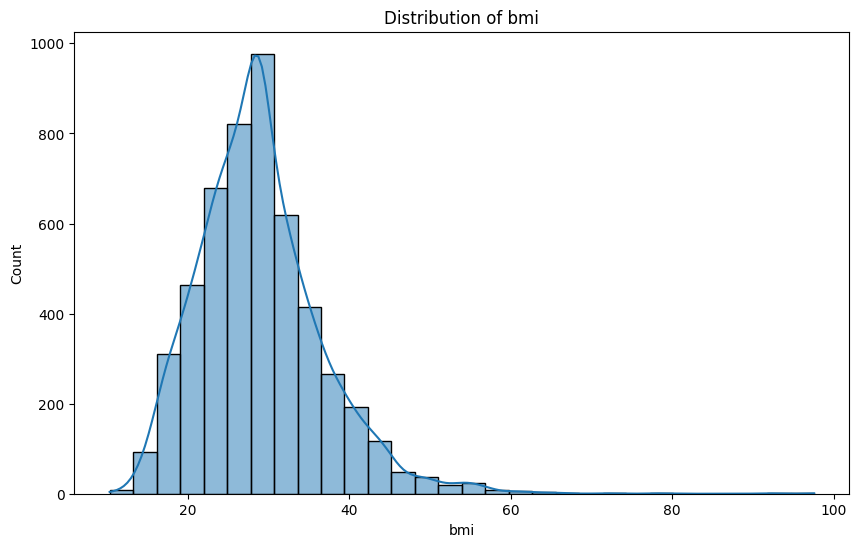

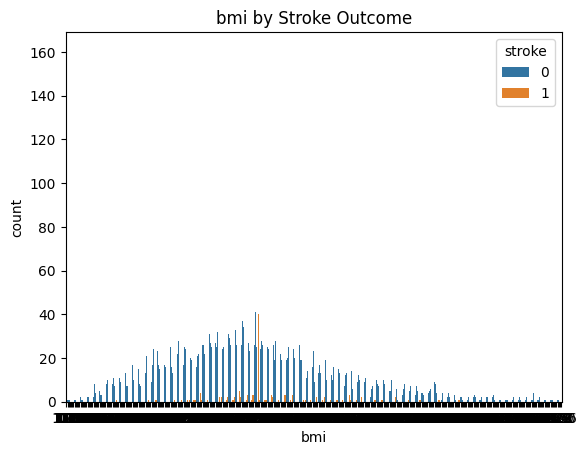

In [133]:
# Distribution of numerical features
numerical_features = ['age', 'avg_glucose_level', 'bmi']
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[feature], kde=True, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.show()
    sns.countplot(x=feature, hue='stroke', data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()

##Box plots of numerical features by stroke outcome

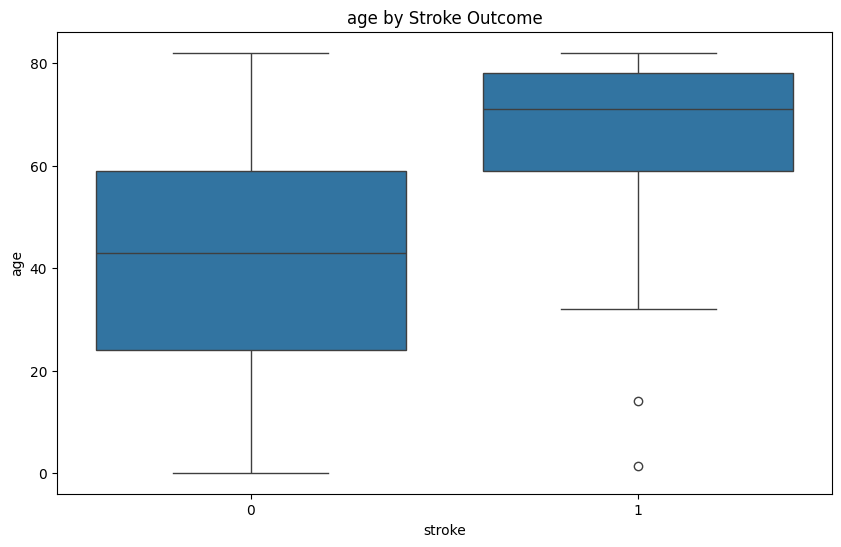

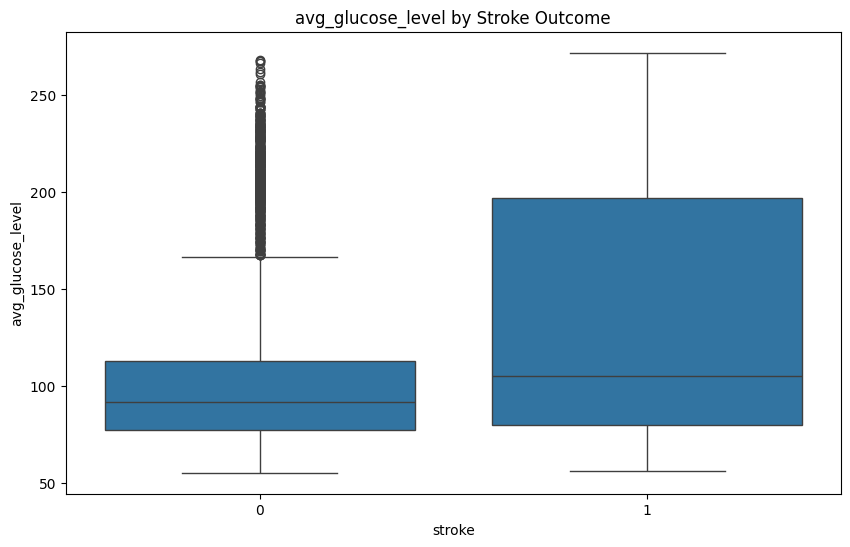

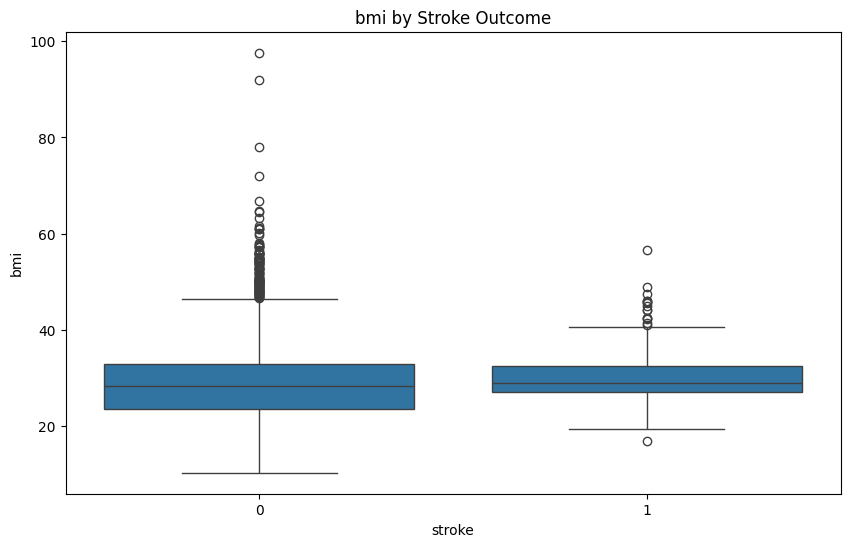

In [134]:
# Box plots of numerical features by stroke outcome
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='stroke', y=feature, data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()

##Count plots of categorical features

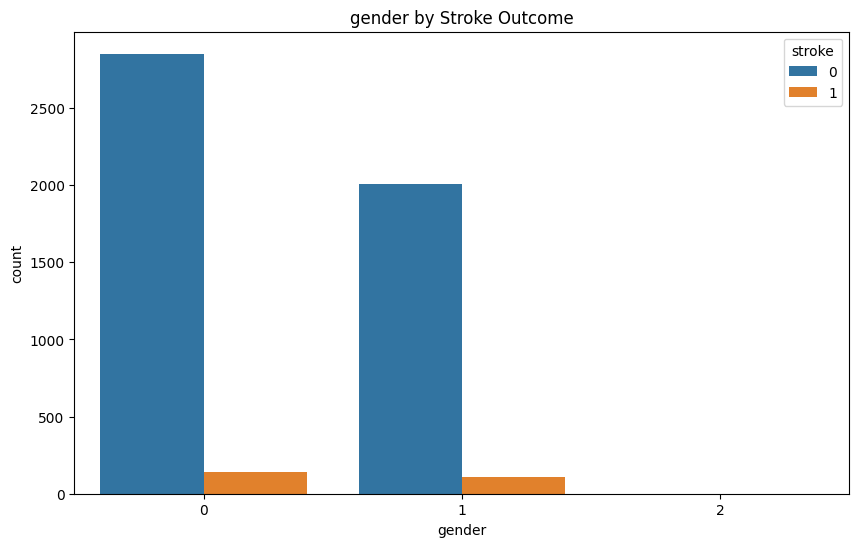

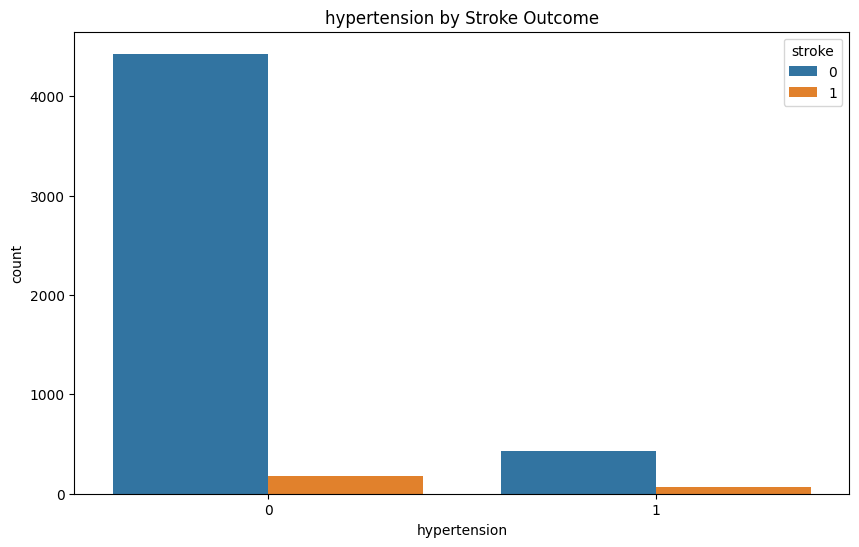

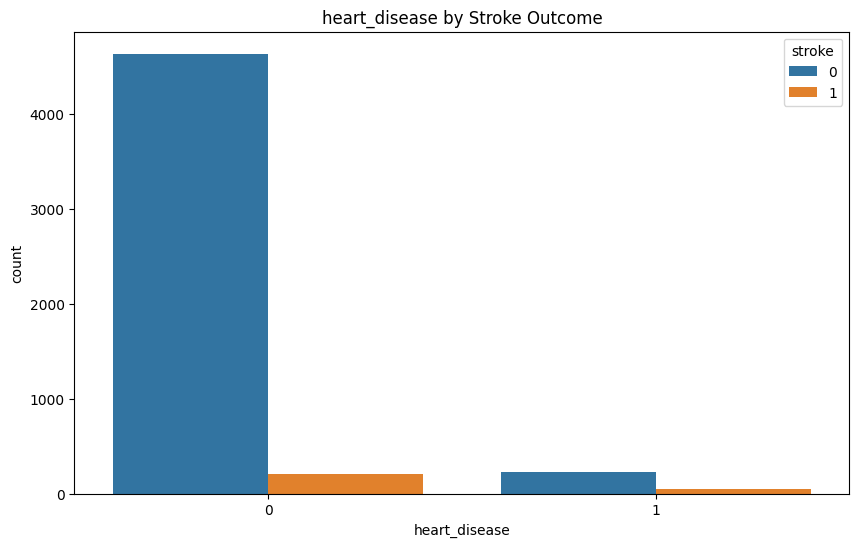

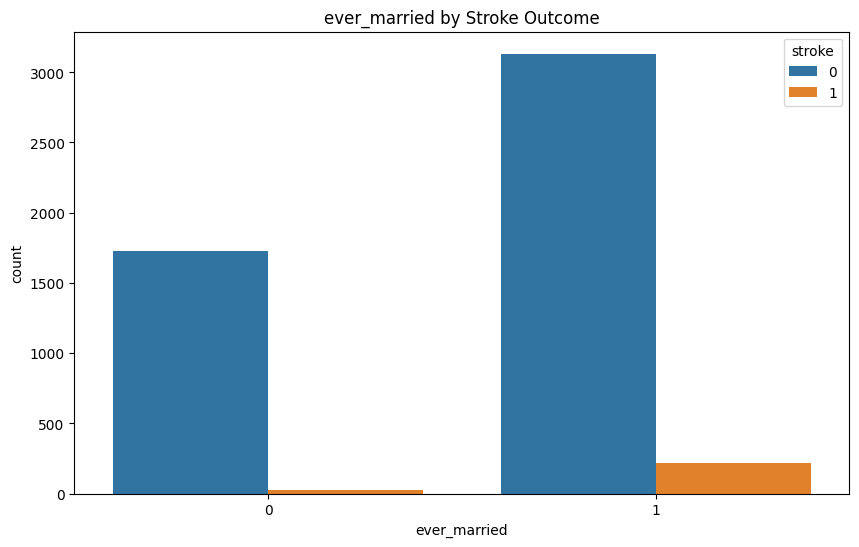

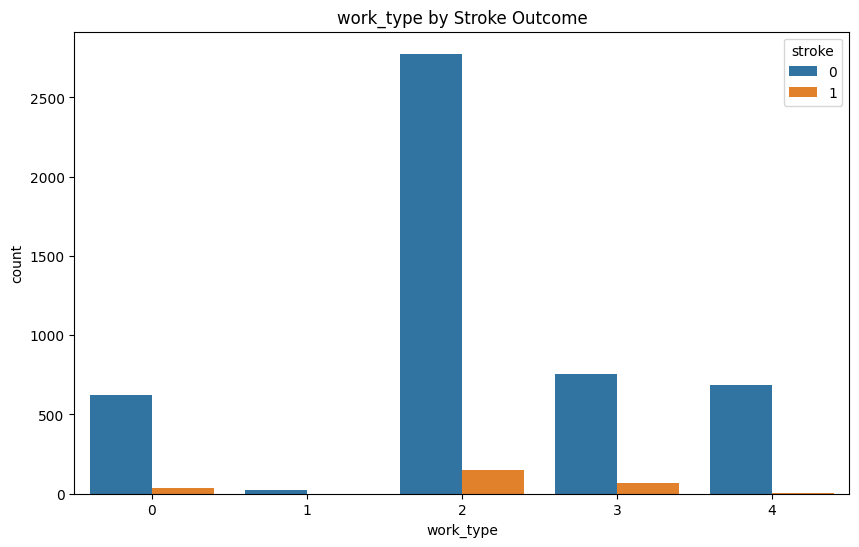

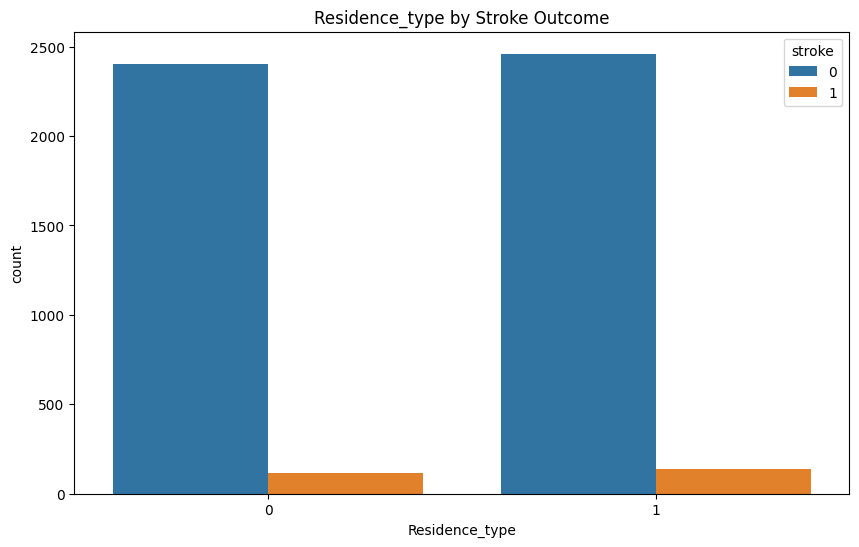

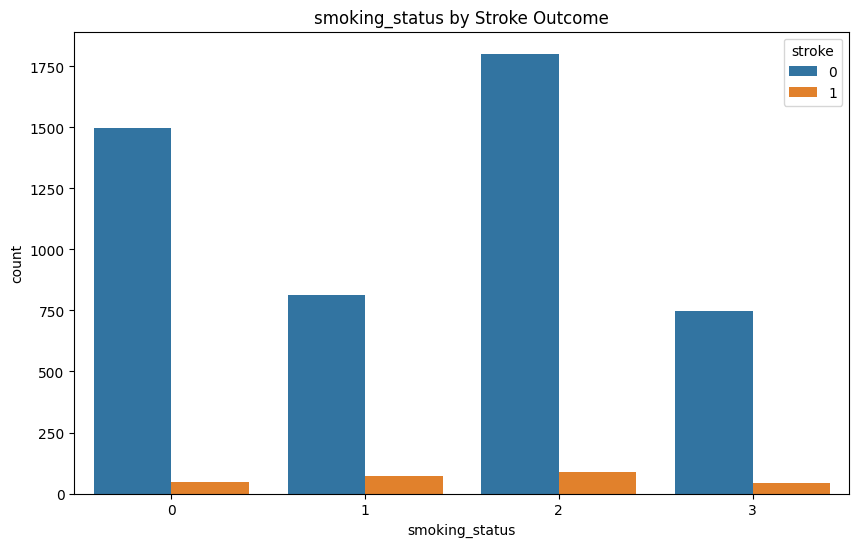

In [135]:
# Count plots of categorical features
categorical_features = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=feature, hue='stroke', data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()


#6.Training the model

In [136]:
# Split the data into features and target variable
X = data.drop(['stroke'], axis=1)
y = data['stroke']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#7.Evaluating the model



###Imbalanced Data

In [146]:
!pip install catboost

In [138]:
from openpyxl import Workbook
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

In [139]:
# Store evaluation results and predictions
evaluation_results = []
predictions_dict = {'y_test': y_test.tolist()}  # Store actual values

# Function to evaluate the model
def evaluate_model(y_test, y_pred, y_pred_proba, model_name, method_name):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)

    # Store evaluation metrics
    evaluation_results.append({
        'Model': model_name,
        'Method': method_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC-AUC': roc_auc
    })

    # Print metrics
    print(f"\n{model_name} with {method_name} Evaluation Metrics:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"ROC-AUC Score: {roc_auc:.4f}")

    # Classification report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    print("\nConfusion Matrix:")
    print(cm)

    # Plot Confusion Matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No-stroke', 'Stroke'], yticklabels=['No-stroke', 'Stroke'])
    plt.title(f'Confusion Matrix: {model_name} - {method_name}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    # ROC Curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve: {model_name} - {method_name}')
    plt.legend(loc='lower right')
    plt.grid(alpha=0.3)
    plt.show()


# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [140]:
# Define models
models = {
    "Random Forest": RandomForestClassifier(class_weight='balanced', random_state=42),
    "XGBoost": XGBClassifier(
        scale_pos_weight=len(y_train[y_train == 0]) / len(y_train[y_train == 1]),
        random_state=42, use_label_encoder=False, eval_metric='logloss'
    ),
    "LightGBM": LGBMClassifier(class_weight='balanced', random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
    "Logistic Regression": LogisticRegression(class_weight='balanced', random_state=42),
    "SVM": SVC(class_weight='balanced', probability=True, random_state=42),
    "Decision Tree": DecisionTreeClassifier(class_weight='balanced', random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "K-Nearest Neighbors (KNN)": KNeighborsClassifier(),
    "Gaussian Naive Bayes": GaussianNB(),
    "Linear Discriminant Analysis (LDA)": LinearDiscriminantAnalysis(),
    "Quadratic Discriminant Analysis (QDA)": QuadraticDiscriminantAnalysis(),
    "AdaBoost": AdaBoostClassifier(random_state=42),
}

###Data Balancing Techniques

In [141]:
# Define resampling methods
methods = {
    'None': None,  # No resampling for imbalanced data
    'SMOTE': SMOTE( random_state= 42),
    'ClusterCentroids': ClusterCentroids(random_state=42),
    'Random Undersampling': RandomUnderSampler( random_state= 42),
    'NearMiss-1': NearMiss(version=1),
    'NearMiss-2': NearMiss(version=2),
    'NearMiss-3': NearMiss(version=3),
    'Tomek Links': TomekLinks(),
    'Edited Nearest Neighbors (ENN)': EditedNearestNeighbours(),
    'Repeated Edited Nearest Neighbors (RENN)': RepeatedEditedNearestNeighbours(),
    'All KNN': AllKNN(),
    'Condensed Nearest Neighbor (CNN)': CondensedNearestNeighbour(),
    'One-Sided Selection (OSS)': OneSidedSelection(),
    'Neighborhood Cleaning Rule (NCR)': NeighbourhoodCleaningRule(),
    'Instance Hardness Threshold': InstanceHardnessThreshold()
}


==================== Random Forest with None ====================

Random Forest with None Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8101

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


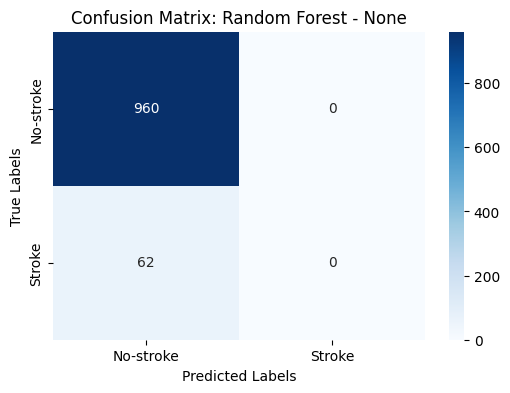

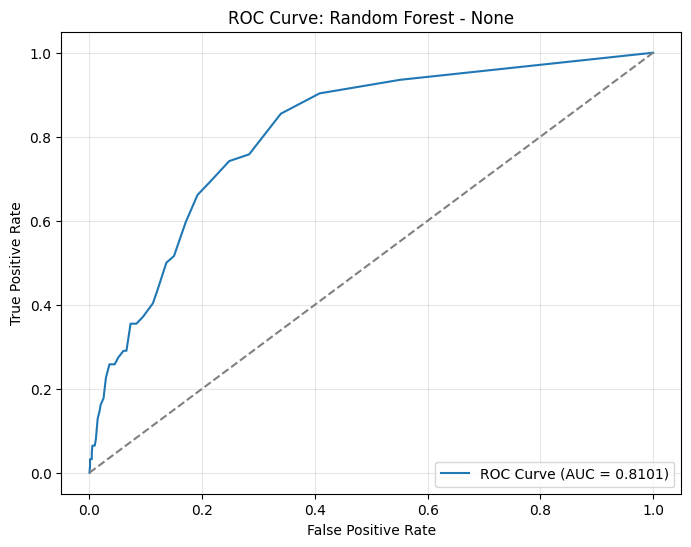


==================== Random Forest with SMOTE ====================

Random Forest with SMOTE Evaluation Metrics:
Accuracy: 0.9012
Precision: 0.1695
Recall: 0.1613
F1 Score: 0.1653
ROC-AUC Score: 0.7838

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       960
           1       0.17      0.16      0.17        62

    accuracy                           0.90      1022
   macro avg       0.56      0.56      0.56      1022
weighted avg       0.90      0.90      0.90      1022


Confusion Matrix:
[[911  49]
 [ 52  10]]


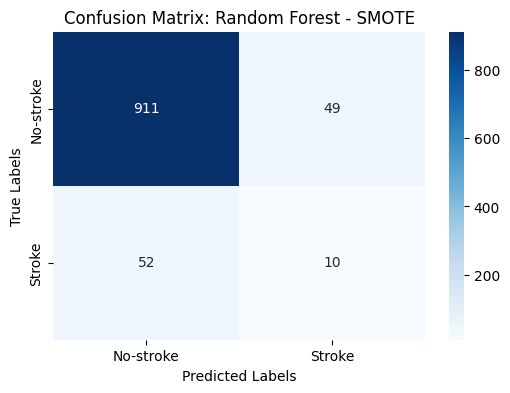

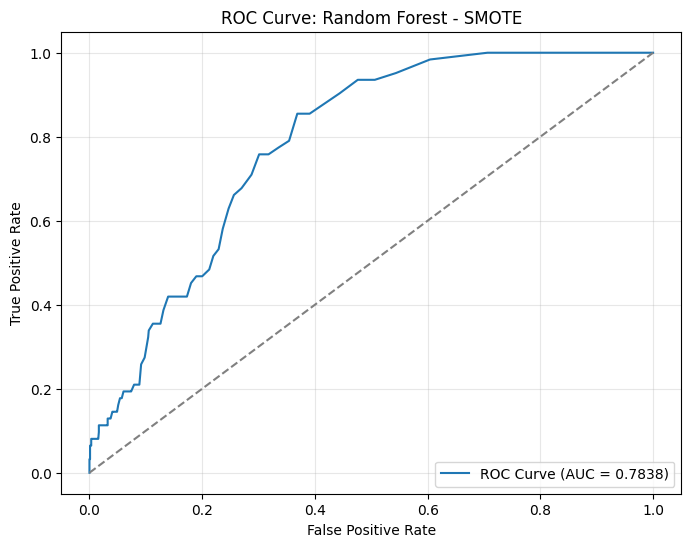


==================== Random Forest with ClusterCentroids ====================

Random Forest with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2348
Precision: 0.0735
Recall: 1.0000
F1 Score: 0.1369
ROC-AUC Score: 0.7302

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.19      0.31       960
           1       0.07      1.00      0.14        62

    accuracy                           0.23      1022
   macro avg       0.54      0.59      0.22      1022
weighted avg       0.94      0.23      0.30      1022


Confusion Matrix:
[[178 782]
 [  0  62]]


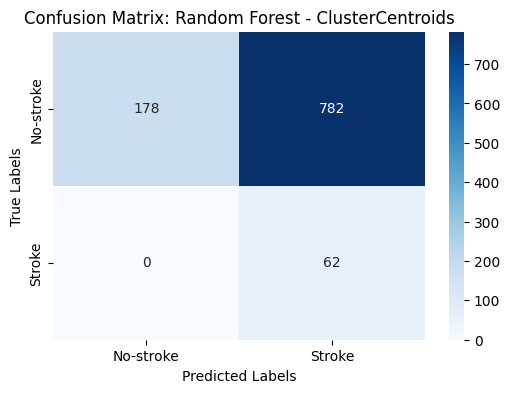

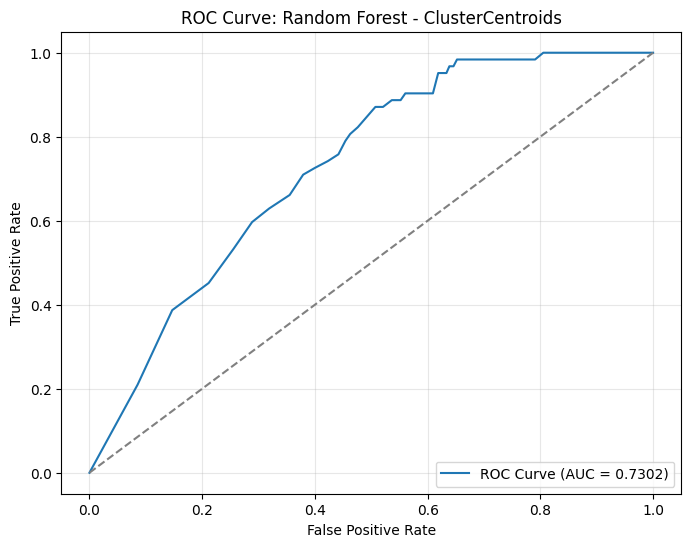


==================== Random Forest with Random Undersampling ====================

Random Forest with Random Undersampling Evaluation Metrics:
Accuracy: 0.7309
Precision: 0.1640
Recall: 0.8387
F1 Score: 0.2744
ROC-AUC Score: 0.8289

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.72      0.83       960
           1       0.16      0.84      0.27        62

    accuracy                           0.73      1022
   macro avg       0.57      0.78      0.55      1022
weighted avg       0.94      0.73      0.80      1022


Confusion Matrix:
[[695 265]
 [ 10  52]]


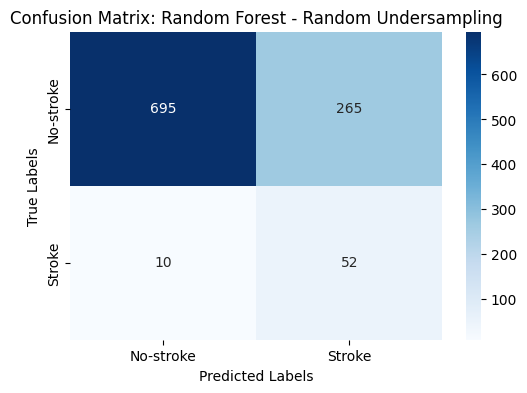

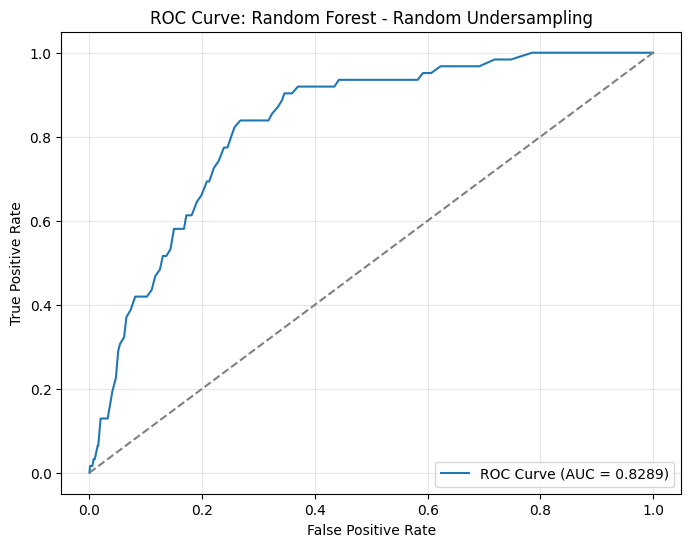


==================== Random Forest with NearMiss-1 ====================

Random Forest with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1898
Precision: 0.0451
Recall: 0.6129
F1 Score: 0.0841
ROC-AUC Score: 0.3356

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.16      0.27       960
           1       0.05      0.61      0.08        62

    accuracy                           0.19      1022
   macro avg       0.46      0.39      0.18      1022
weighted avg       0.82      0.19      0.26      1022


Confusion Matrix:
[[156 804]
 [ 24  38]]


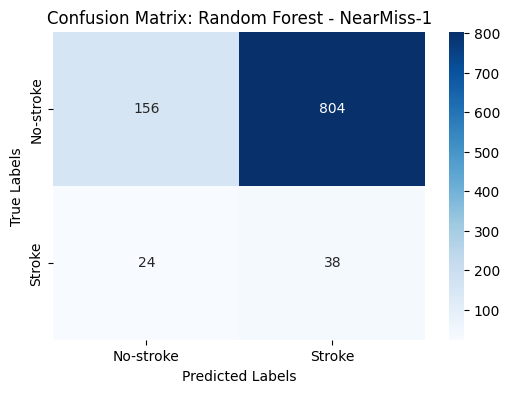

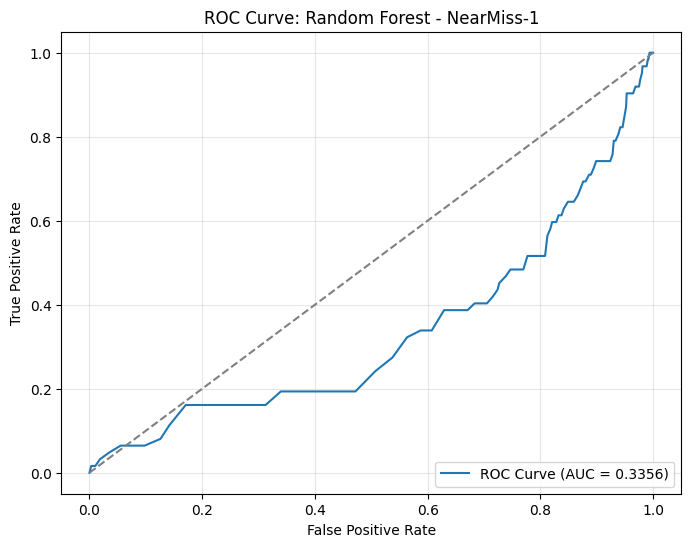


==================== Random Forest with NearMiss-2 ====================

Random Forest with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1194
Precision: 0.0626
Recall: 0.9677
F1 Score: 0.1176
ROC-AUC Score: 0.6799

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.06      0.12       960
           1       0.06      0.97      0.12        62

    accuracy                           0.12      1022
   macro avg       0.52      0.52      0.12      1022
weighted avg       0.91      0.12      0.12      1022


Confusion Matrix:
[[ 62 898]
 [  2  60]]


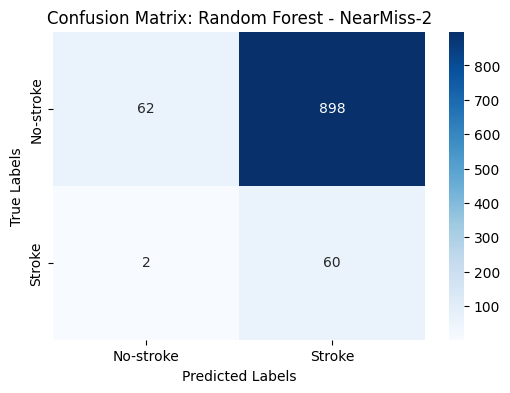

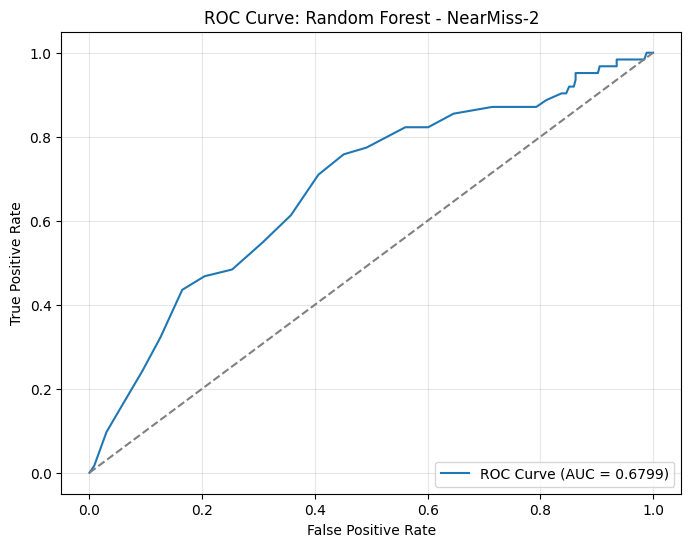


==================== Random Forest with NearMiss-3 ====================

Random Forest with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6742
Precision: 0.1072
Recall: 0.5968
F1 Score: 0.1818
ROC-AUC Score: 0.6652

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.68      0.80       960
           1       0.11      0.60      0.18        62

    accuracy                           0.67      1022
   macro avg       0.54      0.64      0.49      1022
weighted avg       0.91      0.67      0.76      1022


Confusion Matrix:
[[652 308]
 [ 25  37]]


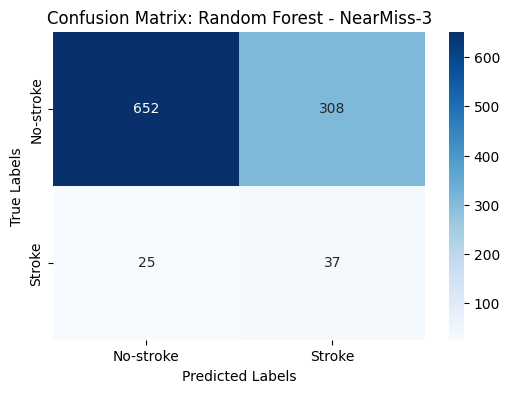

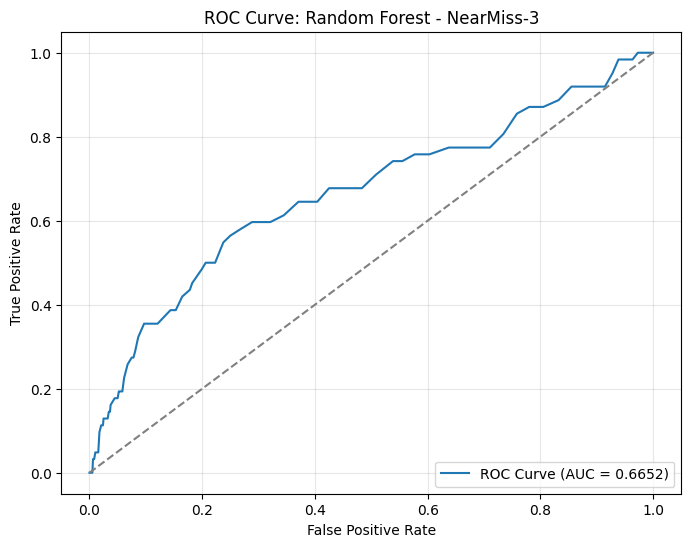


==================== Random Forest with Tomek Links ====================

Random Forest with Tomek Links Evaluation Metrics:
Accuracy: 0.9403
Precision: 1.0000
Recall: 0.0161
F1 Score: 0.0317
ROC-AUC Score: 0.8184

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 61   1]]


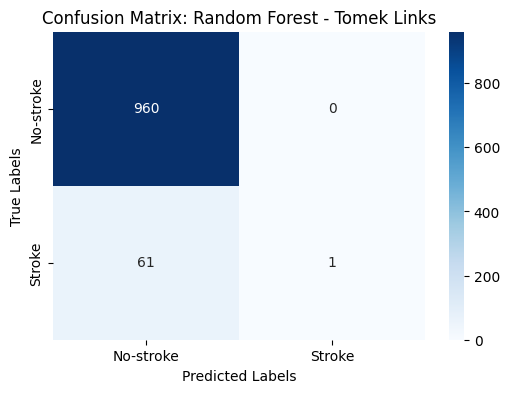

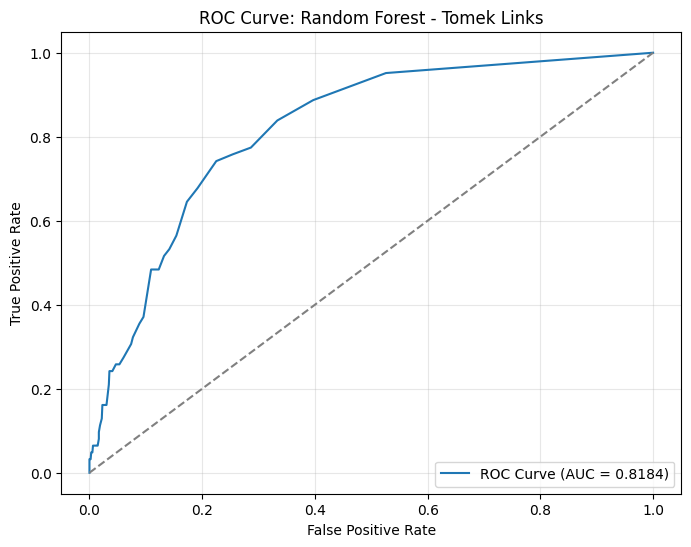


==================== Random Forest with Edited Nearest Neighbors (ENN) ====================

Random Forest with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9423
Precision: 0.8000
Recall: 0.0645
F1 Score: 0.1194
ROC-AUC Score: 0.8358

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.80      0.06      0.12        62

    accuracy                           0.94      1022
   macro avg       0.87      0.53      0.54      1022
weighted avg       0.93      0.94      0.92      1022


Confusion Matrix:
[[959   1]
 [ 58   4]]


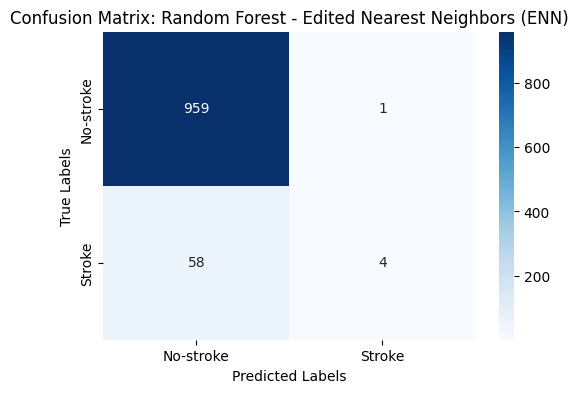

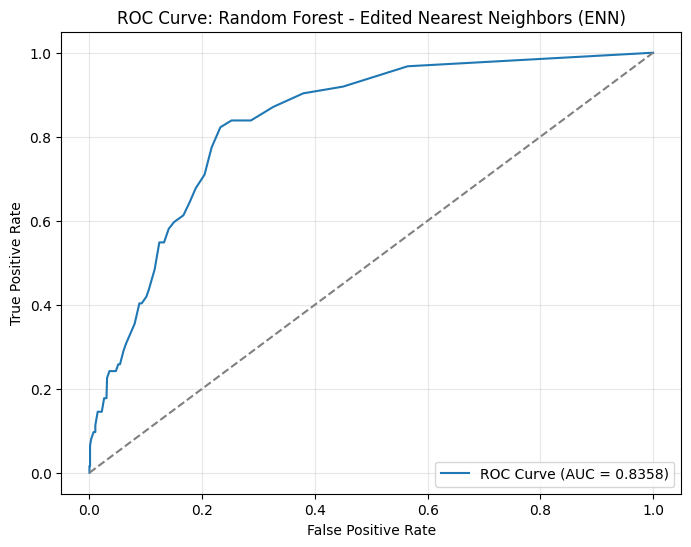


==================== Random Forest with Repeated Edited Nearest Neighbors (RENN) ====================

Random Forest with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9256
Precision: 0.2941
Recall: 0.1613
F1 Score: 0.2083
ROC-AUC Score: 0.8150

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.29      0.16      0.21        62

    accuracy                           0.93      1022
   macro avg       0.62      0.57      0.58      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[936  24]
 [ 52  10]]


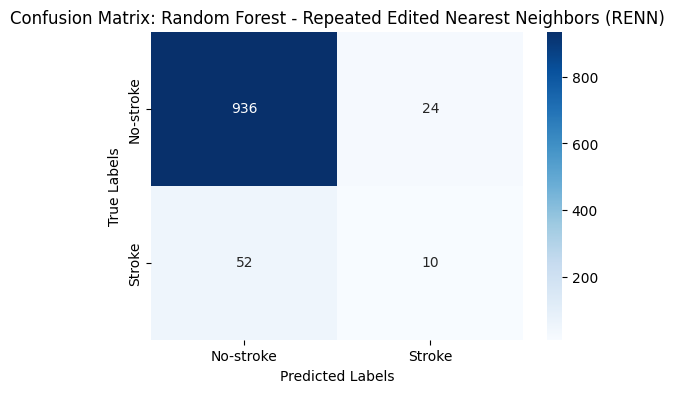

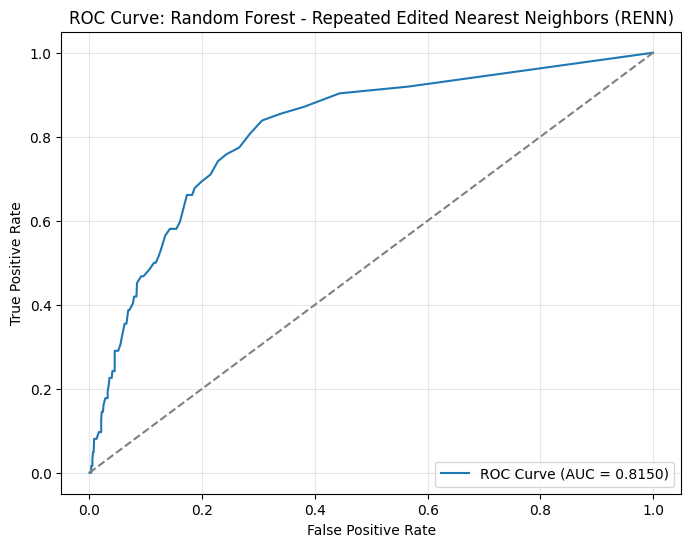


==================== Random Forest with All KNN ====================

Random Forest with All KNN Evaluation Metrics:
Accuracy: 0.9384
Precision: 0.4706
Recall: 0.1290
F1 Score: 0.2025
ROC-AUC Score: 0.8284

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       960
           1       0.47      0.13      0.20        62

    accuracy                           0.94      1022
   macro avg       0.71      0.56      0.59      1022
weighted avg       0.92      0.94      0.92      1022


Confusion Matrix:
[[951   9]
 [ 54   8]]


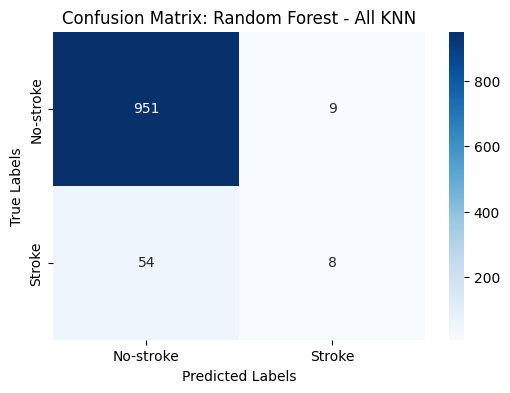

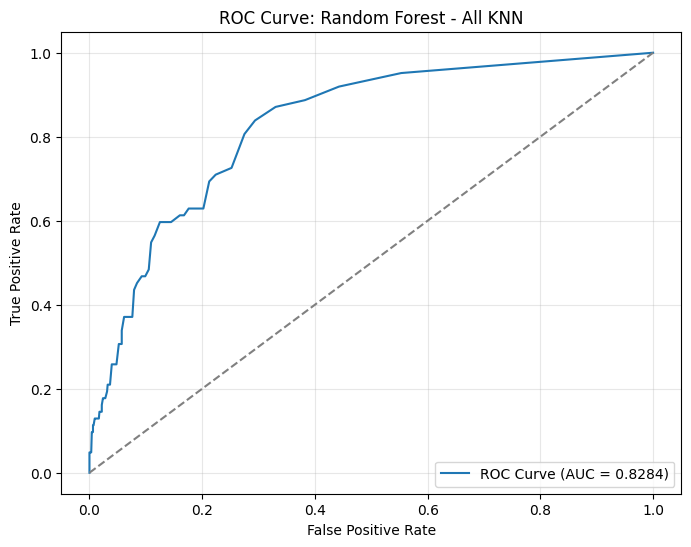


==================== Random Forest with Condensed Nearest Neighbor (CNN) ====================

Random Forest with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9374
Precision: 0.4000
Recall: 0.0645
F1 Score: 0.1111
ROC-AUC Score: 0.7298

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.40      0.06      0.11        62

    accuracy                           0.94      1022
   macro avg       0.67      0.53      0.54      1022
weighted avg       0.91      0.94      0.92      1022


Confusion Matrix:
[[954   6]
 [ 58   4]]


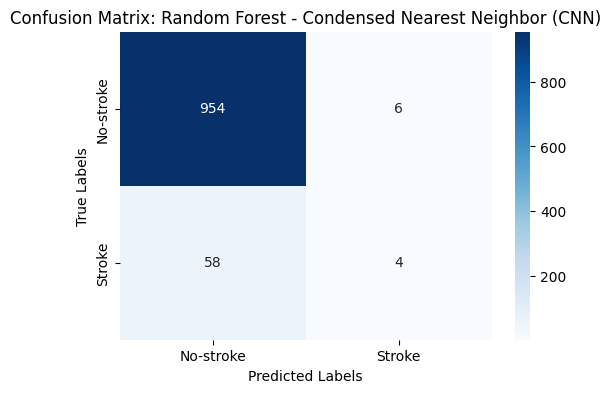

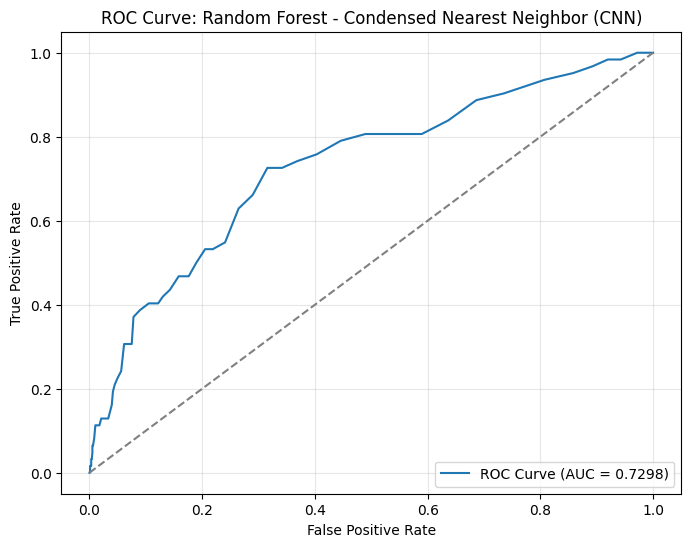


==================== Random Forest with One-Sided Selection (OSS) ====================

Random Forest with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9403
Precision: 1.0000
Recall: 0.0161
F1 Score: 0.0317
ROC-AUC Score: 0.8070

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 61   1]]


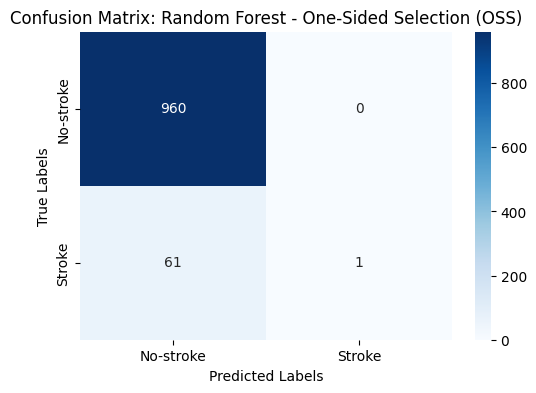

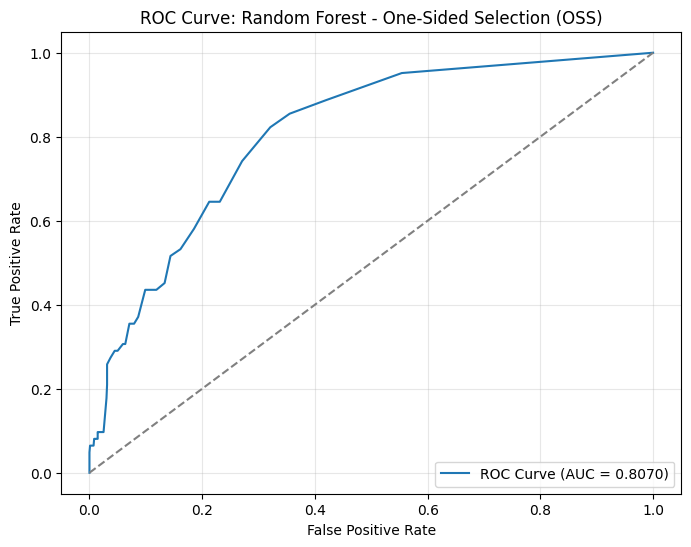


==================== Random Forest with Neighborhood Cleaning Rule (NCR) ====================

Random Forest with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9384
Precision: 0.4000
Recall: 0.0323
F1 Score: 0.0597
ROC-AUC Score: 0.8234

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.40      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.67      0.51      0.51      1022
weighted avg       0.91      0.94      0.91      1022


Confusion Matrix:
[[957   3]
 [ 60   2]]


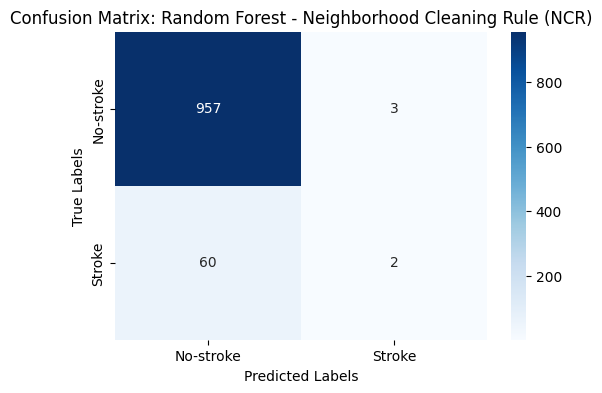

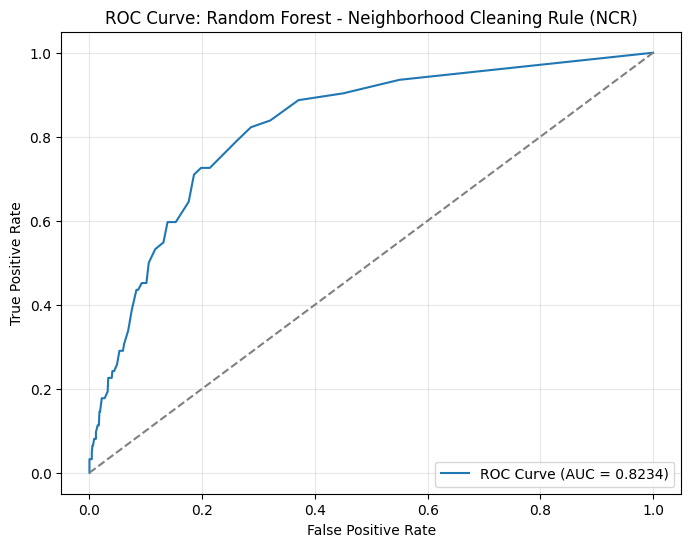


==================== Random Forest with Instance Hardness Threshold ====================

Random Forest with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7877
Precision: 0.1862
Recall: 0.7419
F1 Score: 0.2977
ROC-AUC Score: 0.8328

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.79      0.87       960
           1       0.19      0.74      0.30        62

    accuracy                           0.79      1022
   macro avg       0.58      0.77      0.59      1022
weighted avg       0.93      0.79      0.84      1022


Confusion Matrix:
[[759 201]
 [ 16  46]]


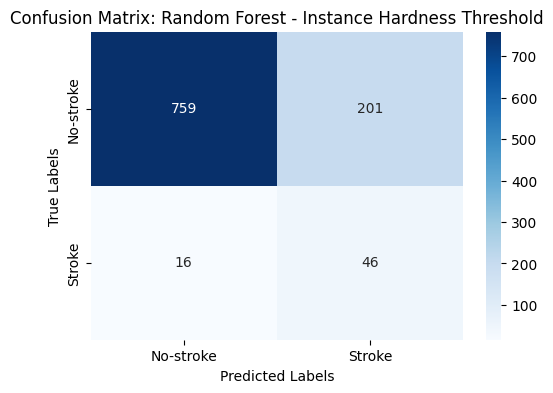

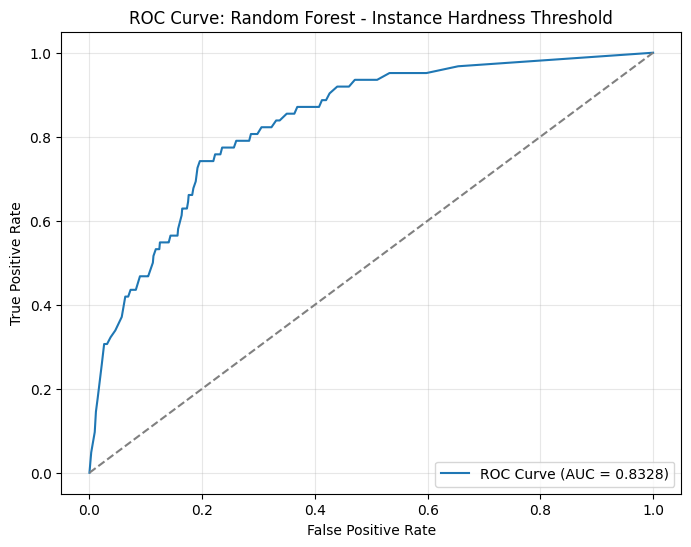


==================== XGBoost with None ====================

XGBoost with None Evaluation Metrics:
Accuracy: 0.9207
Precision: 0.2564
Recall: 0.1613
F1 Score: 0.1980
ROC-AUC Score: 0.7734

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.26      0.16      0.20        62

    accuracy                           0.92      1022
   macro avg       0.60      0.57      0.58      1022
weighted avg       0.91      0.92      0.91      1022


Confusion Matrix:
[[931  29]
 [ 52  10]]


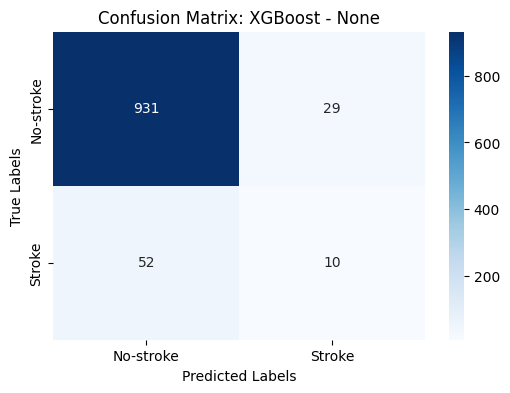

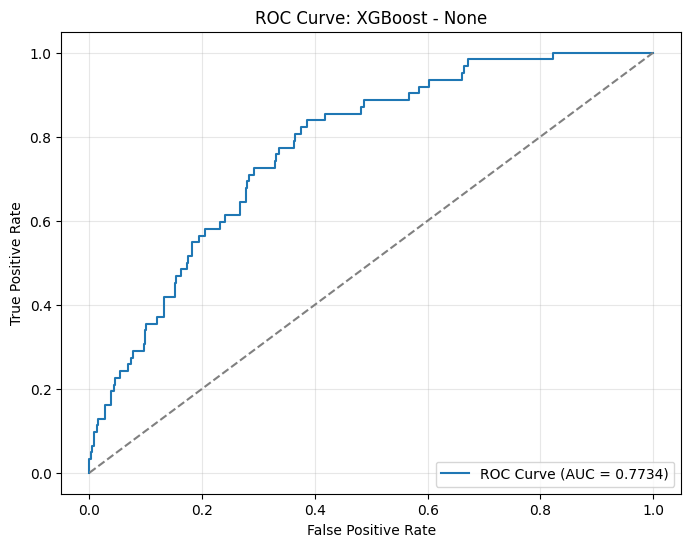


==================== XGBoost with SMOTE ====================

XGBoost with SMOTE Evaluation Metrics:
Accuracy: 0.8386
Precision: 0.1128
Recall: 0.2419
F1 Score: 0.1538
ROC-AUC Score: 0.7349

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91       960
           1       0.11      0.24      0.15        62

    accuracy                           0.84      1022
   macro avg       0.53      0.56      0.53      1022
weighted avg       0.90      0.84      0.86      1022


Confusion Matrix:
[[842 118]
 [ 47  15]]


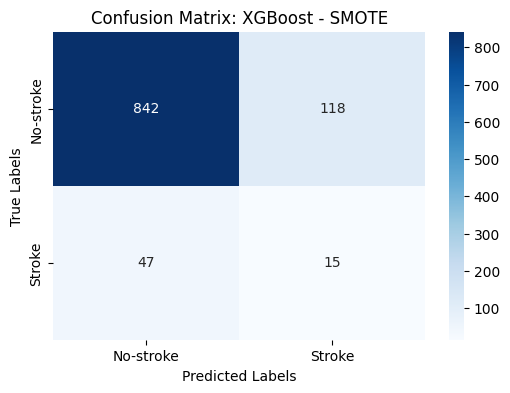

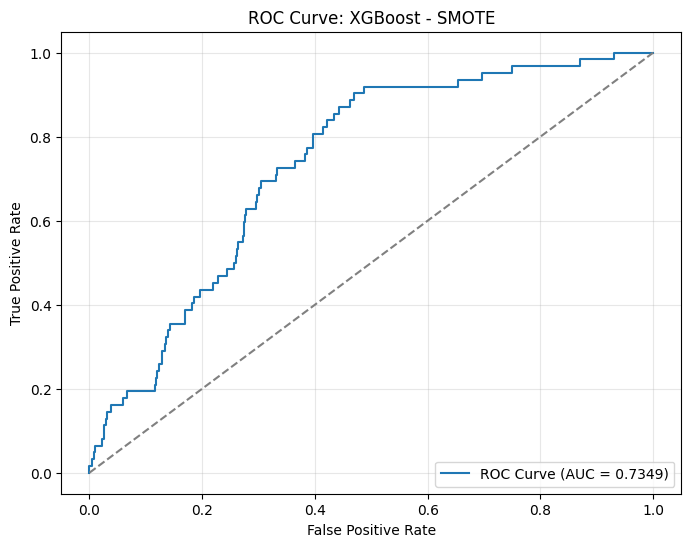


==================== XGBoost with ClusterCentroids ====================

XGBoost with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2769
Precision: 0.0774
Recall: 1.0000
F1 Score: 0.1437
ROC-AUC Score: 0.7290

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.23      0.37       960
           1       0.08      1.00      0.14        62

    accuracy                           0.28      1022
   macro avg       0.54      0.62      0.26      1022
weighted avg       0.94      0.28      0.36      1022


Confusion Matrix:
[[221 739]
 [  0  62]]


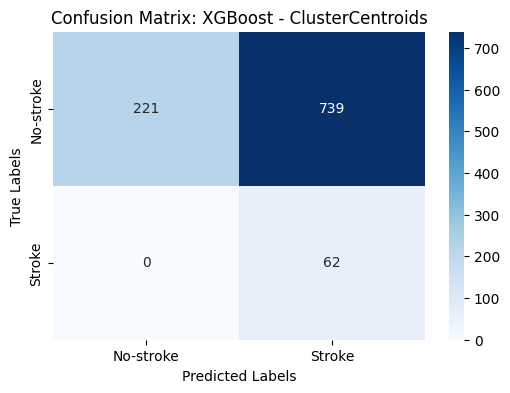

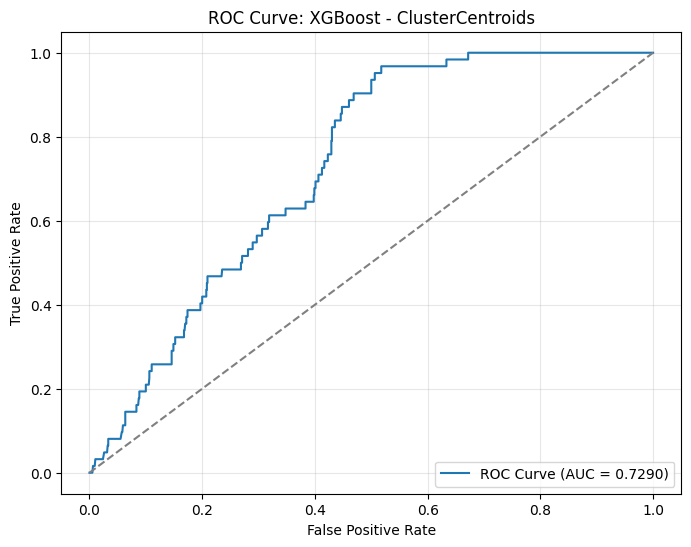


==================== XGBoost with Random Undersampling ====================

XGBoost with Random Undersampling Evaluation Metrics:
Accuracy: 0.6360
Precision: 0.1238
Recall: 0.8226
F1 Score: 0.2152
ROC-AUC Score: 0.8058

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.62      0.76       960
           1       0.12      0.82      0.22        62

    accuracy                           0.64      1022
   macro avg       0.55      0.72      0.49      1022
weighted avg       0.93      0.64      0.73      1022


Confusion Matrix:
[[599 361]
 [ 11  51]]


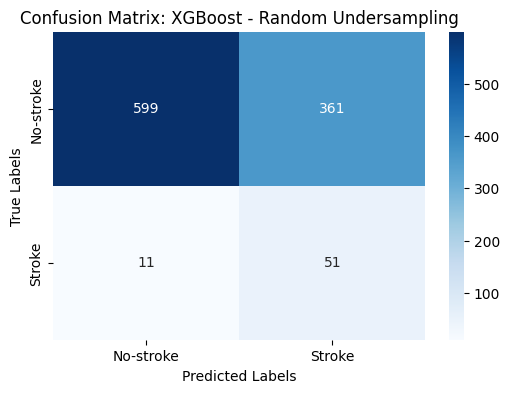

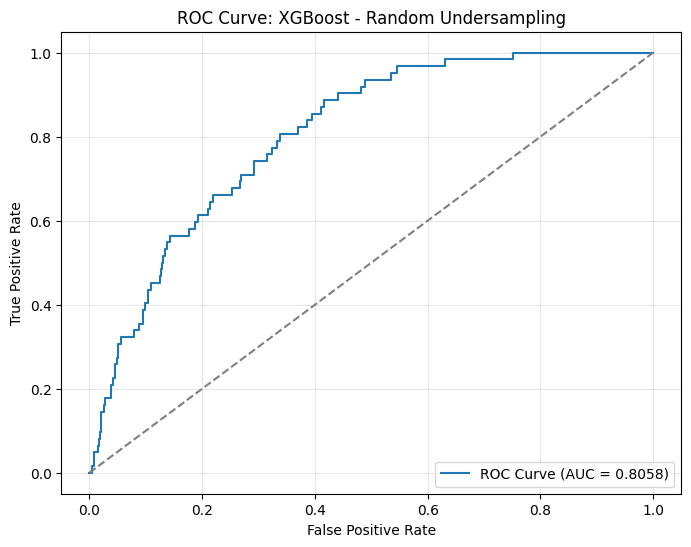


==================== XGBoost with NearMiss-1 ====================

XGBoost with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1399
Precision: 0.0545
Recall: 0.8065
F1 Score: 0.1021
ROC-AUC Score: 0.3369

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.10      0.17       960
           1       0.05      0.81      0.10        62

    accuracy                           0.14      1022
   macro avg       0.47      0.45      0.14      1022
weighted avg       0.84      0.14      0.17      1022


Confusion Matrix:
[[ 93 867]
 [ 12  50]]


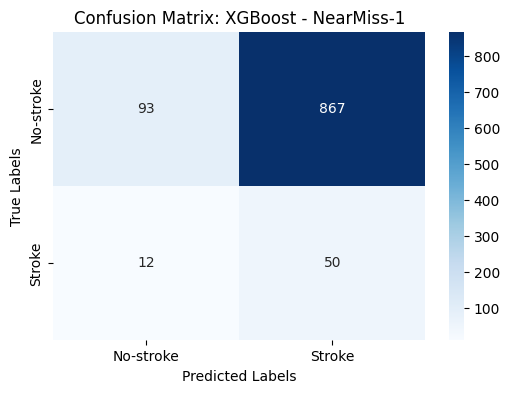

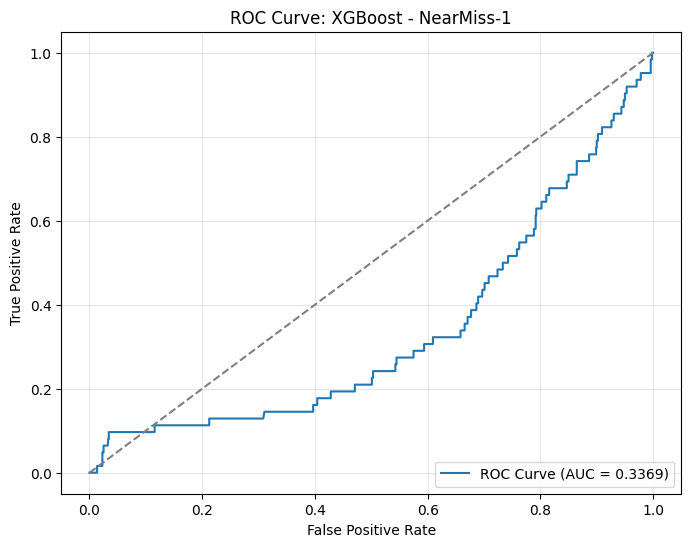


==================== XGBoost with NearMiss-2 ====================

XGBoost with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1125
Precision: 0.0631
Recall: 0.9839
F1 Score: 0.1186
ROC-AUC Score: 0.7701

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.06      0.11       960
           1       0.06      0.98      0.12        62

    accuracy                           0.11      1022
   macro avg       0.52      0.52      0.11      1022
weighted avg       0.93      0.11      0.11      1022


Confusion Matrix:
[[ 54 906]
 [  1  61]]


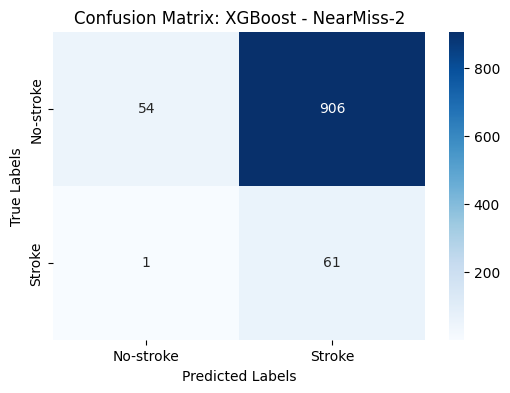

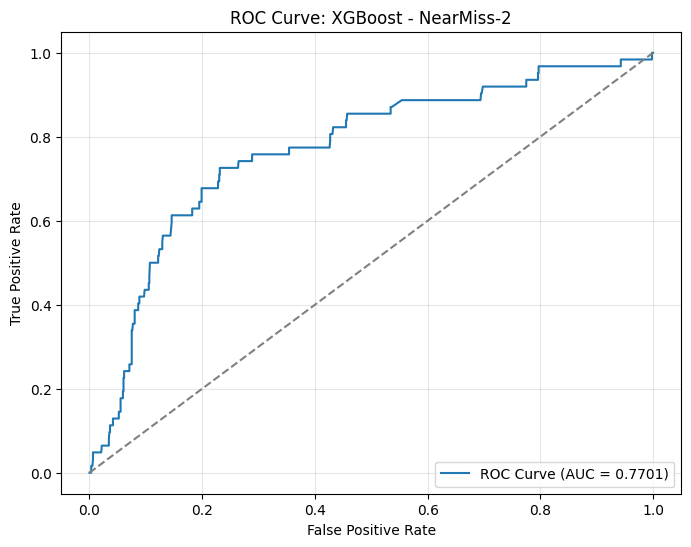


==================== XGBoost with NearMiss-3 ====================

XGBoost with NearMiss-3 Evaluation Metrics:
Accuracy: 0.4237
Precision: 0.0757
Recall: 0.7581
F1 Score: 0.1376
ROC-AUC Score: 0.6566

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.40      0.57       960
           1       0.08      0.76      0.14        62

    accuracy                           0.42      1022
   macro avg       0.52      0.58      0.35      1022
weighted avg       0.91      0.42      0.54      1022


Confusion Matrix:
[[386 574]
 [ 15  47]]


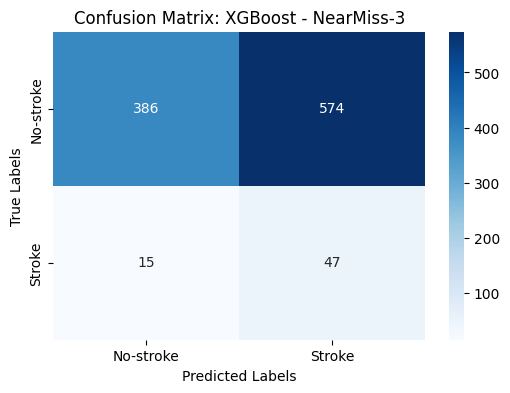

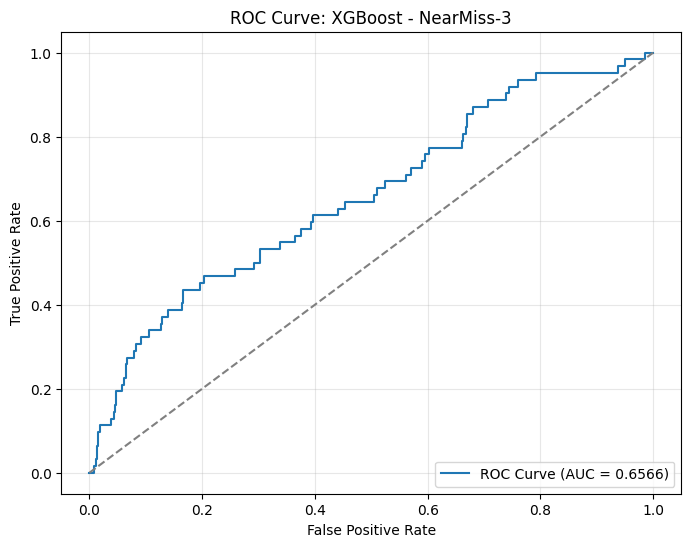


==================== XGBoost with Tomek Links ====================

XGBoost with Tomek Links Evaluation Metrics:
Accuracy: 0.9129
Precision: 0.2245
Recall: 0.1774
F1 Score: 0.1982
ROC-AUC Score: 0.7691

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       960
           1       0.22      0.18      0.20        62

    accuracy                           0.91      1022
   macro avg       0.59      0.57      0.58      1022
weighted avg       0.90      0.91      0.91      1022


Confusion Matrix:
[[922  38]
 [ 51  11]]


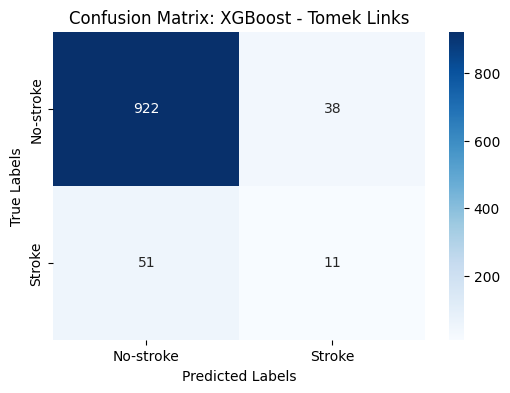

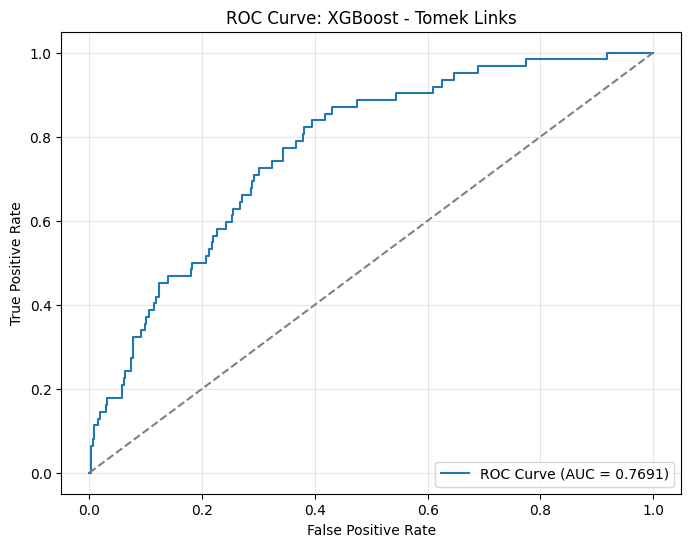


==================== XGBoost with Edited Nearest Neighbors (ENN) ====================

XGBoost with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9041
Precision: 0.2632
Recall: 0.3226
F1 Score: 0.2899
ROC-AUC Score: 0.8087

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       960
           1       0.26      0.32      0.29        62

    accuracy                           0.90      1022
   macro avg       0.61      0.63      0.62      1022
weighted avg       0.91      0.90      0.91      1022


Confusion Matrix:
[[904  56]
 [ 42  20]]


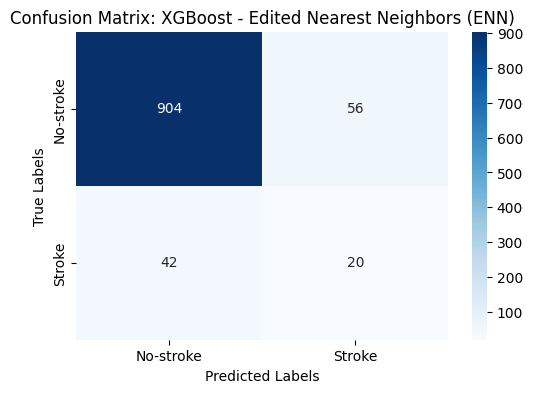

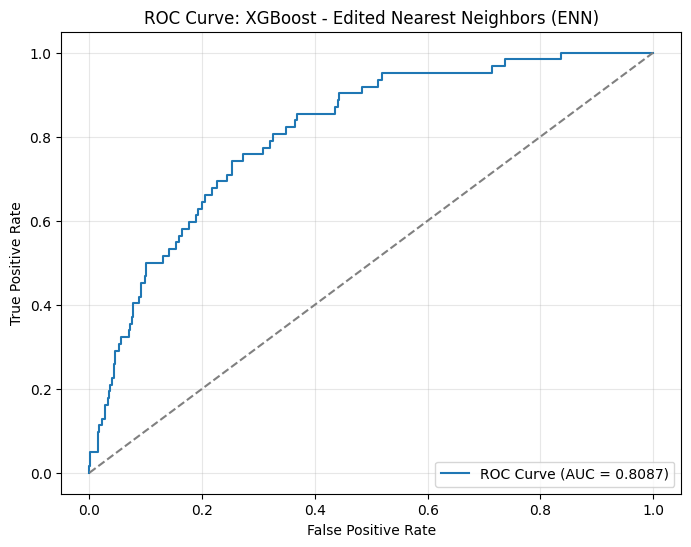


==================== XGBoost with Repeated Edited Nearest Neighbors (RENN) ====================

XGBoost with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8943
Precision: 0.2982
Recall: 0.5484
F1 Score: 0.3864
ROC-AUC Score: 0.8240

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.92      0.94       960
           1       0.30      0.55      0.39        62

    accuracy                           0.89      1022
   macro avg       0.63      0.73      0.66      1022
weighted avg       0.93      0.89      0.91      1022


Confusion Matrix:
[[880  80]
 [ 28  34]]


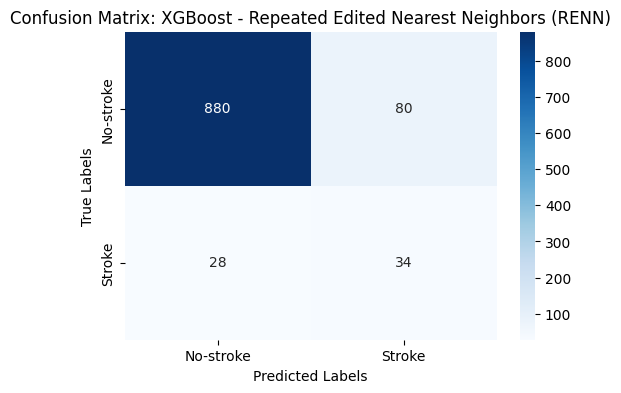

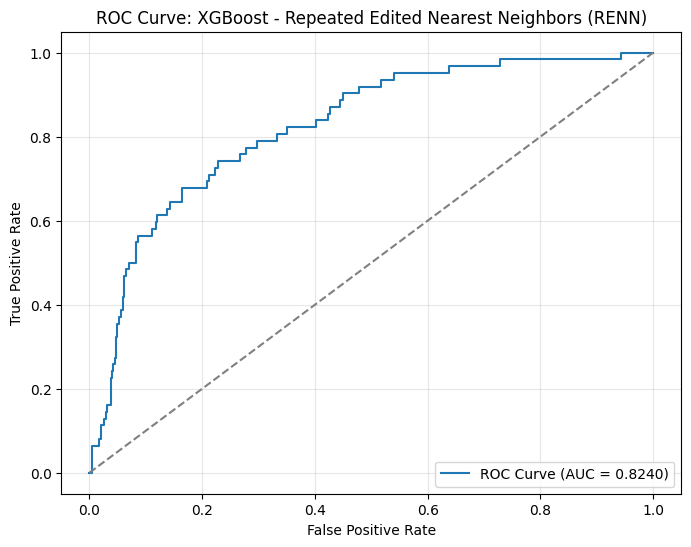


==================== XGBoost with All KNN ====================

XGBoost with All KNN Evaluation Metrics:
Accuracy: 0.8973
Precision: 0.2737
Recall: 0.4194
F1 Score: 0.3312
ROC-AUC Score: 0.8232

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       960
           1       0.27      0.42      0.33        62

    accuracy                           0.90      1022
   macro avg       0.62      0.67      0.64      1022
weighted avg       0.92      0.90      0.91      1022


Confusion Matrix:
[[891  69]
 [ 36  26]]


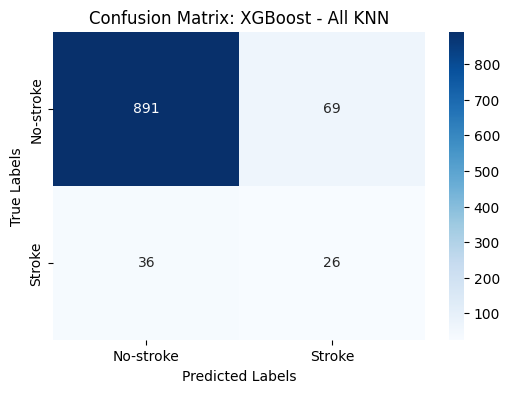

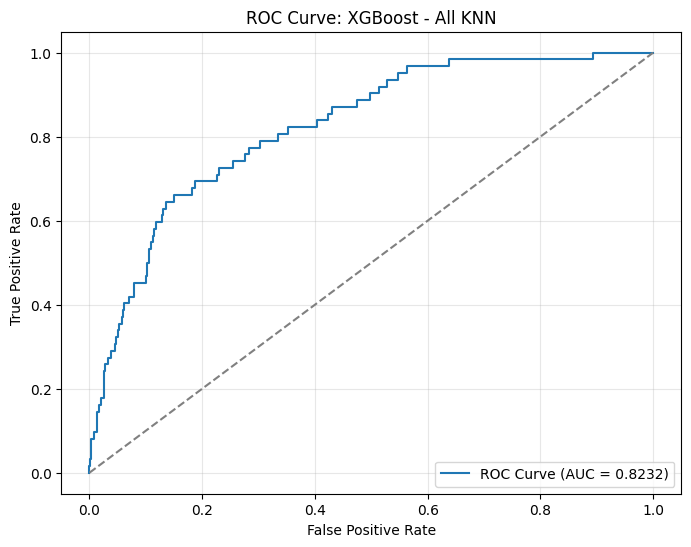


==================== XGBoost with Condensed Nearest Neighbor (CNN) ====================

XGBoost with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.8405
Precision: 0.1699
Recall: 0.4194
F1 Score: 0.2419
ROC-AUC Score: 0.7294

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.87      0.91       960
           1       0.17      0.42      0.24        62

    accuracy                           0.84      1022
   macro avg       0.56      0.64      0.58      1022
weighted avg       0.91      0.84      0.87      1022


Confusion Matrix:
[[833 127]
 [ 36  26]]


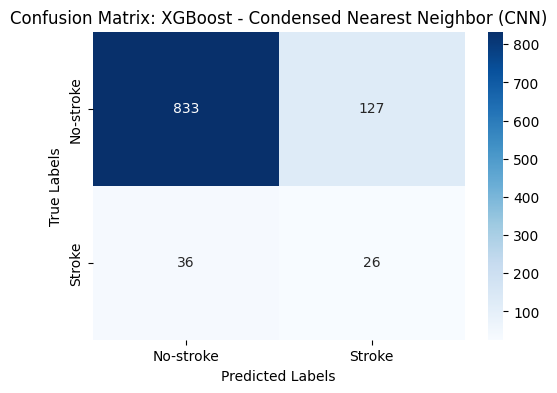

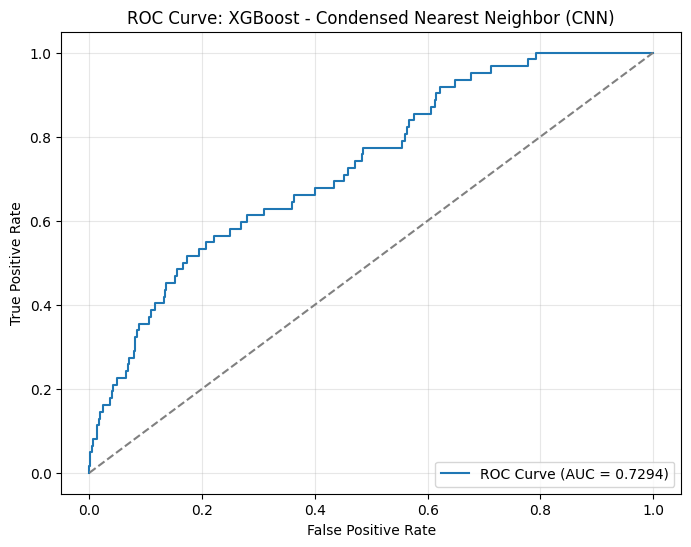


==================== XGBoost with One-Sided Selection (OSS) ====================

XGBoost with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9129
Precision: 0.2453
Recall: 0.2097
F1 Score: 0.2261
ROC-AUC Score: 0.7783

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       960
           1       0.25      0.21      0.23        62

    accuracy                           0.91      1022
   macro avg       0.60      0.58      0.59      1022
weighted avg       0.91      0.91      0.91      1022


Confusion Matrix:
[[920  40]
 [ 49  13]]


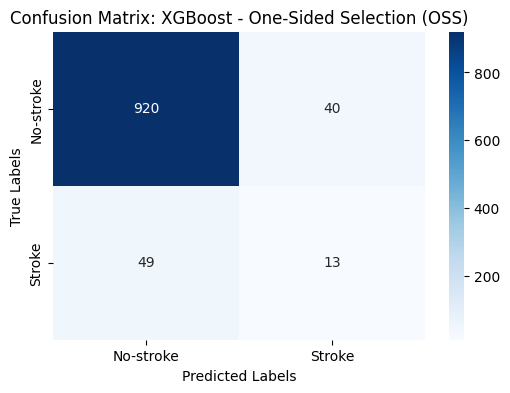

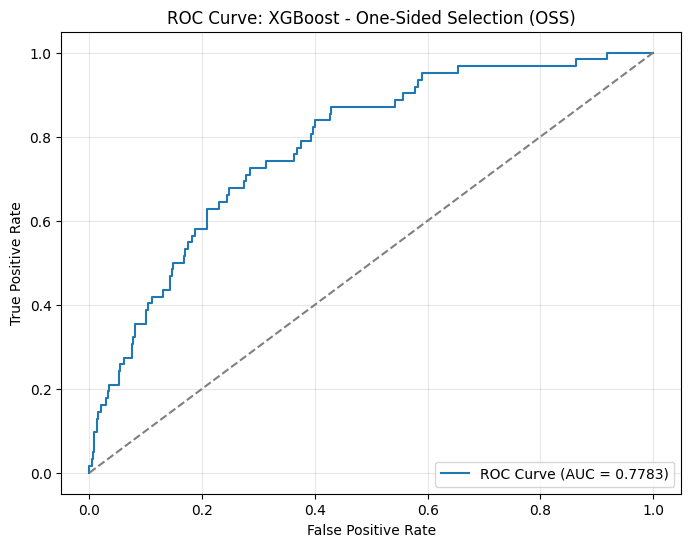


==================== XGBoost with Neighborhood Cleaning Rule (NCR) ====================

XGBoost with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9031
Precision: 0.2394
Recall: 0.2742
F1 Score: 0.2556
ROC-AUC Score: 0.7926

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       960
           1       0.24      0.27      0.26        62

    accuracy                           0.90      1022
   macro avg       0.60      0.61      0.60      1022
weighted avg       0.91      0.90      0.91      1022


Confusion Matrix:
[[906  54]
 [ 45  17]]


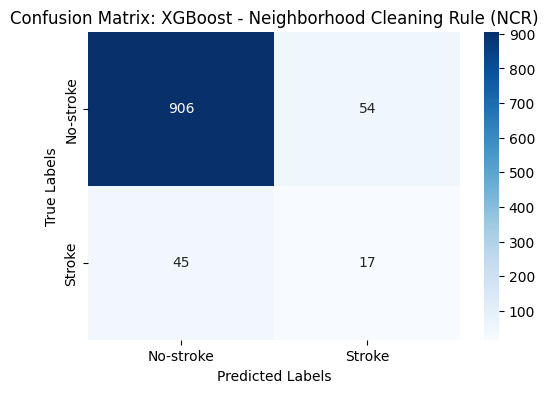

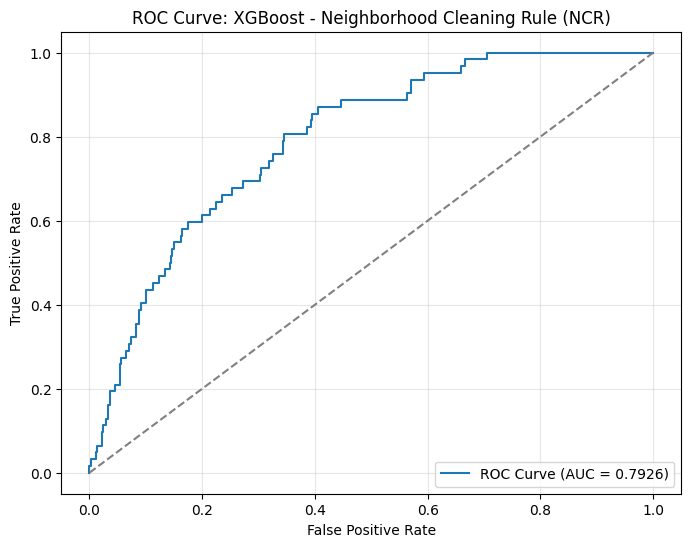


==================== XGBoost with Instance Hardness Threshold ====================

XGBoost with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7260
Precision: 0.1506
Recall: 0.7581
F1 Score: 0.2513
ROC-AUC Score: 0.8342

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.76      0.25        62

    accuracy                           0.73      1022
   macro avg       0.56      0.74      0.54      1022
weighted avg       0.93      0.73      0.80      1022


Confusion Matrix:
[[695 265]
 [ 15  47]]


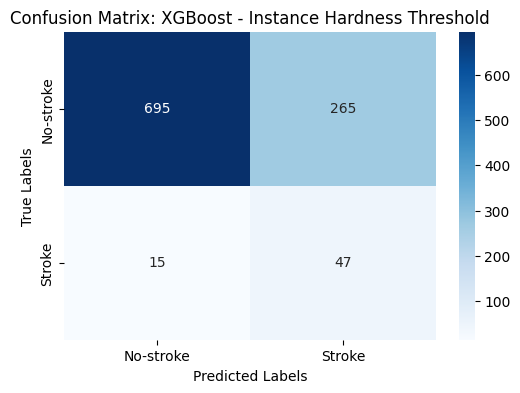

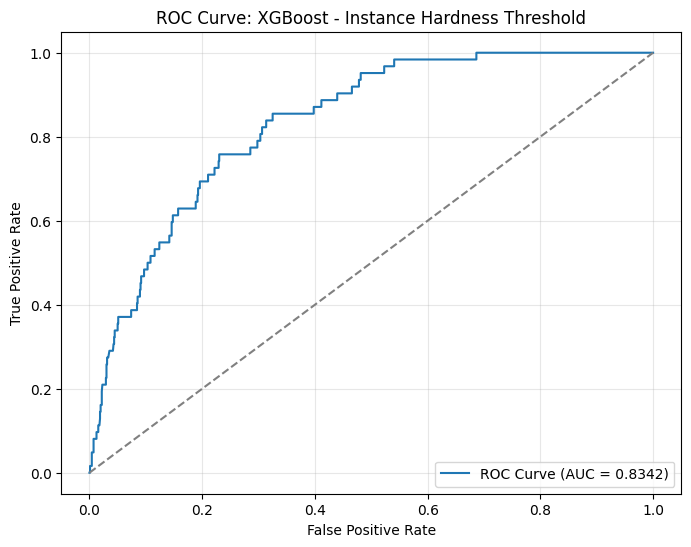


==================== LightGBM with None ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3901
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 4088, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with None Evaluation Metrics:
Accuracy: 0.8924
Precision: 0.2209
Recall: 0.3065
F1 Score: 0.2568
ROC-AUC Score: 0.8062

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       960
           1       0.22      0.31      0.26        62

    accuracy                           0.89      1022
   macro avg  

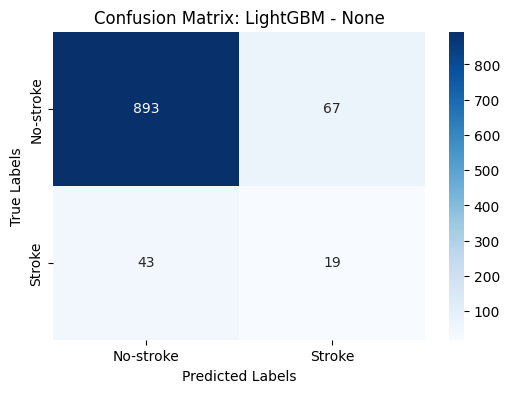

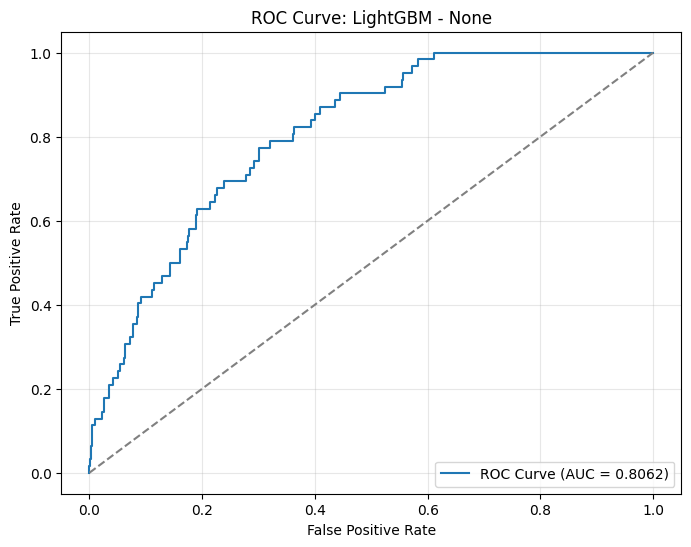


==================== LightGBM with SMOTE ====================
[LightGBM] [Info] Number of positive: 3901, number of negative: 3901
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 791
[LightGBM] [Info] Number of data points in the train set: 7802, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000

LightGBM with SMOTE Evaluation Metrics:
Accuracy: 0.9012
Precision: 0.1803
Recall: 0.1774
F1 Score: 0.1789
ROC-AUC Score: 0.7604

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       960
           1       0.18      0.18      0.18        62

    accuracy                           0.90      1022
   macro avg       0.56      0.56      0.56      1022
weighted avg

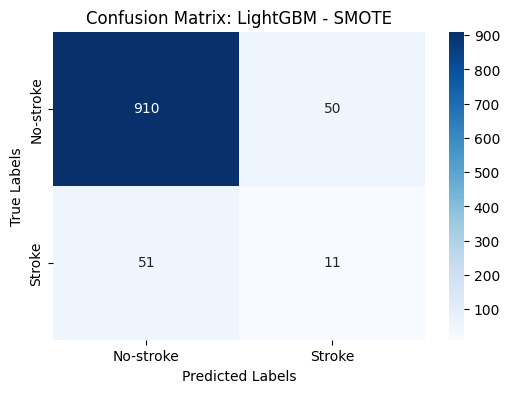

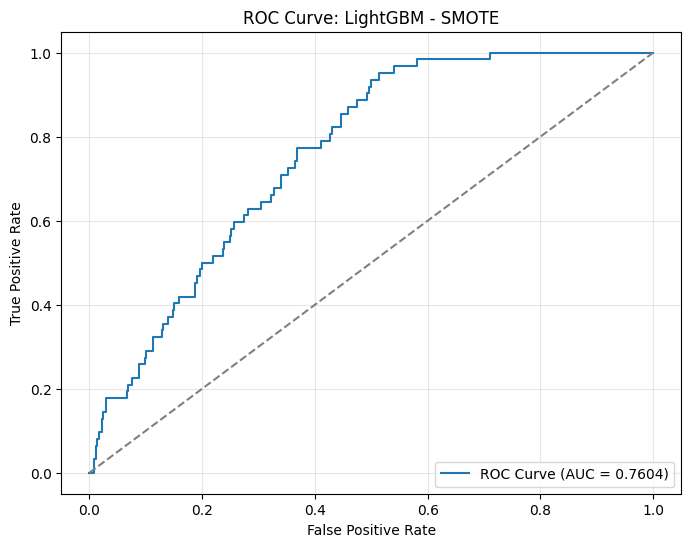


==================== LightGBM with ClusterCentroids ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 363
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

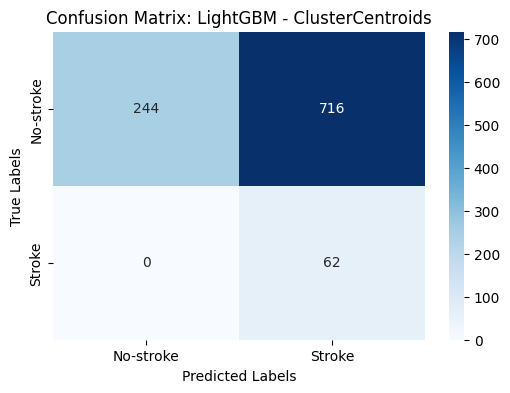

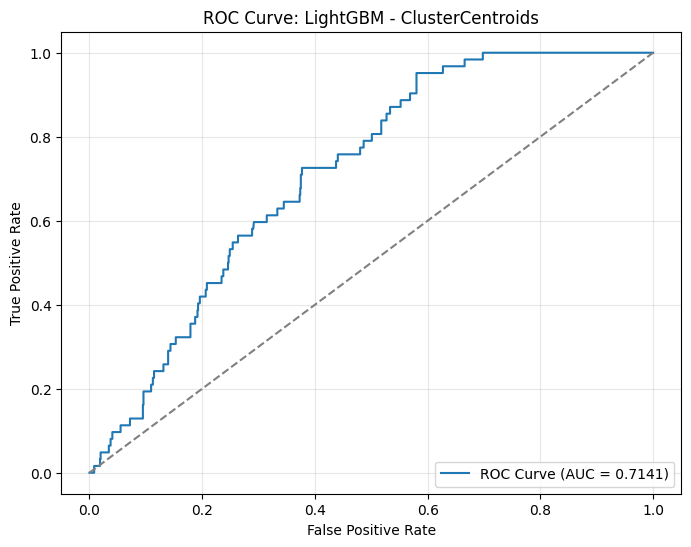


==================== LightGBM with Random Undersampling ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 308
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

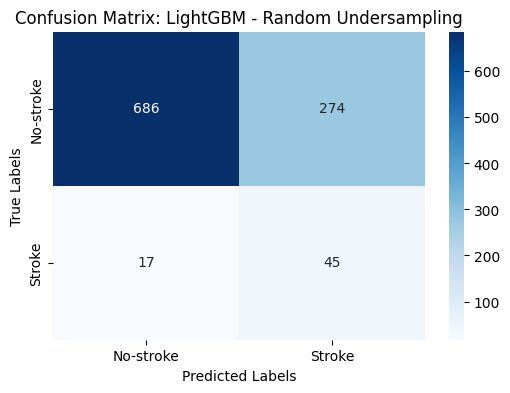

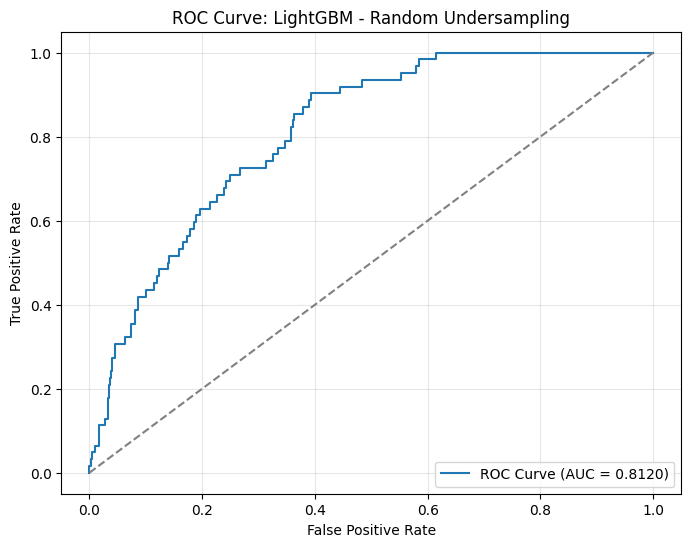


==================== LightGBM with NearMiss-1 ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 269
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

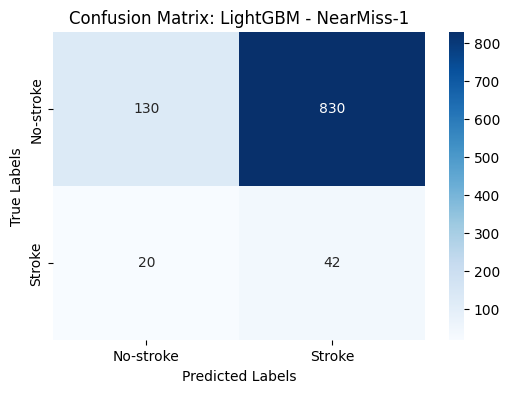

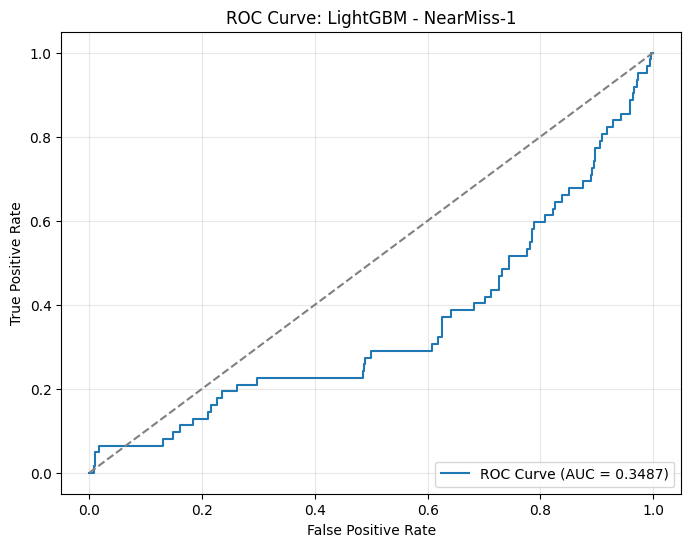


==================== LightGBM with NearMiss-2 ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 300
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

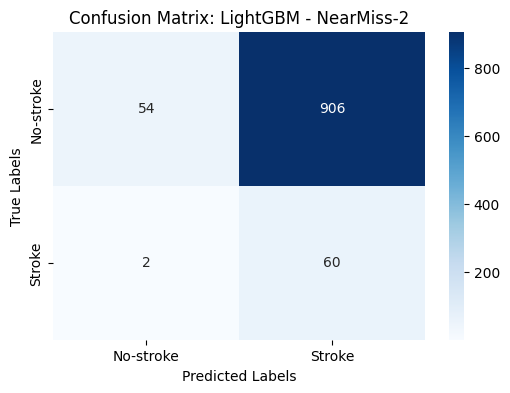

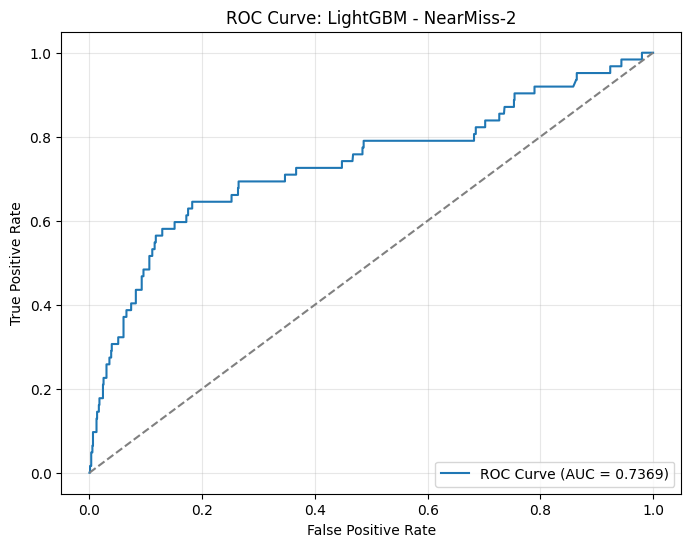


==================== LightGBM with NearMiss-3 ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 286
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

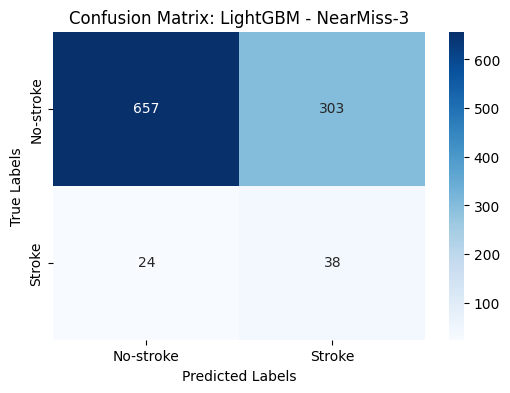

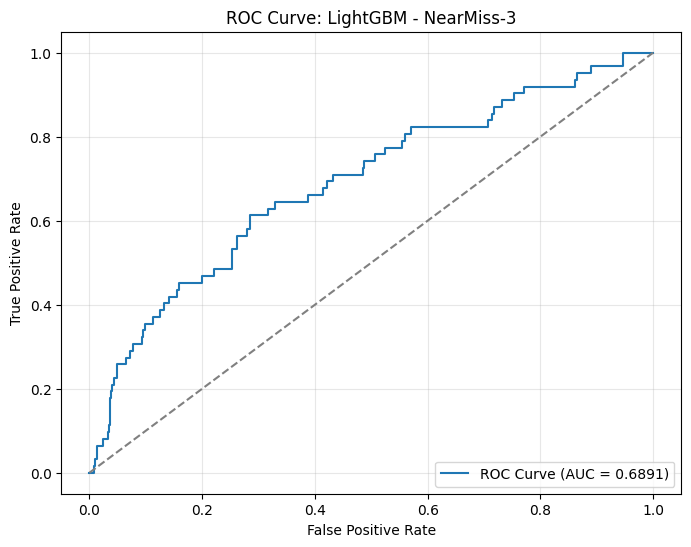


==================== LightGBM with Tomek Links ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3816
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 4003, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000

LightGBM with Tomek Links Evaluation Metrics:
Accuracy: 0.8963
Precision: 0.2381
Recall: 0.3226
F1 Score: 0.2740
ROC-AUC Score: 0.8034

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       960
           1       0.24      0.32      0.27        62

    accuracy                           0.90      1022
  

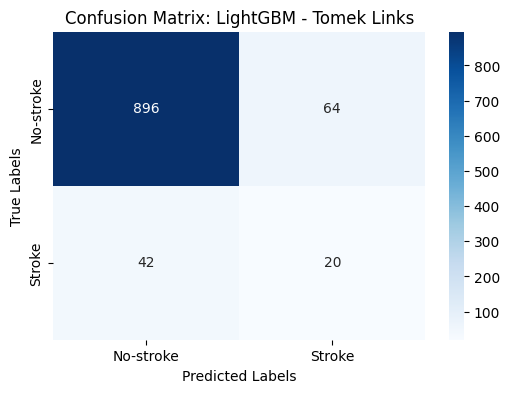

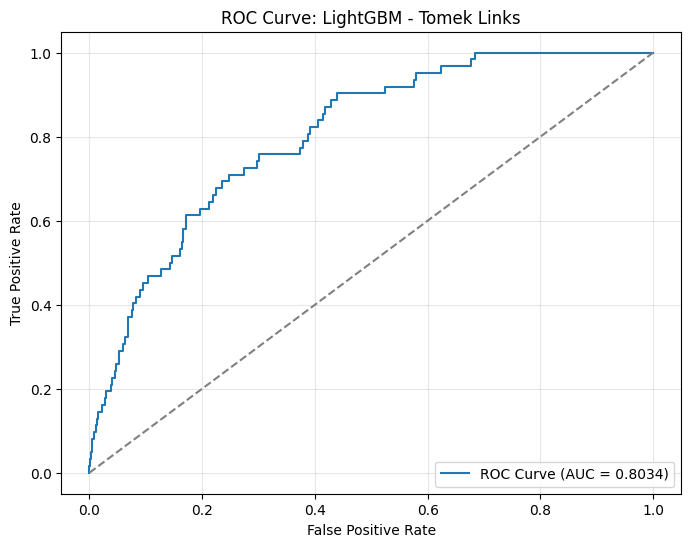


==================== LightGBM with Edited Nearest Neighbors (ENN) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3440
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3627, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.8933
Precision: 0.2804
Recall: 0.4839
F1 Score: 0.3550
ROC-AUC Score: 0.8380

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.92      0.94       960
           1       0.28      0.48      0.36        62

    accuracy    

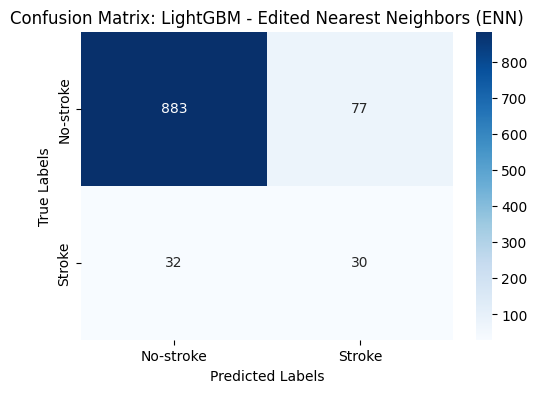

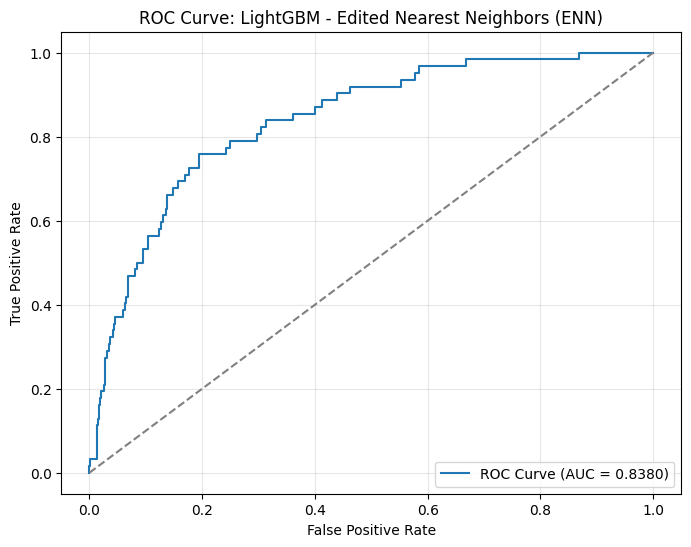


==================== LightGBM with Repeated Edited Nearest Neighbors (RENN) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3223
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3410, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000

LightGBM with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8630
Precision: 0.2292
Recall: 0.5323
F1 Score: 0.3204
ROC-AUC Score: 0.8337

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92       960
           1       0.23      0.53      0.32        62

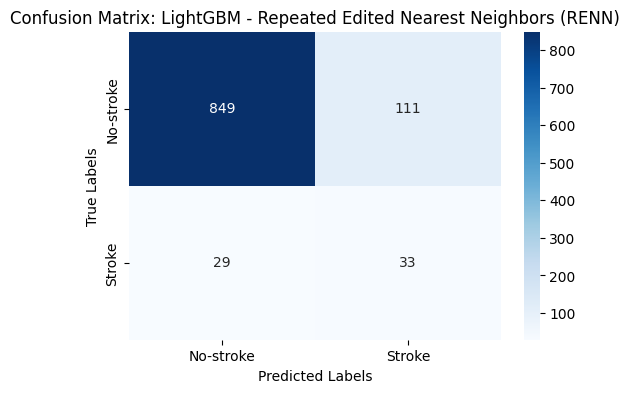

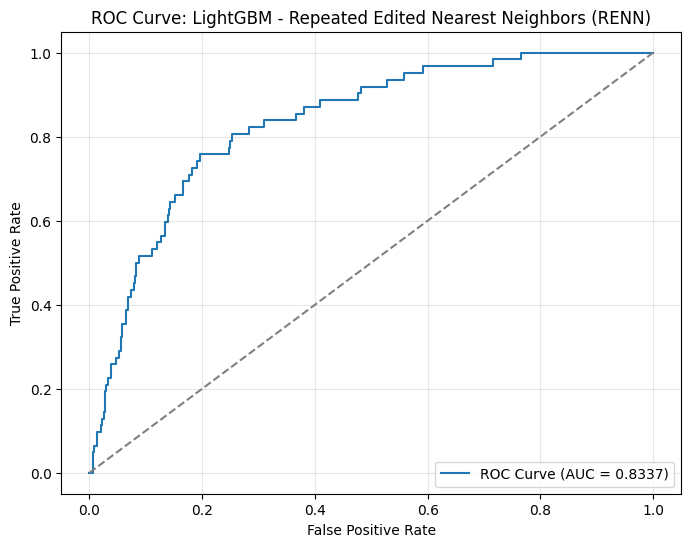


==================== LightGBM with All KNN ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3340
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3527, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with All KNN Evaluation Metrics:
Accuracy: 0.8777
Precision: 0.2480
Recall: 0.5000
F1 Score: 0.3316
ROC-AUC Score: 0.8355

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       960
           1       0.25      0.50      0.33        62

    accuracy                           0.88      1022
   macro

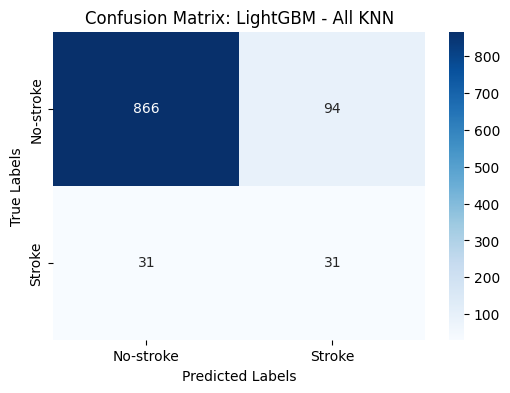

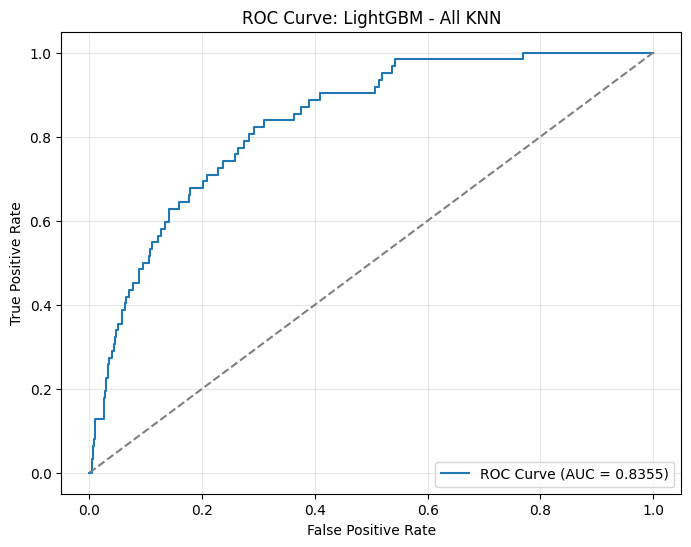


==================== LightGBM with Condensed Nearest Neighbor (CNN) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 544
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 474
[LightGBM] [Info] Number of data points in the train set: 731, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

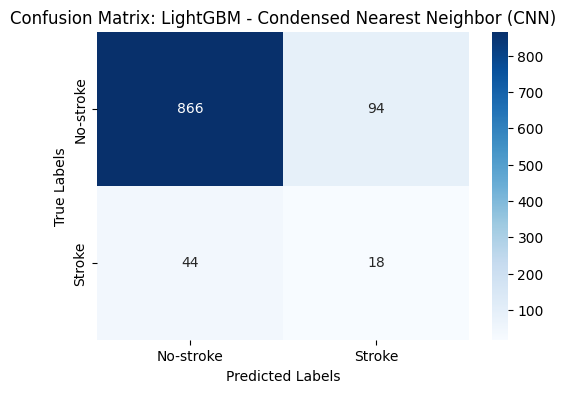

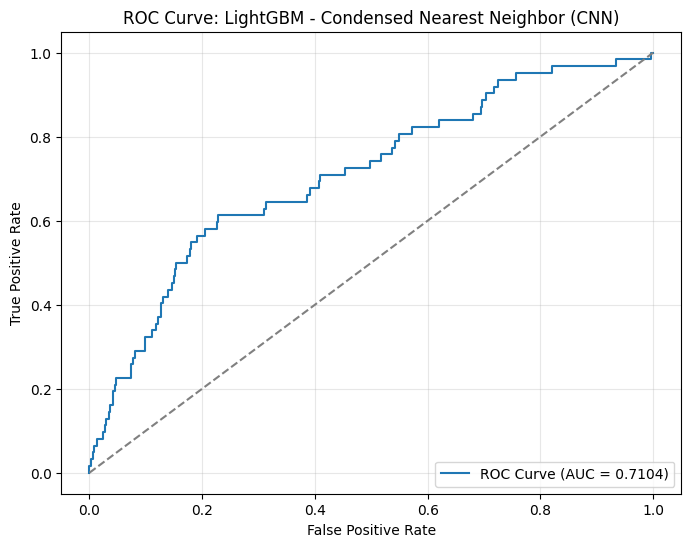


==================== LightGBM with One-Sided Selection (OSS) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3794
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3981, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.8933
Precision: 0.2418
Recall: 0.3548
F1 Score: 0.2876
ROC-AUC Score: 0.8131

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       960
           1       0.24      0.35      0.29        62

    accuracy              

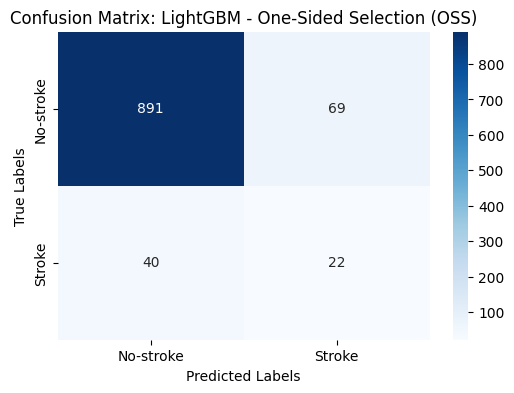

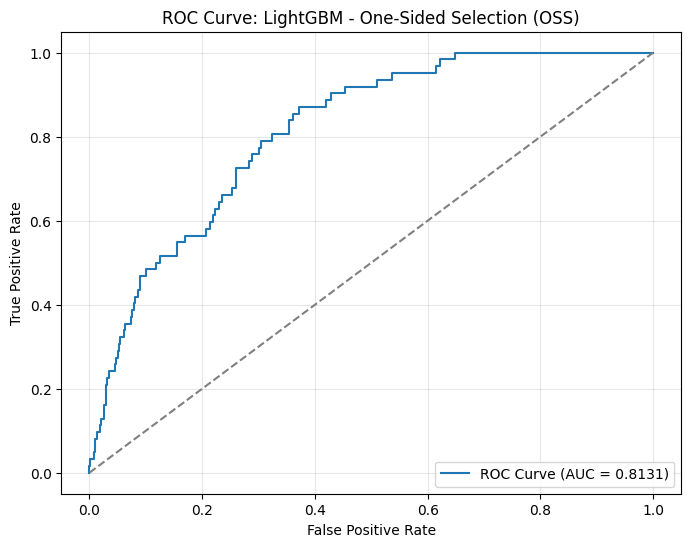


==================== LightGBM with Neighborhood Cleaning Rule (NCR) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3488
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3675, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000

LightGBM with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8826
Precision: 0.2264
Recall: 0.3871
F1 Score: 0.2857
ROC-AUC Score: 0.8222

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.91      0.94       960
           1       0.23      0.39      0.29        62

    accuracy  

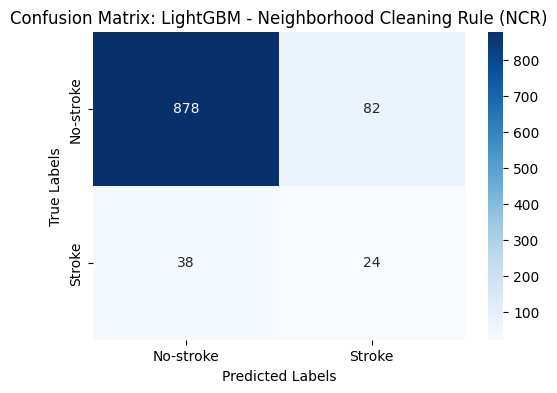

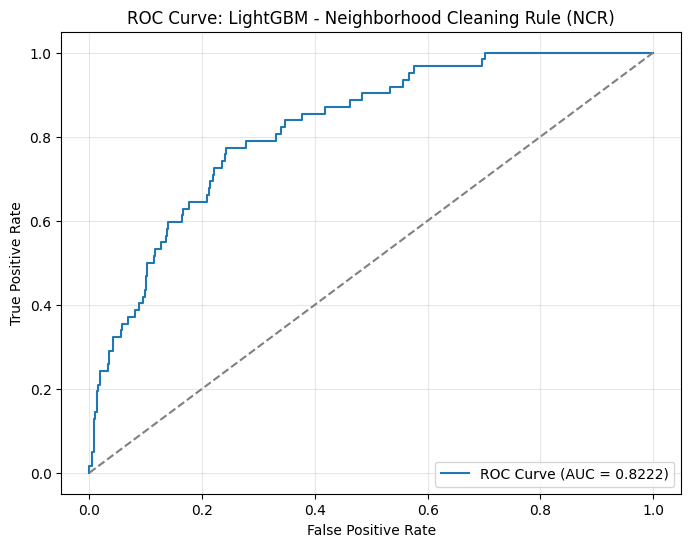


==================== LightGBM with Instance Hardness Threshold ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 1733
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 635
[LightGBM] [Info] Number of data points in the train set: 1920, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

LightGBM with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7397
Precision: 0.1645
Recall: 0.8065
F1 Score: 0.2732
ROC-AUC

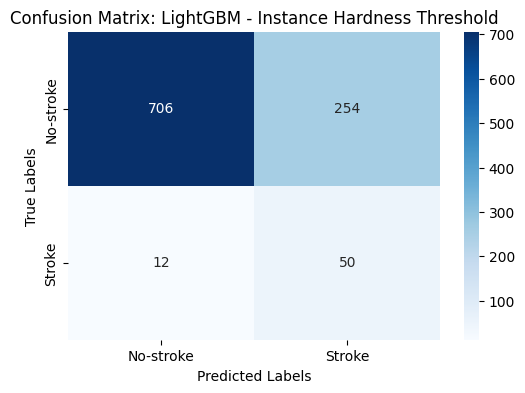

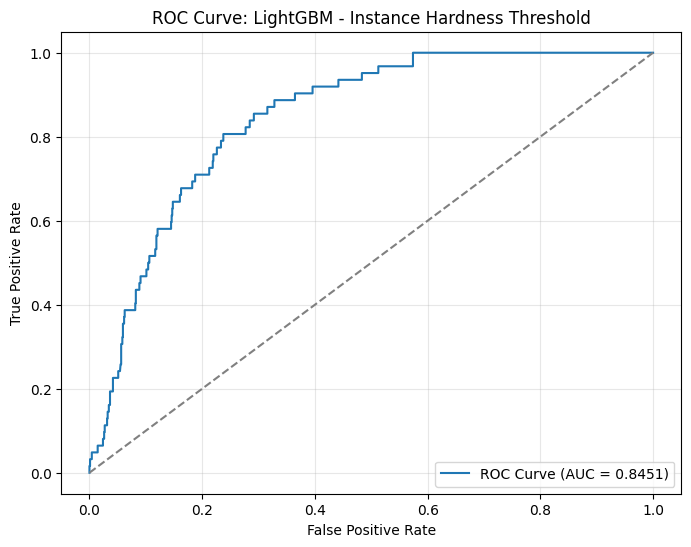


==================== CatBoost with None ====================

CatBoost with None Evaluation Metrics:
Accuracy: 0.9403
Precision: 0.6667
Recall: 0.0323
F1 Score: 0.0615
ROC-AUC Score: 0.8143

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.67      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.80      0.52      0.52      1022
weighted avg       0.92      0.94      0.91      1022


Confusion Matrix:
[[959   1]
 [ 60   2]]


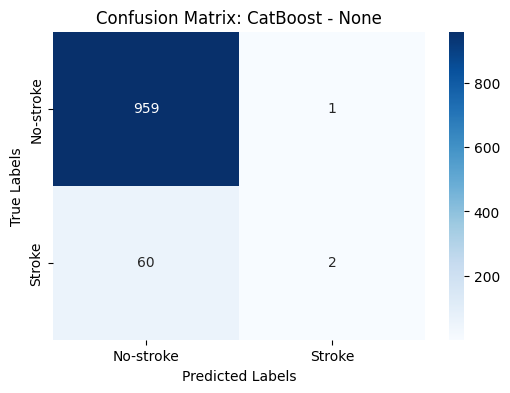

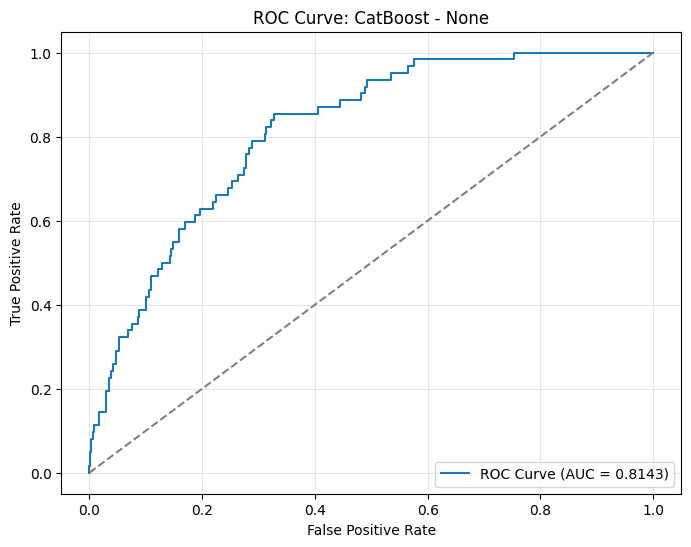


==================== CatBoost with SMOTE ====================

CatBoost with SMOTE Evaluation Metrics:
Accuracy: 0.8982
Precision: 0.1613
Recall: 0.1613
F1 Score: 0.1613
ROC-AUC Score: 0.7474

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       960
           1       0.16      0.16      0.16        62

    accuracy                           0.90      1022
   macro avg       0.55      0.55      0.55      1022
weighted avg       0.90      0.90      0.90      1022


Confusion Matrix:
[[908  52]
 [ 52  10]]


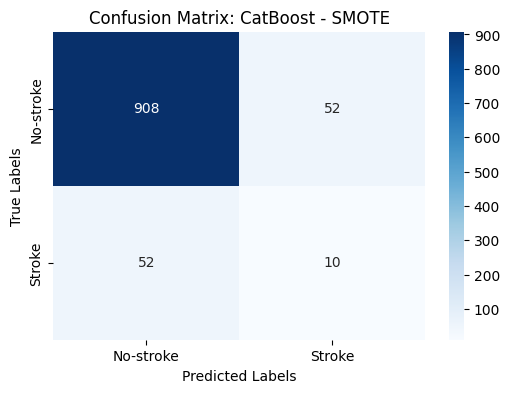

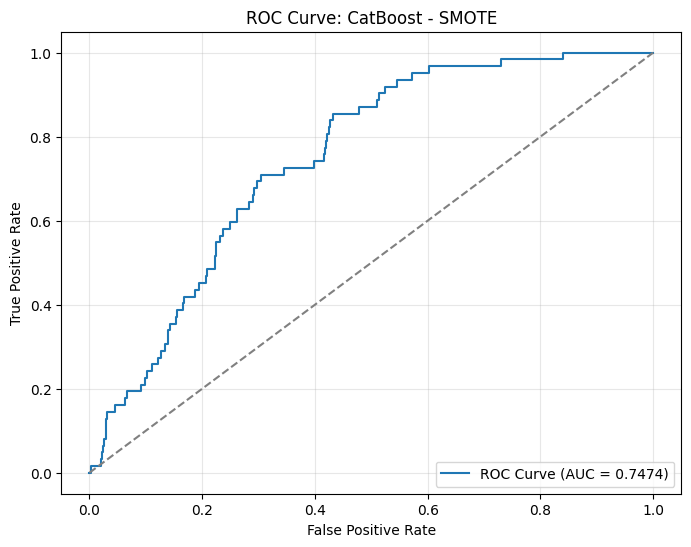


==================== CatBoost with ClusterCentroids ====================

CatBoost with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2339
Precision: 0.0734
Recall: 1.0000
F1 Score: 0.1367
ROC-AUC Score: 0.7022

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.18      0.31       960
           1       0.07      1.00      0.14        62

    accuracy                           0.23      1022
   macro avg       0.54      0.59      0.22      1022
weighted avg       0.94      0.23      0.30      1022


Confusion Matrix:
[[177 783]
 [  0  62]]


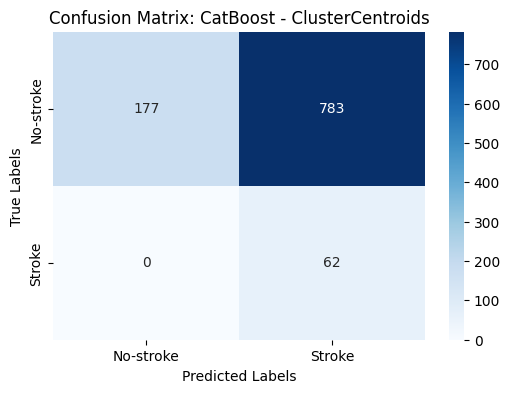

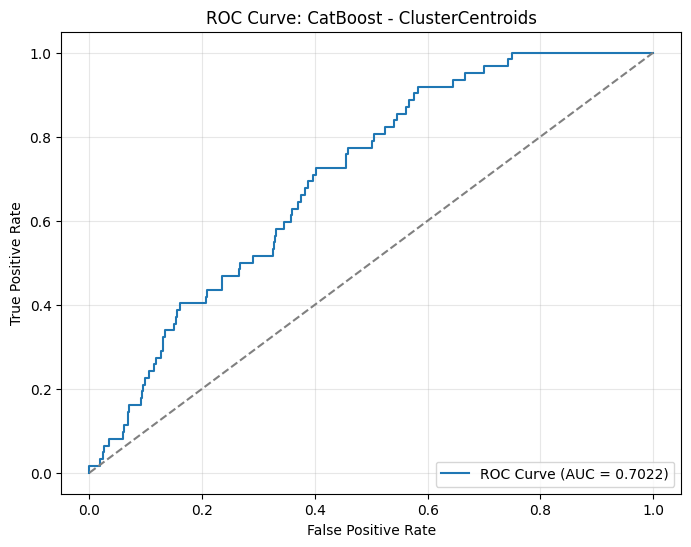


==================== CatBoost with Random Undersampling ====================

CatBoost with Random Undersampling Evaluation Metrics:
Accuracy: 0.7162
Precision: 0.1587
Recall: 0.8548
F1 Score: 0.2677
ROC-AUC Score: 0.8393

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.71      0.82       960
           1       0.16      0.85      0.27        62

    accuracy                           0.72      1022
   macro avg       0.57      0.78      0.55      1022
weighted avg       0.94      0.72      0.79      1022


Confusion Matrix:
[[679 281]
 [  9  53]]


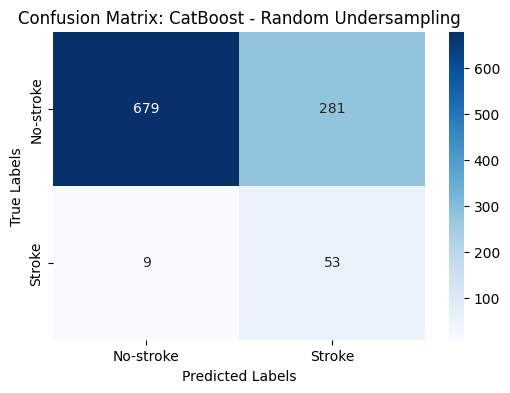

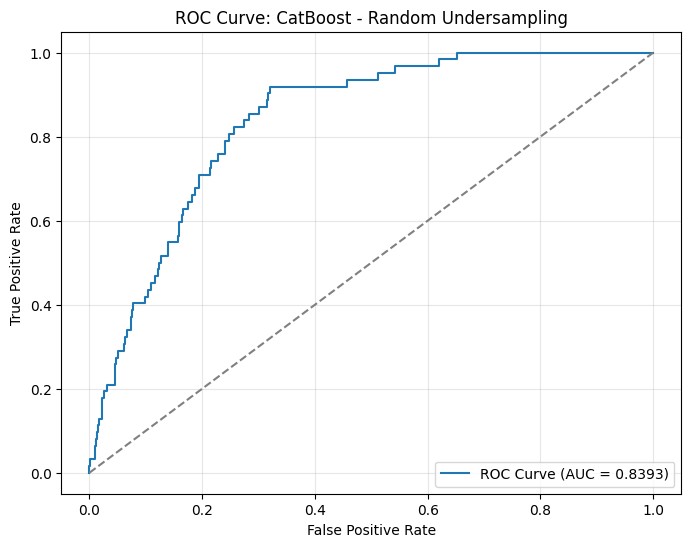


==================== CatBoost with NearMiss-1 ====================

CatBoost with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1820
Precision: 0.0458
Recall: 0.6290
F1 Score: 0.0853
ROC-AUC Score: 0.3337

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.15      0.26       960
           1       0.05      0.63      0.09        62

    accuracy                           0.18      1022
   macro avg       0.46      0.39      0.17      1022
weighted avg       0.82      0.18      0.25      1022


Confusion Matrix:
[[147 813]
 [ 23  39]]


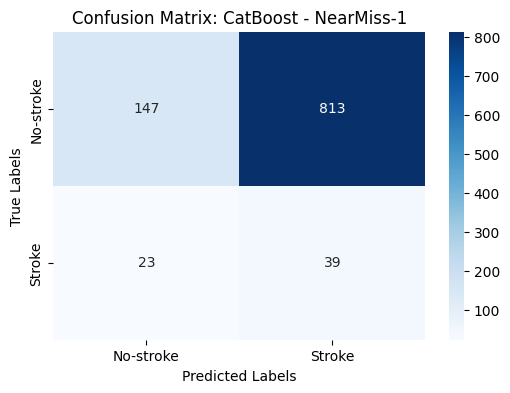

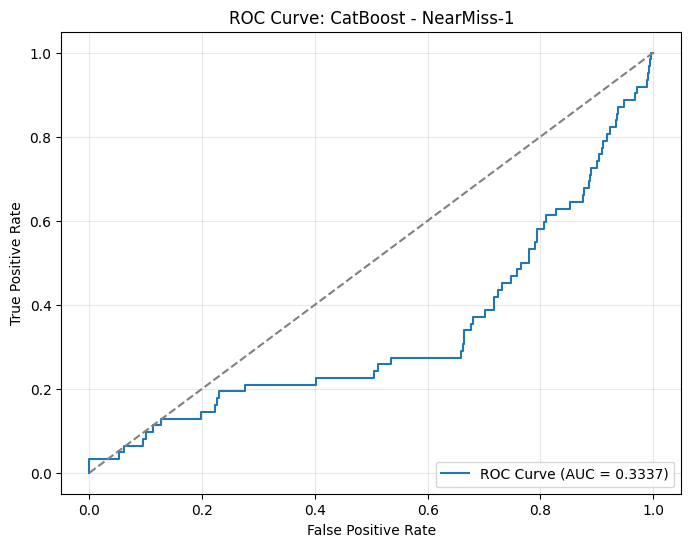


==================== CatBoost with NearMiss-2 ====================

CatBoost with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1213
Precision: 0.0628
Recall: 0.9677
F1 Score: 0.1179
ROC-AUC Score: 0.7680

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.07      0.12       960
           1       0.06      0.97      0.12        62

    accuracy                           0.12      1022
   macro avg       0.52      0.52      0.12      1022
weighted avg       0.91      0.12      0.12      1022


Confusion Matrix:
[[ 64 896]
 [  2  60]]


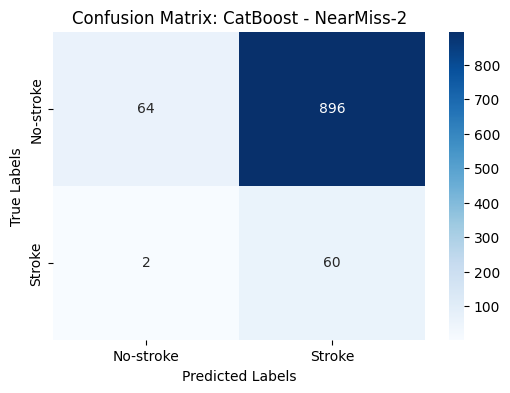

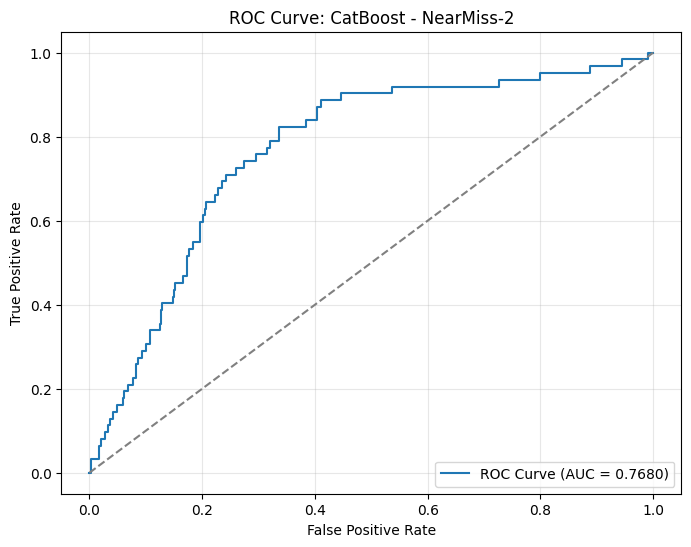


==================== CatBoost with NearMiss-3 ====================

CatBoost with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6448
Precision: 0.1070
Recall: 0.6613
F1 Score: 0.1843
ROC-AUC Score: 0.6910

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.64      0.77       960
           1       0.11      0.66      0.18        62

    accuracy                           0.64      1022
   macro avg       0.54      0.65      0.48      1022
weighted avg       0.91      0.64      0.74      1022


Confusion Matrix:
[[618 342]
 [ 21  41]]


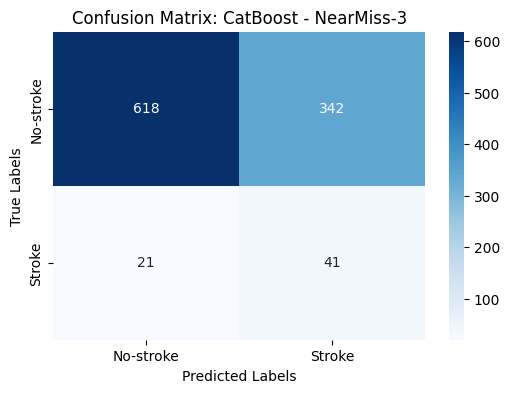

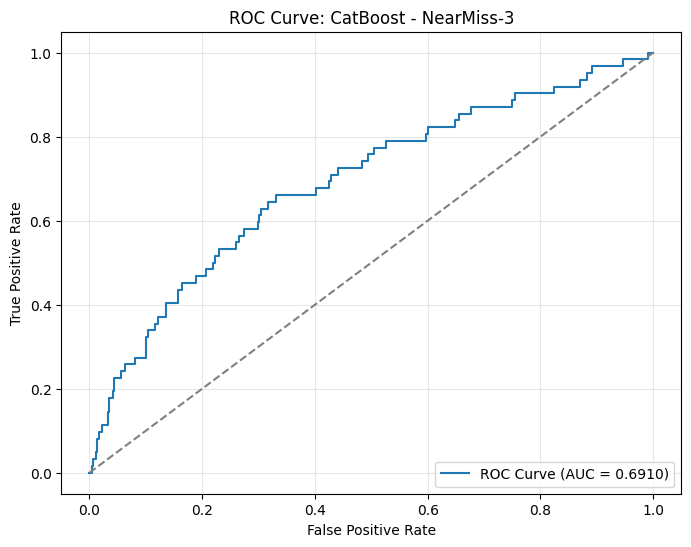


==================== CatBoost with Tomek Links ====================

CatBoost with Tomek Links Evaluation Metrics:
Accuracy: 0.9403
Precision: 0.6000
Recall: 0.0484
F1 Score: 0.0896
ROC-AUC Score: 0.8162

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.60      0.05      0.09        62

    accuracy                           0.94      1022
   macro avg       0.77      0.52      0.53      1022
weighted avg       0.92      0.94      0.92      1022


Confusion Matrix:
[[958   2]
 [ 59   3]]


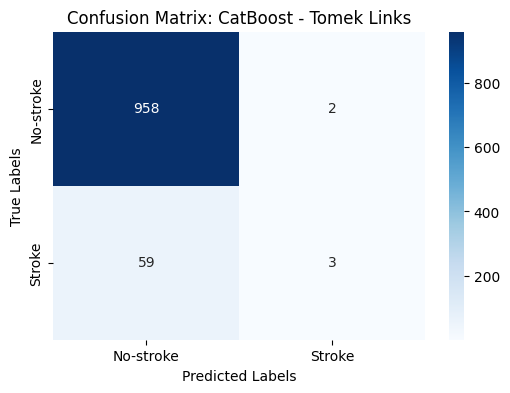

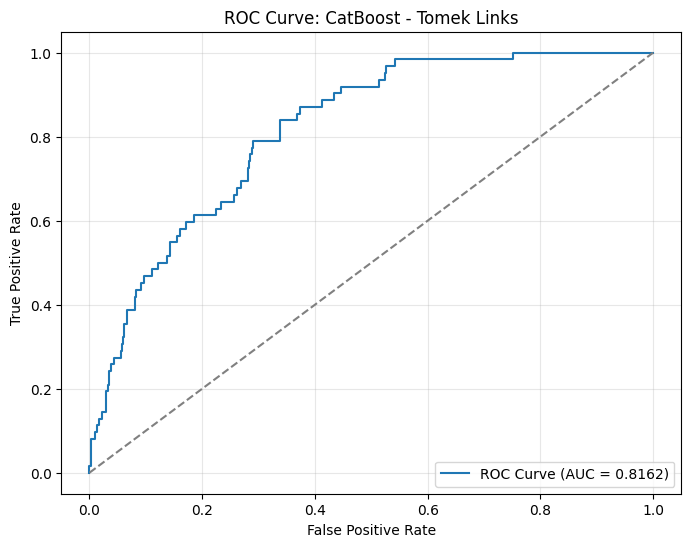


==================== CatBoost with Edited Nearest Neighbors (ENN) ====================

CatBoost with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9315
Precision: 0.3182
Recall: 0.1129
F1 Score: 0.1667
ROC-AUC Score: 0.8238

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.32      0.11      0.17        62

    accuracy                           0.93      1022
   macro avg       0.63      0.55      0.57      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[945  15]
 [ 55   7]]


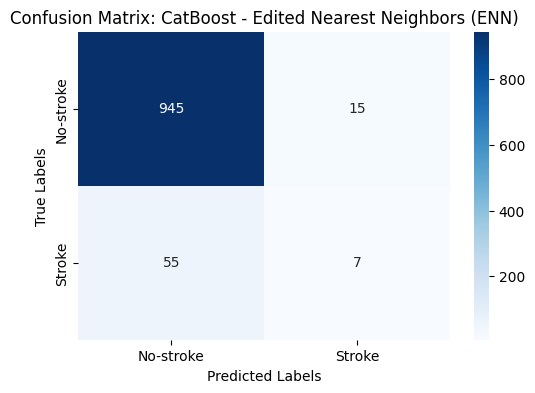

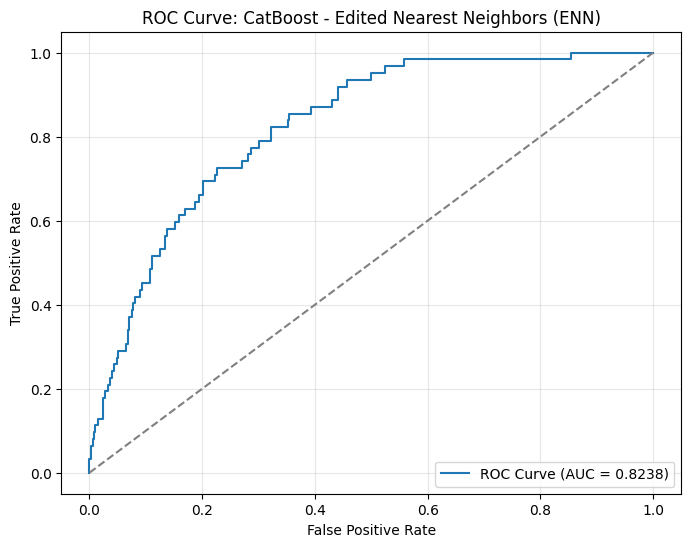


==================== CatBoost with Repeated Edited Nearest Neighbors (RENN) ====================

CatBoost with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9129
Precision: 0.2985
Recall: 0.3226
F1 Score: 0.3101
ROC-AUC Score: 0.8398

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       960
           1       0.30      0.32      0.31        62

    accuracy                           0.91      1022
   macro avg       0.63      0.64      0.63      1022
weighted avg       0.92      0.91      0.91      1022


Confusion Matrix:
[[913  47]
 [ 42  20]]


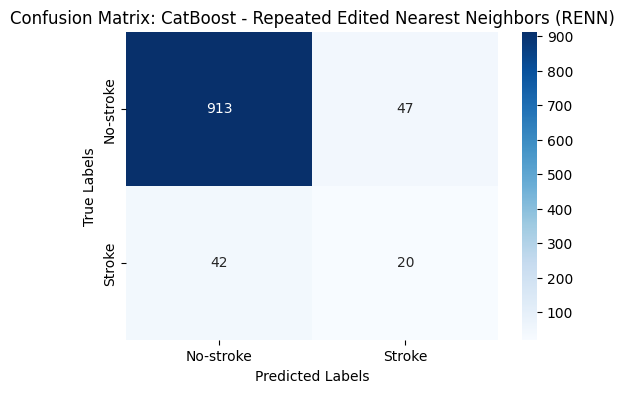

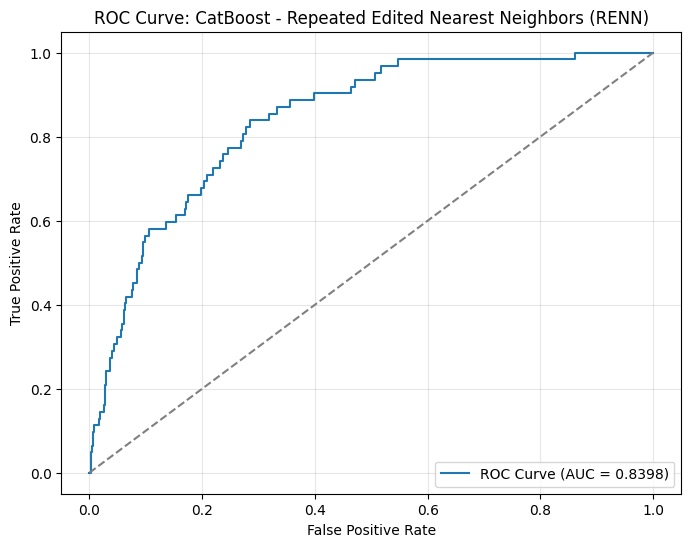


==================== CatBoost with All KNN ====================

CatBoost with All KNN Evaluation Metrics:
Accuracy: 0.9256
Precision: 0.3250
Recall: 0.2097
F1 Score: 0.2549
ROC-AUC Score: 0.8335

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.33      0.21      0.25        62

    accuracy                           0.93      1022
   macro avg       0.64      0.59      0.61      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[933  27]
 [ 49  13]]


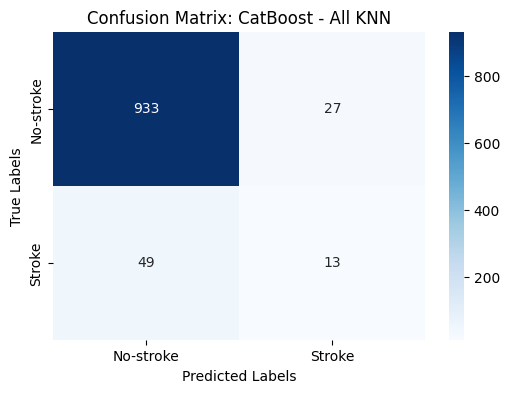

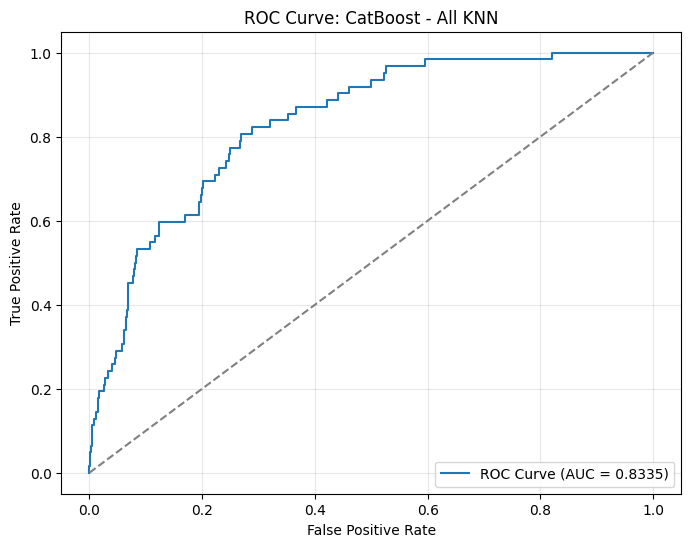


==================== CatBoost with Condensed Nearest Neighbor (CNN) ====================

CatBoost with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9335
Precision: 0.3125
Recall: 0.0806
F1 Score: 0.1282
ROC-AUC Score: 0.8113

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.31      0.08      0.13        62

    accuracy                           0.93      1022
   macro avg       0.63      0.53      0.55      1022
weighted avg       0.91      0.93      0.91      1022


Confusion Matrix:
[[949  11]
 [ 57   5]]


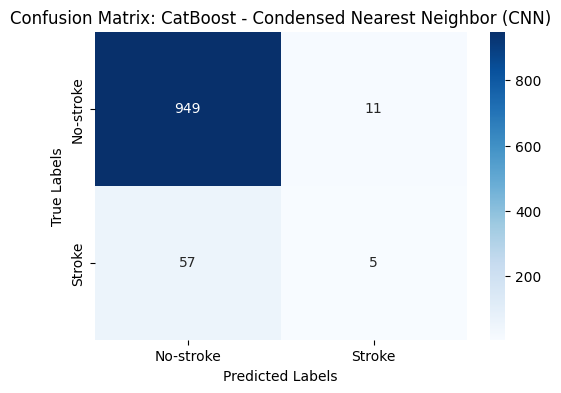

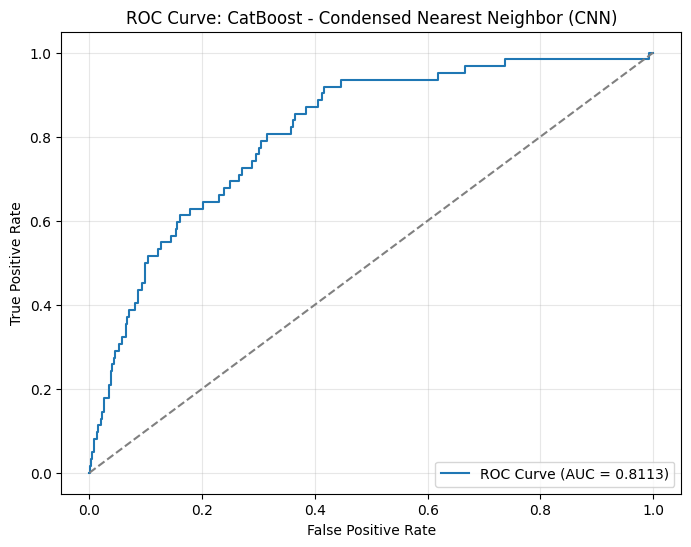


==================== CatBoost with One-Sided Selection (OSS) ====================

CatBoost with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9384
Precision: 0.4000
Recall: 0.0323
F1 Score: 0.0597
ROC-AUC Score: 0.8203

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.40      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.67      0.51      0.51      1022
weighted avg       0.91      0.94      0.91      1022


Confusion Matrix:
[[957   3]
 [ 60   2]]


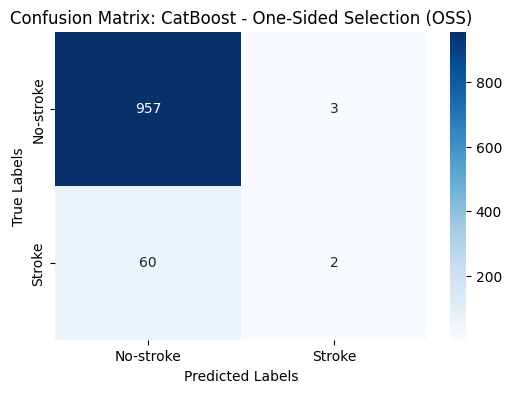

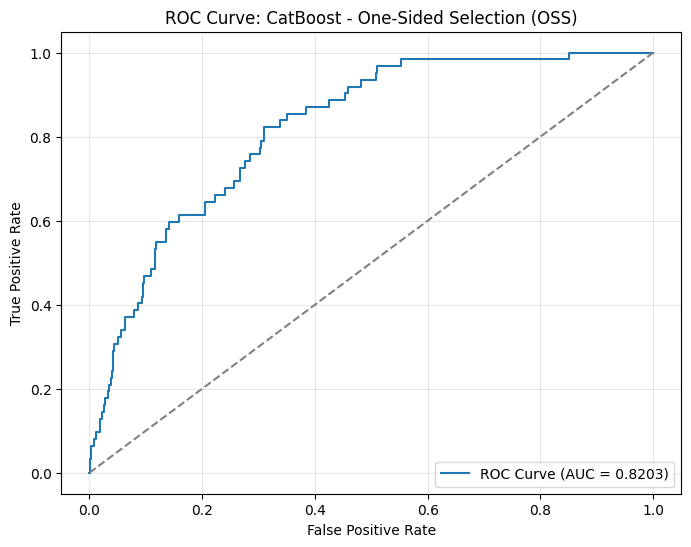


==================== CatBoost with Neighborhood Cleaning Rule (NCR) ====================

CatBoost with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9315
Precision: 0.2500
Recall: 0.0645
F1 Score: 0.1026
ROC-AUC Score: 0.8326

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.25      0.06      0.10        62

    accuracy                           0.93      1022
   macro avg       0.60      0.53      0.53      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[948  12]
 [ 58   4]]


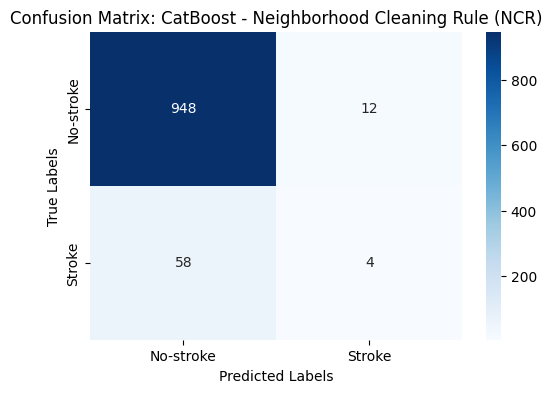

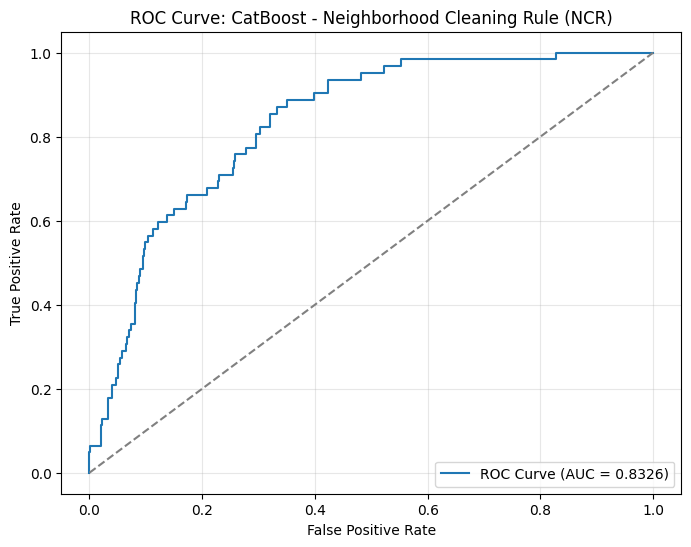


==================== CatBoost with Instance Hardness Threshold ====================

CatBoost with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7906
Precision: 0.1807
Recall: 0.6935
F1 Score: 0.2867
ROC-AUC Score: 0.8439

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.80      0.88       960
           1       0.18      0.69      0.29        62

    accuracy                           0.79      1022
   macro avg       0.58      0.75      0.58      1022
weighted avg       0.93      0.79      0.84      1022


Confusion Matrix:
[[765 195]
 [ 19  43]]


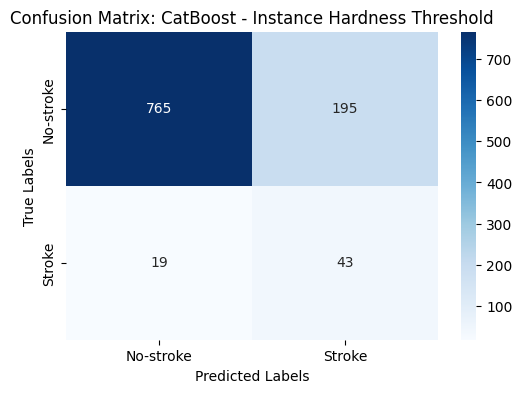

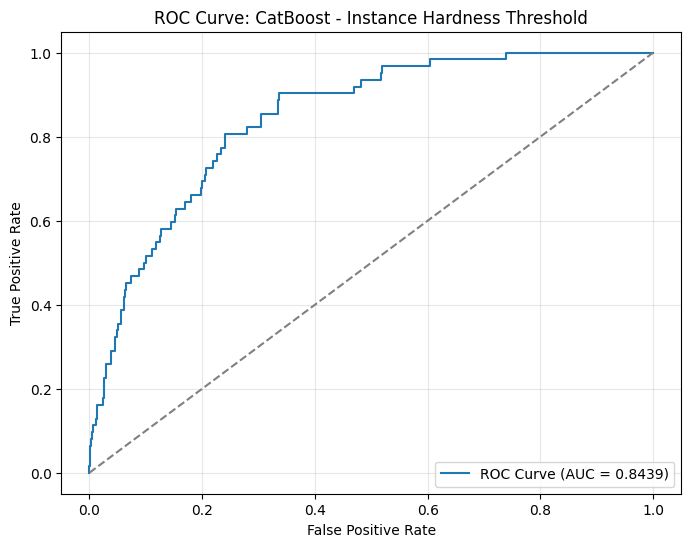


==================== Logistic Regression with None ====================

Logistic Regression with None Evaluation Metrics:
Accuracy: 0.7495
Precision: 0.1632
Recall: 0.7581
F1 Score: 0.2686
ROC-AUC Score: 0.8506

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.76      0.27        62

    accuracy                           0.75      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[719 241]
 [ 15  47]]


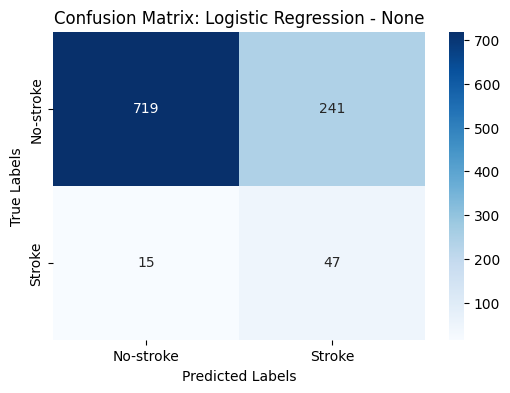

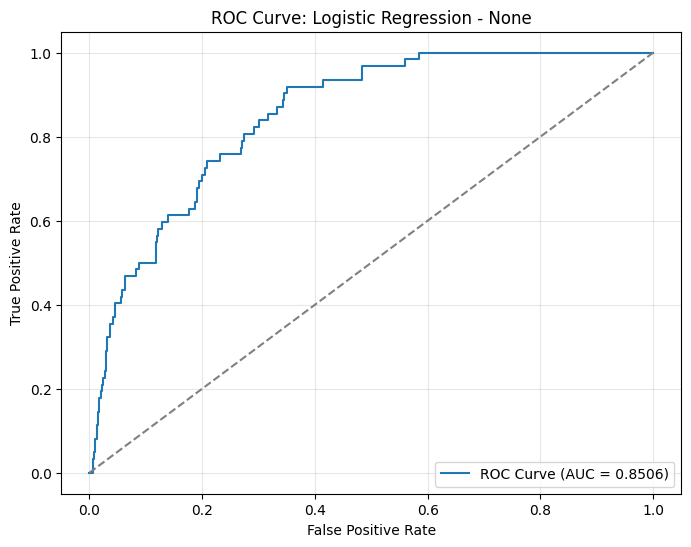


==================== Logistic Regression with SMOTE ====================

Logistic Regression with SMOTE Evaluation Metrics:
Accuracy: 0.7838
Precision: 0.1617
Recall: 0.6129
F1 Score: 0.2559
ROC-AUC Score: 0.7760

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.79      0.87       960
           1       0.16      0.61      0.26        62

    accuracy                           0.78      1022
   macro avg       0.57      0.70      0.56      1022
weighted avg       0.92      0.78      0.84      1022


Confusion Matrix:
[[763 197]
 [ 24  38]]


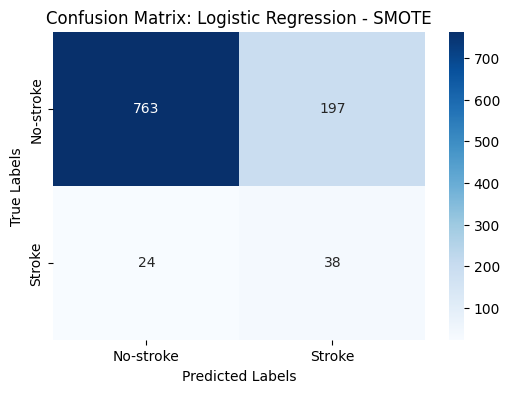

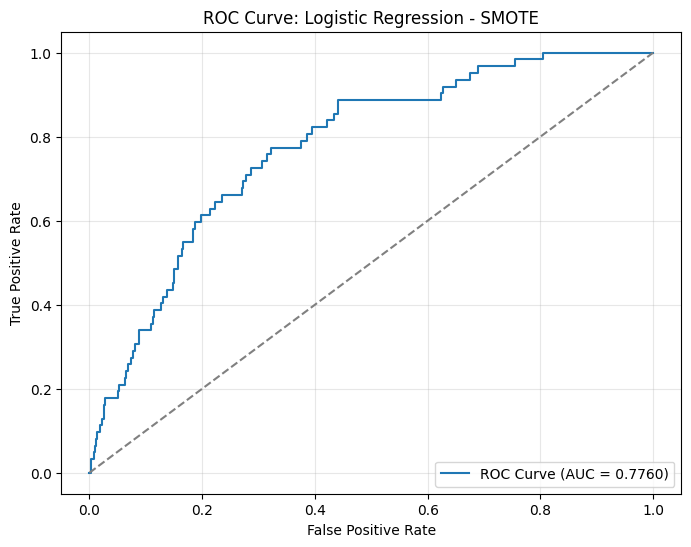


==================== Logistic Regression with ClusterCentroids ====================

Logistic Regression with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2476
Precision: 0.0746
Recall: 1.0000
F1 Score: 0.1389
ROC-AUC Score: 0.6992

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.20      0.33       960
           1       0.07      1.00      0.14        62

    accuracy                           0.25      1022
   macro avg       0.54      0.60      0.24      1022
weighted avg       0.94      0.25      0.32      1022


Confusion Matrix:
[[191 769]
 [  0  62]]


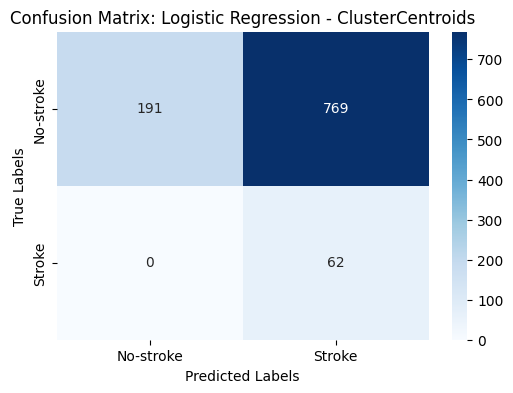

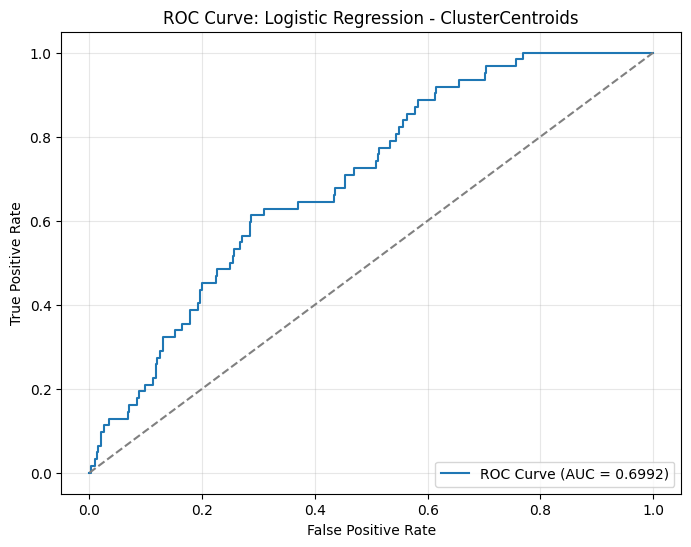


==================== Logistic Regression with Random Undersampling ====================

Logistic Regression with Random Undersampling Evaluation Metrics:
Accuracy: 0.7466
Precision: 0.1568
Recall: 0.7258
F1 Score: 0.2579
ROC-AUC Score: 0.8444

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.73      0.26        62

    accuracy                           0.75      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[718 242]
 [ 17  45]]


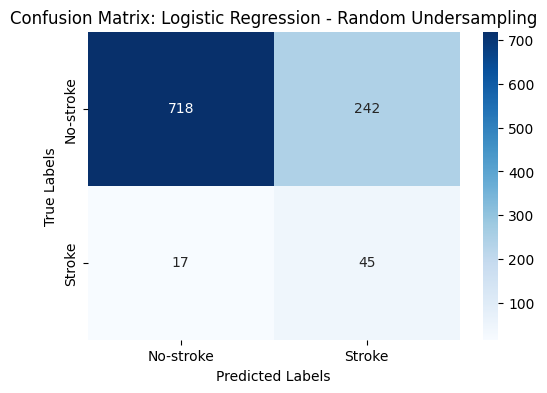

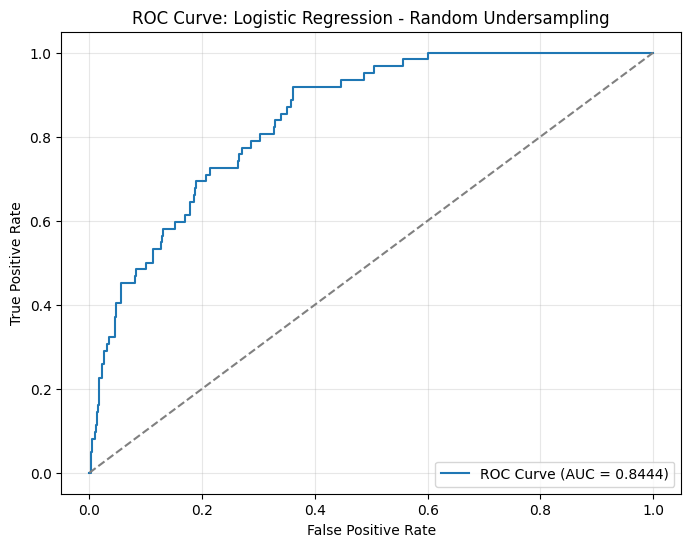


==================== Logistic Regression with NearMiss-1 ====================

Logistic Regression with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2456
Precision: 0.0473
Recall: 0.5968
F1 Score: 0.0876
ROC-AUC Score: 0.4305

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.22      0.36       960
           1       0.05      0.60      0.09        62

    accuracy                           0.25      1022
   macro avg       0.47      0.41      0.22      1022
weighted avg       0.84      0.25      0.34      1022


Confusion Matrix:
[[214 746]
 [ 25  37]]


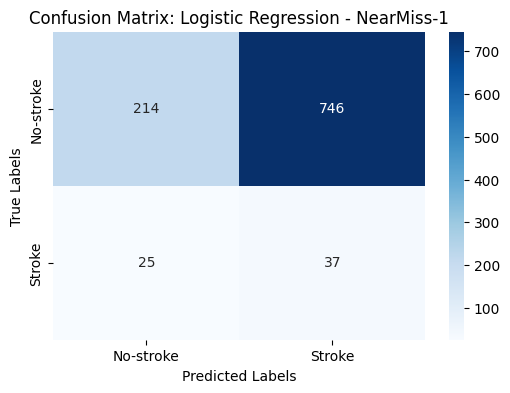

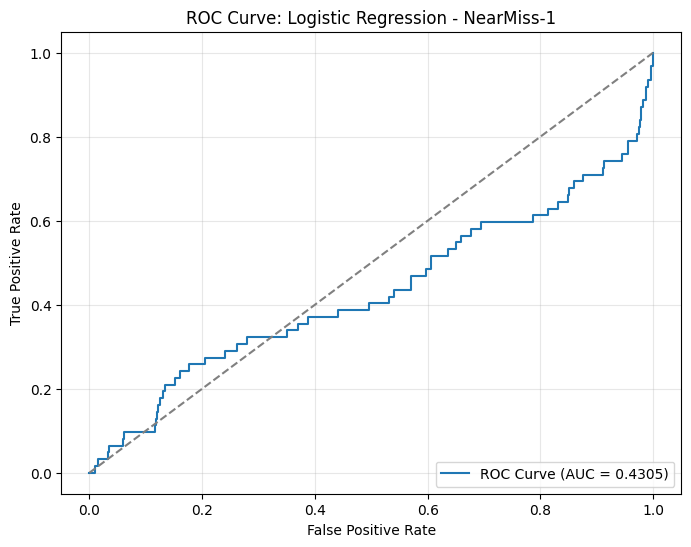


==================== Logistic Regression with NearMiss-2 ====================

Logistic Regression with NearMiss-2 Evaluation Metrics:
Accuracy: 0.6771
Precision: 0.1398
Recall: 0.8387
F1 Score: 0.2396
ROC-AUC Score: 0.7862

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.67      0.80       960
           1       0.14      0.84      0.24        62

    accuracy                           0.68      1022
   macro avg       0.56      0.75      0.52      1022
weighted avg       0.93      0.68      0.76      1022


Confusion Matrix:
[[640 320]
 [ 10  52]]


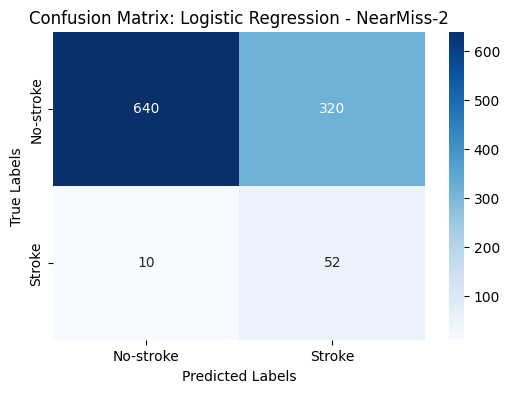

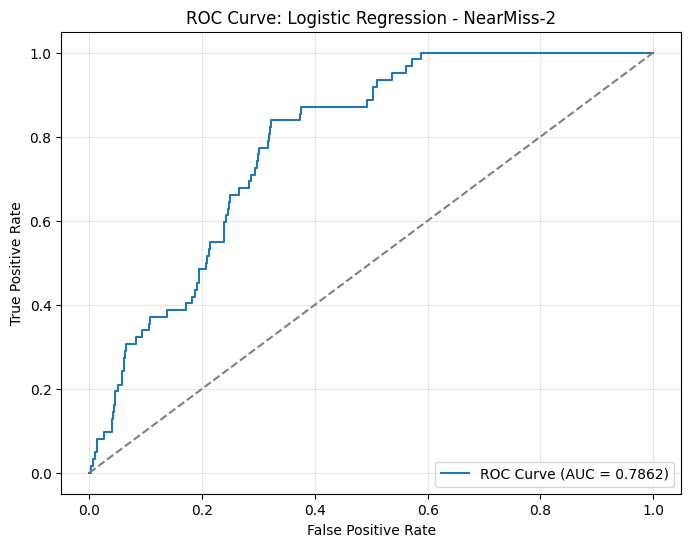


==================== Logistic Regression with NearMiss-3 ====================

Logistic Regression with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7162
Precision: 0.1299
Recall: 0.6452
F1 Score: 0.2162
ROC-AUC Score: 0.7721

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.72      0.83       960
           1       0.13      0.65      0.22        62

    accuracy                           0.72      1022
   macro avg       0.55      0.68      0.52      1022
weighted avg       0.92      0.72      0.79      1022


Confusion Matrix:
[[692 268]
 [ 22  40]]


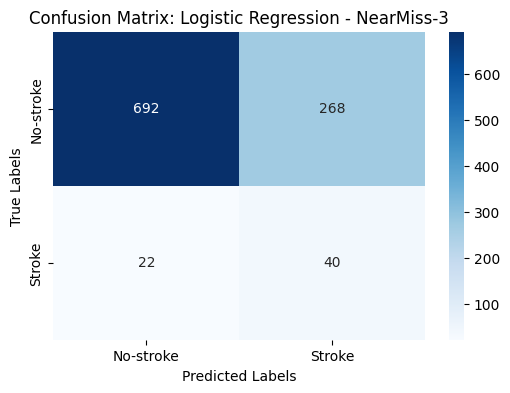

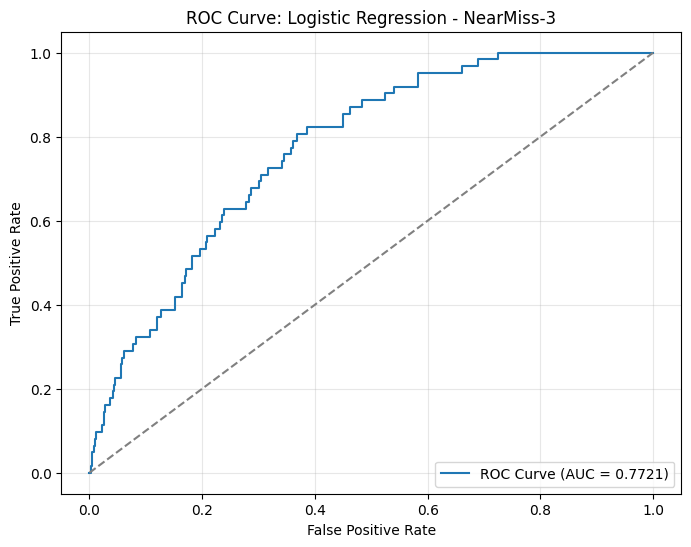


==================== Logistic Regression with Tomek Links ====================

Logistic Regression with Tomek Links Evaluation Metrics:
Accuracy: 0.7476
Precision: 0.1621
Recall: 0.7581
F1 Score: 0.2670
ROC-AUC Score: 0.8506

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.76      0.27        62

    accuracy                           0.75      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[717 243]
 [ 15  47]]


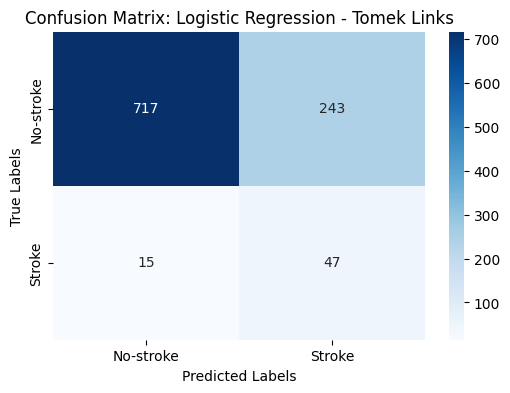

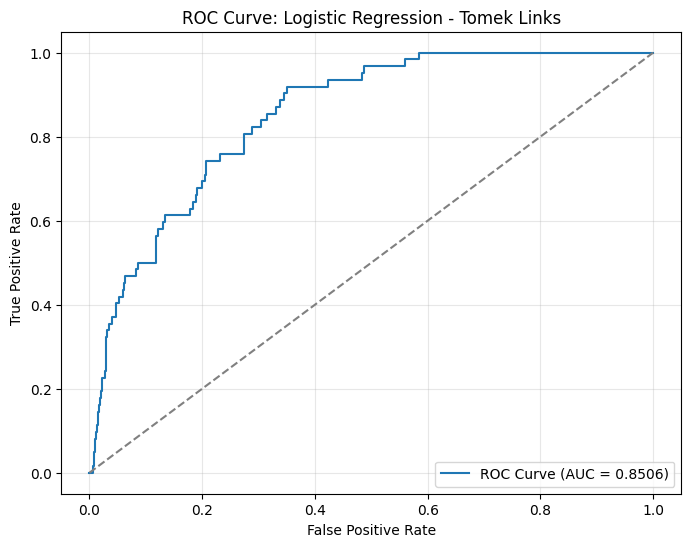


==================== Logistic Regression with Edited Nearest Neighbors (ENN) ====================

Logistic Regression with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.7329
Precision: 0.1541
Recall: 0.7581
F1 Score: 0.2561
ROC-AUC Score: 0.8500

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.73      0.84       960
           1       0.15      0.76      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.73      0.80      1022


Confusion Matrix:
[[702 258]
 [ 15  47]]


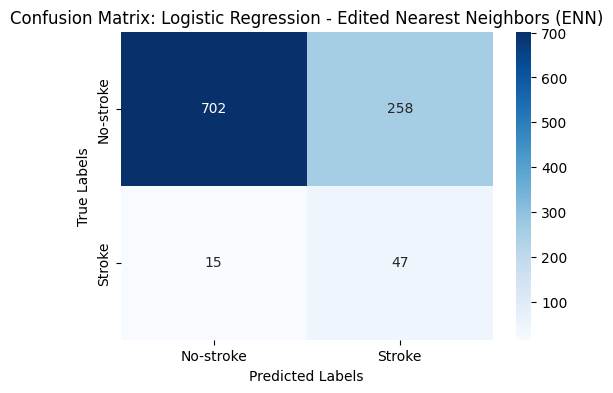

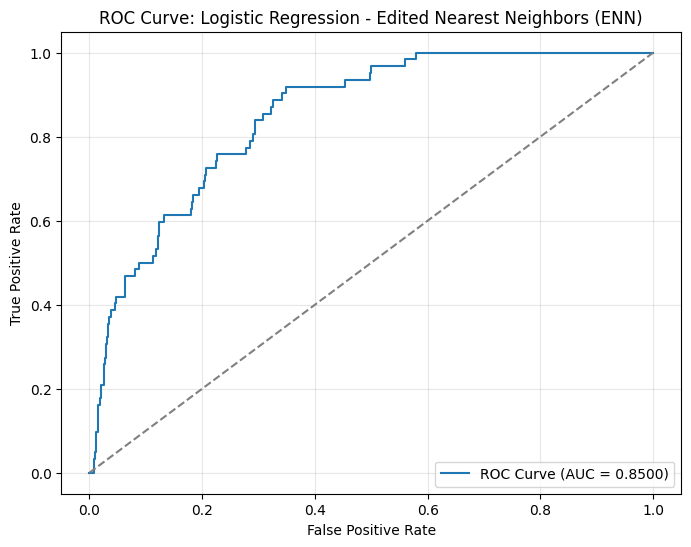


==================== Logistic Regression with Repeated Edited Nearest Neighbors (RENN) ====================

Logistic Regression with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.7153
Precision: 0.1498
Recall: 0.7903
F1 Score: 0.2519
ROC-AUC Score: 0.8491

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.71      0.82       960
           1       0.15      0.79      0.25        62

    accuracy                           0.72      1022
   macro avg       0.57      0.75      0.54      1022
weighted avg       0.93      0.72      0.79      1022


Confusion Matrix:
[[682 278]
 [ 13  49]]


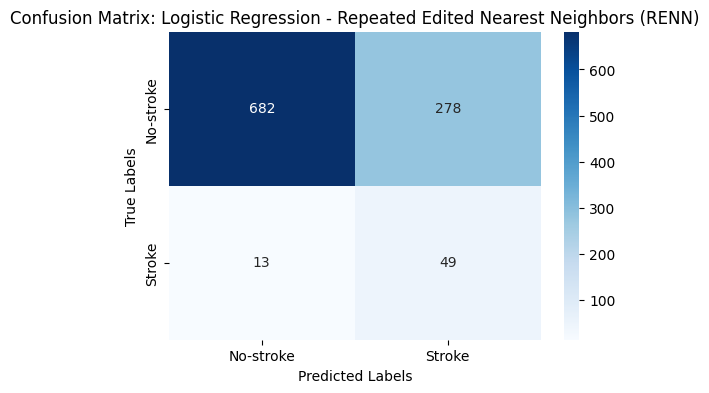

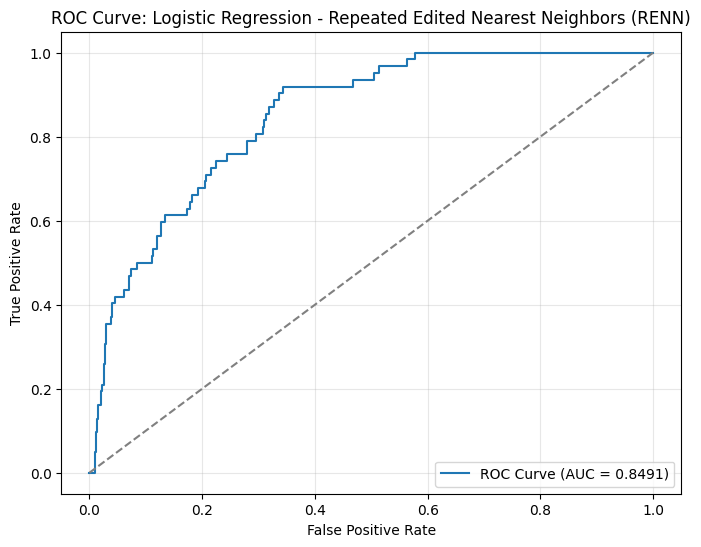


==================== Logistic Regression with All KNN ====================

Logistic Regression with All KNN Evaluation Metrics:
Accuracy: 0.7260
Precision: 0.1506
Recall: 0.7581
F1 Score: 0.2513
ROC-AUC Score: 0.8496

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.76      0.25        62

    accuracy                           0.73      1022
   macro avg       0.56      0.74      0.54      1022
weighted avg       0.93      0.73      0.80      1022


Confusion Matrix:
[[695 265]
 [ 15  47]]


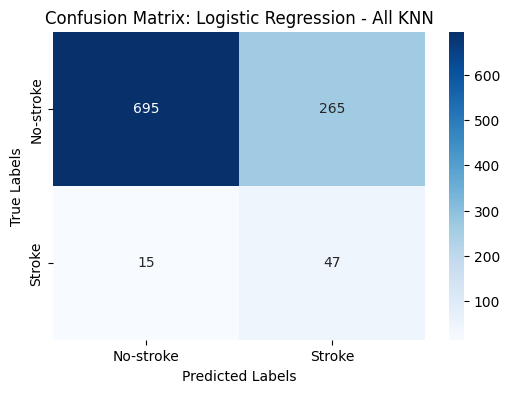

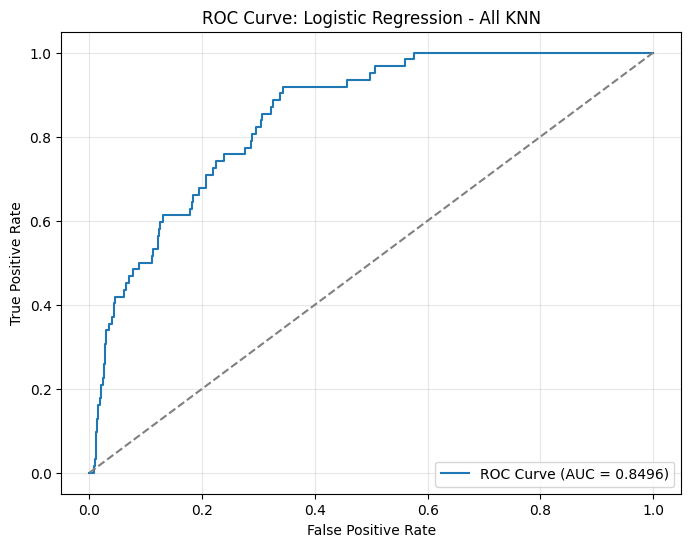


==================== Logistic Regression with Condensed Nearest Neighbor (CNN) ====================

Logistic Regression with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.8346
Precision: 0.1977
Recall: 0.5645
F1 Score: 0.2929
ROC-AUC Score: 0.8177

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.85      0.91       960
           1       0.20      0.56      0.29        62

    accuracy                           0.83      1022
   macro avg       0.58      0.71      0.60      1022
weighted avg       0.92      0.83      0.87      1022


Confusion Matrix:
[[818 142]
 [ 27  35]]


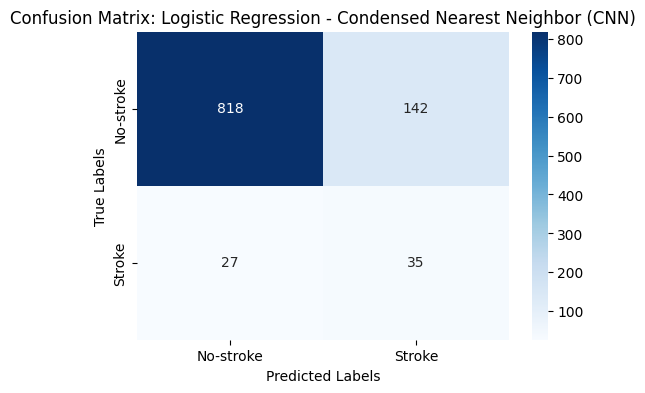

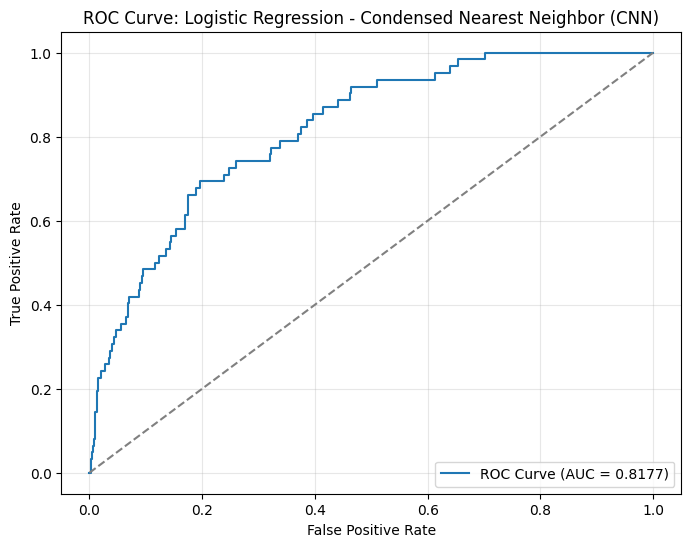


==================== Logistic Regression with One-Sided Selection (OSS) ====================

Logistic Regression with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.7466
Precision: 0.1615
Recall: 0.7581
F1 Score: 0.2663
ROC-AUC Score: 0.8508

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.76      0.27        62

    accuracy                           0.75      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[716 244]
 [ 15  47]]


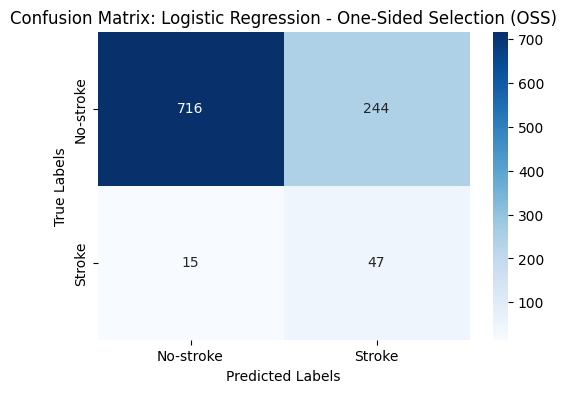

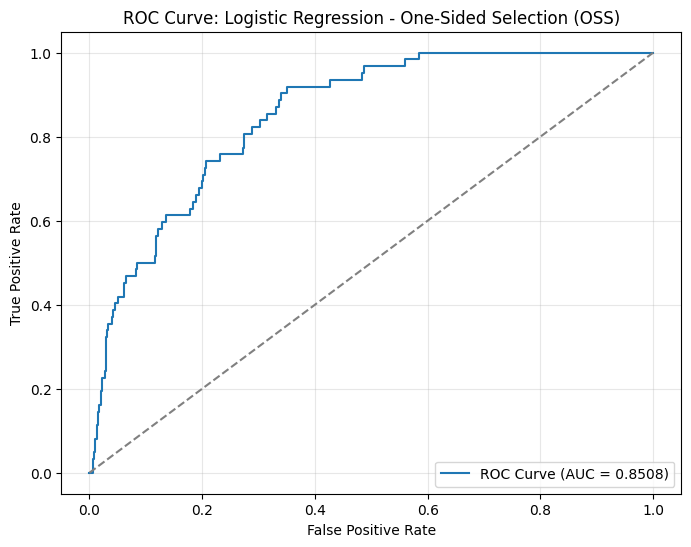


==================== Logistic Regression with Neighborhood Cleaning Rule (NCR) ====================

Logistic Regression with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.7368
Precision: 0.1561
Recall: 0.7581
F1 Score: 0.2590
ROC-AUC Score: 0.8494

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.16      0.76      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.74      0.80      1022


Confusion Matrix:
[[706 254]
 [ 15  47]]


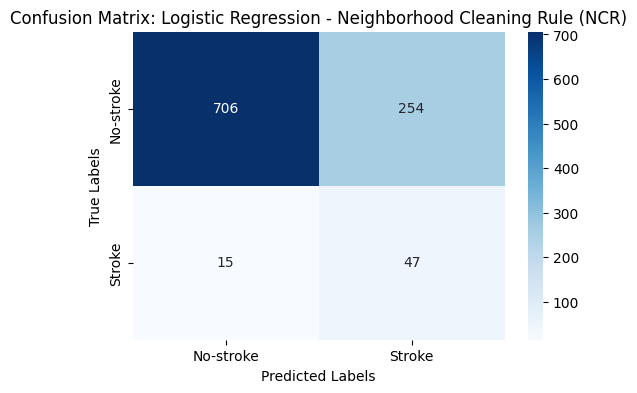

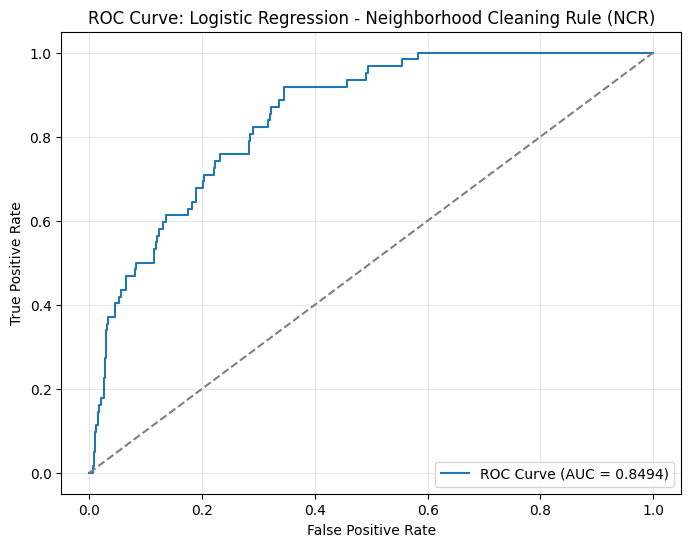


==================== Logistic Regression with Instance Hardness Threshold ====================

Logistic Regression with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.6155
Precision: 0.1281
Recall: 0.9194
F1 Score: 0.2249
ROC-AUC Score: 0.8427

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.60      0.74       960
           1       0.13      0.92      0.22        62

    accuracy                           0.62      1022
   macro avg       0.56      0.76      0.48      1022
weighted avg       0.94      0.62      0.71      1022


Confusion Matrix:
[[572 388]
 [  5  57]]


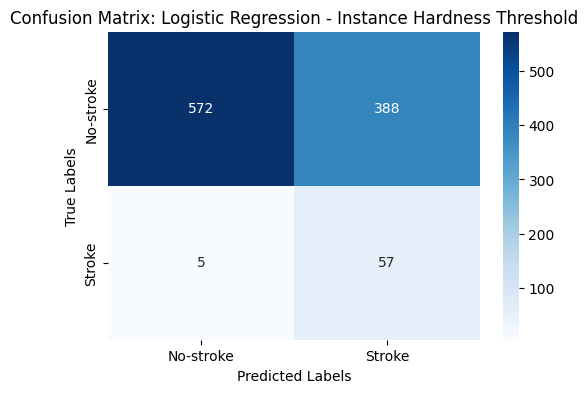

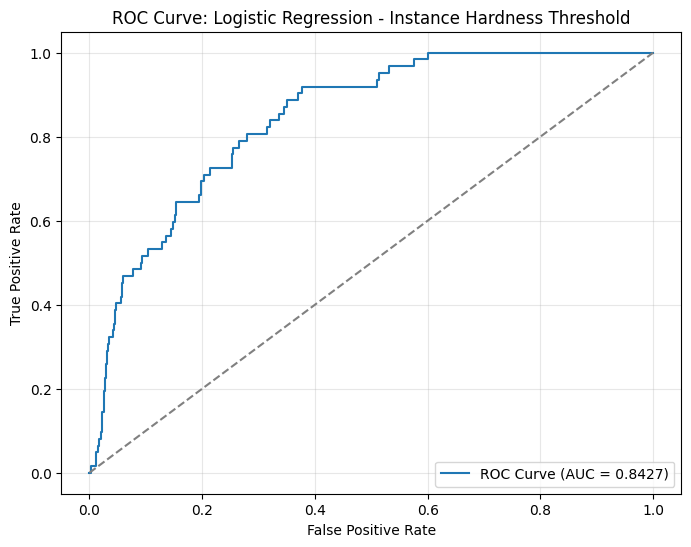


==================== SVM with None ====================

SVM with None Evaluation Metrics:
Accuracy: 0.7622
Precision: 0.1451
Recall: 0.5968
F1 Score: 0.2334
ROC-AUC Score: 0.7846

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.77      0.86       960
           1       0.15      0.60      0.23        62

    accuracy                           0.76      1022
   macro avg       0.56      0.68      0.55      1022
weighted avg       0.92      0.76      0.82      1022


Confusion Matrix:
[[742 218]
 [ 25  37]]


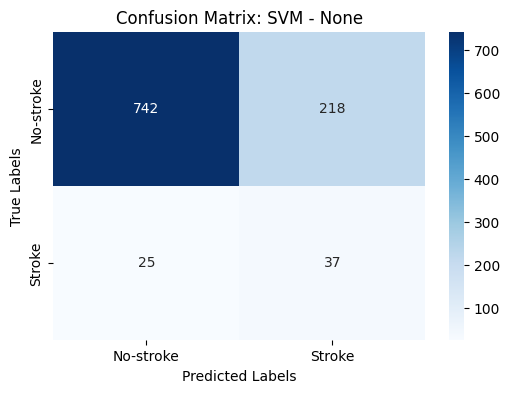

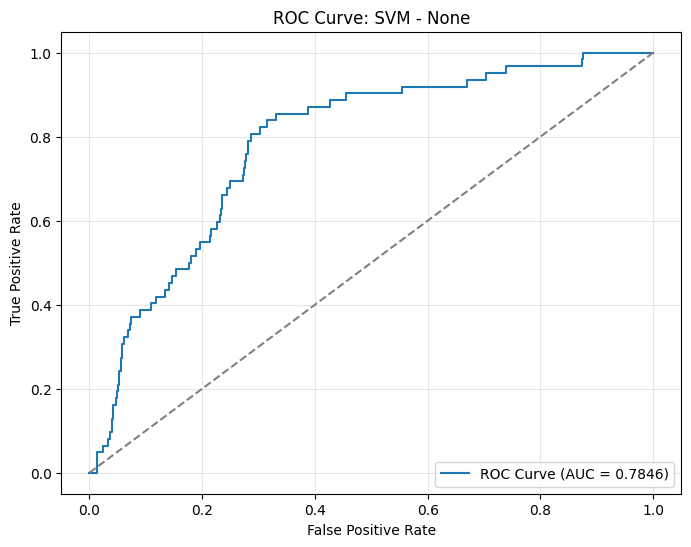


==================== SVM with SMOTE ====================

SVM with SMOTE Evaluation Metrics:
Accuracy: 0.8063
Precision: 0.1264
Recall: 0.3710
F1 Score: 0.1885
ROC-AUC Score: 0.7235

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.83      0.89       960
           1       0.13      0.37      0.19        62

    accuracy                           0.81      1022
   macro avg       0.54      0.60      0.54      1022
weighted avg       0.90      0.81      0.85      1022


Confusion Matrix:
[[801 159]
 [ 39  23]]


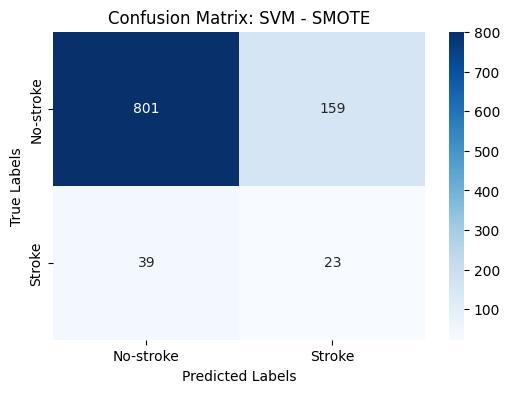

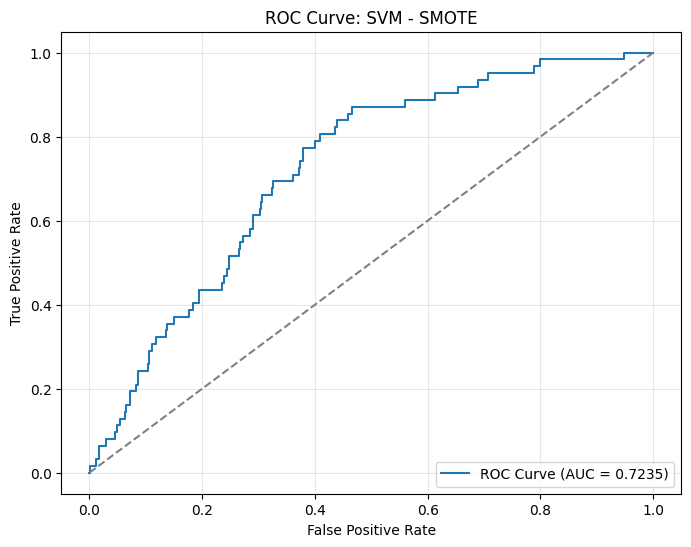


==================== SVM with ClusterCentroids ====================

SVM with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2045
Precision: 0.0679
Recall: 0.9516
F1 Score: 0.1267
ROC-AUC Score: 0.6460

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.16      0.27       960
           1       0.07      0.95      0.13        62

    accuracy                           0.20      1022
   macro avg       0.52      0.55      0.20      1022
weighted avg       0.93      0.20      0.26      1022


Confusion Matrix:
[[150 810]
 [  3  59]]


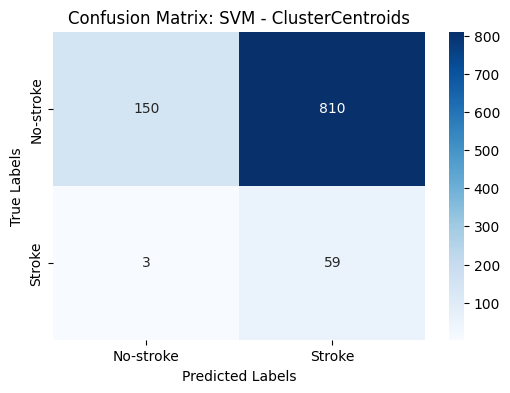

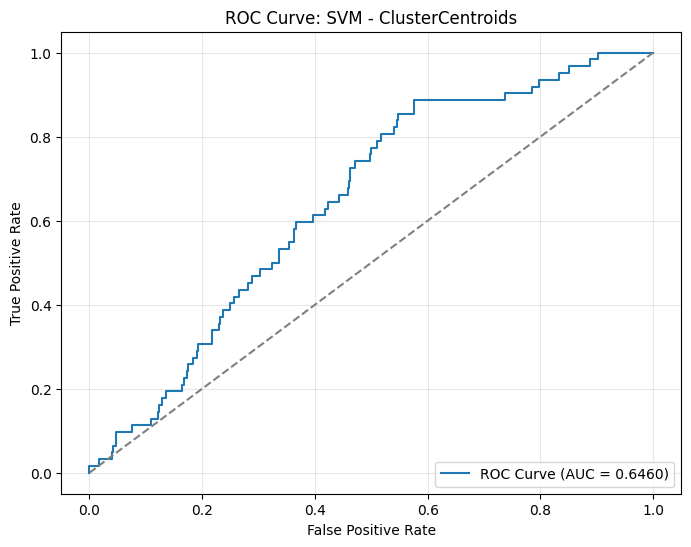


==================== SVM with Random Undersampling ====================

SVM with Random Undersampling Evaluation Metrics:
Accuracy: 0.7241
Precision: 0.1519
Recall: 0.7742
F1 Score: 0.2540
ROC-AUC Score: 0.8136

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.77      0.25        62

    accuracy                           0.72      1022
   macro avg       0.57      0.75      0.54      1022
weighted avg       0.93      0.72      0.80      1022


Confusion Matrix:
[[692 268]
 [ 14  48]]


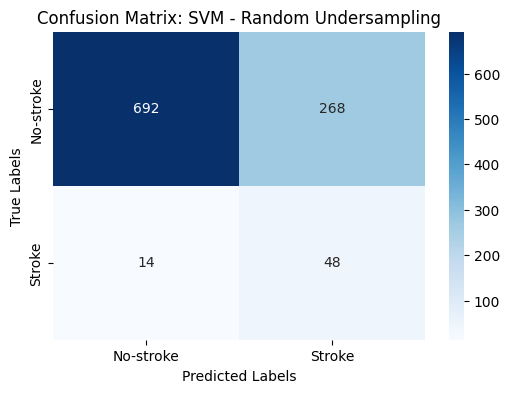

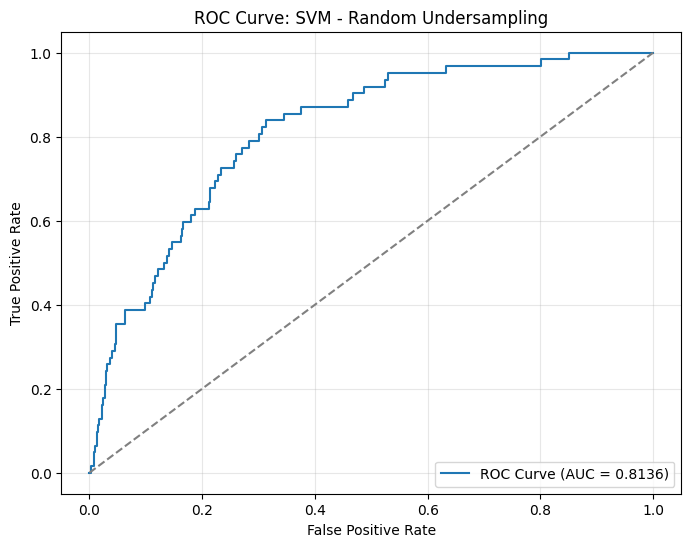


==================== SVM with NearMiss-1 ====================

SVM with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2808
Precision: 0.0471
Recall: 0.5645
F1 Score: 0.0870
ROC-AUC Score: 0.4107

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.26      0.41       960
           1       0.05      0.56      0.09        62

    accuracy                           0.28      1022
   macro avg       0.48      0.41      0.25      1022
weighted avg       0.85      0.28      0.39      1022


Confusion Matrix:
[[252 708]
 [ 27  35]]


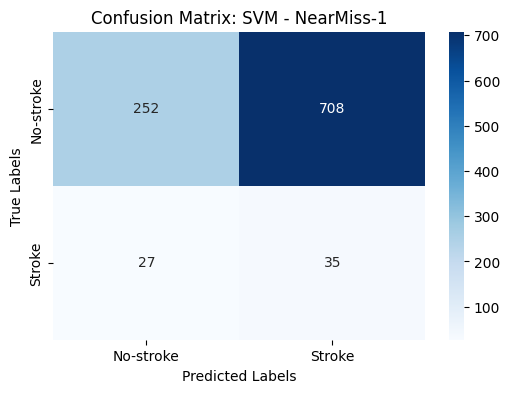

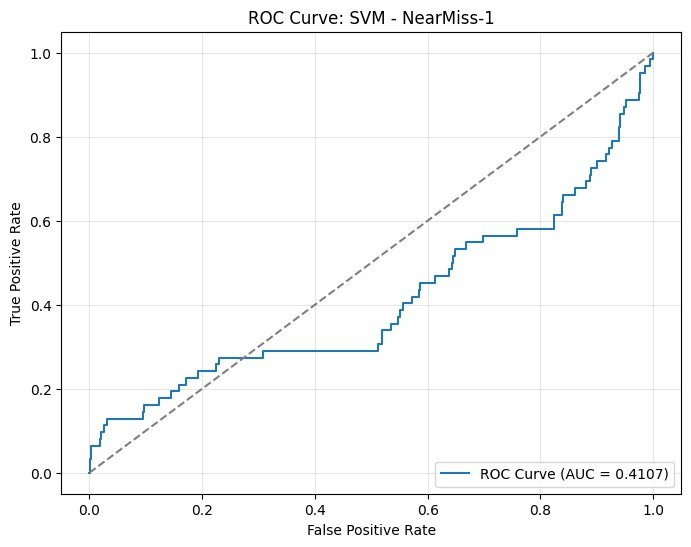


==================== SVM with NearMiss-2 ====================

SVM with NearMiss-2 Evaluation Metrics:
Accuracy: 0.3014
Precision: 0.0699
Recall: 0.8548
F1 Score: 0.1293
ROC-AUC Score: 0.7043

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.27      0.42       960
           1       0.07      0.85      0.13        62

    accuracy                           0.30      1022
   macro avg       0.52      0.56      0.27      1022
weighted avg       0.91      0.30      0.40      1022


Confusion Matrix:
[[255 705]
 [  9  53]]


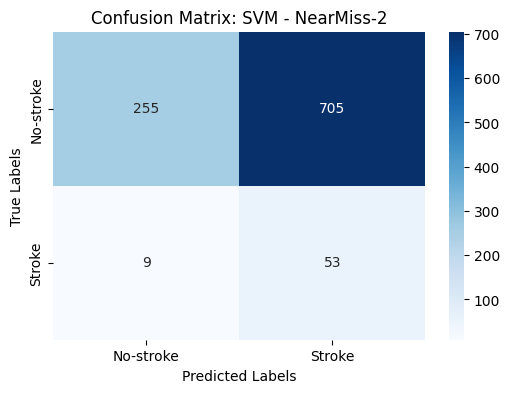

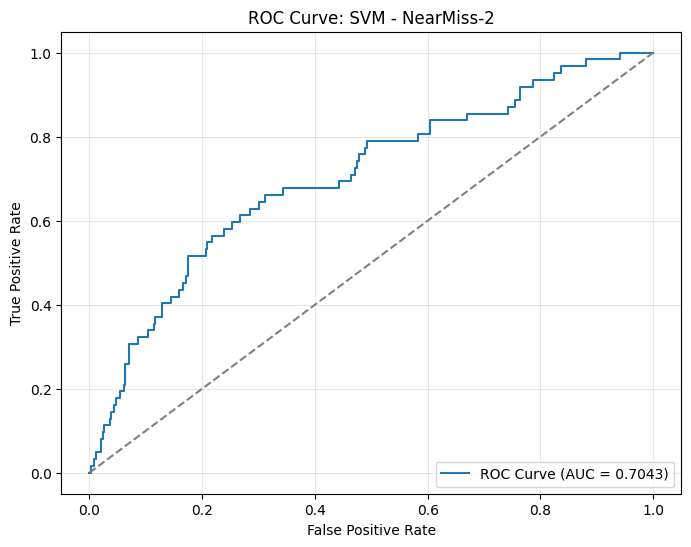


==================== SVM with NearMiss-3 ====================

SVM with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7427
Precision: 0.1345
Recall: 0.5968
F1 Score: 0.2196
ROC-AUC Score: 0.6834

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.75      0.85       960
           1       0.13      0.60      0.22        62

    accuracy                           0.74      1022
   macro avg       0.55      0.67      0.53      1022
weighted avg       0.92      0.74      0.81      1022


Confusion Matrix:
[[722 238]
 [ 25  37]]


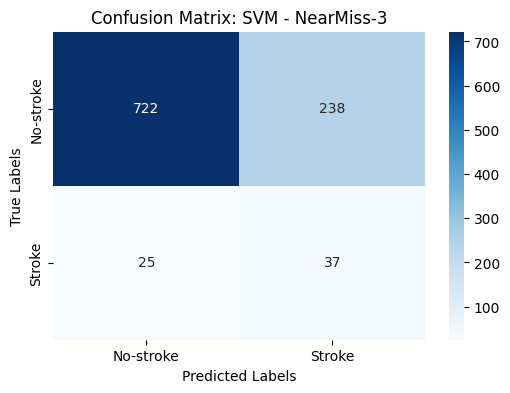

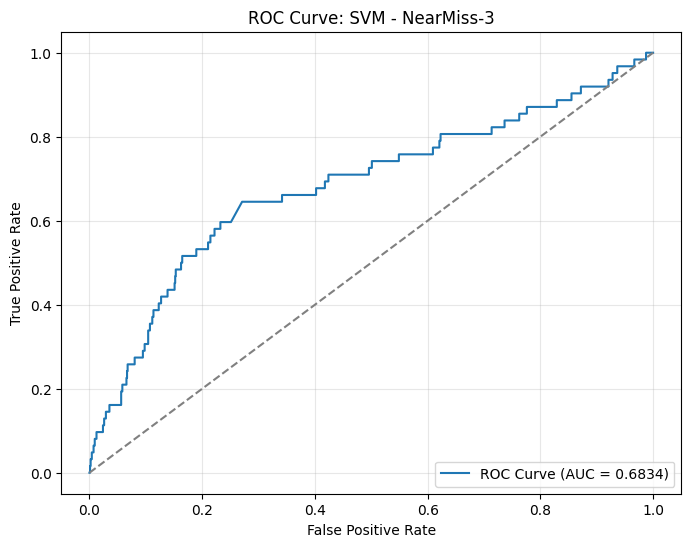


==================== SVM with Tomek Links ====================

SVM with Tomek Links Evaluation Metrics:
Accuracy: 0.7632
Precision: 0.1457
Recall: 0.5968
F1 Score: 0.2342
ROC-AUC Score: 0.7864

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.77      0.86       960
           1       0.15      0.60      0.23        62

    accuracy                           0.76      1022
   macro avg       0.56      0.69      0.55      1022
weighted avg       0.92      0.76      0.82      1022


Confusion Matrix:
[[743 217]
 [ 25  37]]


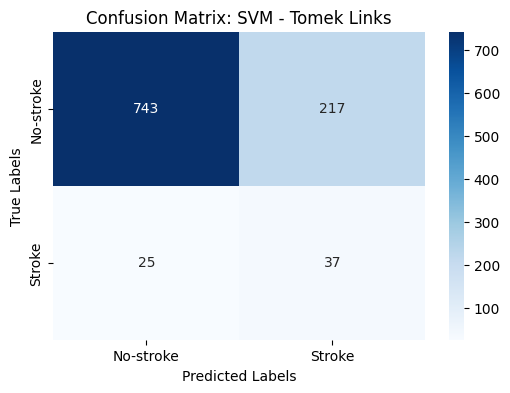

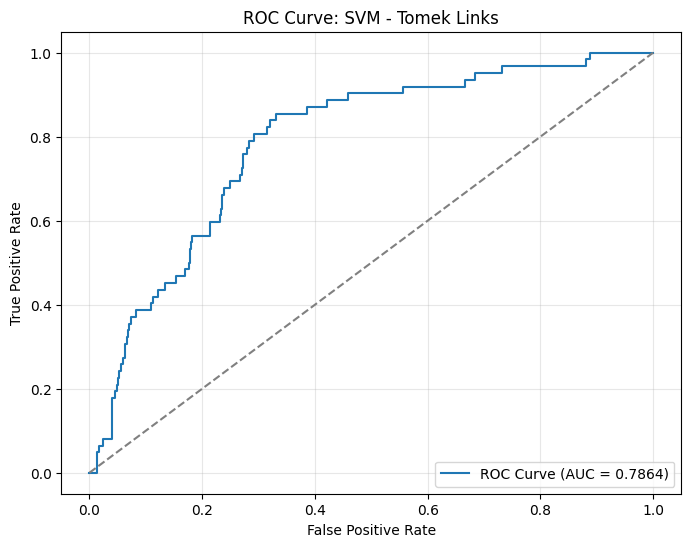


==================== SVM with Edited Nearest Neighbors (ENN) ====================

SVM with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.7593
Precision: 0.1567
Recall: 0.6774
F1 Score: 0.2545
ROC-AUC Score: 0.7932

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.76      0.86       960
           1       0.16      0.68      0.25        62

    accuracy                           0.76      1022
   macro avg       0.57      0.72      0.56      1022
weighted avg       0.92      0.76      0.82      1022


Confusion Matrix:
[[734 226]
 [ 20  42]]


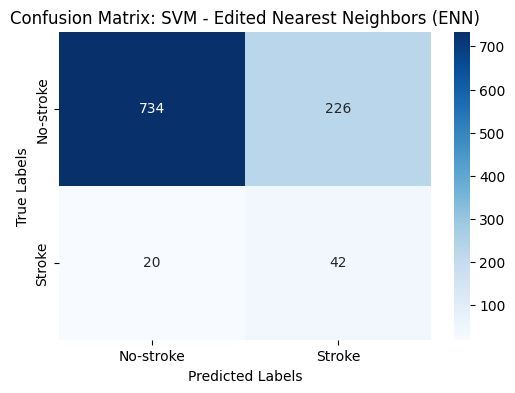

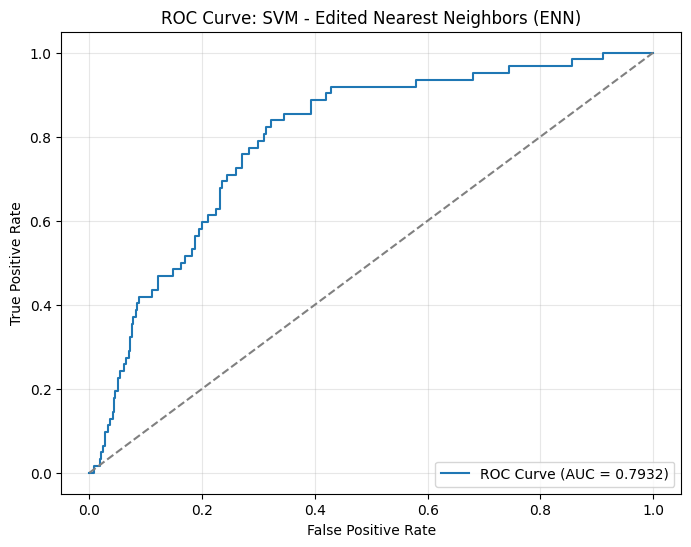


==================== SVM with Repeated Edited Nearest Neighbors (RENN) ====================

SVM with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.7613
Precision: 0.1604
Recall: 0.6935
F1 Score: 0.2606
ROC-AUC Score: 0.7939

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.77      0.86       960
           1       0.16      0.69      0.26        62

    accuracy                           0.76      1022
   macro avg       0.57      0.73      0.56      1022
weighted avg       0.93      0.76      0.82      1022


Confusion Matrix:
[[735 225]
 [ 19  43]]


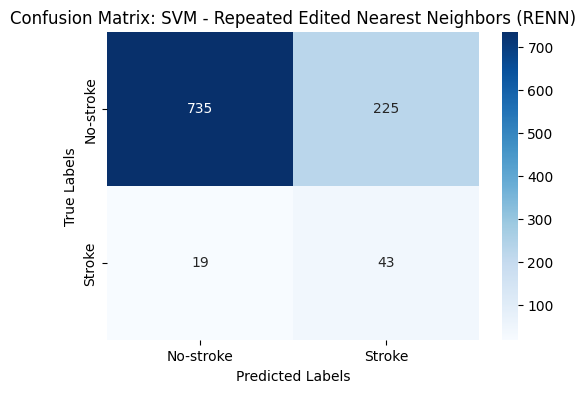

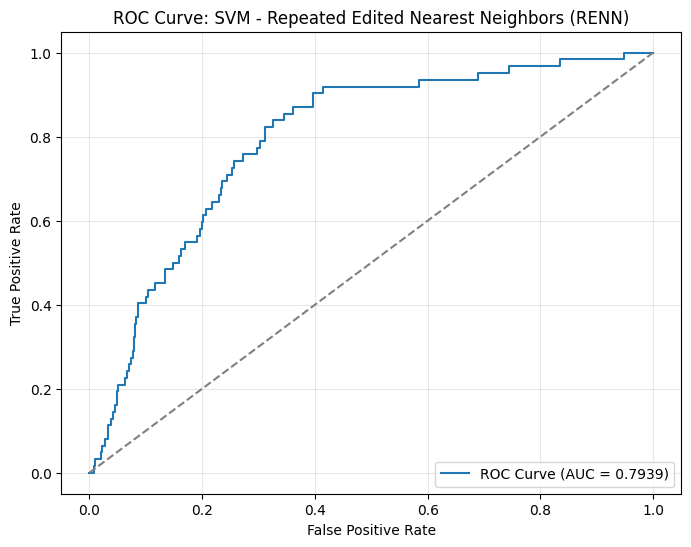


==================== SVM with All KNN ====================

SVM with All KNN Evaluation Metrics:
Accuracy: 0.7613
Precision: 0.1579
Recall: 0.6774
F1 Score: 0.2561
ROC-AUC Score: 0.7945

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.77      0.86       960
           1       0.16      0.68      0.26        62

    accuracy                           0.76      1022
   macro avg       0.57      0.72      0.56      1022
weighted avg       0.92      0.76      0.82      1022


Confusion Matrix:
[[736 224]
 [ 20  42]]


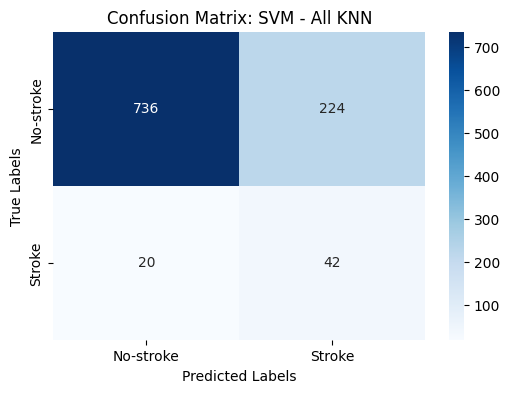

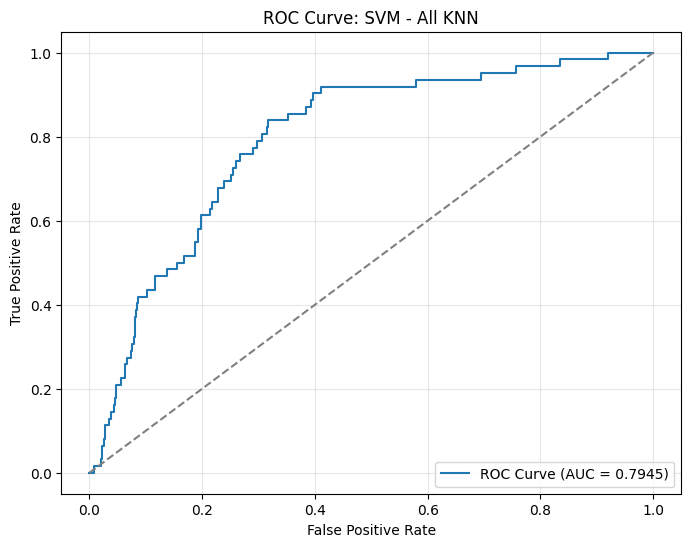


==================== SVM with Condensed Nearest Neighbor (CNN) ====================

SVM with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.8219
Precision: 0.1875
Recall: 0.5806
F1 Score: 0.2835
ROC-AUC Score: 0.7374

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.84      0.90       960
           1       0.19      0.58      0.28        62

    accuracy                           0.82      1022
   macro avg       0.58      0.71      0.59      1022
weighted avg       0.92      0.82      0.86      1022


Confusion Matrix:
[[804 156]
 [ 26  36]]


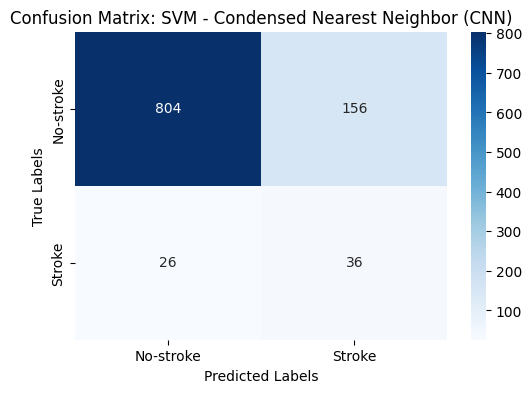

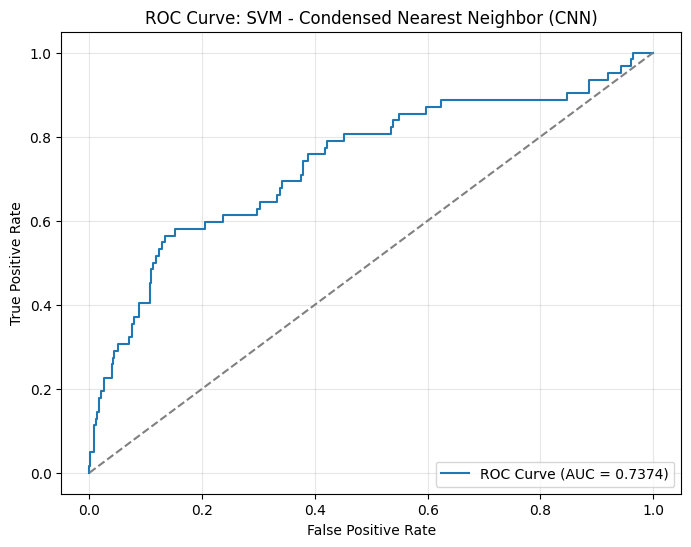


==================== SVM with One-Sided Selection (OSS) ====================

SVM with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.7613
Precision: 0.1445
Recall: 0.5968
F1 Score: 0.2327
ROC-AUC Score: 0.7867

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.77      0.86       960
           1       0.14      0.60      0.23        62

    accuracy                           0.76      1022
   macro avg       0.56      0.68      0.55      1022
weighted avg       0.92      0.76      0.82      1022


Confusion Matrix:
[[741 219]
 [ 25  37]]


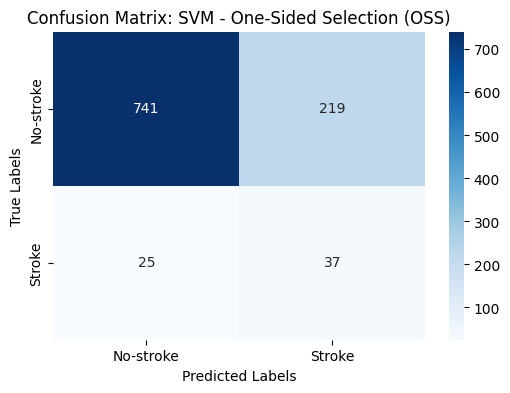

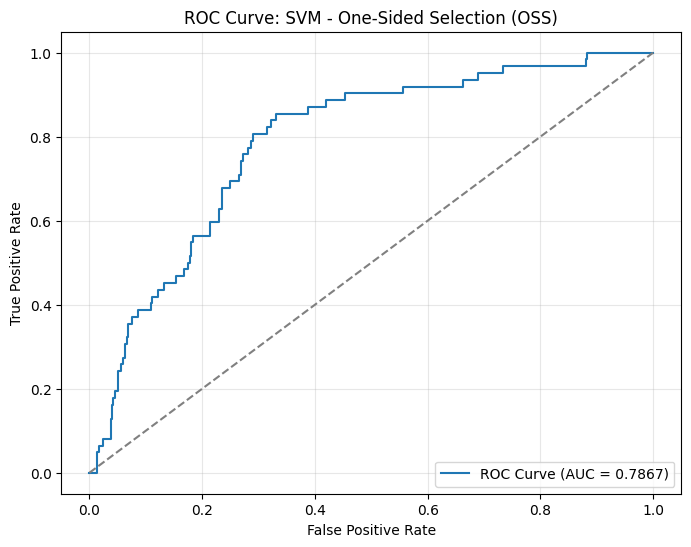


==================== SVM with Neighborhood Cleaning Rule (NCR) ====================

SVM with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.7554
Precision: 0.1493
Recall: 0.6452
F1 Score: 0.2424
ROC-AUC Score: 0.7908

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.76      0.85       960
           1       0.15      0.65      0.24        62

    accuracy                           0.76      1022
   macro avg       0.56      0.70      0.55      1022
weighted avg       0.92      0.76      0.82      1022


Confusion Matrix:
[[732 228]
 [ 22  40]]


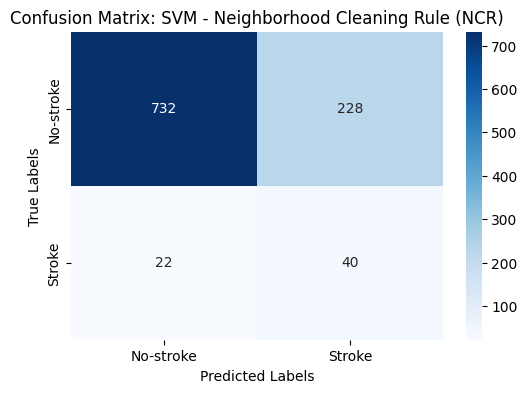

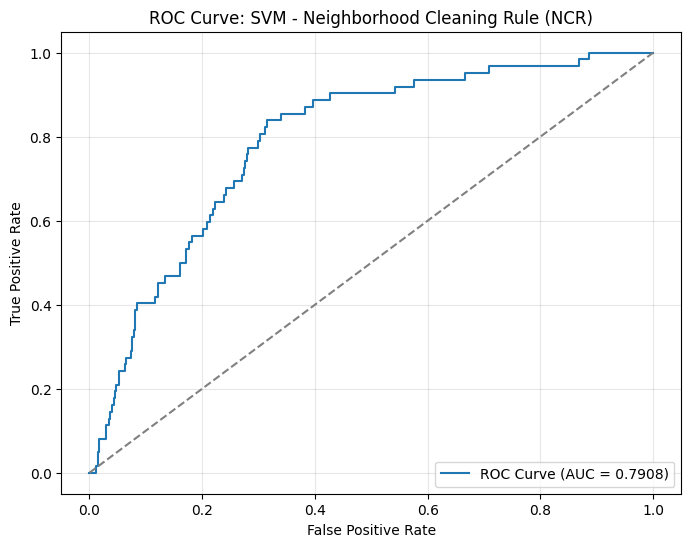


==================== SVM with Instance Hardness Threshold ====================

SVM with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.6477
Precision: 0.1294
Recall: 0.8387
F1 Score: 0.2241
ROC-AUC Score: 0.7798

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.64      0.77       960
           1       0.13      0.84      0.22        62

    accuracy                           0.65      1022
   macro avg       0.56      0.74      0.50      1022
weighted avg       0.93      0.65      0.74      1022


Confusion Matrix:
[[610 350]
 [ 10  52]]


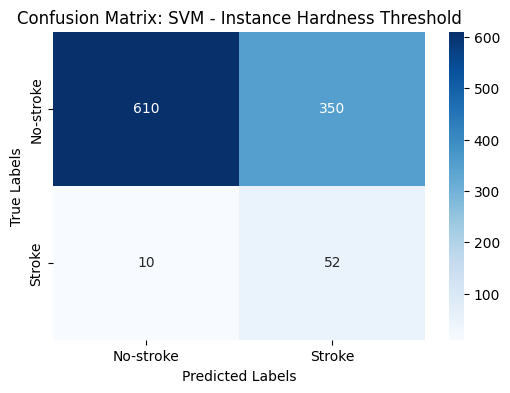

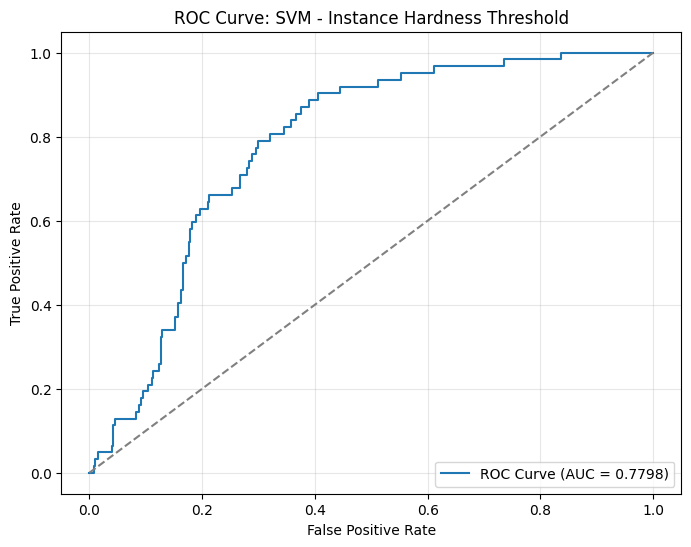


==================== Decision Tree with None ====================

Decision Tree with None Evaluation Metrics:
Accuracy: 0.9198
Precision: 0.2368
Recall: 0.1452
F1 Score: 0.1800
ROC-AUC Score: 0.5575

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.24      0.15      0.18        62

    accuracy                           0.92      1022
   macro avg       0.59      0.56      0.57      1022
weighted avg       0.90      0.92      0.91      1022


Confusion Matrix:
[[931  29]
 [ 53   9]]


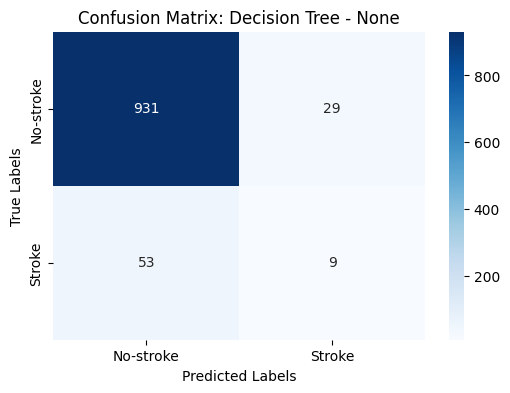

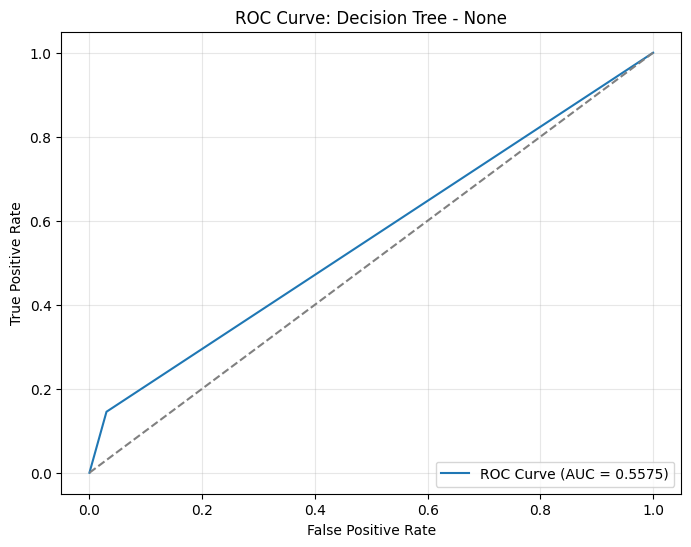


==================== Decision Tree with SMOTE ====================

Decision Tree with SMOTE Evaluation Metrics:
Accuracy: 0.8679
Precision: 0.1237
Recall: 0.1935
F1 Score: 0.1509
ROC-AUC Score: 0.5525

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       960
           1       0.12      0.19      0.15        62

    accuracy                           0.87      1022
   macro avg       0.53      0.55      0.54      1022
weighted avg       0.90      0.87      0.88      1022


Confusion Matrix:
[[875  85]
 [ 50  12]]


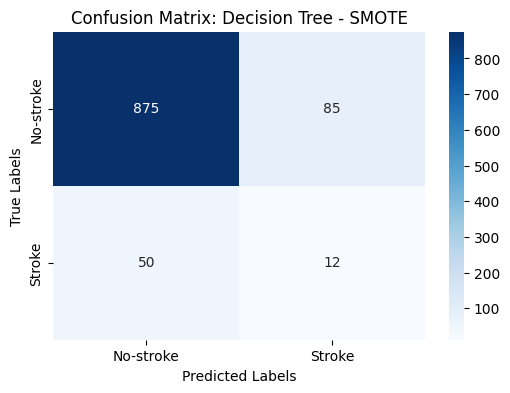

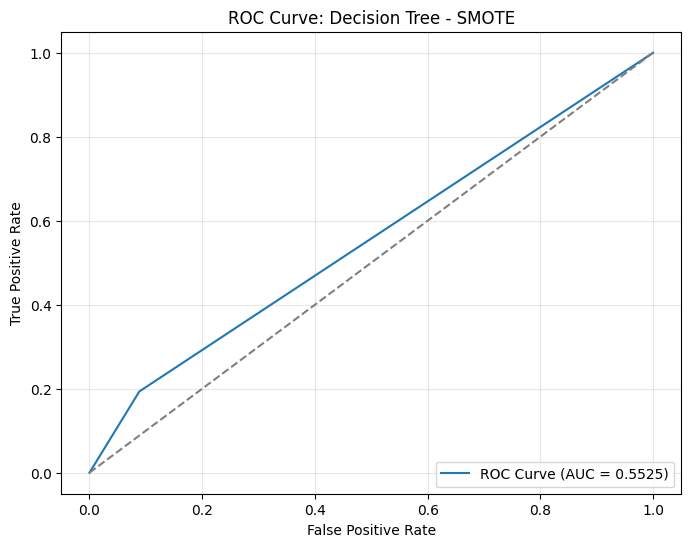


==================== Decision Tree with ClusterCentroids ====================

Decision Tree with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2789
Precision: 0.0722
Recall: 0.9194
F1 Score: 0.1340
ROC-AUC Score: 0.5784

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.24      0.38       960
           1       0.07      0.92      0.13        62

    accuracy                           0.28      1022
   macro avg       0.53      0.58      0.26      1022
weighted avg       0.92      0.28      0.37      1022


Confusion Matrix:
[[228 732]
 [  5  57]]


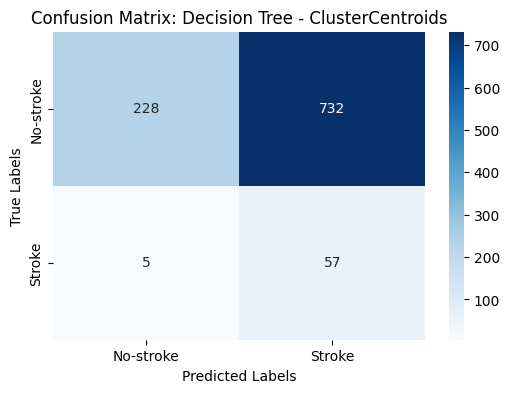

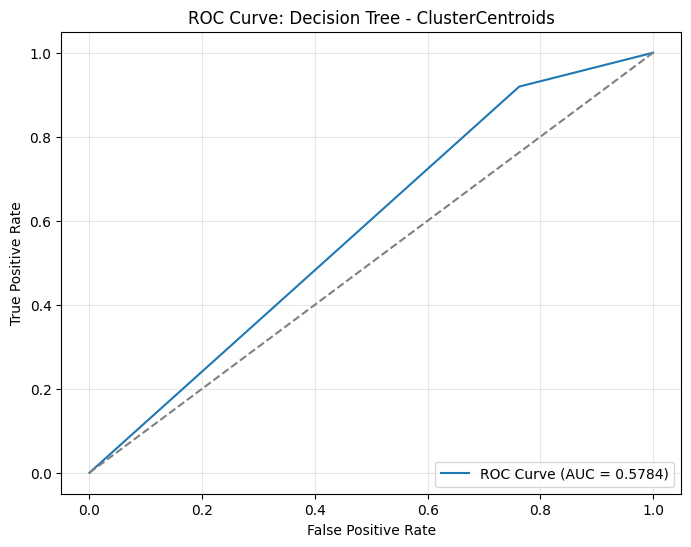


==================== Decision Tree with Random Undersampling ====================

Decision Tree with Random Undersampling Evaluation Metrics:
Accuracy: 0.6908
Precision: 0.1220
Recall: 0.6613
F1 Score: 0.2060
ROC-AUC Score: 0.6770

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.69      0.81       960
           1       0.12      0.66      0.21        62

    accuracy                           0.69      1022
   macro avg       0.55      0.68      0.51      1022
weighted avg       0.92      0.69      0.77      1022


Confusion Matrix:
[[665 295]
 [ 21  41]]


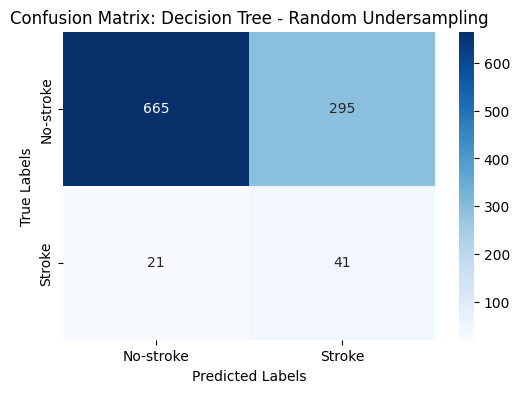

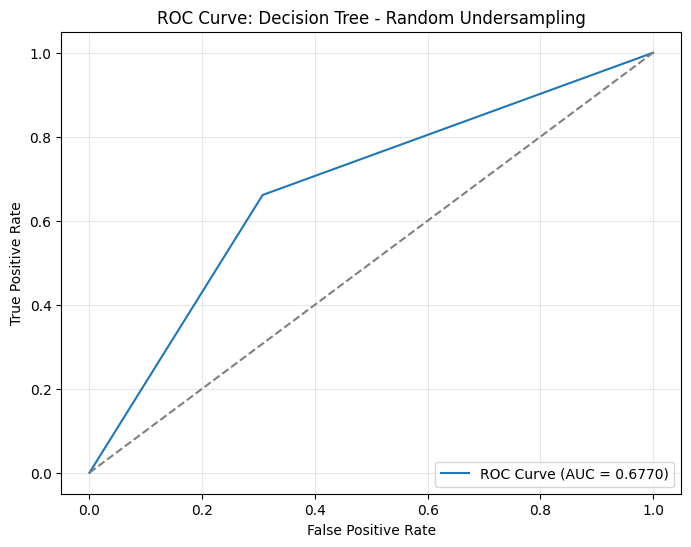


==================== Decision Tree with NearMiss-1 ====================

Decision Tree with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1634
Precision: 0.0406
Recall: 0.5645
F1 Score: 0.0757
ROC-AUC Score: 0.3510

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.14      0.24       960
           1       0.04      0.56      0.08        62

    accuracy                           0.16      1022
   macro avg       0.44      0.35      0.16      1022
weighted avg       0.78      0.16      0.23      1022


Confusion Matrix:
[[132 828]
 [ 27  35]]


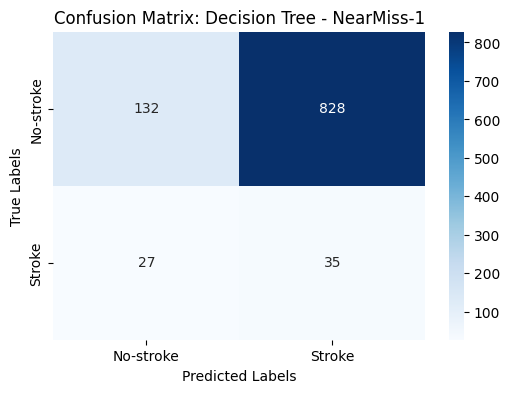

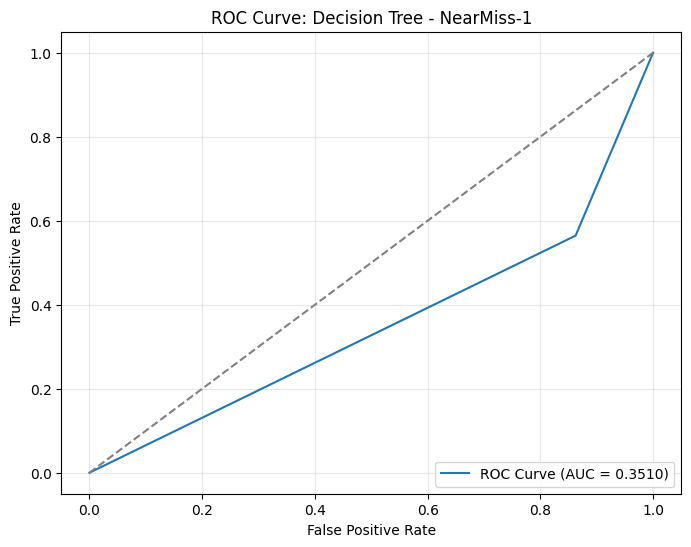


==================== Decision Tree with NearMiss-2 ====================

Decision Tree with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1115
Precision: 0.0621
Recall: 0.9677
F1 Score: 0.1167
ROC-AUC Score: 0.5120

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.06      0.11       960
           1       0.06      0.97      0.12        62

    accuracy                           0.11      1022
   macro avg       0.51      0.51      0.11      1022
weighted avg       0.91      0.11      0.11      1022


Confusion Matrix:
[[ 54 906]
 [  2  60]]


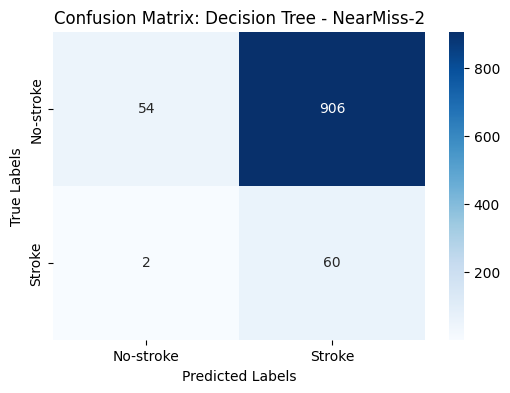

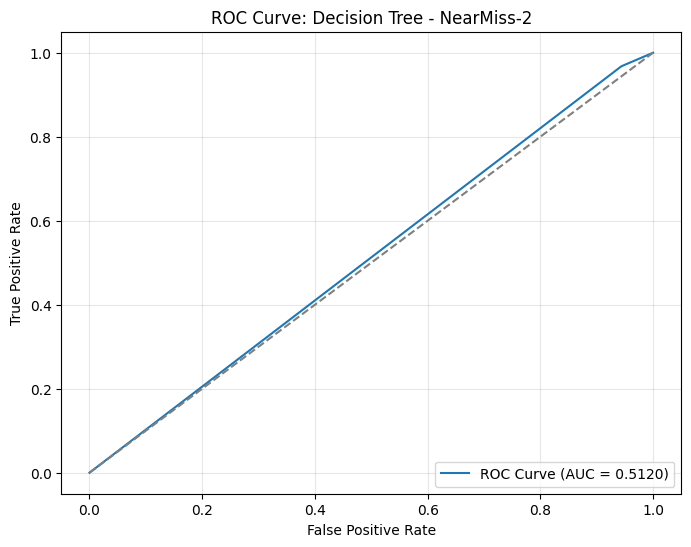


==================== Decision Tree with NearMiss-3 ====================

Decision Tree with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6468
Precision: 0.0926
Recall: 0.5484
F1 Score: 0.1585
ROC-AUC Score: 0.6008

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.65      0.78       960
           1       0.09      0.55      0.16        62

    accuracy                           0.65      1022
   macro avg       0.52      0.60      0.47      1022
weighted avg       0.90      0.65      0.74      1022


Confusion Matrix:
[[627 333]
 [ 28  34]]


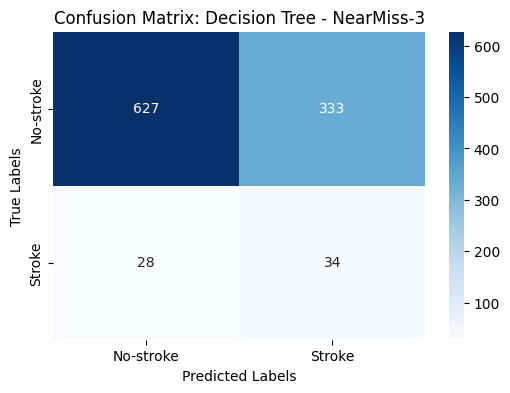

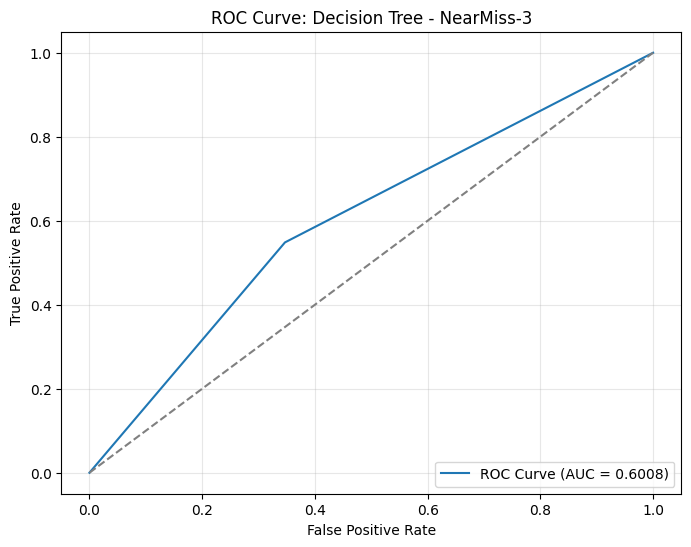


==================== Decision Tree with Tomek Links ====================

Decision Tree with Tomek Links Evaluation Metrics:
Accuracy: 0.9100
Precision: 0.2000
Recall: 0.1613
F1 Score: 0.1786
ROC-AUC Score: 0.5598

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       960
           1       0.20      0.16      0.18        62

    accuracy                           0.91      1022
   macro avg       0.57      0.56      0.57      1022
weighted avg       0.90      0.91      0.91      1022


Confusion Matrix:
[[920  40]
 [ 52  10]]


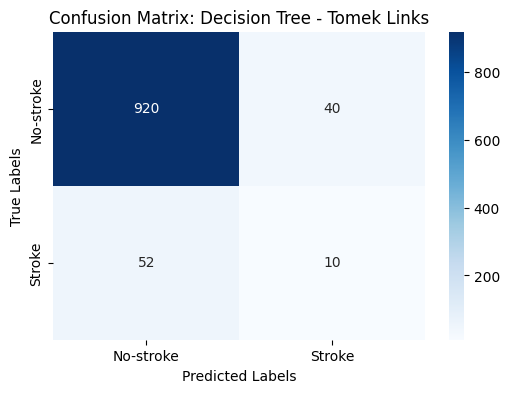

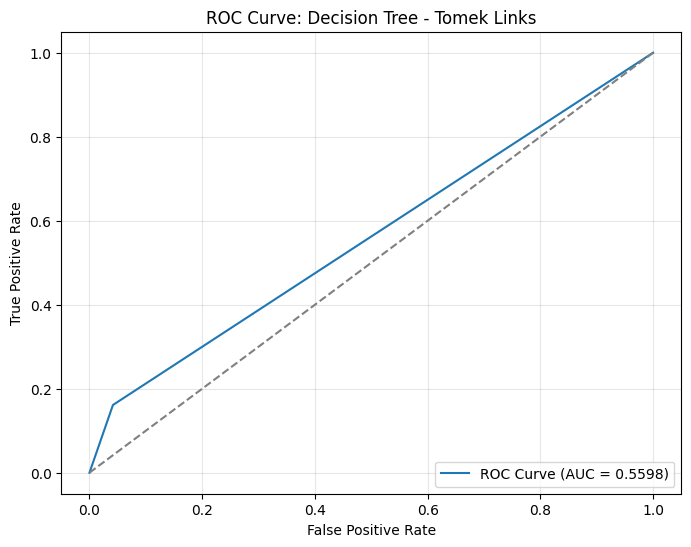


==================== Decision Tree with Edited Nearest Neighbors (ENN) ====================

Decision Tree with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.8914
Precision: 0.1549
Recall: 0.1774
F1 Score: 0.1654
ROC-AUC Score: 0.5575

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       960
           1       0.15      0.18      0.17        62

    accuracy                           0.89      1022
   macro avg       0.55      0.56      0.55      1022
weighted avg       0.90      0.89      0.89      1022


Confusion Matrix:
[[900  60]
 [ 51  11]]


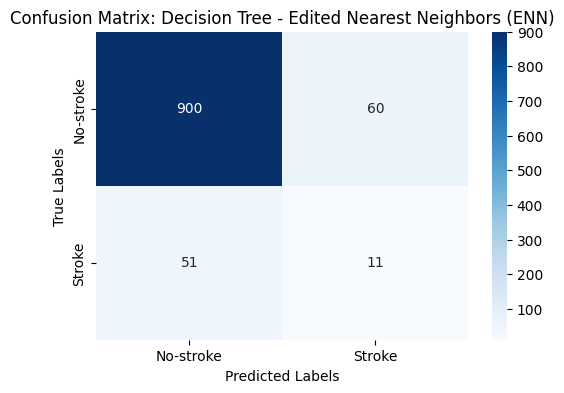

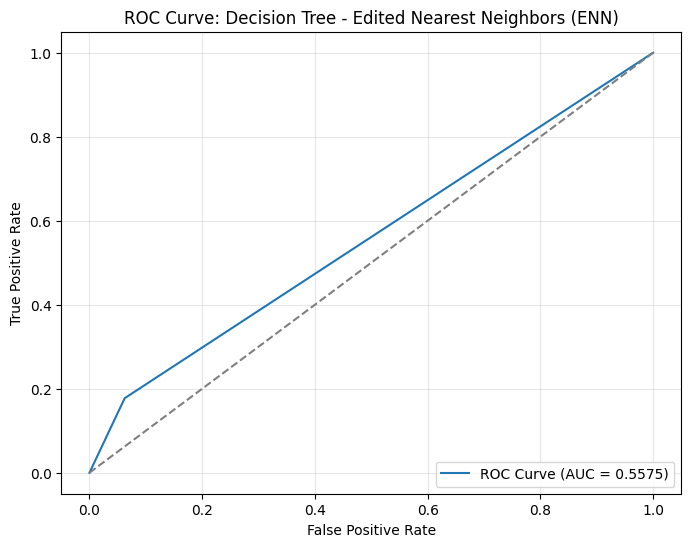


==================== Decision Tree with Repeated Edited Nearest Neighbors (RENN) ====================

Decision Tree with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8748
Precision: 0.2000
Recall: 0.3548
F1 Score: 0.2558
ROC-AUC Score: 0.6316

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.91      0.93       960
           1       0.20      0.35      0.26        62

    accuracy                           0.87      1022
   macro avg       0.58      0.63      0.59      1022
weighted avg       0.91      0.87      0.89      1022


Confusion Matrix:
[[872  88]
 [ 40  22]]


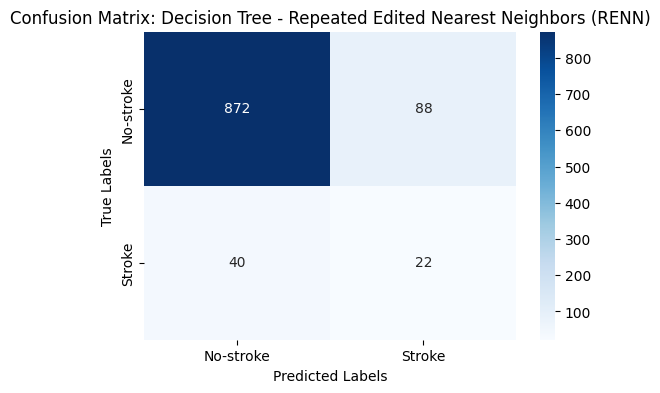

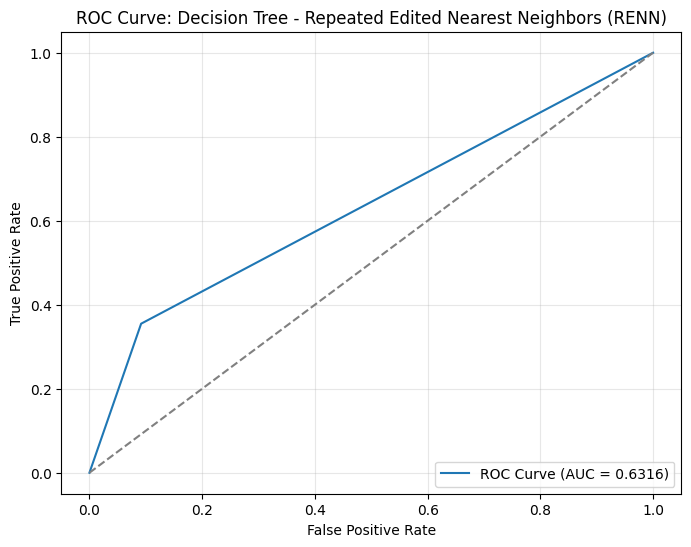


==================== Decision Tree with All KNN ====================

Decision Tree with All KNN Evaluation Metrics:
Accuracy: 0.8826
Precision: 0.1848
Recall: 0.2742
F1 Score: 0.2208
ROC-AUC Score: 0.5980

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.92      0.94       960
           1       0.18      0.27      0.22        62

    accuracy                           0.88      1022
   macro avg       0.57      0.60      0.58      1022
weighted avg       0.91      0.88      0.89      1022


Confusion Matrix:
[[885  75]
 [ 45  17]]


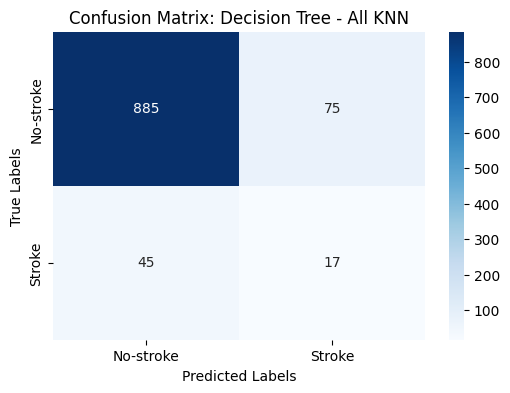

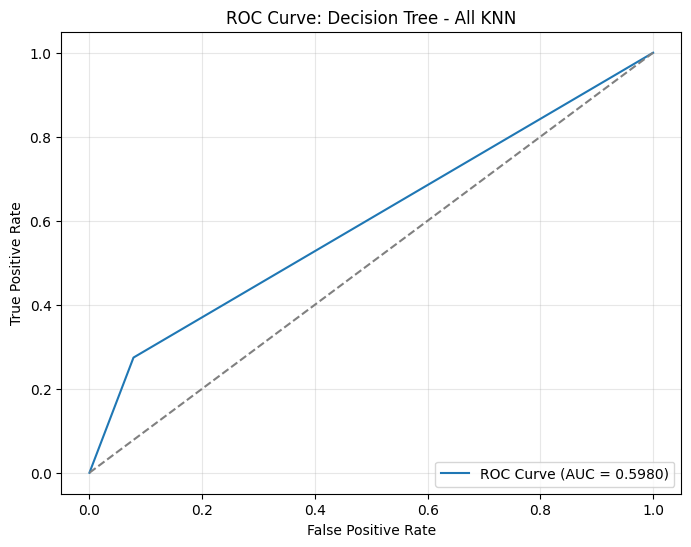


==================== Decision Tree with Condensed Nearest Neighbor (CNN) ====================

Decision Tree with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.7984
Precision: 0.1087
Recall: 0.3226
F1 Score: 0.1626
ROC-AUC Score: 0.5759

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.83      0.89       960
           1       0.11      0.32      0.16        62

    accuracy                           0.80      1022
   macro avg       0.53      0.58      0.52      1022
weighted avg       0.90      0.80      0.84      1022


Confusion Matrix:
[[796 164]
 [ 42  20]]


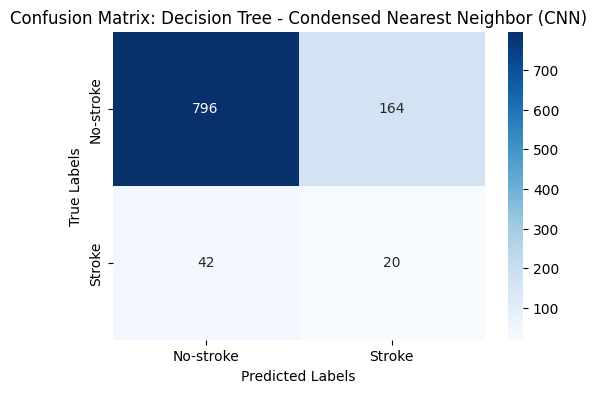

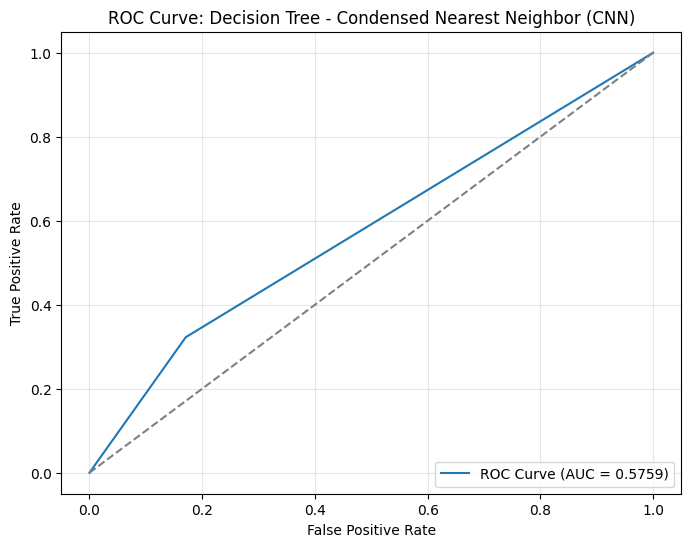


==================== Decision Tree with One-Sided Selection (OSS) ====================

Decision Tree with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9159
Precision: 0.2500
Recall: 0.1935
F1 Score: 0.2182
ROC-AUC Score: 0.5780

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.25      0.19      0.22        62

    accuracy                           0.92      1022
   macro avg       0.60      0.58      0.59      1022
weighted avg       0.91      0.92      0.91      1022


Confusion Matrix:
[[924  36]
 [ 50  12]]


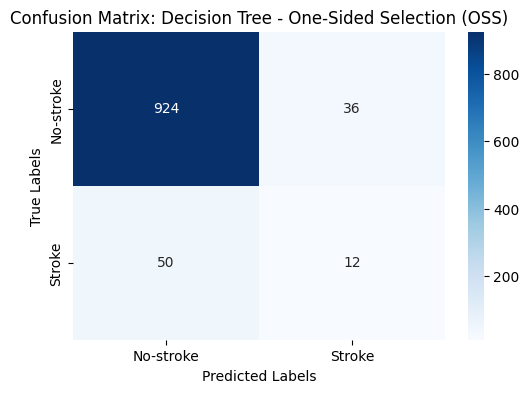

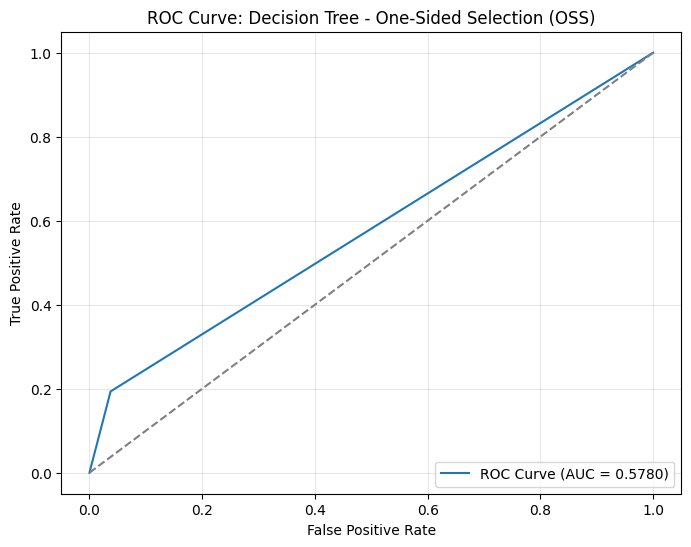


==================== Decision Tree with Neighborhood Cleaning Rule (NCR) ====================

Decision Tree with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8943
Precision: 0.1618
Recall: 0.1774
F1 Score: 0.1692
ROC-AUC Score: 0.5590

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       960
           1       0.16      0.18      0.17        62

    accuracy                           0.89      1022
   macro avg       0.55      0.56      0.56      1022
weighted avg       0.90      0.89      0.90      1022


Confusion Matrix:
[[903  57]
 [ 51  11]]


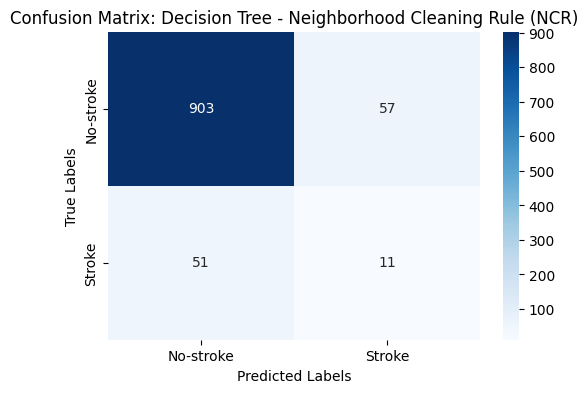

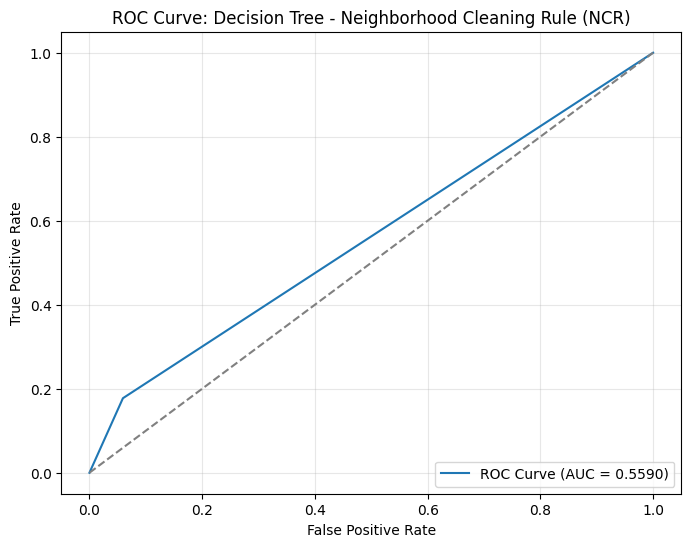


==================== Decision Tree with Instance Hardness Threshold ====================

Decision Tree with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7534
Precision: 0.1533
Recall: 0.6774
F1 Score: 0.2500
ROC-AUC Score: 0.7179

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.76      0.85       960
           1       0.15      0.68      0.25        62

    accuracy                           0.75      1022
   macro avg       0.56      0.72      0.55      1022
weighted avg       0.92      0.75      0.82      1022


Confusion Matrix:
[[728 232]
 [ 20  42]]


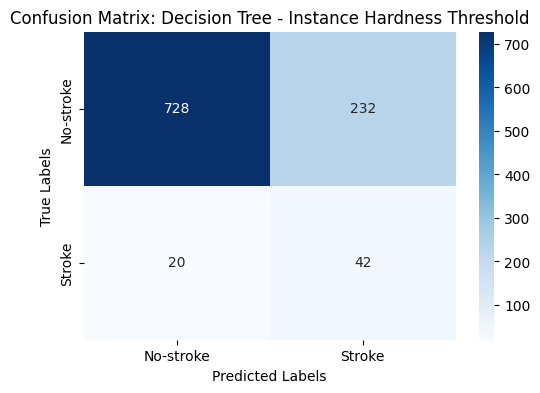

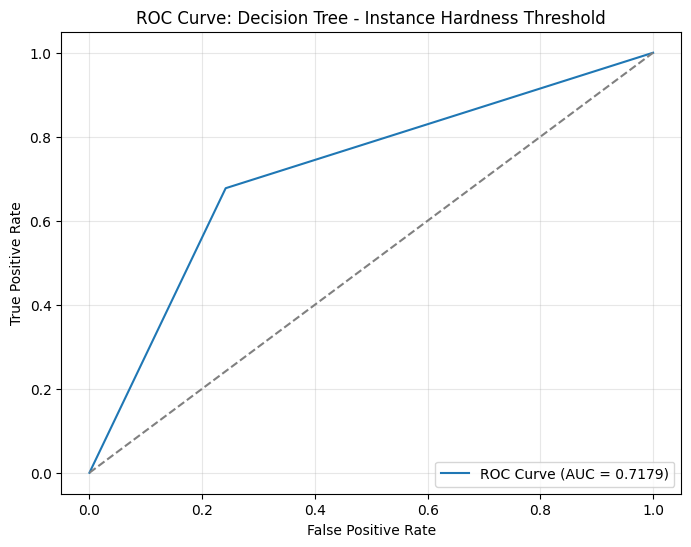


==================== Gradient Boosting with None ====================

Gradient Boosting with None Evaluation Metrics:
Accuracy: 0.9384
Precision: 0.3333
Recall: 0.0161
F1 Score: 0.0308
ROC-AUC Score: 0.8347

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.33      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.64      0.51      0.50      1022
weighted avg       0.90      0.94      0.91      1022


Confusion Matrix:
[[958   2]
 [ 61   1]]


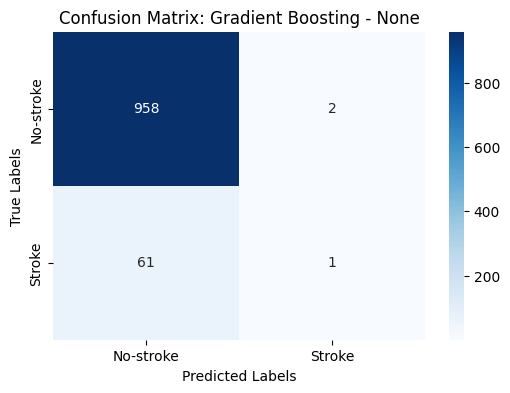

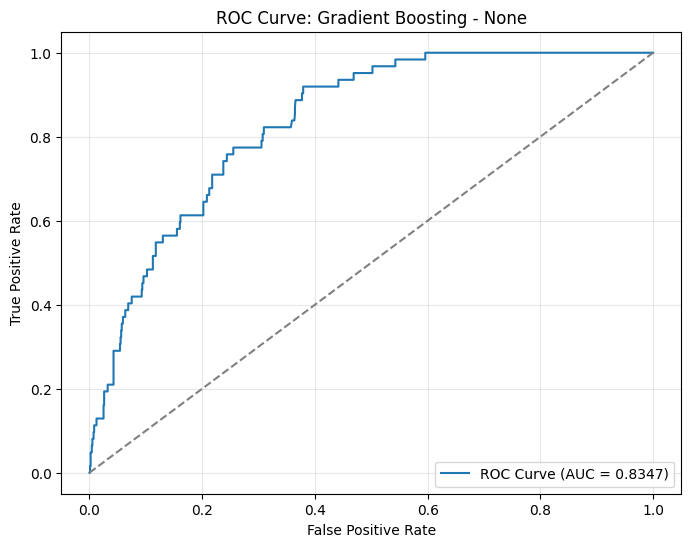


==================== Gradient Boosting with SMOTE ====================

Gradient Boosting with SMOTE Evaluation Metrics:
Accuracy: 0.8337
Precision: 0.1625
Recall: 0.4194
F1 Score: 0.2342
ROC-AUC Score: 0.7709

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.86      0.91       960
           1       0.16      0.42      0.23        62

    accuracy                           0.83      1022
   macro avg       0.56      0.64      0.57      1022
weighted avg       0.91      0.83      0.87      1022


Confusion Matrix:
[[826 134]
 [ 36  26]]


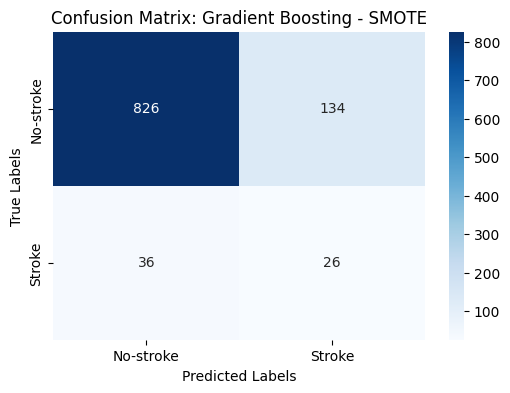

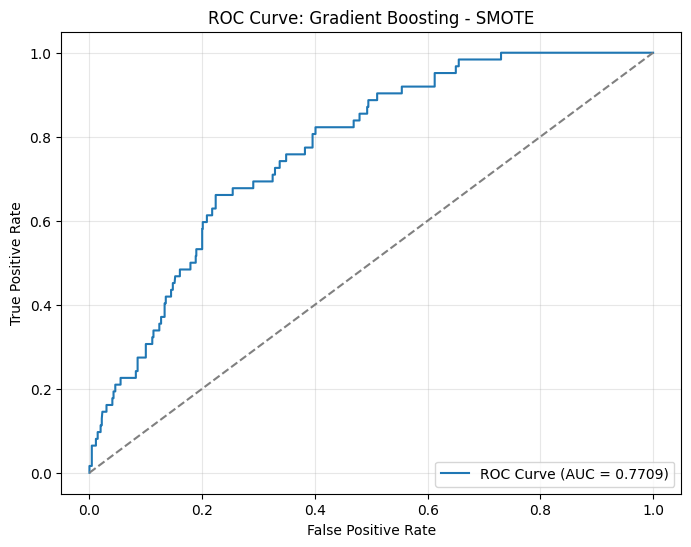


==================== Gradient Boosting with ClusterCentroids ====================

Gradient Boosting with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2661
Precision: 0.0753
Recall: 0.9839
F1 Score: 0.1399
ROC-AUC Score: 0.6654

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.22      0.36       960
           1       0.08      0.98      0.14        62

    accuracy                           0.27      1022
   macro avg       0.54      0.60      0.25      1022
weighted avg       0.94      0.27      0.35      1022


Confusion Matrix:
[[211 749]
 [  1  61]]


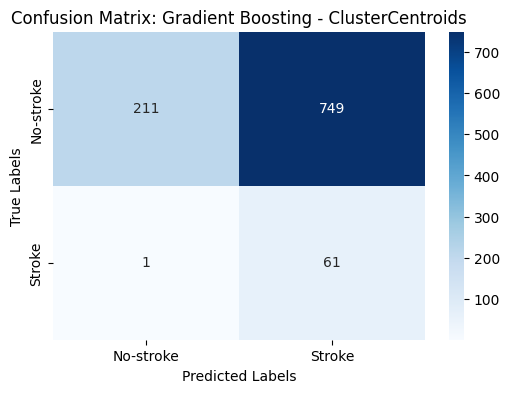

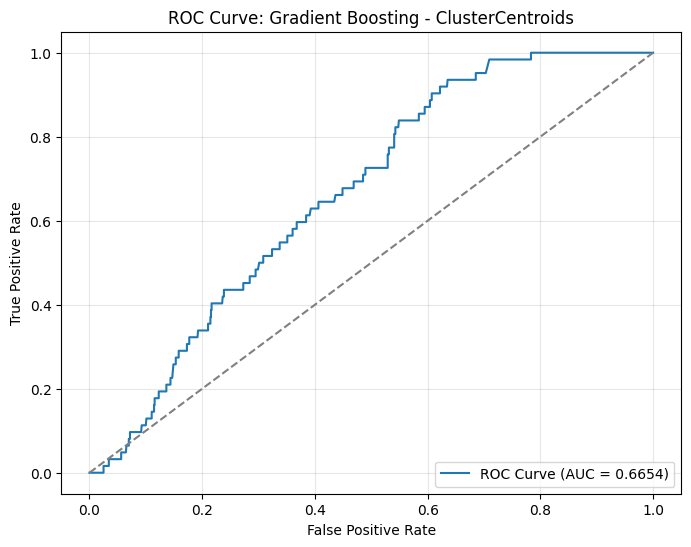


==================== Gradient Boosting with Random Undersampling ====================

Gradient Boosting with Random Undersampling Evaluation Metrics:
Accuracy: 0.7074
Precision: 0.1420
Recall: 0.7581
F1 Score: 0.2392
ROC-AUC Score: 0.8232

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.70      0.82       960
           1       0.14      0.76      0.24        62

    accuracy                           0.71      1022
   macro avg       0.56      0.73      0.53      1022
weighted avg       0.93      0.71      0.78      1022


Confusion Matrix:
[[676 284]
 [ 15  47]]


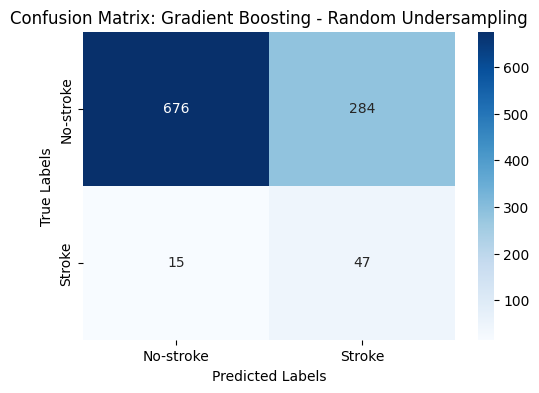

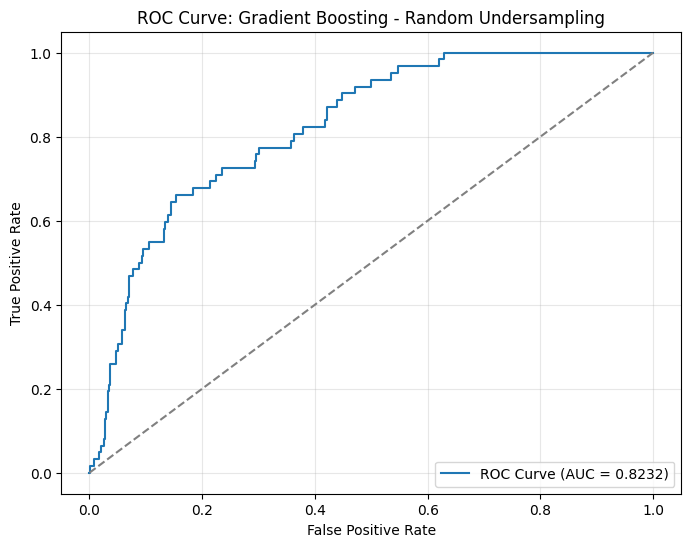


==================== Gradient Boosting with NearMiss-1 ====================

Gradient Boosting with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1830
Precision: 0.0480
Recall: 0.6613
F1 Score: 0.0894
ROC-AUC Score: 0.2605

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.15      0.26       960
           1       0.05      0.66      0.09        62

    accuracy                           0.18      1022
   macro avg       0.46      0.41      0.17      1022
weighted avg       0.82      0.18      0.25      1022


Confusion Matrix:
[[146 814]
 [ 21  41]]


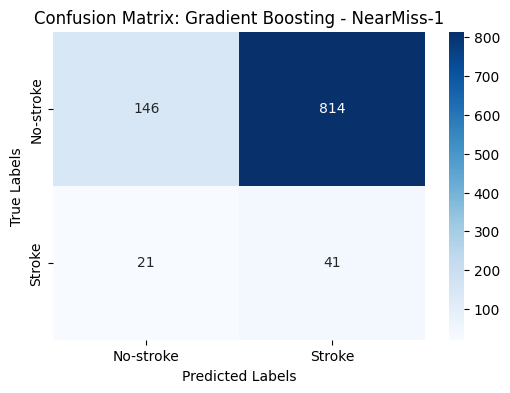

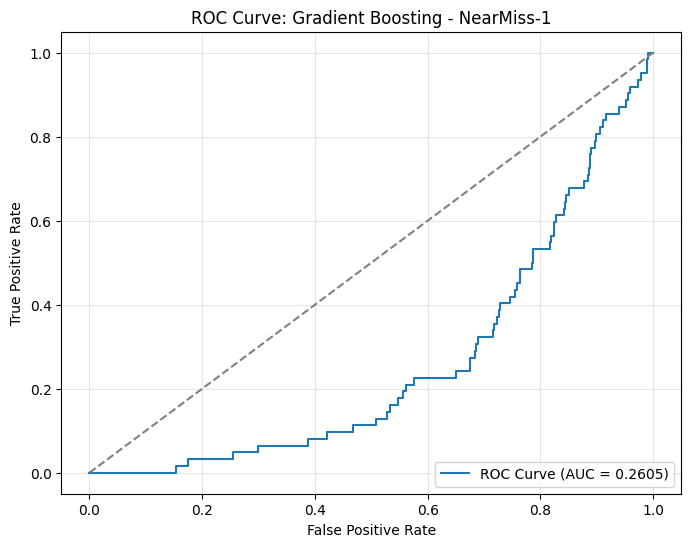


==================== Gradient Boosting with NearMiss-2 ====================

Gradient Boosting with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1135
Precision: 0.0622
Recall: 0.9677
F1 Score: 0.1170
ROC-AUC Score: 0.3819

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.06      0.11       960
           1       0.06      0.97      0.12        62

    accuracy                           0.11      1022
   macro avg       0.51      0.51      0.11      1022
weighted avg       0.91      0.11      0.11      1022


Confusion Matrix:
[[ 56 904]
 [  2  60]]


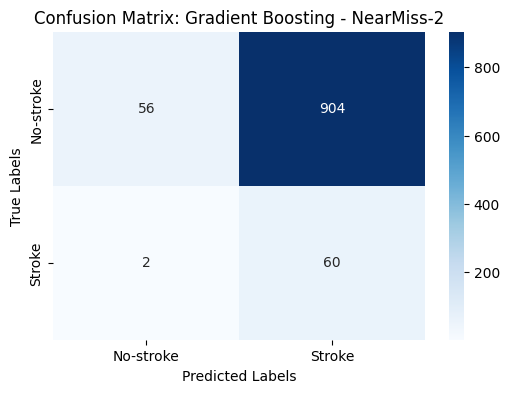

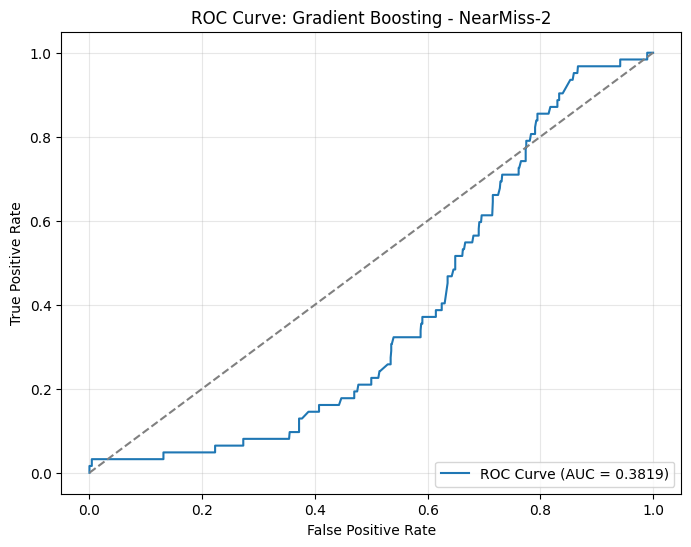


==================== Gradient Boosting with NearMiss-3 ====================

Gradient Boosting with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6184
Precision: 0.1000
Recall: 0.6613
F1 Score: 0.1737
ROC-AUC Score: 0.6862

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.62      0.75       960
           1       0.10      0.66      0.17        62

    accuracy                           0.62      1022
   macro avg       0.53      0.64      0.46      1022
weighted avg       0.91      0.62      0.72      1022


Confusion Matrix:
[[591 369]
 [ 21  41]]


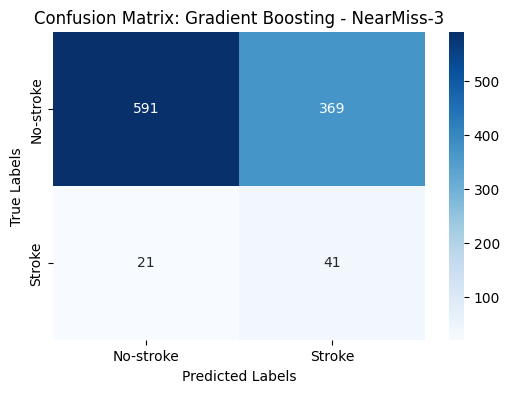

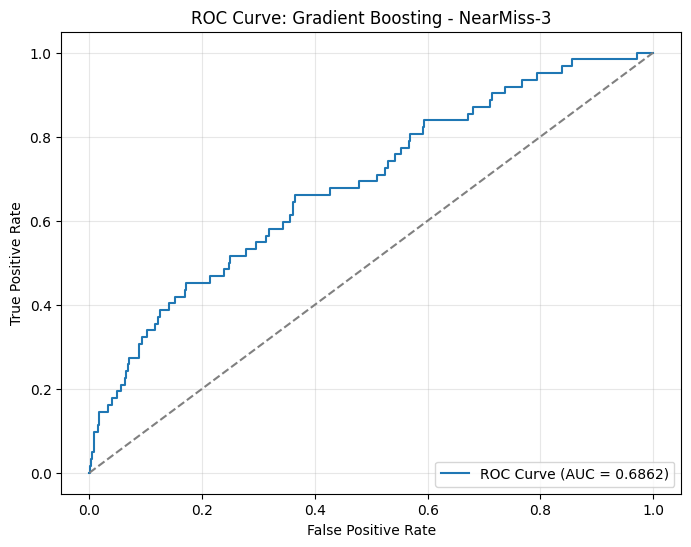


==================== Gradient Boosting with Tomek Links ====================

Gradient Boosting with Tomek Links Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.5000
Recall: 0.0161
F1 Score: 0.0312
ROC-AUC Score: 0.8373

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.50      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.72      0.51      0.50      1022
weighted avg       0.91      0.94      0.91      1022


Confusion Matrix:
[[959   1]
 [ 61   1]]


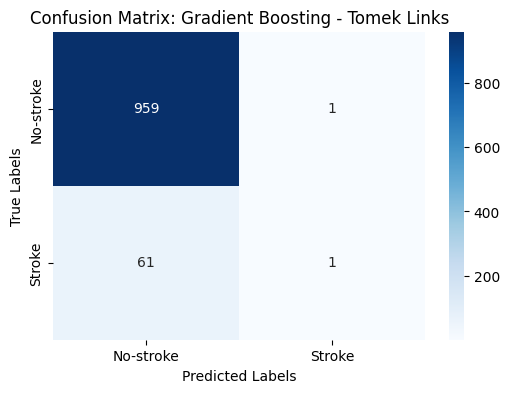

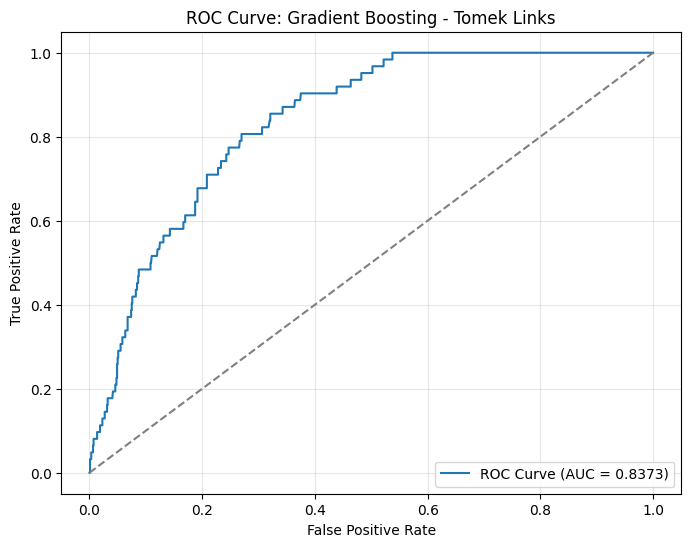


==================== Gradient Boosting with Edited Nearest Neighbors (ENN) ====================

Gradient Boosting with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9335
Precision: 0.3636
Recall: 0.1290
F1 Score: 0.1905
ROC-AUC Score: 0.8384

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       960
           1       0.36      0.13      0.19        62

    accuracy                           0.93      1022
   macro avg       0.65      0.56      0.58      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[946  14]
 [ 54   8]]


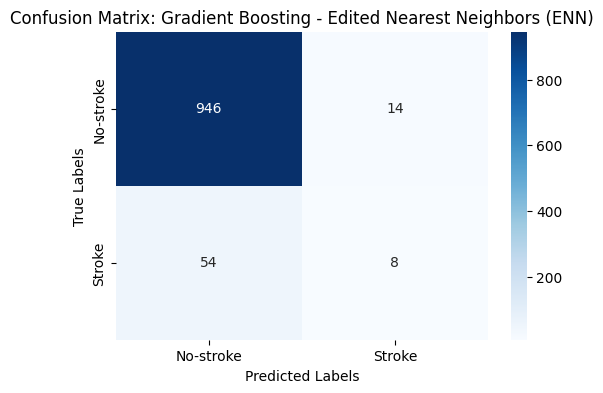

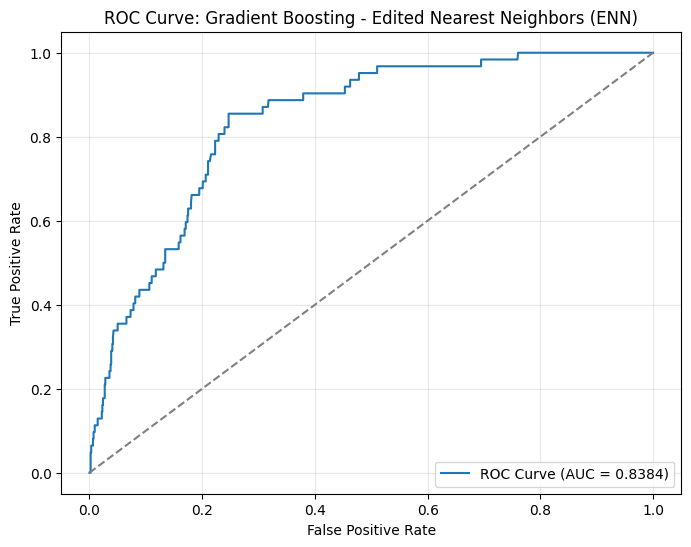


==================== Gradient Boosting with Repeated Edited Nearest Neighbors (RENN) ====================

Gradient Boosting with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9051
Precision: 0.2603
Recall: 0.3065
F1 Score: 0.2815
ROC-AUC Score: 0.8408

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       960
           1       0.26      0.31      0.28        62

    accuracy                           0.91      1022
   macro avg       0.61      0.63      0.62      1022
weighted avg       0.91      0.91      0.91      1022


Confusion Matrix:
[[906  54]
 [ 43  19]]


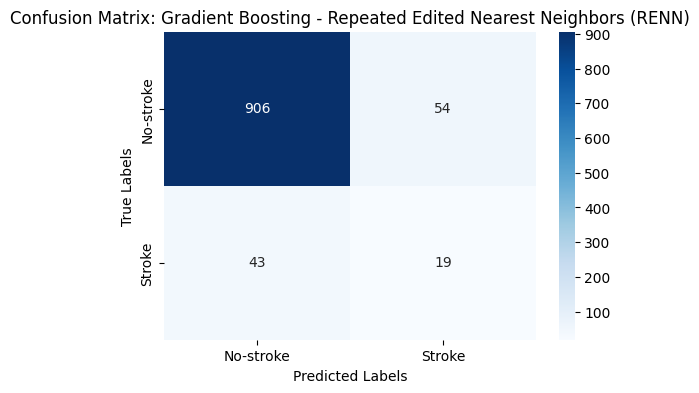

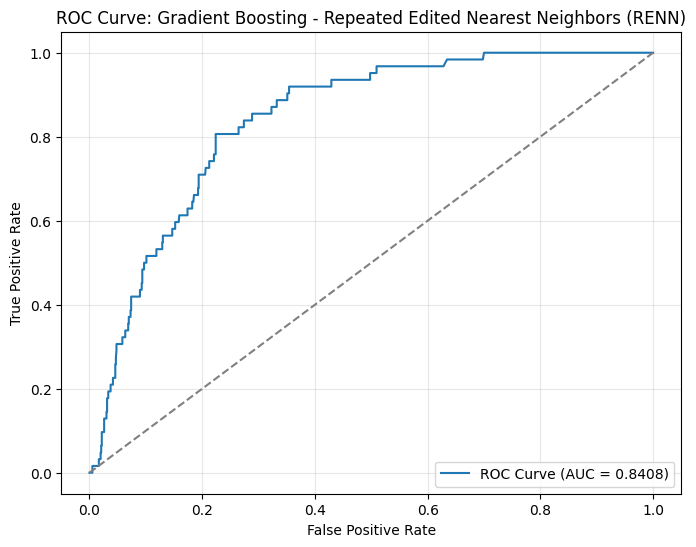


==================== Gradient Boosting with All KNN ====================

Gradient Boosting with All KNN Evaluation Metrics:
Accuracy: 0.9266
Precision: 0.3415
Recall: 0.2258
F1 Score: 0.2718
ROC-AUC Score: 0.8479

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.34      0.23      0.27        62

    accuracy                           0.93      1022
   macro avg       0.65      0.60      0.62      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[933  27]
 [ 48  14]]


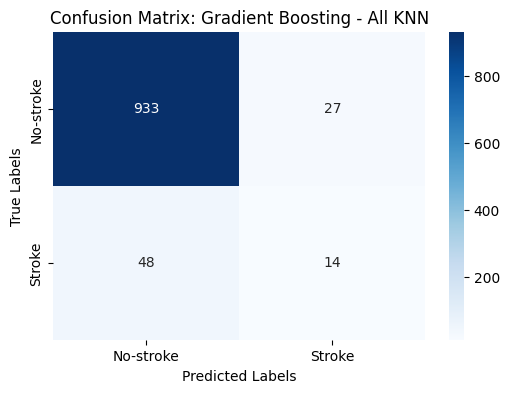

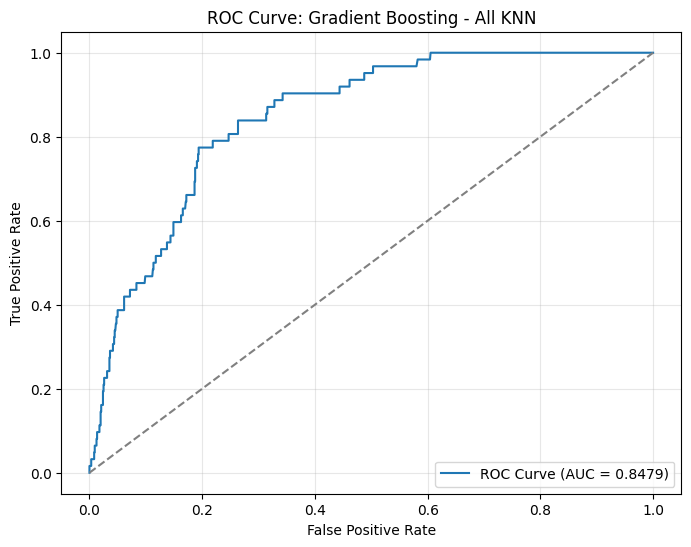


==================== Gradient Boosting with Condensed Nearest Neighbor (CNN) ====================

Gradient Boosting with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9266
Precision: 0.2174
Recall: 0.0806
F1 Score: 0.1176
ROC-AUC Score: 0.7662

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.22      0.08      0.12        62

    accuracy                           0.93      1022
   macro avg       0.58      0.53      0.54      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[942  18]
 [ 57   5]]


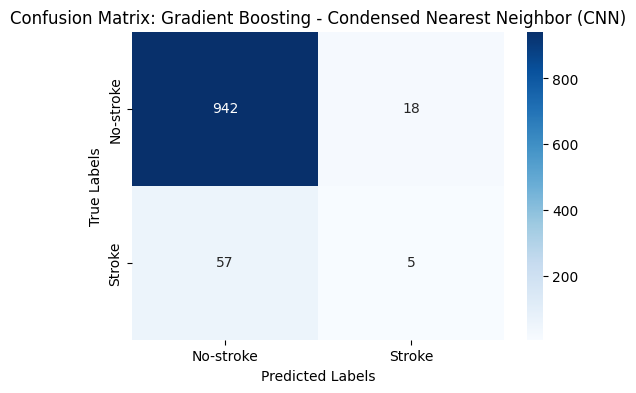

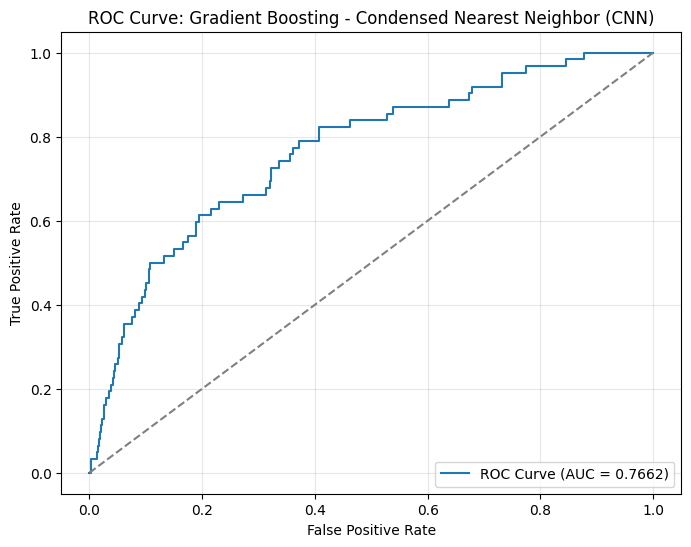


==================== Gradient Boosting with One-Sided Selection (OSS) ====================

Gradient Boosting with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9354
Precision: 0.2500
Recall: 0.0323
F1 Score: 0.0571
ROC-AUC Score: 0.8346

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.25      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.60      0.51      0.51      1022
weighted avg       0.90      0.94      0.91      1022


Confusion Matrix:
[[954   6]
 [ 60   2]]


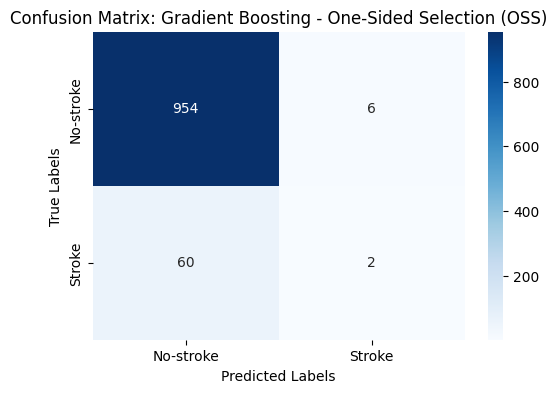

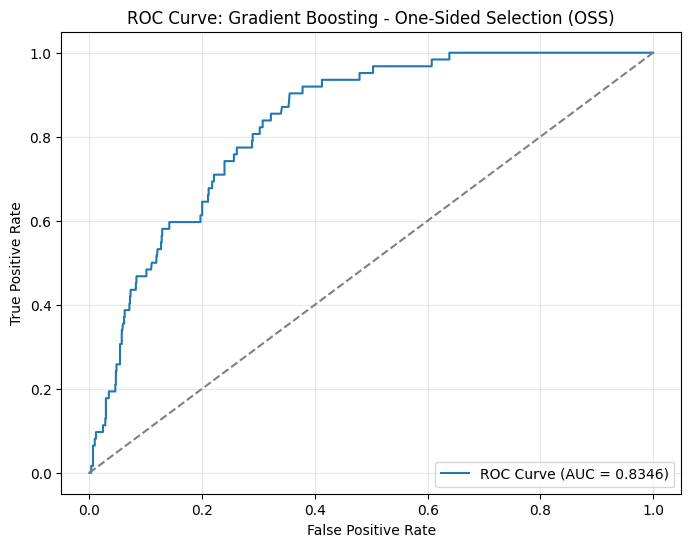


==================== Gradient Boosting with Neighborhood Cleaning Rule (NCR) ====================

Gradient Boosting with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9315
Precision: 0.2778
Recall: 0.0806
F1 Score: 0.1250
ROC-AUC Score: 0.8444

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.28      0.08      0.12        62

    accuracy                           0.93      1022
   macro avg       0.61      0.53      0.54      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[947  13]
 [ 57   5]]


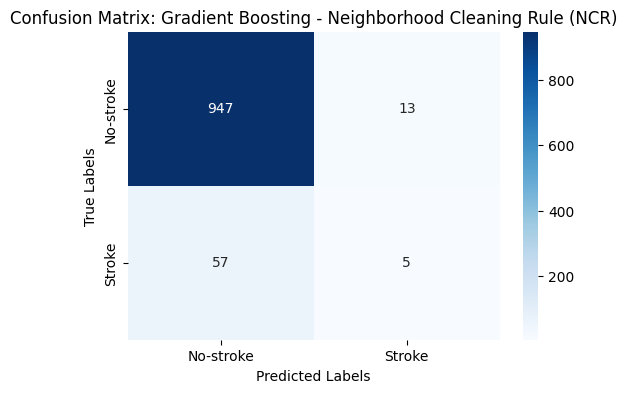

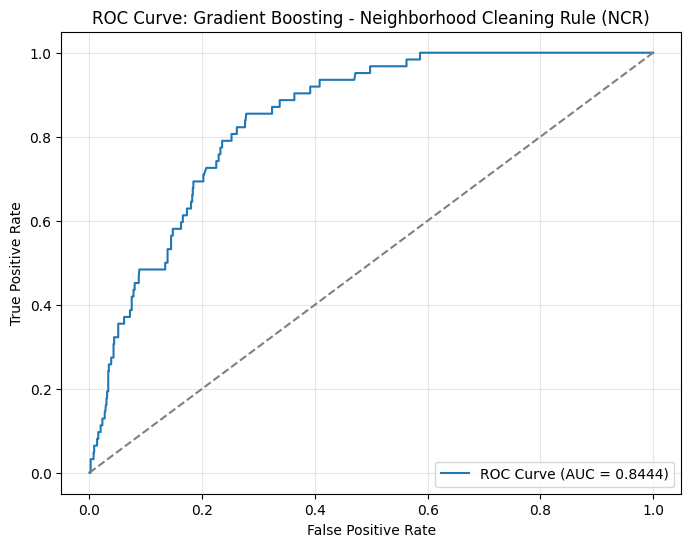


==================== Gradient Boosting with Instance Hardness Threshold ====================

Gradient Boosting with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7779
Precision: 0.1739
Recall: 0.7097
F1 Score: 0.2794
ROC-AUC Score: 0.8375

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.78      0.87       960
           1       0.17      0.71      0.28        62

    accuracy                           0.78      1022
   macro avg       0.58      0.75      0.57      1022
weighted avg       0.93      0.78      0.83      1022


Confusion Matrix:
[[751 209]
 [ 18  44]]


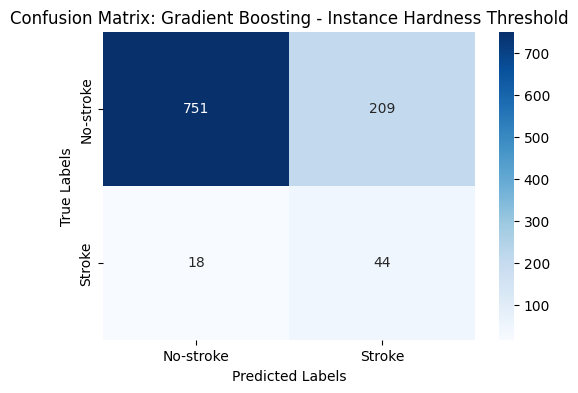

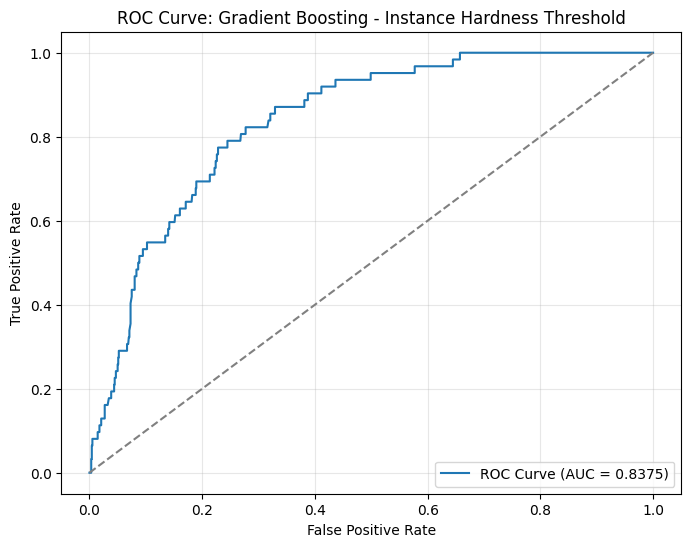


==================== K-Nearest Neighbors (KNN) with None ====================

K-Nearest Neighbors (KNN) with None Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.6475

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


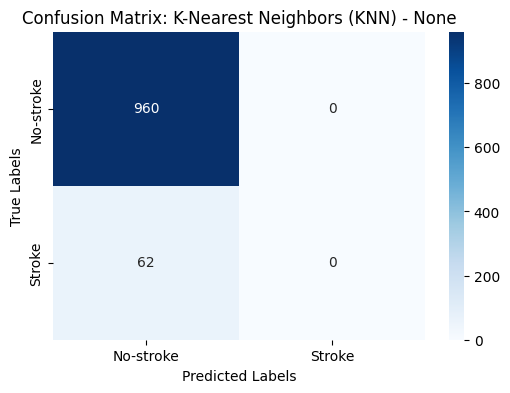

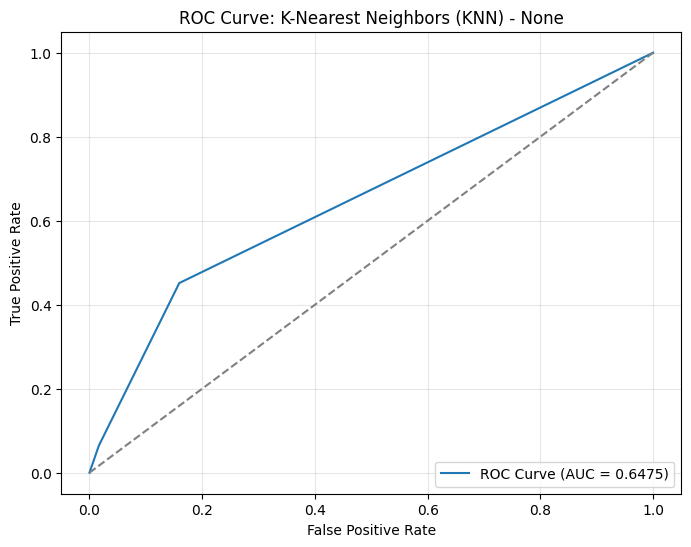


==================== K-Nearest Neighbors (KNN) with SMOTE ====================

K-Nearest Neighbors (KNN) with SMOTE Evaluation Metrics:
Accuracy: 0.7886
Precision: 0.1150
Recall: 0.3710
F1 Score: 0.1756
ROC-AUC Score: 0.6607

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.82      0.88       960
           1       0.12      0.37      0.18        62

    accuracy                           0.79      1022
   macro avg       0.53      0.59      0.53      1022
weighted avg       0.90      0.79      0.84      1022


Confusion Matrix:
[[783 177]
 [ 39  23]]


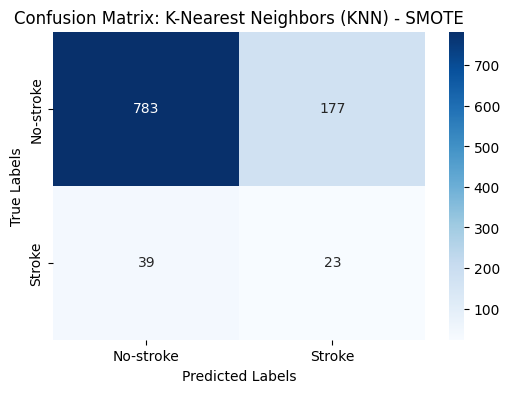

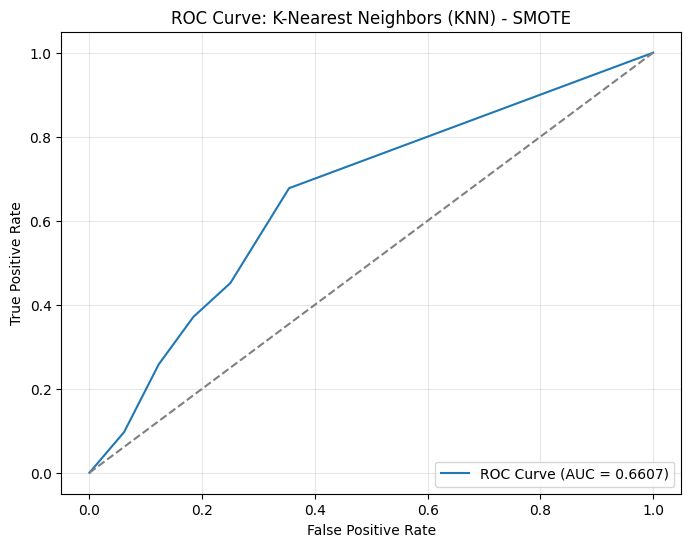


==================== K-Nearest Neighbors (KNN) with ClusterCentroids ====================

K-Nearest Neighbors (KNN) with ClusterCentroids Evaluation Metrics:
Accuracy: 0.3405
Precision: 0.0785
Recall: 0.9194
F1 Score: 0.1447
ROC-AUC Score: 0.6514

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.30      0.46       960
           1       0.08      0.92      0.14        62

    accuracy                           0.34      1022
   macro avg       0.53      0.61      0.30      1022
weighted avg       0.93      0.34      0.44      1022


Confusion Matrix:
[[291 669]
 [  5  57]]


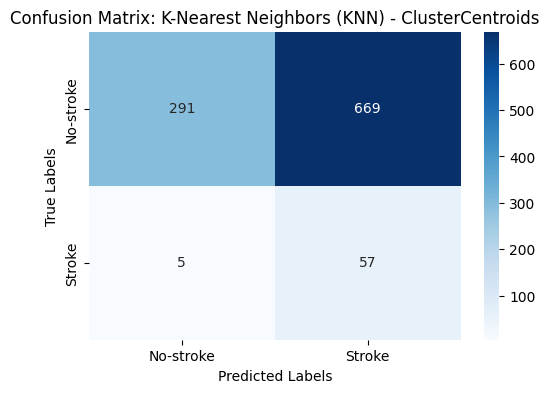

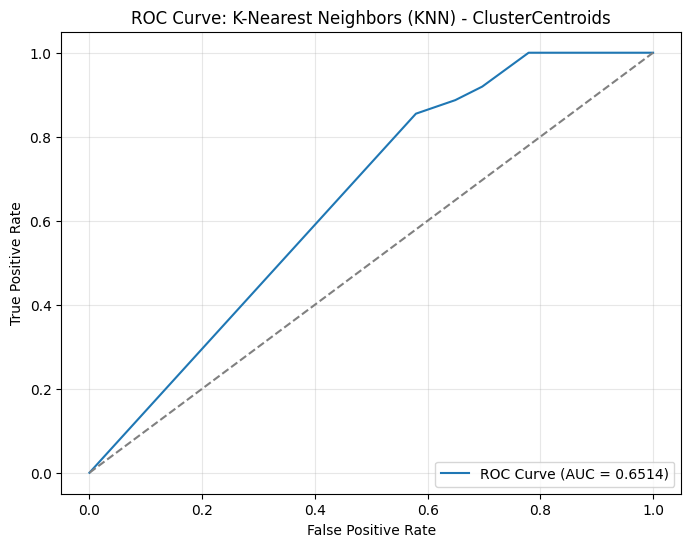


==================== K-Nearest Neighbors (KNN) with Random Undersampling ====================

K-Nearest Neighbors (KNN) with Random Undersampling Evaluation Metrics:
Accuracy: 0.7123
Precision: 0.1398
Recall: 0.7258
F1 Score: 0.2344
ROC-AUC Score: 0.7659

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.71      0.82       960
           1       0.14      0.73      0.23        62

    accuracy                           0.71      1022
   macro avg       0.56      0.72      0.53      1022
weighted avg       0.93      0.71      0.79      1022


Confusion Matrix:
[[683 277]
 [ 17  45]]


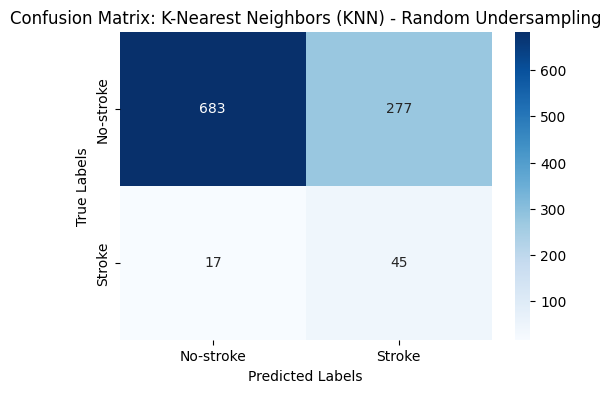

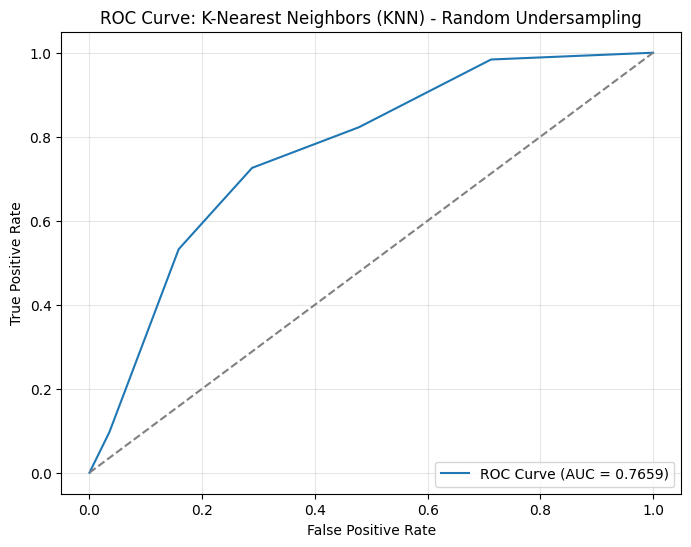


==================== K-Nearest Neighbors (KNN) with NearMiss-1 ====================

K-Nearest Neighbors (KNN) with NearMiss-1 Evaluation Metrics:
Accuracy: 0.3669
Precision: 0.0451
Recall: 0.4677
F1 Score: 0.0823
ROC-AUC Score: 0.3750

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.36      0.52       960
           1       0.05      0.47      0.08        62

    accuracy                           0.37      1022
   macro avg       0.48      0.41      0.30      1022
weighted avg       0.86      0.37      0.49      1022


Confusion Matrix:
[[346 614]
 [ 33  29]]


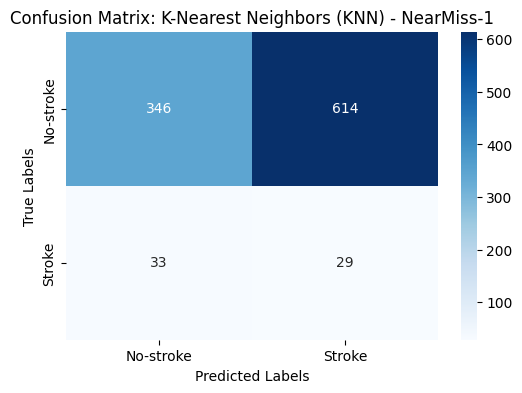

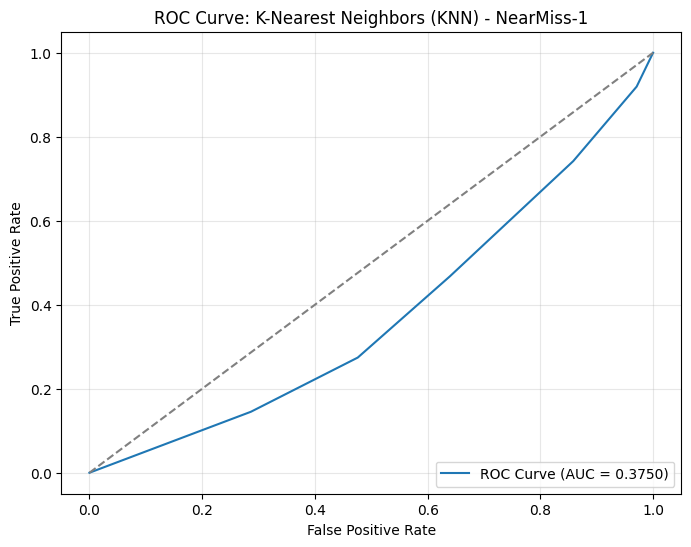


==================== K-Nearest Neighbors (KNN) with NearMiss-2 ====================

K-Nearest Neighbors (KNN) with NearMiss-2 Evaluation Metrics:
Accuracy: 0.5548
Precision: 0.1014
Recall: 0.8065
F1 Score: 0.1802
ROC-AUC Score: 0.7185

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.54      0.69       960
           1       0.10      0.81      0.18        62

    accuracy                           0.55      1022
   macro avg       0.54      0.67      0.44      1022
weighted avg       0.92      0.55      0.66      1022


Confusion Matrix:
[[517 443]
 [ 12  50]]


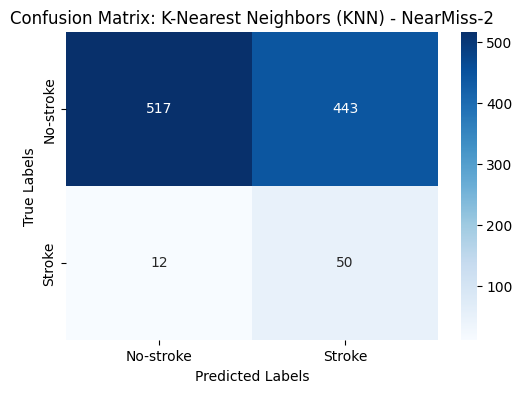

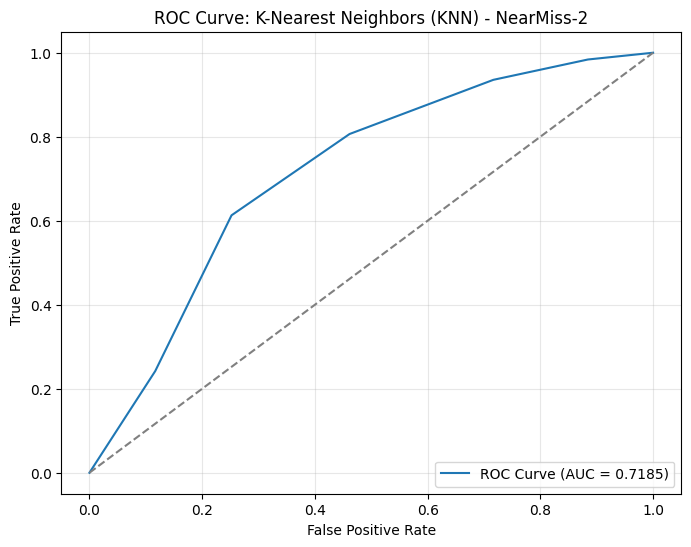


==================== K-Nearest Neighbors (KNN) with NearMiss-3 ====================

K-Nearest Neighbors (KNN) with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6321
Precision: 0.0933
Recall: 0.5806
F1 Score: 0.1607
ROC-AUC Score: 0.6154

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.64      0.76       960
           1       0.09      0.58      0.16        62

    accuracy                           0.63      1022
   macro avg       0.53      0.61      0.46      1022
weighted avg       0.91      0.63      0.73      1022


Confusion Matrix:
[[610 350]
 [ 26  36]]


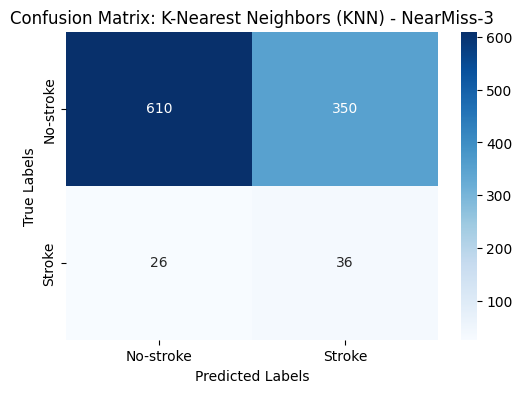

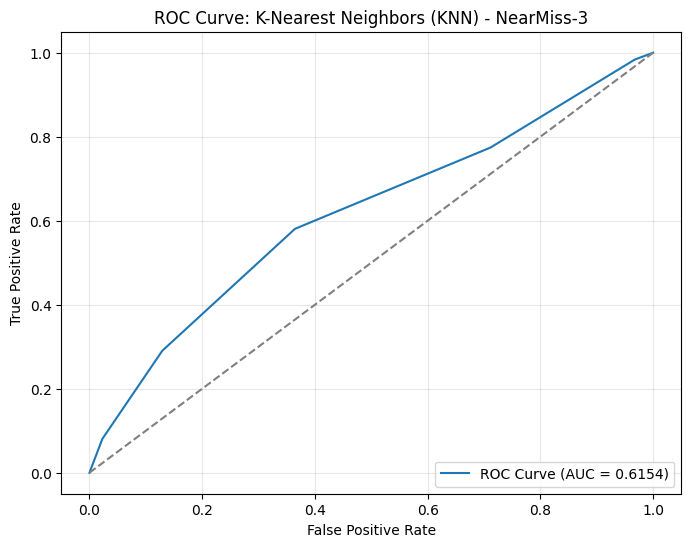


==================== K-Nearest Neighbors (KNN) with Tomek Links ====================

K-Nearest Neighbors (KNN) with Tomek Links Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.6515

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


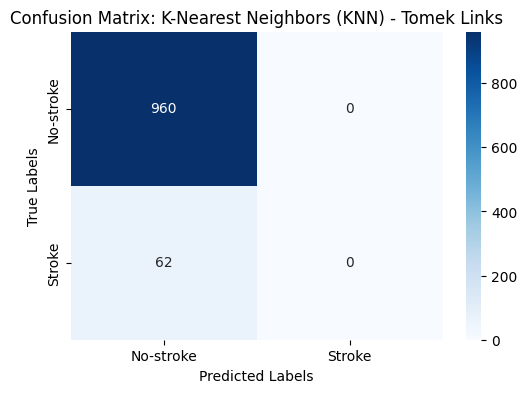

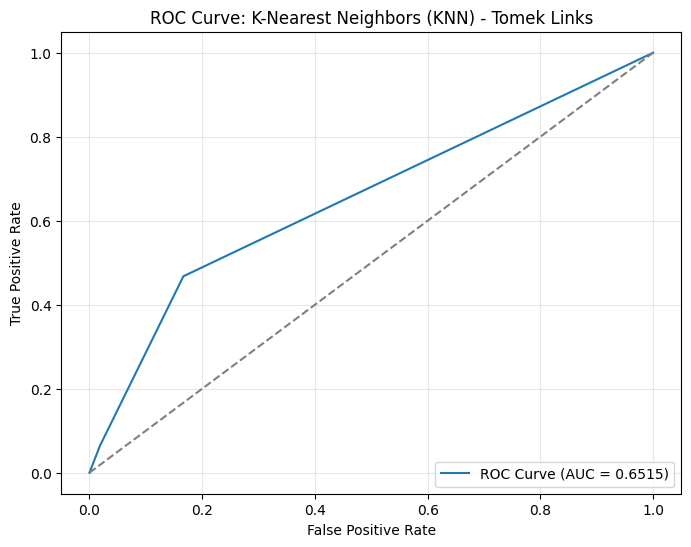


==================== K-Nearest Neighbors (KNN) with Edited Nearest Neighbors (ENN) ====================

K-Nearest Neighbors (KNN) with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9364
Precision: 0.3333
Recall: 0.0484
F1 Score: 0.0845
ROC-AUC Score: 0.6801

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.33      0.05      0.08        62

    accuracy                           0.94      1022
   macro avg       0.64      0.52      0.53      1022
weighted avg       0.90      0.94      0.91      1022


Confusion Matrix:
[[954   6]
 [ 59   3]]


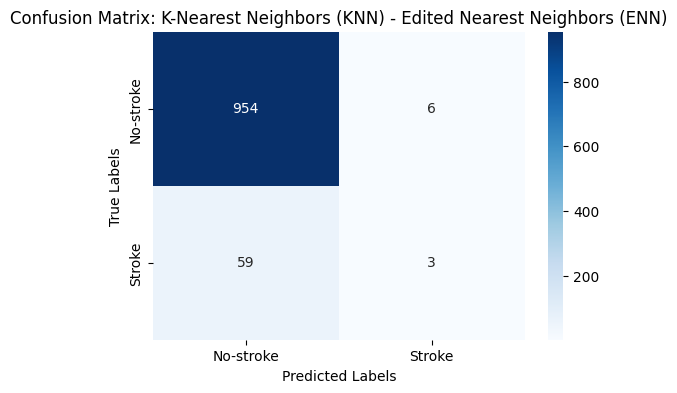

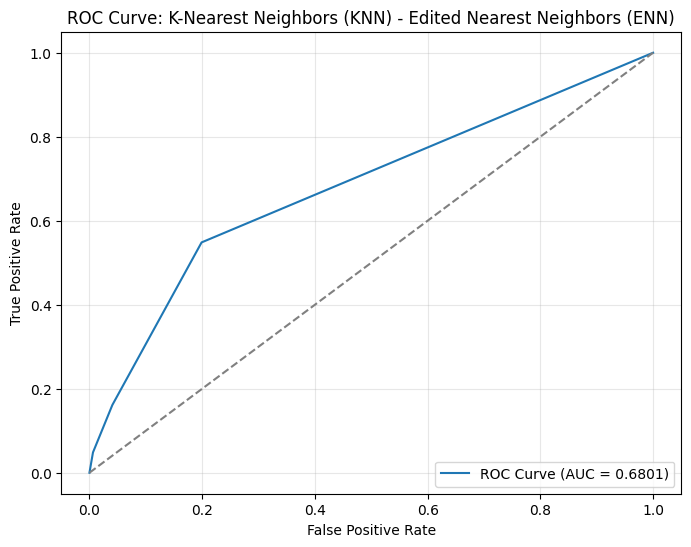


==================== K-Nearest Neighbors (KNN) with Repeated Edited Nearest Neighbors (RENN) ====================

K-Nearest Neighbors (KNN) with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9315
Precision: 0.2778
Recall: 0.0806
F1 Score: 0.1250
ROC-AUC Score: 0.7005

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.28      0.08      0.12        62

    accuracy                           0.93      1022
   macro avg       0.61      0.53      0.54      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[947  13]
 [ 57   5]]


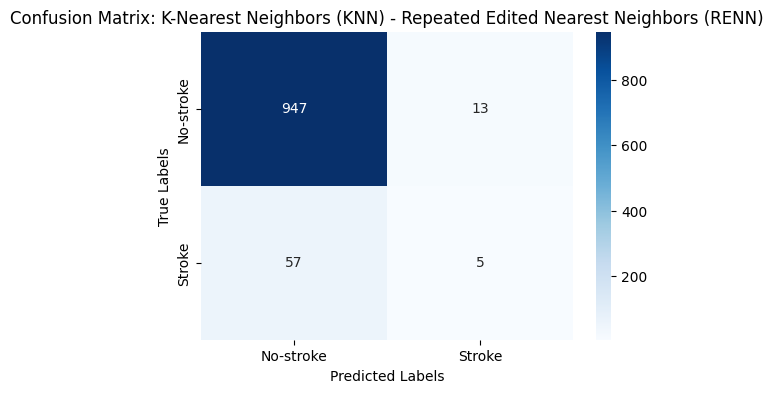

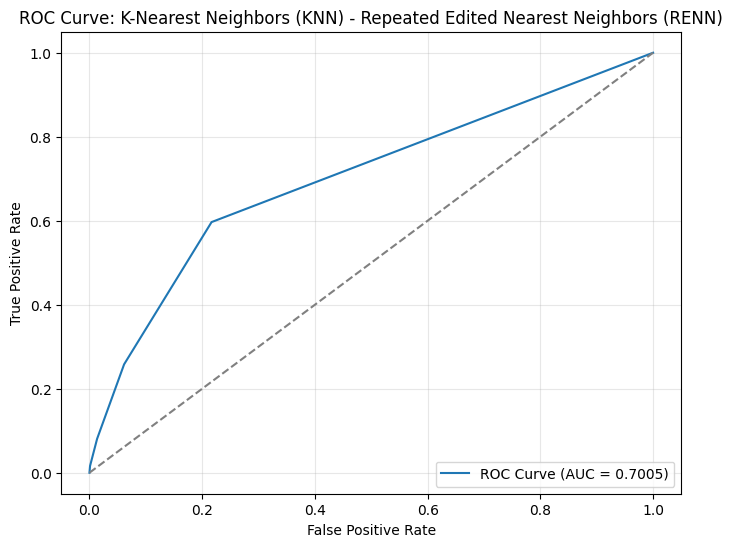


==================== K-Nearest Neighbors (KNN) with All KNN ====================

K-Nearest Neighbors (KNN) with All KNN Evaluation Metrics:
Accuracy: 0.9344
Precision: 0.3077
Recall: 0.0645
F1 Score: 0.1067
ROC-AUC Score: 0.6857

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.31      0.06      0.11        62

    accuracy                           0.93      1022
   macro avg       0.63      0.53      0.54      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[951   9]
 [ 58   4]]


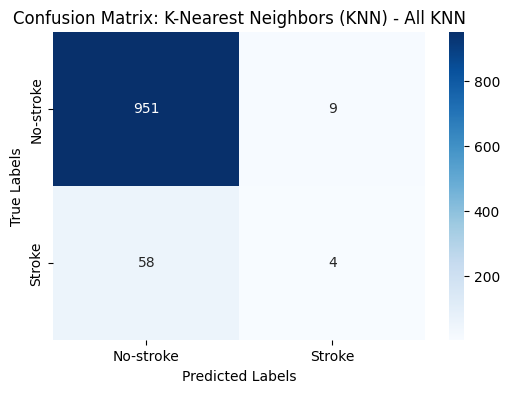

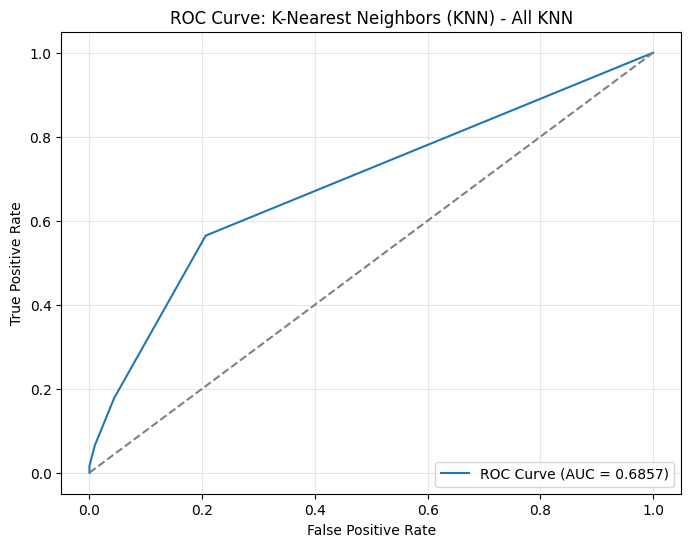


==================== K-Nearest Neighbors (KNN) with Condensed Nearest Neighbor (CNN) ====================

K-Nearest Neighbors (KNN) with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9090
Precision: 0.1837
Recall: 0.1452
F1 Score: 0.1622
ROC-AUC Score: 0.6123

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       960
           1       0.18      0.15      0.16        62

    accuracy                           0.91      1022
   macro avg       0.56      0.55      0.56      1022
weighted avg       0.90      0.91      0.90      1022


Confusion Matrix:
[[920  40]
 [ 53   9]]


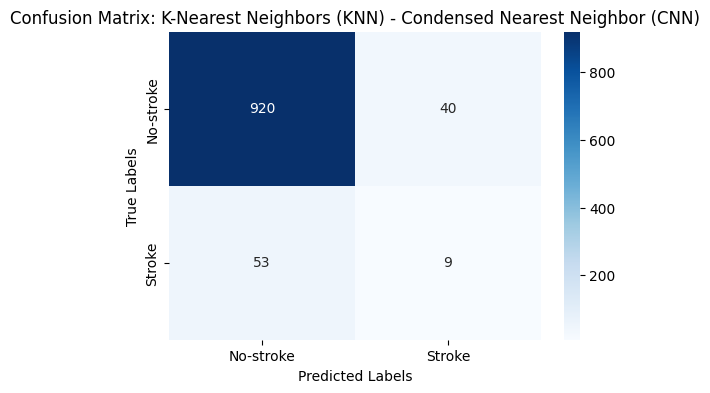

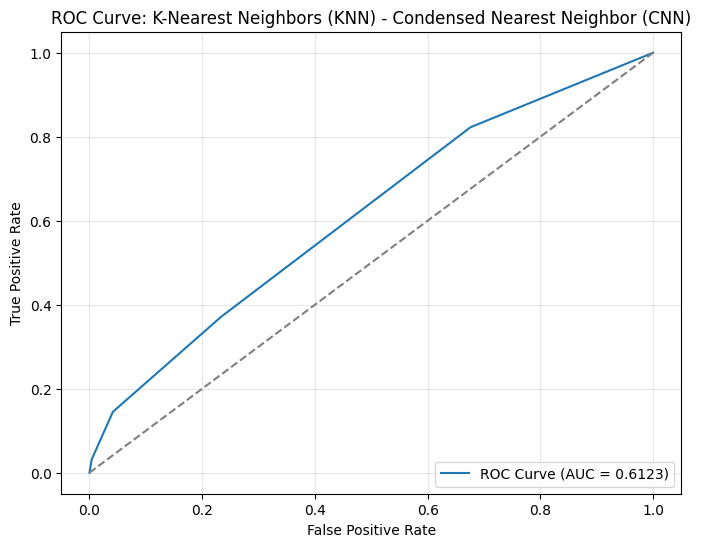


==================== K-Nearest Neighbors (KNN) with One-Sided Selection (OSS) ====================

K-Nearest Neighbors (KNN) with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.6484

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


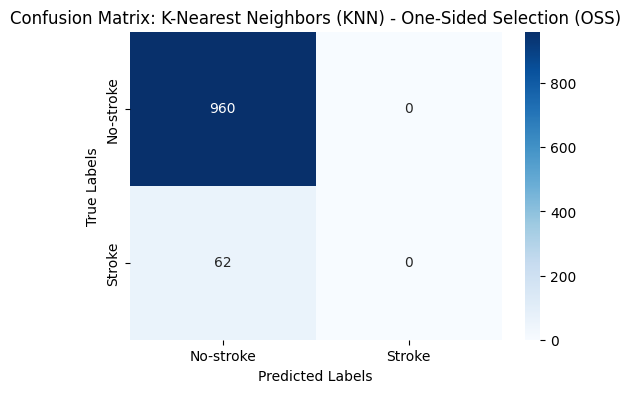

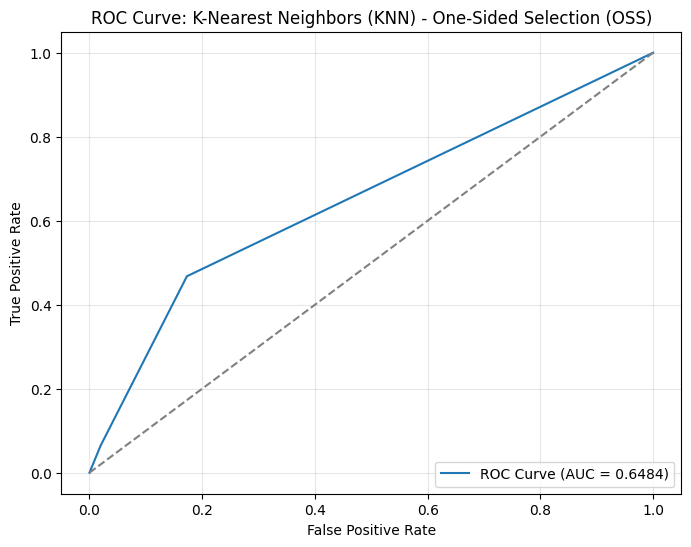


==================== K-Nearest Neighbors (KNN) with Neighborhood Cleaning Rule (NCR) ====================

K-Nearest Neighbors (KNN) with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9354
Precision: 0.1667
Recall: 0.0161
F1 Score: 0.0294
ROC-AUC Score: 0.6797

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.17      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.55      0.51      0.50      1022
weighted avg       0.89      0.94      0.91      1022


Confusion Matrix:
[[955   5]
 [ 61   1]]


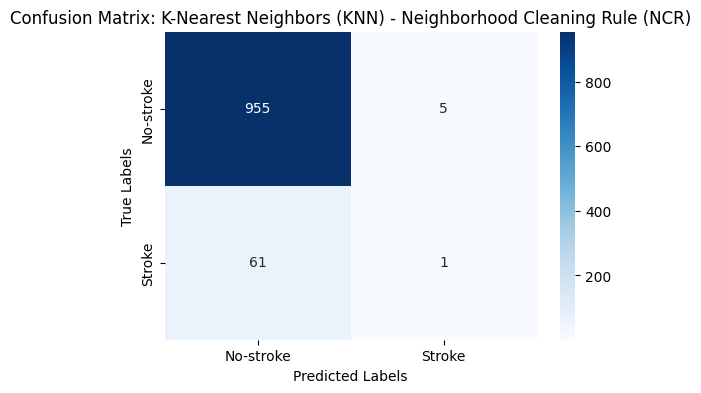

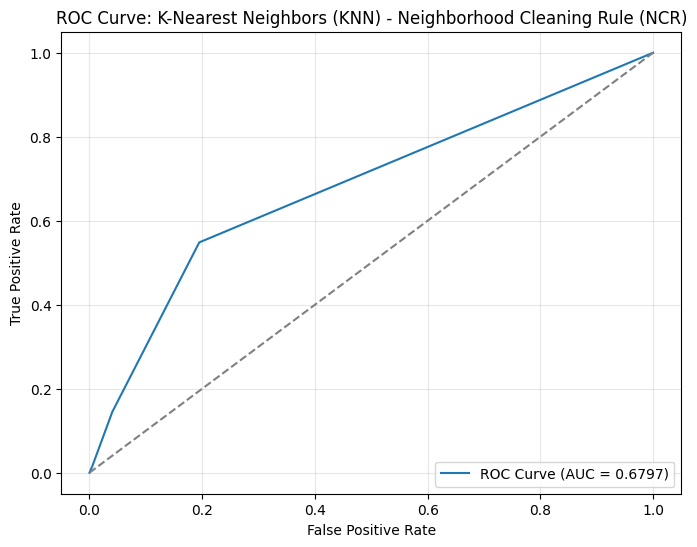


==================== K-Nearest Neighbors (KNN) with Instance Hardness Threshold ====================

K-Nearest Neighbors (KNN) with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7877
Precision: 0.1645
Recall: 0.6129
F1 Score: 0.2594
ROC-AUC Score: 0.7714

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.80      0.88       960
           1       0.16      0.61      0.26        62

    accuracy                           0.79      1022
   macro avg       0.57      0.71      0.57      1022
weighted avg       0.92      0.79      0.84      1022


Confusion Matrix:
[[767 193]
 [ 24  38]]


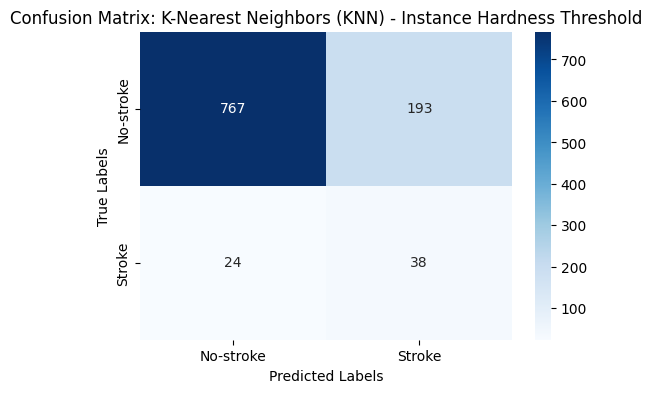

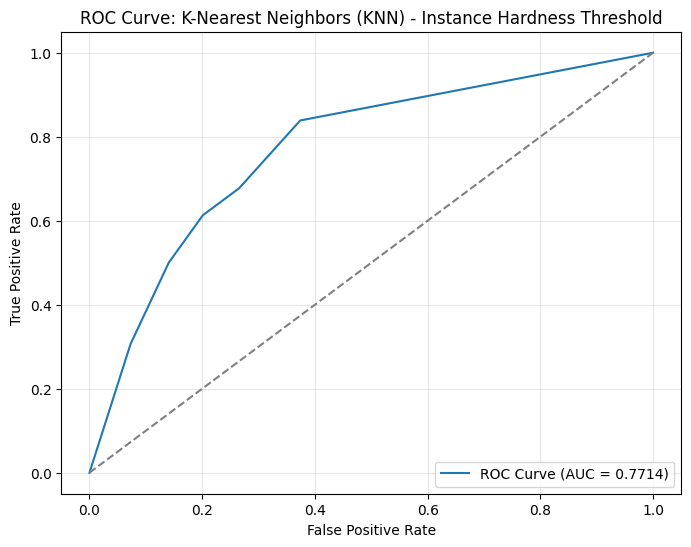


==================== Gaussian Naive Bayes with None ====================

Gaussian Naive Bayes with None Evaluation Metrics:
Accuracy: 0.8669
Precision: 0.2197
Recall: 0.4677
F1 Score: 0.2990
ROC-AUC Score: 0.8289

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.89      0.93       960
           1       0.22      0.47      0.30        62

    accuracy                           0.87      1022
   macro avg       0.59      0.68      0.61      1022
weighted avg       0.92      0.87      0.89      1022


Confusion Matrix:
[[857 103]
 [ 33  29]]


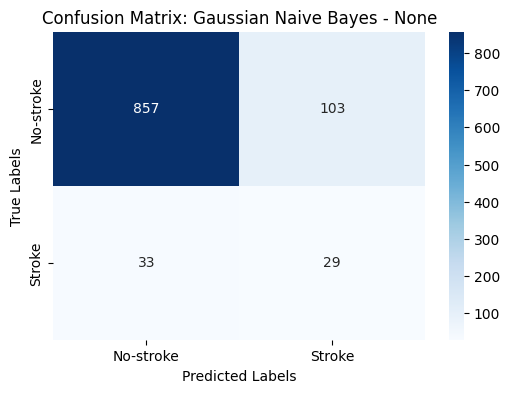

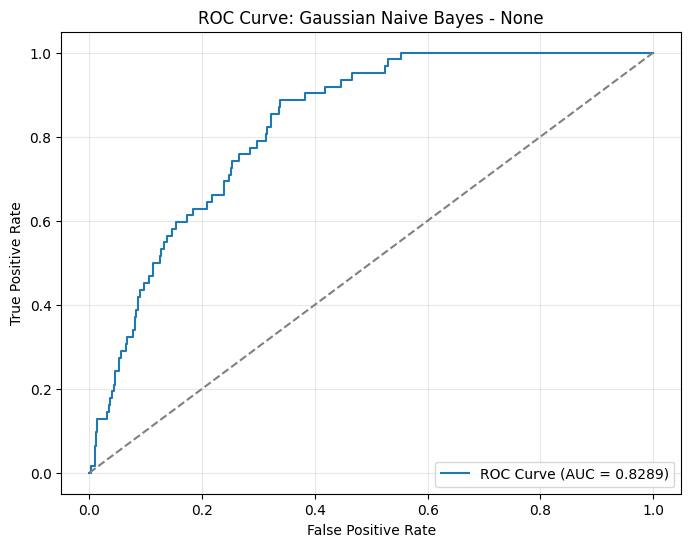


==================== Gaussian Naive Bayes with SMOTE ====================

Gaussian Naive Bayes with SMOTE Evaluation Metrics:
Accuracy: 0.7260
Precision: 0.1391
Recall: 0.6774
F1 Score: 0.2308
ROC-AUC Score: 0.7985

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.73      0.83       960
           1       0.14      0.68      0.23        62

    accuracy                           0.73      1022
   macro avg       0.56      0.70      0.53      1022
weighted avg       0.92      0.73      0.80      1022


Confusion Matrix:
[[700 260]
 [ 20  42]]


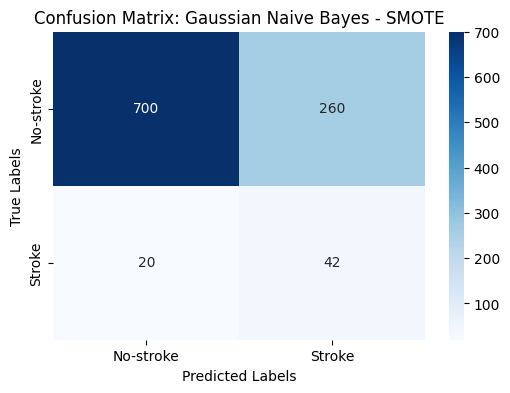

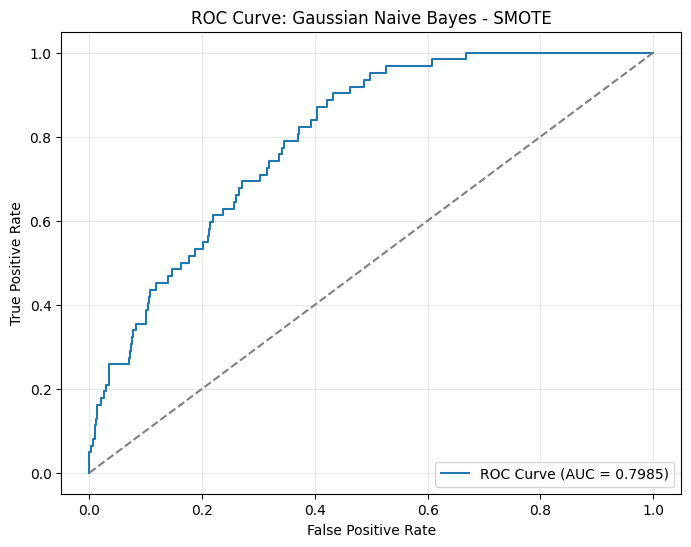


==================== Gaussian Naive Bayes with ClusterCentroids ====================

Gaussian Naive Bayes with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2867
Precision: 0.0674
Recall: 0.8387
F1 Score: 0.1248
ROC-AUC Score: 0.6464

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.25      0.40       960
           1       0.07      0.84      0.12        62

    accuracy                           0.29      1022
   macro avg       0.51      0.54      0.26      1022
weighted avg       0.91      0.29      0.38      1022


Confusion Matrix:
[[241 719]
 [ 10  52]]


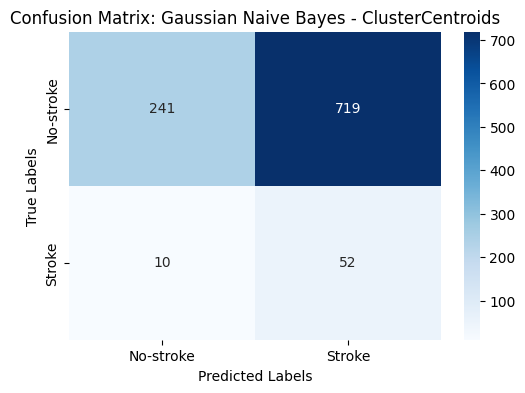

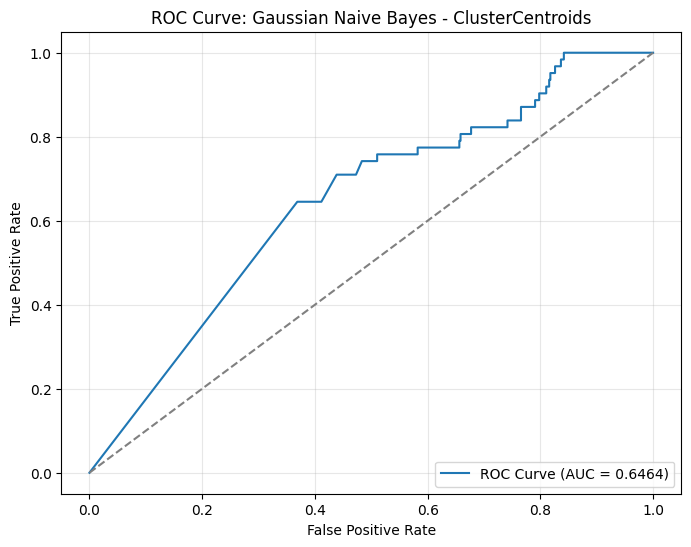


==================== Gaussian Naive Bayes with Random Undersampling ====================

Gaussian Naive Bayes with Random Undersampling Evaluation Metrics:
Accuracy: 0.7417
Precision: 0.1588
Recall: 0.7581
F1 Score: 0.2626
ROC-AUC Score: 0.8285

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.16      0.76      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[711 249]
 [ 15  47]]


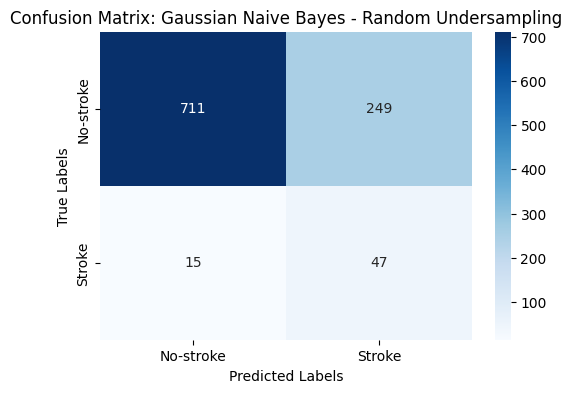

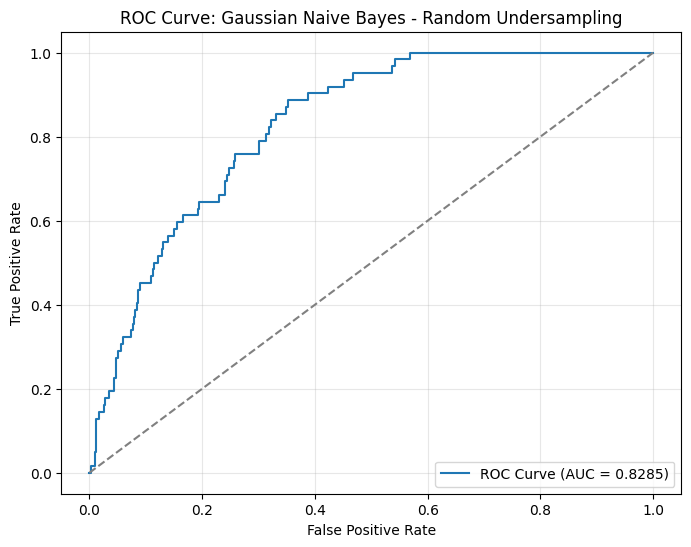


==================== Gaussian Naive Bayes with NearMiss-1 ====================

Gaussian Naive Bayes with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2446
Precision: 0.0472
Recall: 0.5968
F1 Score: 0.0875
ROC-AUC Score: 0.3711

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.22      0.36       960
           1       0.05      0.60      0.09        62

    accuracy                           0.24      1022
   macro avg       0.47      0.41      0.22      1022
weighted avg       0.84      0.24      0.34      1022


Confusion Matrix:
[[213 747]
 [ 25  37]]


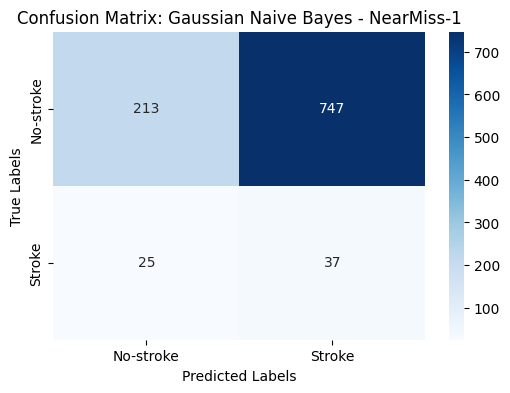

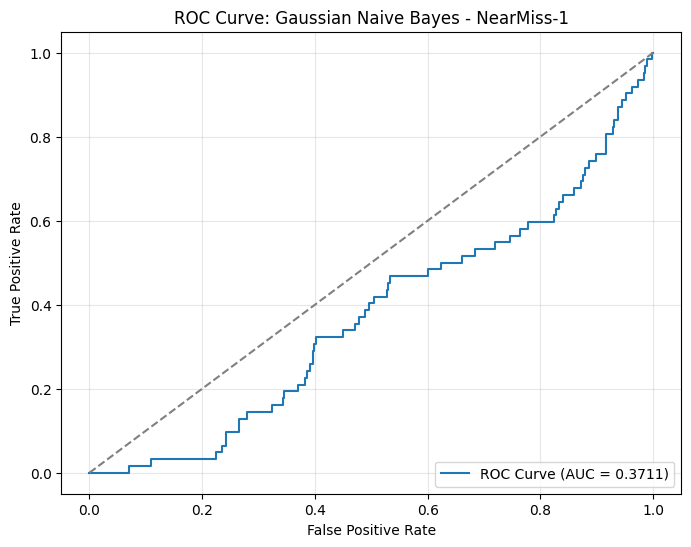


==================== Gaussian Naive Bayes with NearMiss-2 ====================

Gaussian Naive Bayes with NearMiss-2 Evaluation Metrics:
Accuracy: 0.2368
Precision: 0.0716
Recall: 0.9677
F1 Score: 0.1333
ROC-AUC Score: 0.7127

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.19      0.32       960
           1       0.07      0.97      0.13        62

    accuracy                           0.24      1022
   macro avg       0.53      0.58      0.23      1022
weighted avg       0.93      0.24      0.31      1022


Confusion Matrix:
[[182 778]
 [  2  60]]


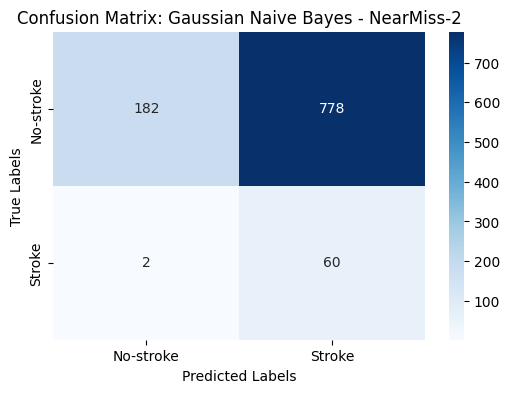

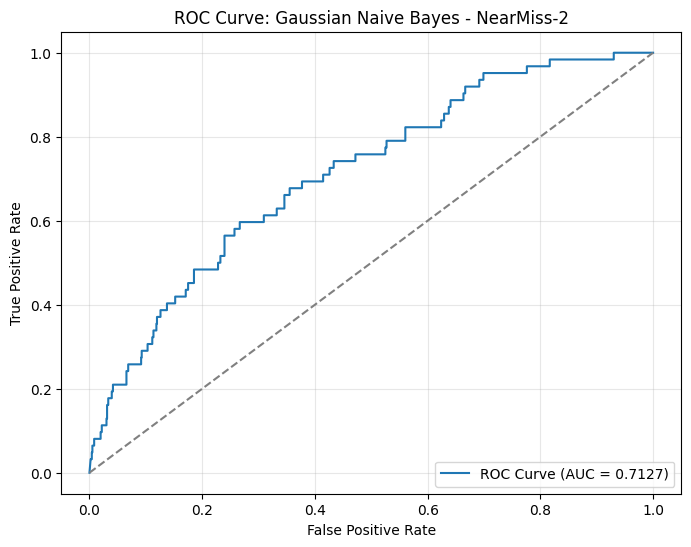


==================== Gaussian Naive Bayes with NearMiss-3 ====================

Gaussian Naive Bayes with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7524
Precision: 0.1601
Recall: 0.7258
F1 Score: 0.2624
ROC-AUC Score: 0.8052

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.73      0.26        62

    accuracy                           0.75      1022
   macro avg       0.57      0.74      0.56      1022
weighted avg       0.93      0.75      0.82      1022


Confusion Matrix:
[[724 236]
 [ 17  45]]


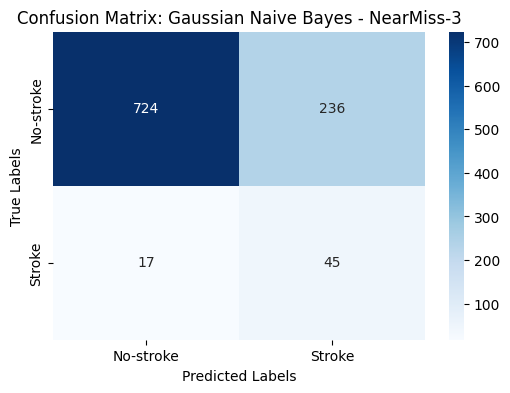

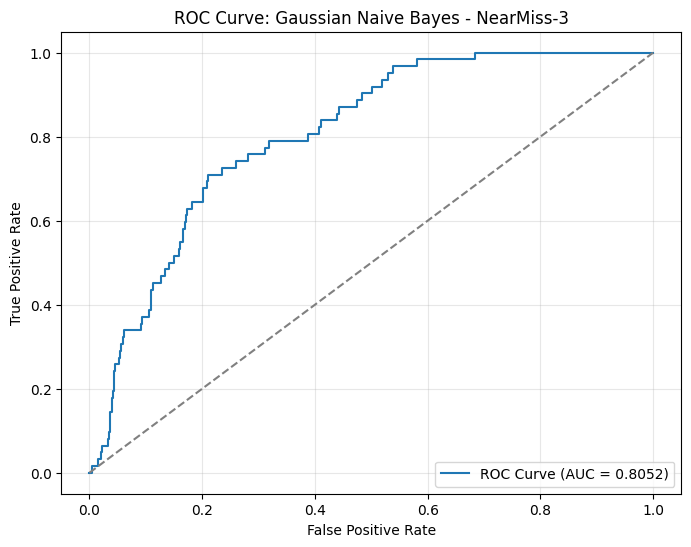


==================== Gaussian Naive Bayes with Tomek Links ====================

Gaussian Naive Bayes with Tomek Links Evaluation Metrics:
Accuracy: 0.8640
Precision: 0.2148
Recall: 0.4677
F1 Score: 0.2944
ROC-AUC Score: 0.8287

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.89      0.92       960
           1       0.21      0.47      0.29        62

    accuracy                           0.86      1022
   macro avg       0.59      0.68      0.61      1022
weighted avg       0.92      0.86      0.89      1022


Confusion Matrix:
[[854 106]
 [ 33  29]]


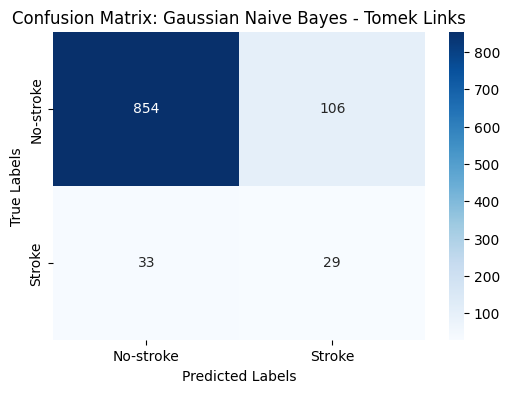

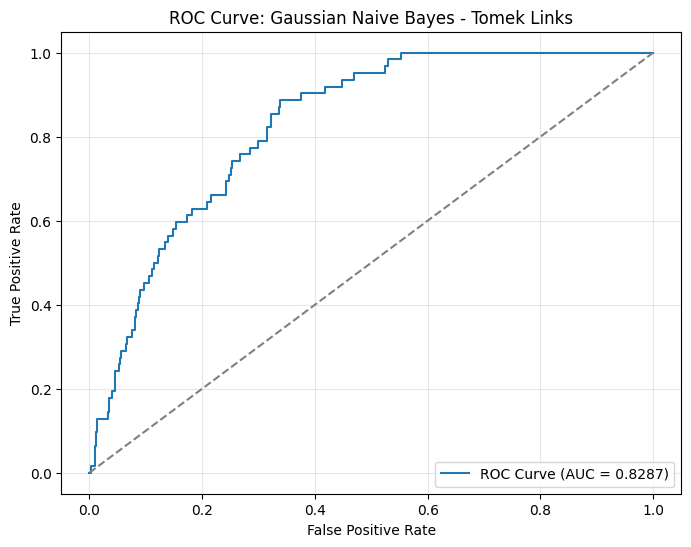


==================== Gaussian Naive Bayes with Edited Nearest Neighbors (ENN) ====================

Gaussian Naive Bayes with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.8493
Precision: 0.2051
Recall: 0.5161
F1 Score: 0.2936
ROC-AUC Score: 0.8274

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.87      0.92       960
           1       0.21      0.52      0.29        62

    accuracy                           0.85      1022
   macro avg       0.59      0.69      0.60      1022
weighted avg       0.92      0.85      0.88      1022


Confusion Matrix:
[[836 124]
 [ 30  32]]


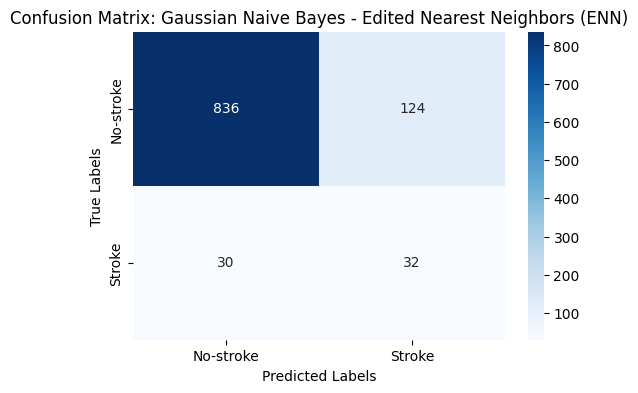

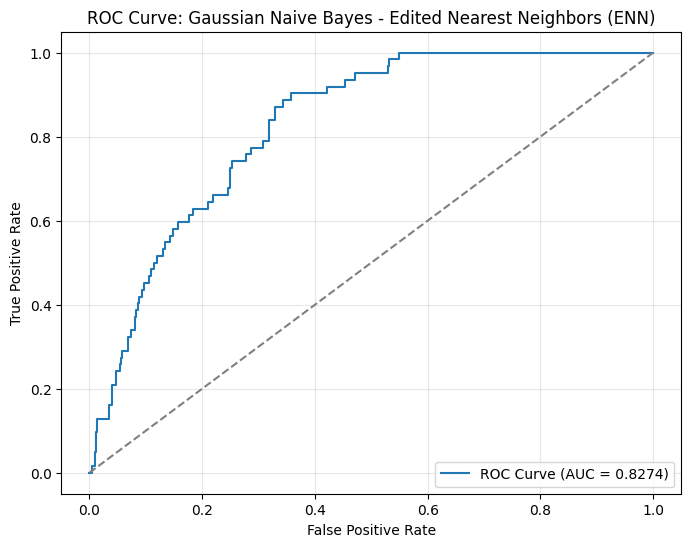


==================== Gaussian Naive Bayes with Repeated Edited Nearest Neighbors (RENN) ====================

Gaussian Naive Bayes with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8366
Precision: 0.2000
Recall: 0.5645
F1 Score: 0.2954
ROC-AUC Score: 0.8276

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.85      0.91       960
           1       0.20      0.56      0.30        62

    accuracy                           0.84      1022
   macro avg       0.58      0.71      0.60      1022
weighted avg       0.92      0.84      0.87      1022


Confusion Matrix:
[[820 140]
 [ 27  35]]


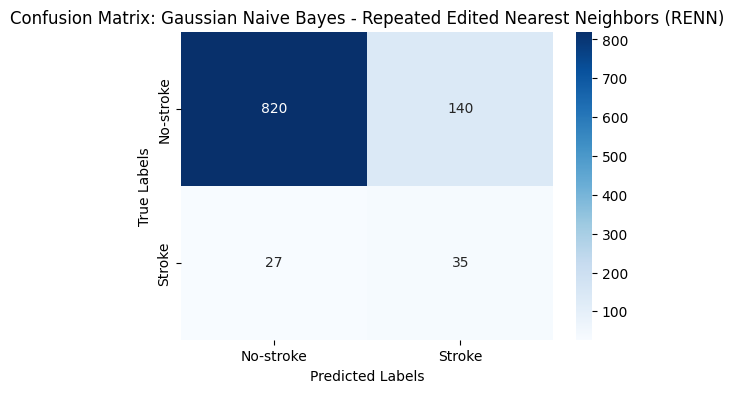

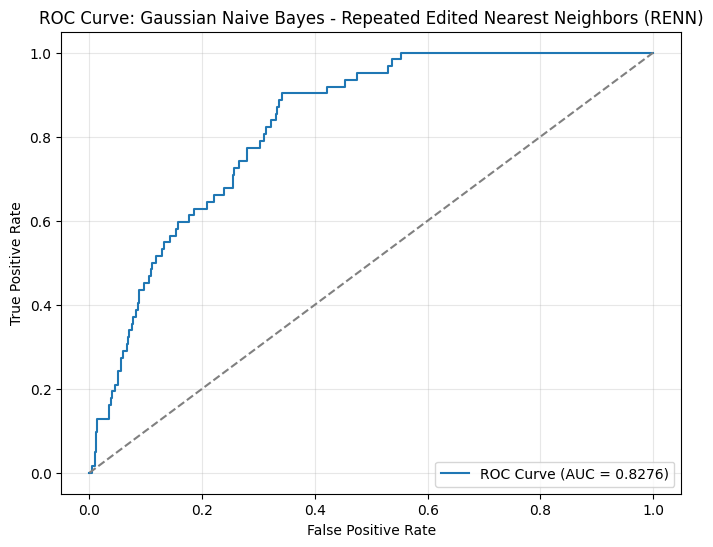


==================== Gaussian Naive Bayes with All KNN ====================

Gaussian Naive Bayes with All KNN Evaluation Metrics:
Accuracy: 0.8444
Precision: 0.2061
Recall: 0.5484
F1 Score: 0.2996
ROC-AUC Score: 0.8276

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.86      0.91       960
           1       0.21      0.55      0.30        62

    accuracy                           0.84      1022
   macro avg       0.59      0.71      0.61      1022
weighted avg       0.92      0.84      0.88      1022


Confusion Matrix:
[[829 131]
 [ 28  34]]


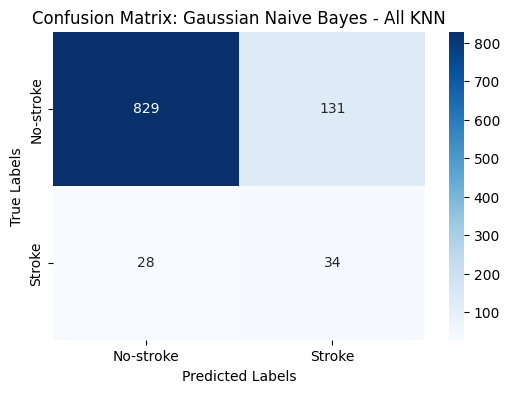

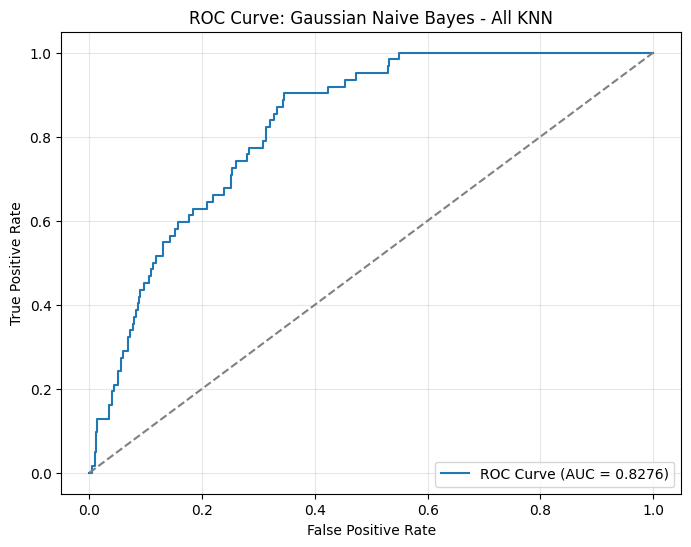


==================== Gaussian Naive Bayes with Condensed Nearest Neighbor (CNN) ====================

Gaussian Naive Bayes with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9110
Precision: 0.2623
Recall: 0.2581
F1 Score: 0.2602
ROC-AUC Score: 0.8289

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       960
           1       0.26      0.26      0.26        62

    accuracy                           0.91      1022
   macro avg       0.61      0.61      0.61      1022
weighted avg       0.91      0.91      0.91      1022


Confusion Matrix:
[[915  45]
 [ 46  16]]


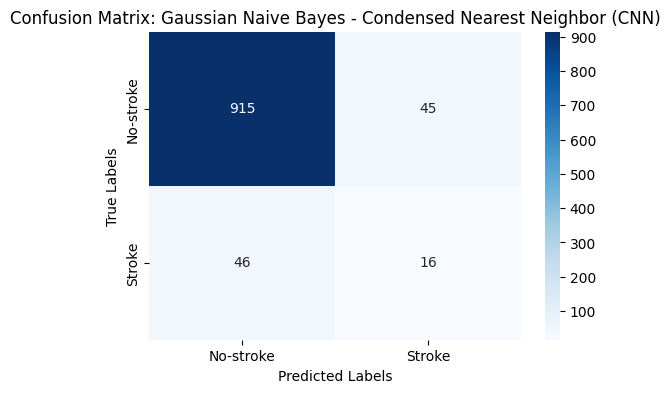

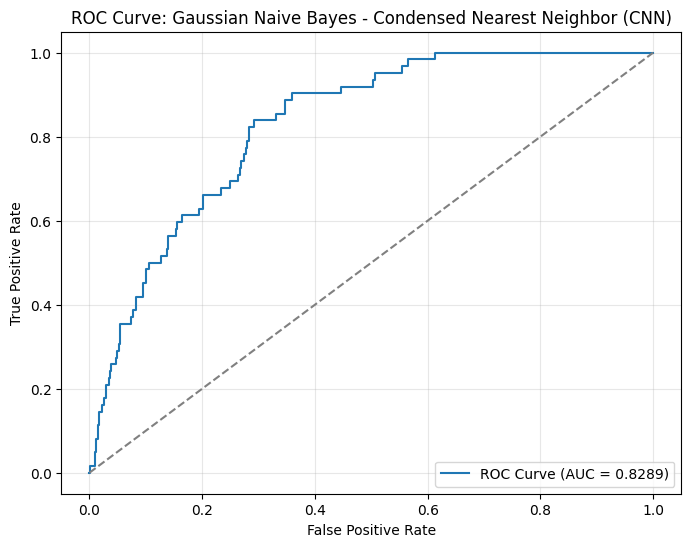


==================== Gaussian Naive Bayes with One-Sided Selection (OSS) ====================

Gaussian Naive Bayes with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.8757
Precision: 0.2269
Recall: 0.4355
F1 Score: 0.2983
ROC-AUC Score: 0.8307

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       960
           1       0.23      0.44      0.30        62

    accuracy                           0.88      1022
   macro avg       0.59      0.67      0.62      1022
weighted avg       0.92      0.88      0.89      1022


Confusion Matrix:
[[868  92]
 [ 35  27]]


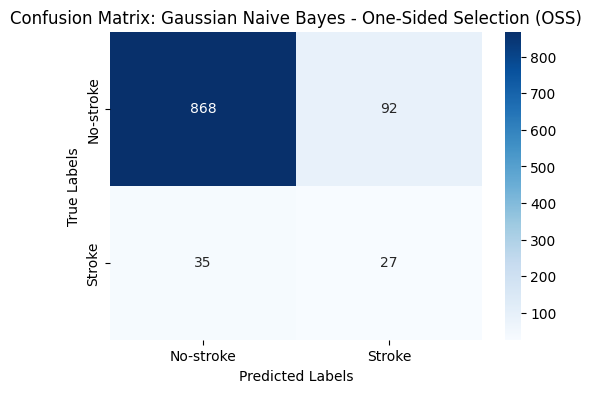

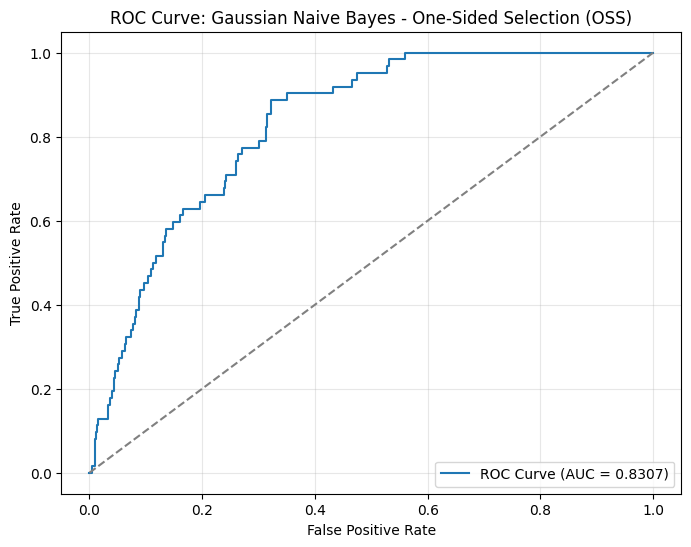


==================== Gaussian Naive Bayes with Neighborhood Cleaning Rule (NCR) ====================

Gaussian Naive Bayes with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8542
Precision: 0.2119
Recall: 0.5161
F1 Score: 0.3005
ROC-AUC Score: 0.8278

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92       960
           1       0.21      0.52      0.30        62

    accuracy                           0.85      1022
   macro avg       0.59      0.70      0.61      1022
weighted avg       0.92      0.85      0.88      1022


Confusion Matrix:
[[841 119]
 [ 30  32]]


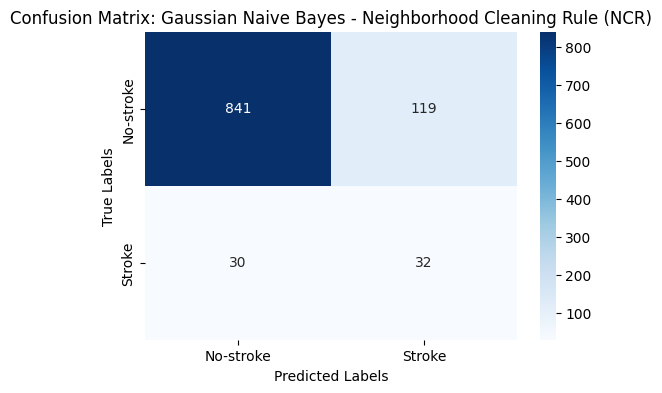

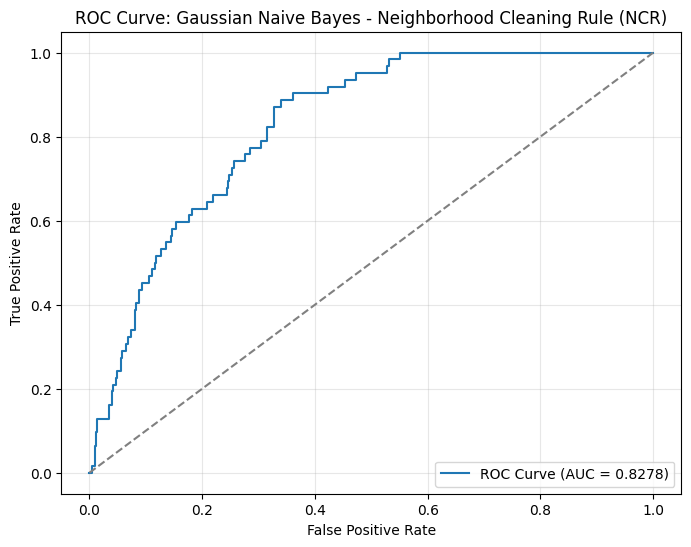


==================== Gaussian Naive Bayes with Instance Hardness Threshold ====================

Gaussian Naive Bayes with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7984
Precision: 0.1697
Recall: 0.5968
F1 Score: 0.2643
ROC-AUC Score: 0.8138

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.81      0.88       960
           1       0.17      0.60      0.26        62

    accuracy                           0.80      1022
   macro avg       0.57      0.70      0.57      1022
weighted avg       0.92      0.80      0.85      1022


Confusion Matrix:
[[779 181]
 [ 25  37]]


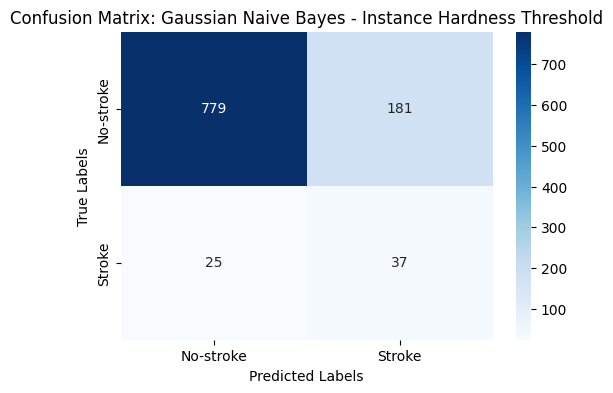

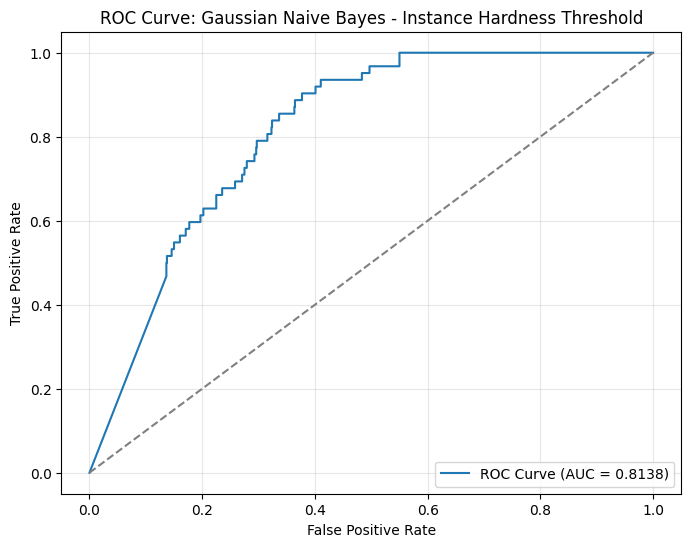


==================== Linear Discriminant Analysis (LDA) with None ====================

Linear Discriminant Analysis (LDA) with None Evaluation Metrics:
Accuracy: 0.9344
Precision: 0.2727
Recall: 0.0484
F1 Score: 0.0822
ROC-AUC Score: 0.8417

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.27      0.05      0.08        62

    accuracy                           0.93      1022
   macro avg       0.61      0.52      0.52      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[952   8]
 [ 59   3]]


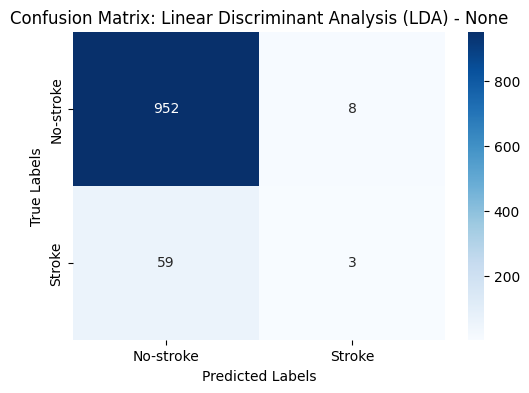

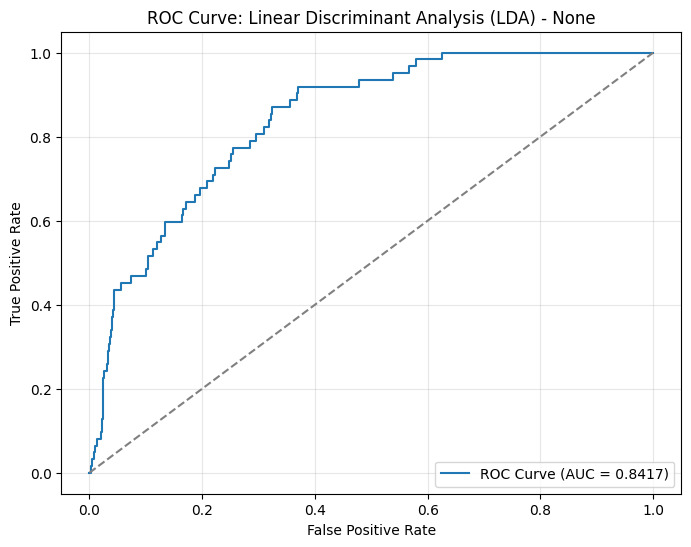


==================== Linear Discriminant Analysis (LDA) with SMOTE ====================

Linear Discriminant Analysis (LDA) with SMOTE Evaluation Metrics:
Accuracy: 0.7798
Precision: 0.1618
Recall: 0.6290
F1 Score: 0.2574
ROC-AUC Score: 0.7776

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.79      0.87       960
           1       0.16      0.63      0.26        62

    accuracy                           0.78      1022
   macro avg       0.57      0.71      0.56      1022
weighted avg       0.92      0.78      0.83      1022


Confusion Matrix:
[[758 202]
 [ 23  39]]


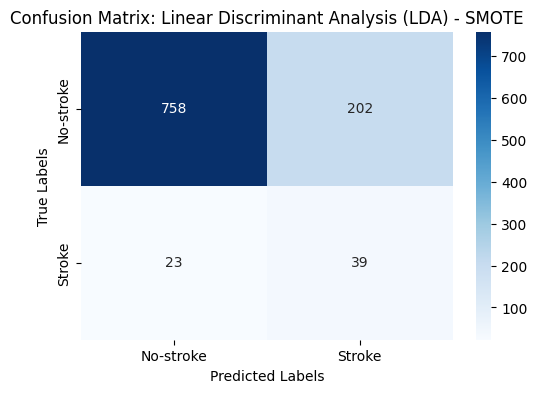

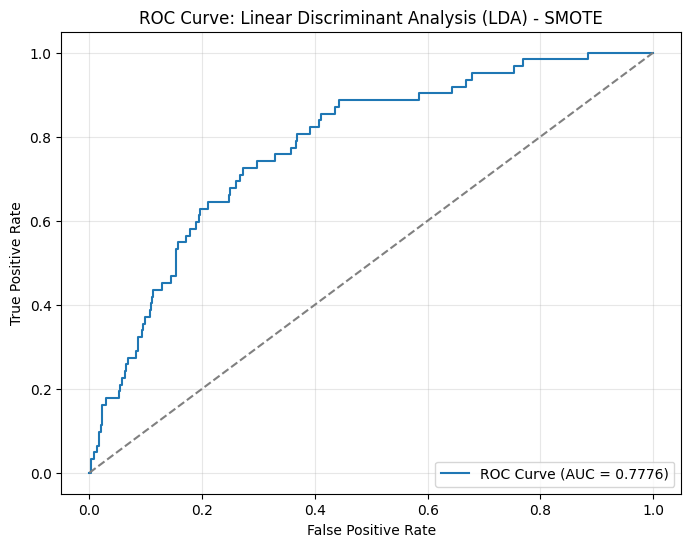


==================== Linear Discriminant Analysis (LDA) with ClusterCentroids ====================

Linear Discriminant Analysis (LDA) with ClusterCentroids Evaluation Metrics:
Accuracy: 0.3415
Precision: 0.0821
Recall: 0.9677
F1 Score: 0.1513
ROC-AUC Score: 0.7199

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.30      0.46       960
           1       0.08      0.97      0.15        62

    accuracy                           0.34      1022
   macro avg       0.54      0.63      0.31      1022
weighted avg       0.94      0.34      0.44      1022


Confusion Matrix:
[[289 671]
 [  2  60]]


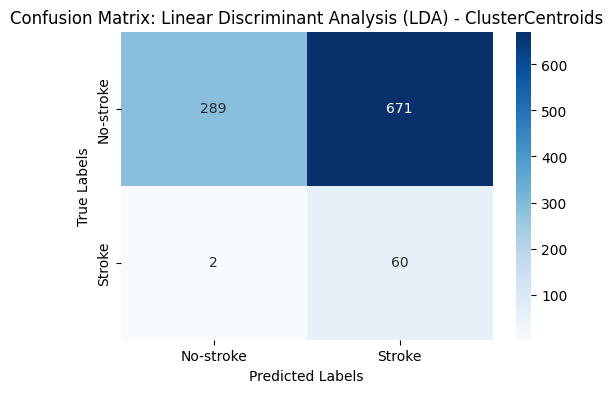

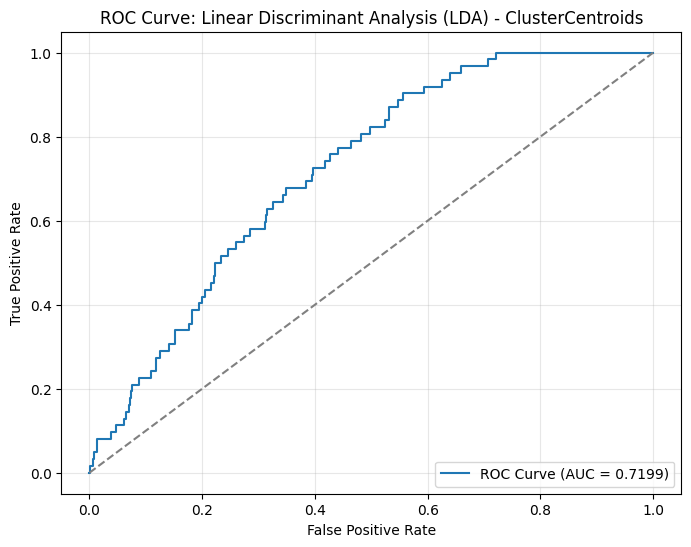


==================== Linear Discriminant Analysis (LDA) with Random Undersampling ====================

Linear Discriminant Analysis (LDA) with Random Undersampling Evaluation Metrics:
Accuracy: 0.7339
Precision: 0.1523
Recall: 0.7419
F1 Score: 0.2527
ROC-AUC Score: 0.8431

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.73      0.84       960
           1       0.15      0.74      0.25        62

    accuracy                           0.73      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.73      0.80      1022


Confusion Matrix:
[[704 256]
 [ 16  46]]


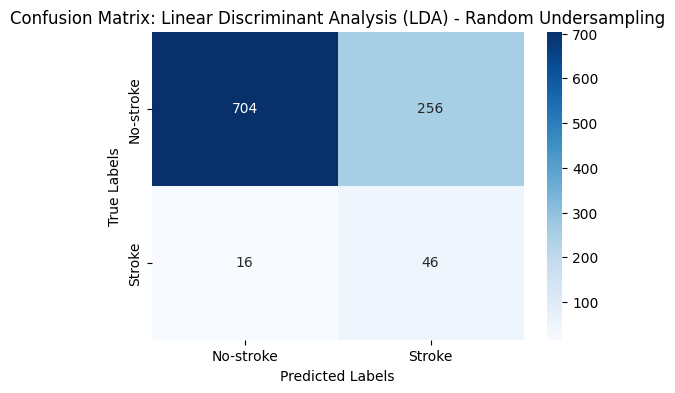

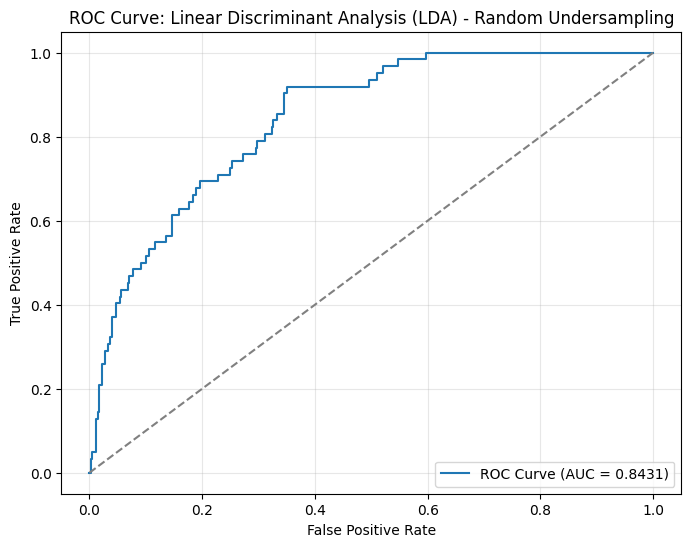


==================== Linear Discriminant Analysis (LDA) with NearMiss-1 ====================

Linear Discriminant Analysis (LDA) with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2573
Precision: 0.0480
Recall: 0.5968
F1 Score: 0.0888
ROC-AUC Score: 0.3939

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.24      0.37       960
           1       0.05      0.60      0.09        62

    accuracy                           0.26      1022
   macro avg       0.47      0.42      0.23      1022
weighted avg       0.85      0.26      0.36      1022


Confusion Matrix:
[[226 734]
 [ 25  37]]


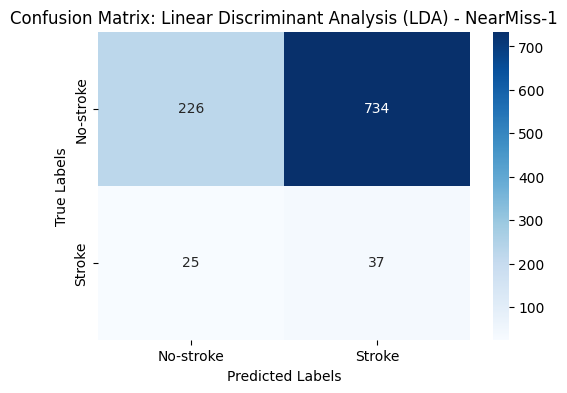

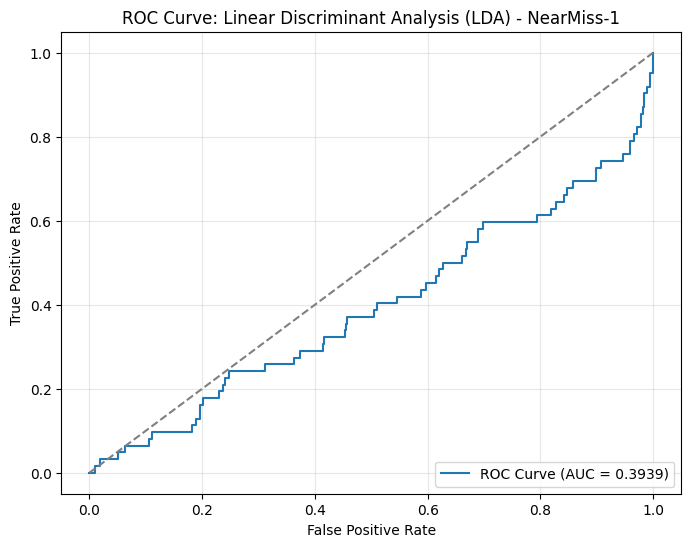


==================== Linear Discriminant Analysis (LDA) with NearMiss-2 ====================

Linear Discriminant Analysis (LDA) with NearMiss-2 Evaluation Metrics:
Accuracy: 0.6771
Precision: 0.1398
Recall: 0.8387
F1 Score: 0.2396
ROC-AUC Score: 0.7885

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.67      0.80       960
           1       0.14      0.84      0.24        62

    accuracy                           0.68      1022
   macro avg       0.56      0.75      0.52      1022
weighted avg       0.93      0.68      0.76      1022


Confusion Matrix:
[[640 320]
 [ 10  52]]


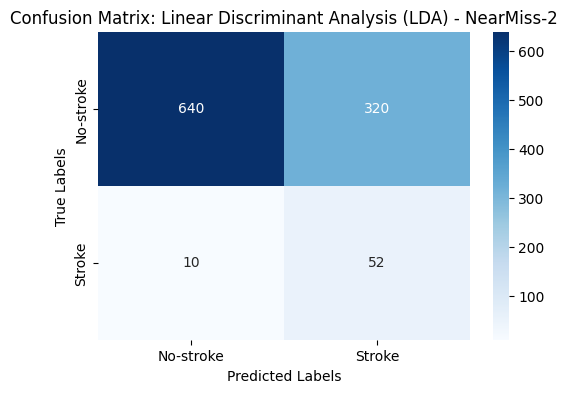

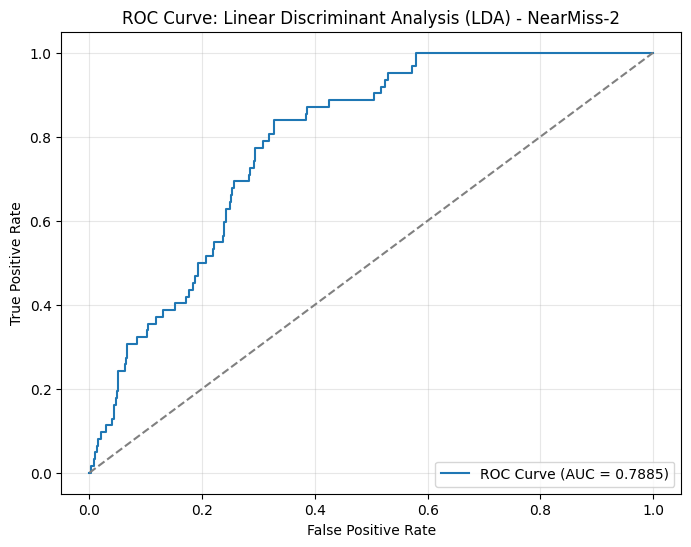


==================== Linear Discriminant Analysis (LDA) with NearMiss-3 ====================

Linear Discriminant Analysis (LDA) with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7153
Precision: 0.1318
Recall: 0.6613
F1 Score: 0.2198
ROC-AUC Score: 0.7704

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.72      0.83       960
           1       0.13      0.66      0.22        62

    accuracy                           0.72      1022
   macro avg       0.55      0.69      0.52      1022
weighted avg       0.92      0.72      0.79      1022


Confusion Matrix:
[[690 270]
 [ 21  41]]


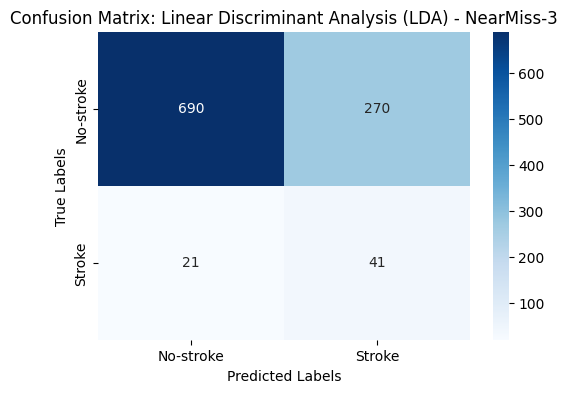

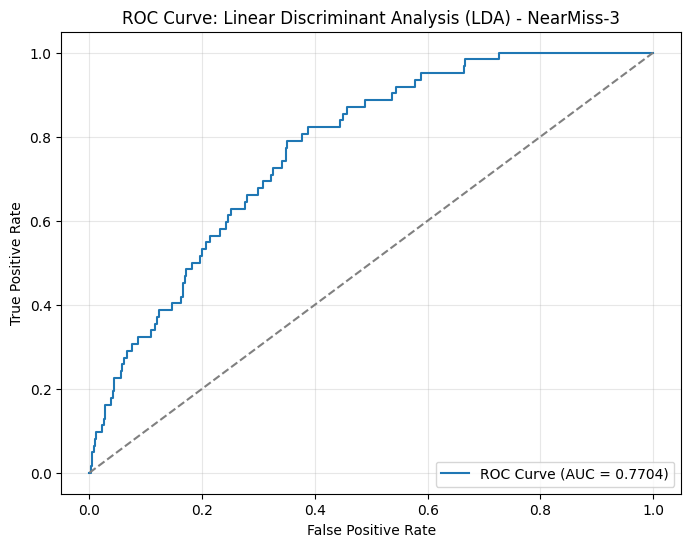


==================== Linear Discriminant Analysis (LDA) with Tomek Links ====================

Linear Discriminant Analysis (LDA) with Tomek Links Evaluation Metrics:
Accuracy: 0.9315
Precision: 0.2500
Recall: 0.0645
F1 Score: 0.1026
ROC-AUC Score: 0.8413

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.25      0.06      0.10        62

    accuracy                           0.93      1022
   macro avg       0.60      0.53      0.53      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[948  12]
 [ 58   4]]


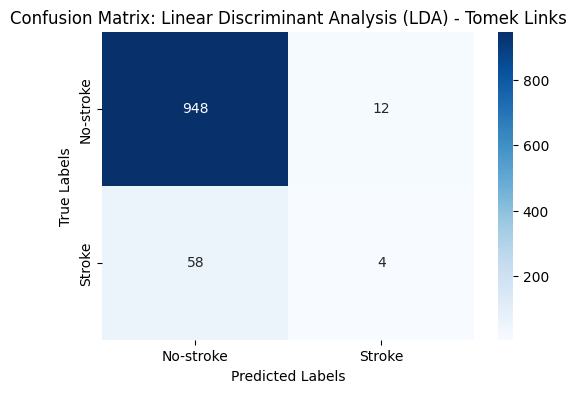

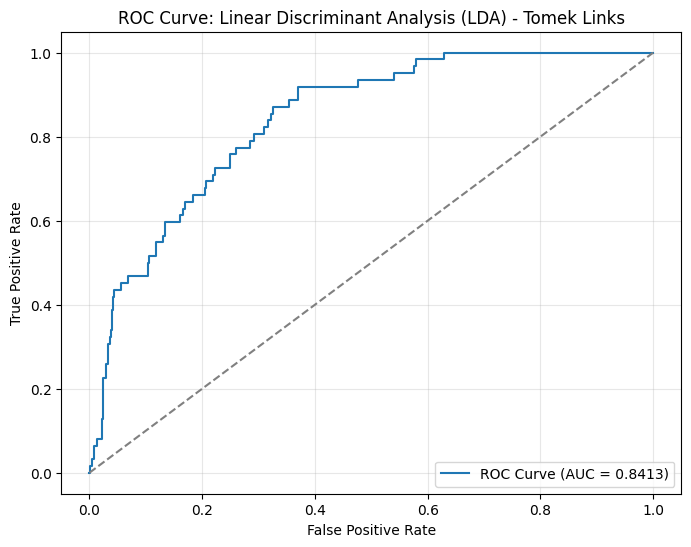


==================== Linear Discriminant Analysis (LDA) with Edited Nearest Neighbors (ENN) ====================

Linear Discriminant Analysis (LDA) with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9286
Precision: 0.3878
Recall: 0.3065
F1 Score: 0.3423
ROC-AUC Score: 0.8405

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       960
           1       0.39      0.31      0.34        62

    accuracy                           0.93      1022
   macro avg       0.67      0.64      0.65      1022
weighted avg       0.92      0.93      0.92      1022


Confusion Matrix:
[[930  30]
 [ 43  19]]


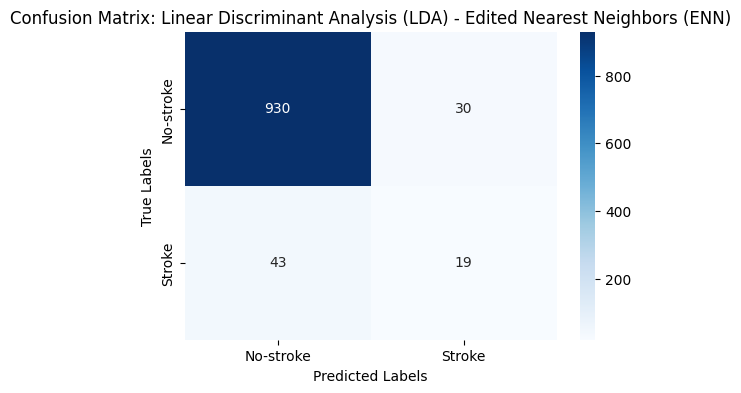

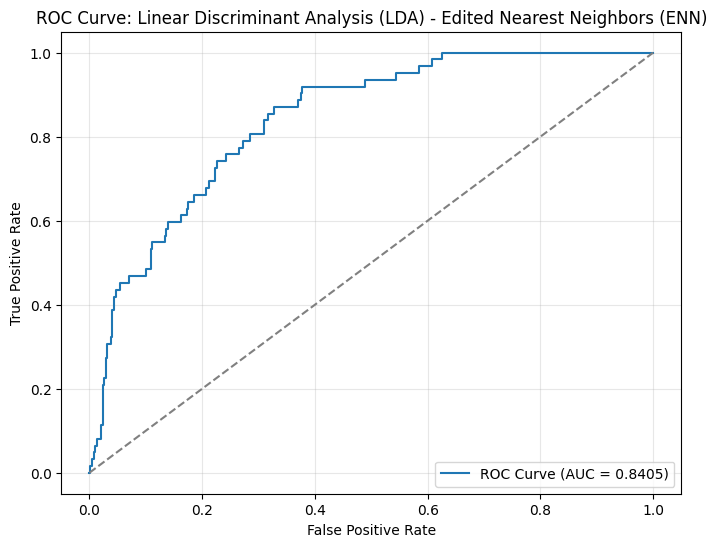


==================== Linear Discriminant Analysis (LDA) with Repeated Edited Nearest Neighbors (RENN) ====================

Linear Discriminant Analysis (LDA) with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9178
Precision: 0.3553
Recall: 0.4355
F1 Score: 0.3913
ROC-AUC Score: 0.8414

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       960
           1       0.36      0.44      0.39        62

    accuracy                           0.92      1022
   macro avg       0.66      0.69      0.67      1022
weighted avg       0.93      0.92      0.92      1022


Confusion Matrix:
[[911  49]
 [ 35  27]]


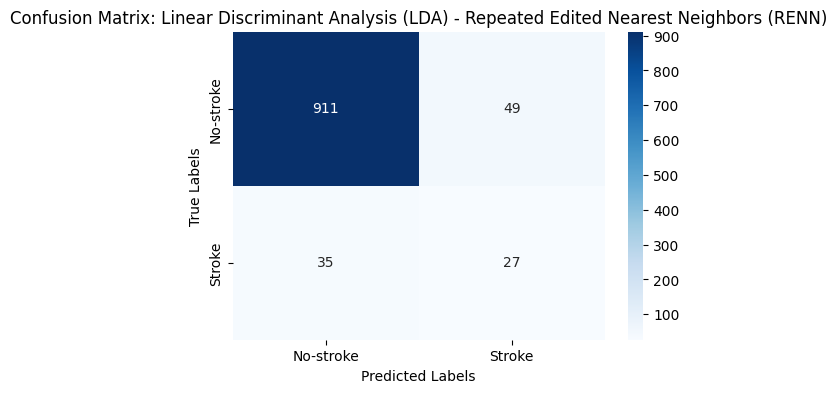

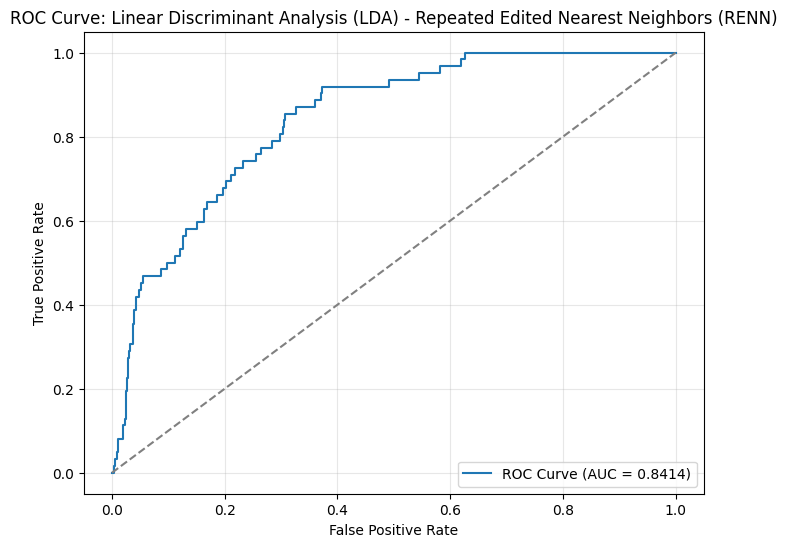


==================== Linear Discriminant Analysis (LDA) with All KNN ====================

Linear Discriminant Analysis (LDA) with All KNN Evaluation Metrics:
Accuracy: 0.9247
Precision: 0.3770
Recall: 0.3710
F1 Score: 0.3740
ROC-AUC Score: 0.8413

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       960
           1       0.38      0.37      0.37        62

    accuracy                           0.92      1022
   macro avg       0.67      0.67      0.67      1022
weighted avg       0.92      0.92      0.92      1022


Confusion Matrix:
[[922  38]
 [ 39  23]]


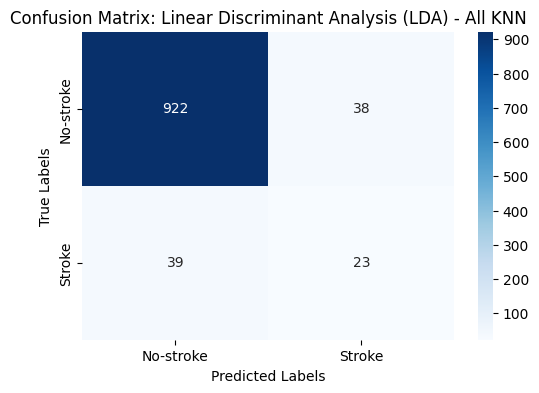

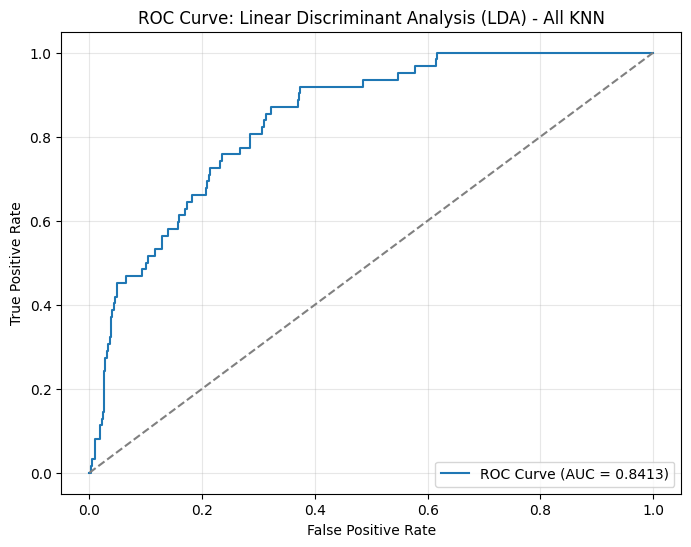


==================== Linear Discriminant Analysis (LDA) with Condensed Nearest Neighbor (CNN) ====================

Linear Discriminant Analysis (LDA) with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9374
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8084

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[958   2]
 [ 62   0]]


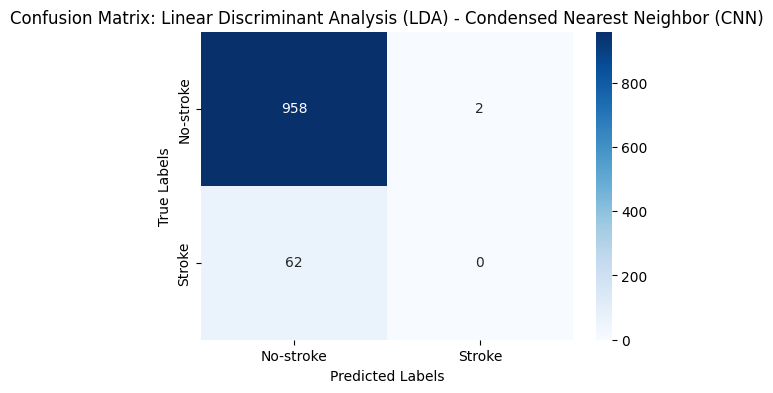

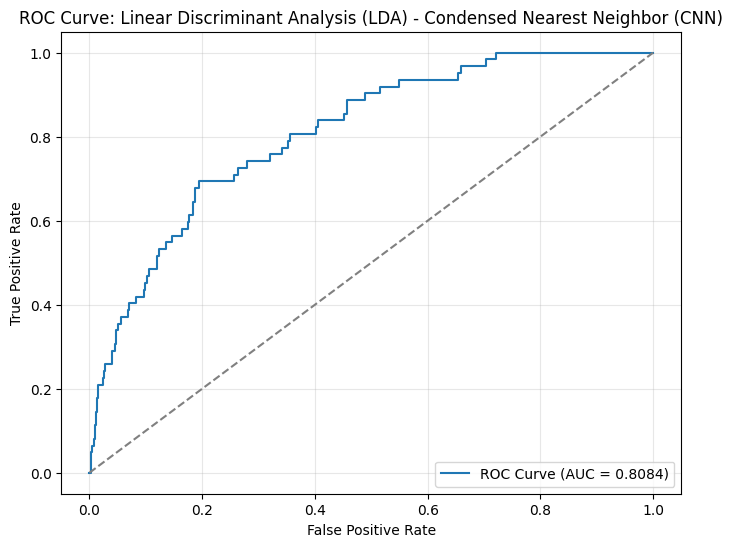


==================== Linear Discriminant Analysis (LDA) with One-Sided Selection (OSS) ====================

Linear Discriminant Analysis (LDA) with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9315
Precision: 0.2500
Recall: 0.0645
F1 Score: 0.1026
ROC-AUC Score: 0.8409

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.25      0.06      0.10        62

    accuracy                           0.93      1022
   macro avg       0.60      0.53      0.53      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[948  12]
 [ 58   4]]


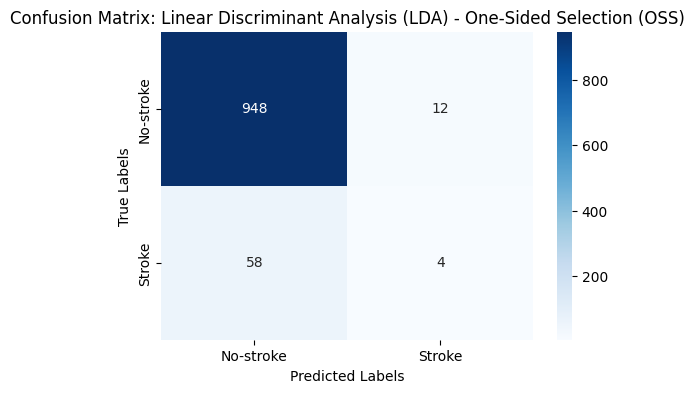

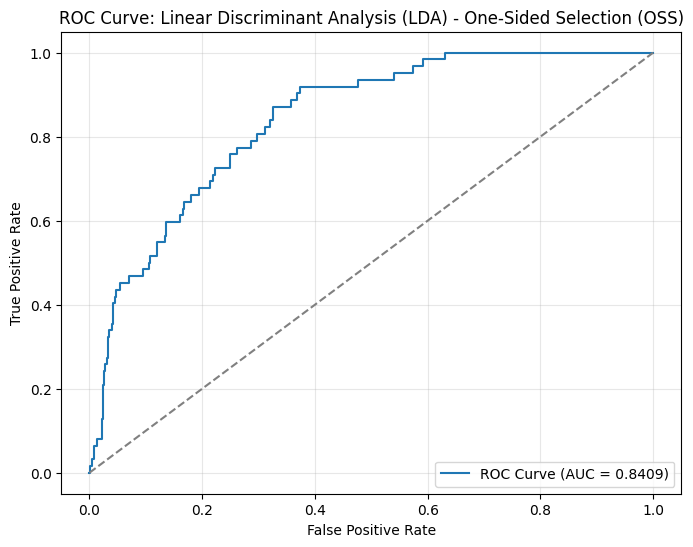


==================== Linear Discriminant Analysis (LDA) with Neighborhood Cleaning Rule (NCR) ====================

Linear Discriminant Analysis (LDA) with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9286
Precision: 0.3659
Recall: 0.2419
F1 Score: 0.2913
ROC-AUC Score: 0.8408

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.37      0.24      0.29        62

    accuracy                           0.93      1022
   macro avg       0.66      0.61      0.63      1022
weighted avg       0.92      0.93      0.92      1022


Confusion Matrix:
[[934  26]
 [ 47  15]]


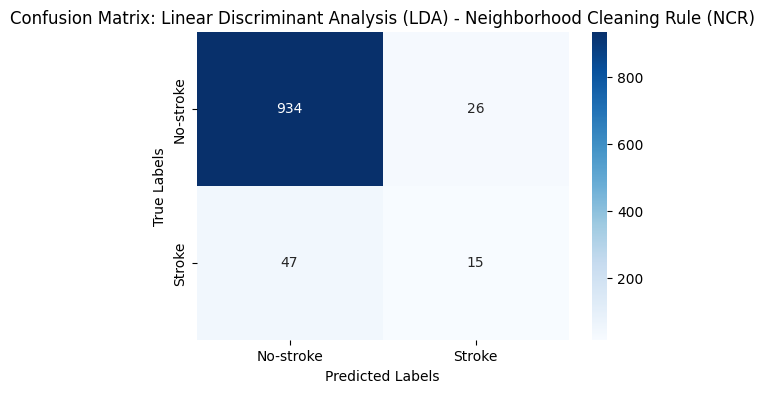

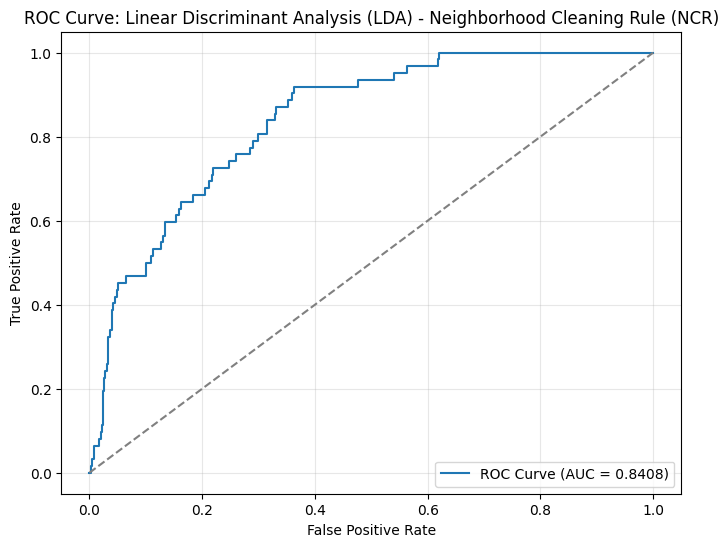


==================== Linear Discriminant Analysis (LDA) with Instance Hardness Threshold ====================

Linear Discriminant Analysis (LDA) with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7661
Precision: 0.1710
Recall: 0.7419
F1 Score: 0.2779
ROC-AUC Score: 0.8406

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       960
           1       0.17      0.74      0.28        62

    accuracy                           0.77      1022
   macro avg       0.57      0.75      0.57      1022
weighted avg       0.93      0.77      0.83      1022


Confusion Matrix:
[[737 223]
 [ 16  46]]


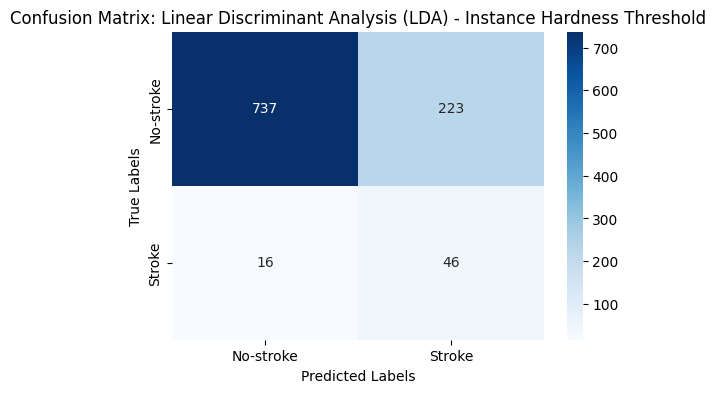

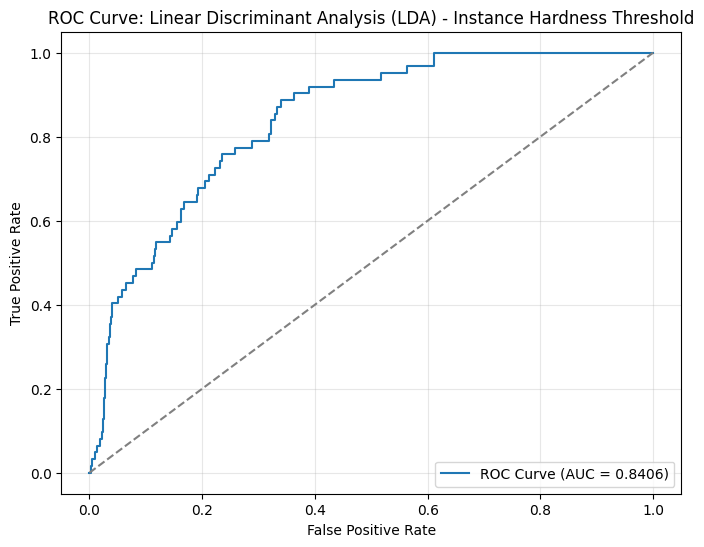


==================== Quadratic Discriminant Analysis (QDA) with None ====================

Quadratic Discriminant Analysis (QDA) with None Evaluation Metrics:
Accuracy: 0.8796
Precision: 0.2393
Recall: 0.4516
F1 Score: 0.3128
ROC-AUC Score: 0.8301

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.91      0.93       960
           1       0.24      0.45      0.31        62

    accuracy                           0.88      1022
   macro avg       0.60      0.68      0.62      1022
weighted avg       0.92      0.88      0.90      1022


Confusion Matrix:
[[871  89]
 [ 34  28]]


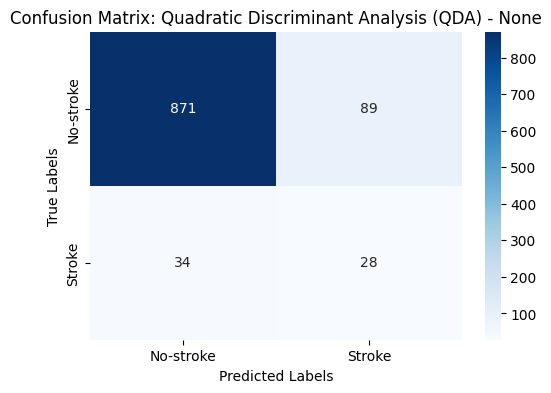

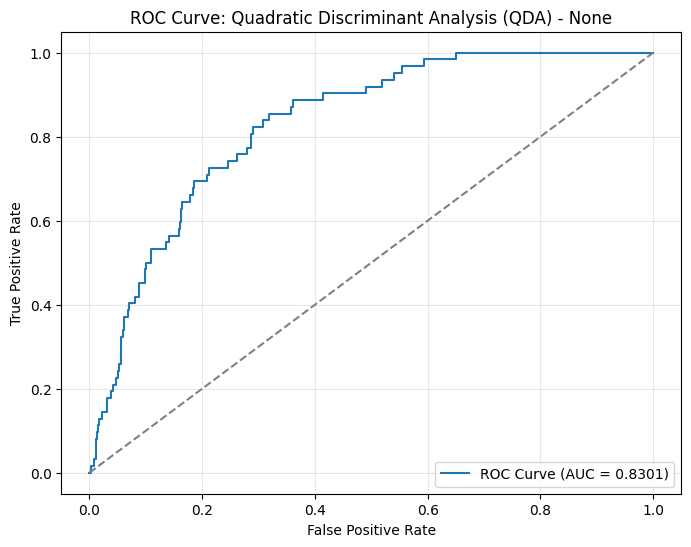


==================== Quadratic Discriminant Analysis (QDA) with SMOTE ====================

Quadratic Discriminant Analysis (QDA) with SMOTE Evaluation Metrics:
Accuracy: 0.7710
Precision: 0.1560
Recall: 0.6290
F1 Score: 0.2500
ROC-AUC Score: 0.7988

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.78      0.86       960
           1       0.16      0.63      0.25        62

    accuracy                           0.77      1022
   macro avg       0.56      0.70      0.56      1022
weighted avg       0.92      0.77      0.83      1022


Confusion Matrix:
[[749 211]
 [ 23  39]]


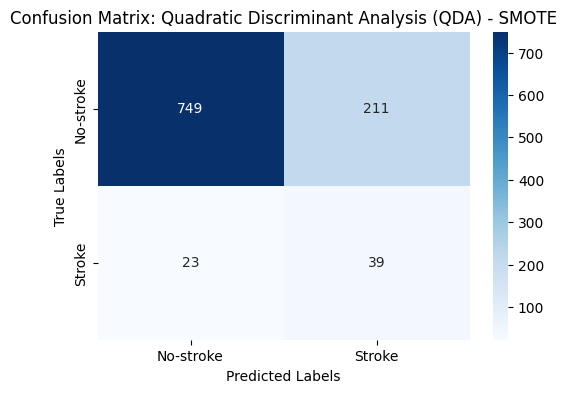

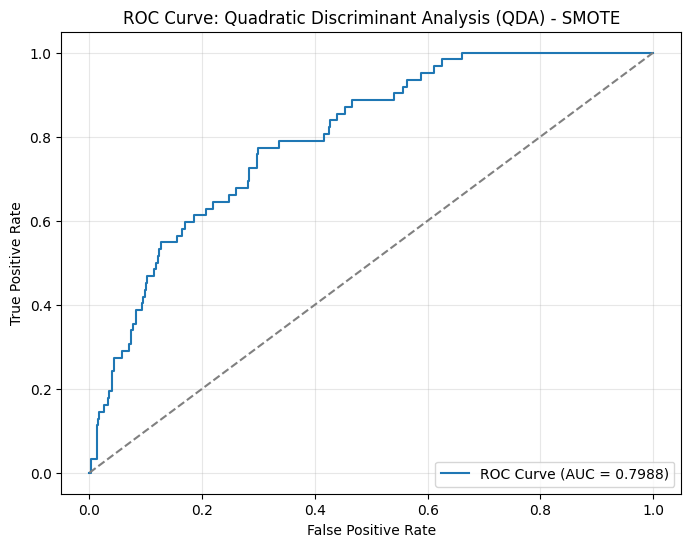


==================== Quadratic Discriminant Analysis (QDA) with ClusterCentroids ====================

Quadratic Discriminant Analysis (QDA) with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2769
Precision: 0.0666
Recall: 0.8387
F1 Score: 0.1234
ROC-AUC Score: 0.6389

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.24      0.38       960
           1       0.07      0.84      0.12        62

    accuracy                           0.28      1022
   macro avg       0.51      0.54      0.25      1022
weighted avg       0.90      0.28      0.37      1022


Confusion Matrix:
[[231 729]
 [ 10  52]]


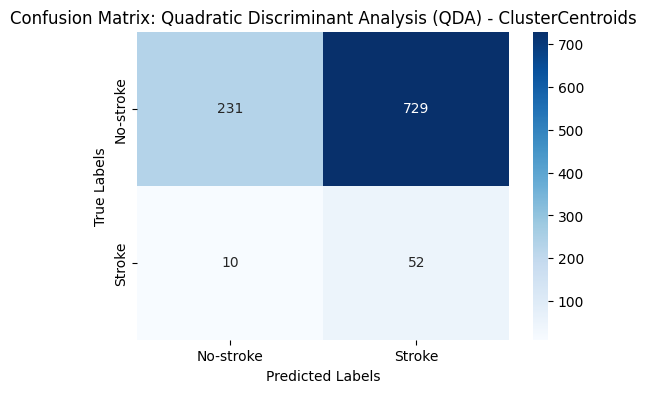

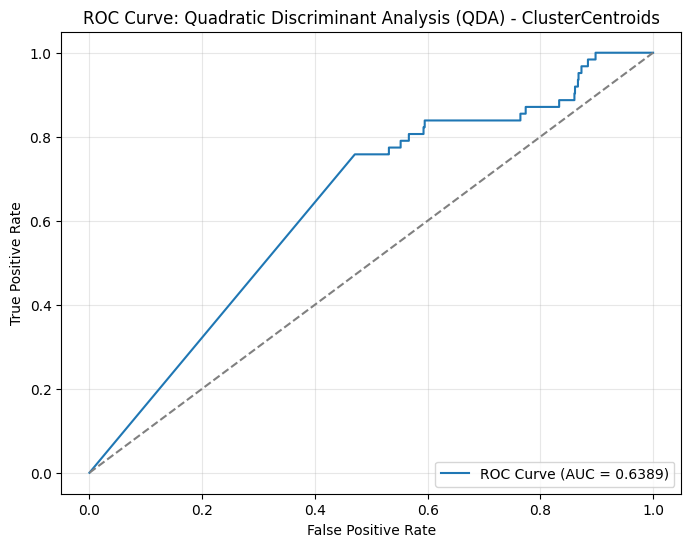


==================== Quadratic Discriminant Analysis (QDA) with Random Undersampling ====================

Quadratic Discriminant Analysis (QDA) with Random Undersampling Evaluation Metrics:
Accuracy: 0.7456
Precision: 0.1562
Recall: 0.7258
F1 Score: 0.2571
ROC-AUC Score: 0.8298

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.73      0.26        62

    accuracy                           0.75      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[717 243]
 [ 17  45]]


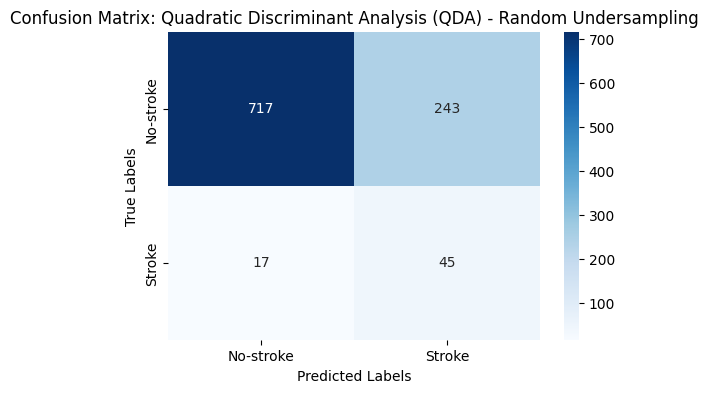

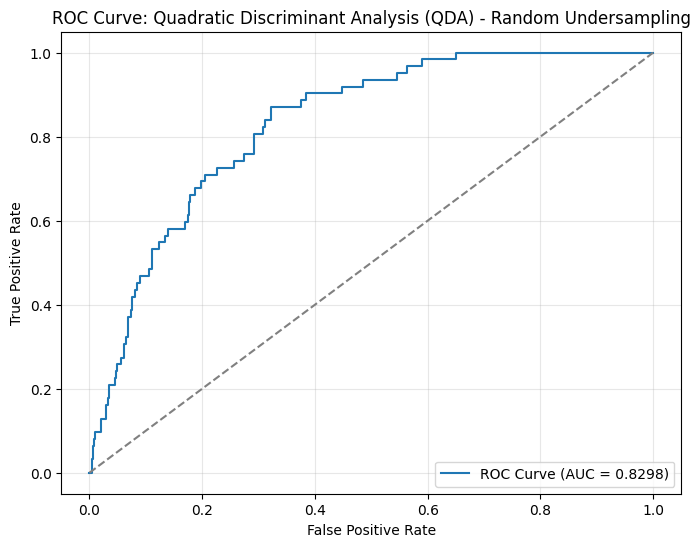


==================== Quadratic Discriminant Analysis (QDA) with NearMiss-1 ====================

Quadratic Discriminant Analysis (QDA) with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2378
Precision: 0.0502
Recall: 0.6452
F1 Score: 0.0931
ROC-AUC Score: 0.3405

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.21      0.34       960
           1       0.05      0.65      0.09        62

    accuracy                           0.24      1022
   macro avg       0.48      0.43      0.22      1022
weighted avg       0.85      0.24      0.33      1022


Confusion Matrix:
[[203 757]
 [ 22  40]]


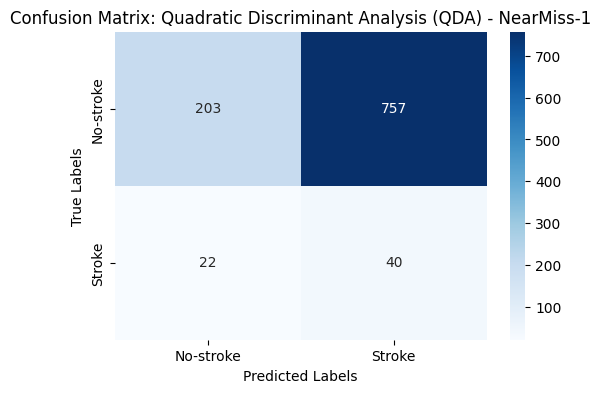

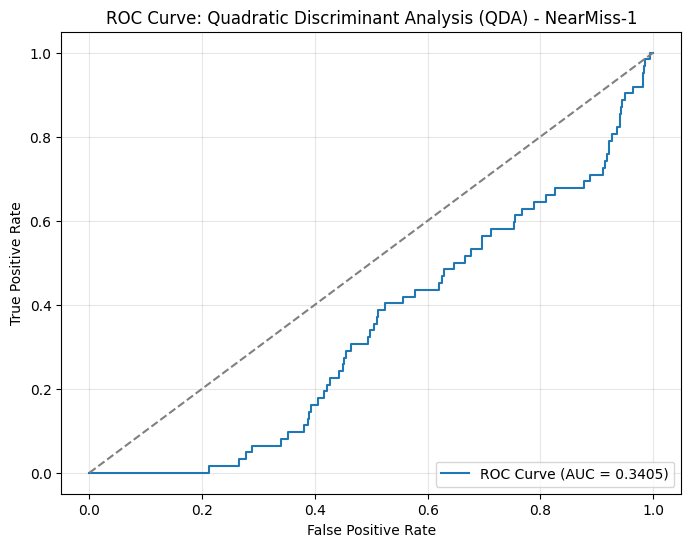


==================== Quadratic Discriminant Analysis (QDA) with NearMiss-2 ====================

Quadratic Discriminant Analysis (QDA) with NearMiss-2 Evaluation Metrics:
Accuracy: 0.2515
Precision: 0.0739
Recall: 0.9839
F1 Score: 0.1375
ROC-AUC Score: 0.7048

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.20      0.34       960
           1       0.07      0.98      0.14        62

    accuracy                           0.25      1022
   macro avg       0.53      0.59      0.24      1022
weighted avg       0.94      0.25      0.33      1022


Confusion Matrix:
[[196 764]
 [  1  61]]


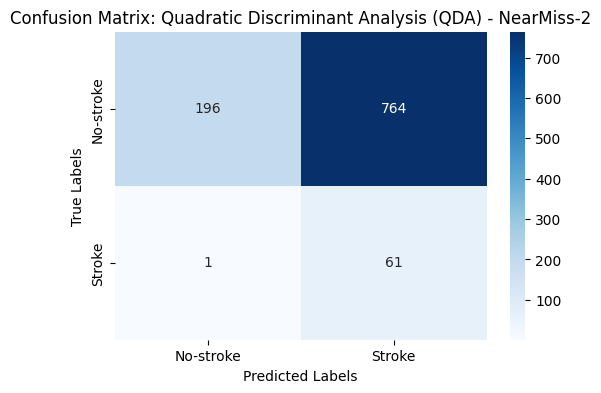

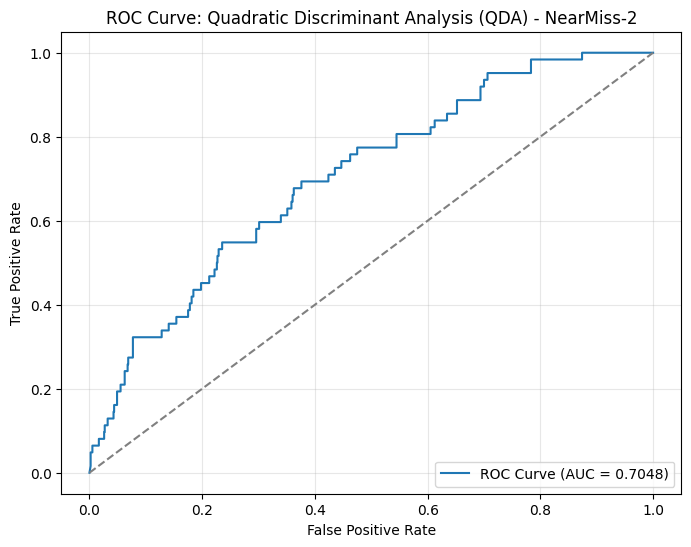


==================== Quadratic Discriminant Analysis (QDA) with NearMiss-3 ====================

Quadratic Discriminant Analysis (QDA) with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7436
Precision: 0.1403
Recall: 0.6290
F1 Score: 0.2294
ROC-AUC Score: 0.7839

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.75      0.85       960
           1       0.14      0.63      0.23        62

    accuracy                           0.74      1022
   macro avg       0.55      0.69      0.54      1022
weighted avg       0.92      0.74      0.81      1022


Confusion Matrix:
[[721 239]
 [ 23  39]]


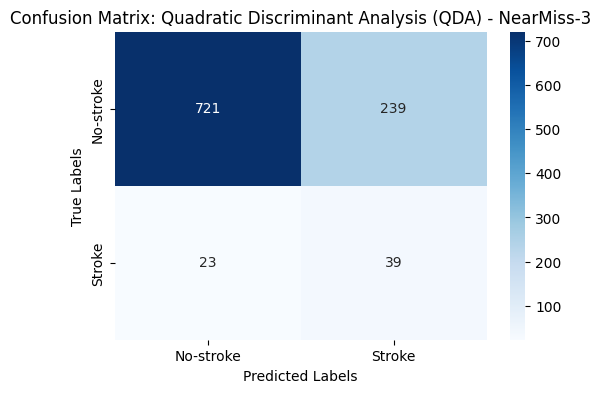

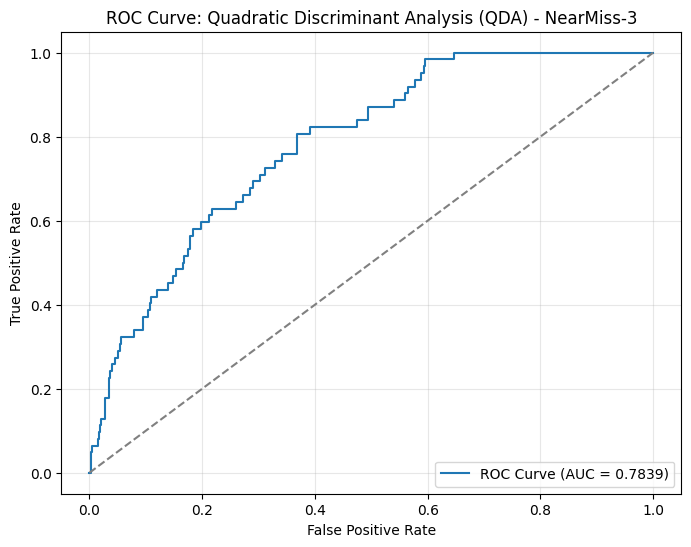


==================== Quadratic Discriminant Analysis (QDA) with Tomek Links ====================

Quadratic Discriminant Analysis (QDA) with Tomek Links Evaluation Metrics:
Accuracy: 0.8748
Precision: 0.2339
Recall: 0.4677
F1 Score: 0.3118
ROC-AUC Score: 0.8300

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       960
           1       0.23      0.47      0.31        62

    accuracy                           0.87      1022
   macro avg       0.60      0.68      0.62      1022
weighted avg       0.92      0.87      0.89      1022


Confusion Matrix:
[[865  95]
 [ 33  29]]


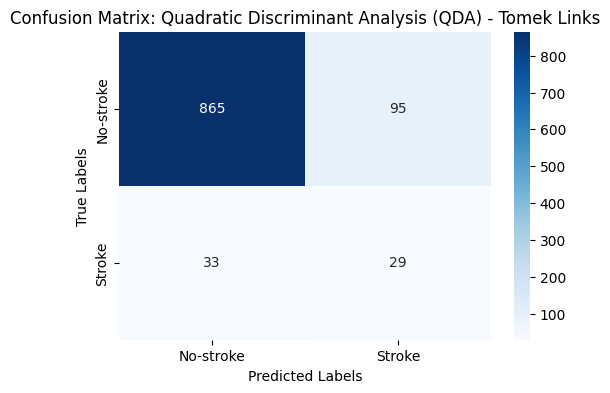

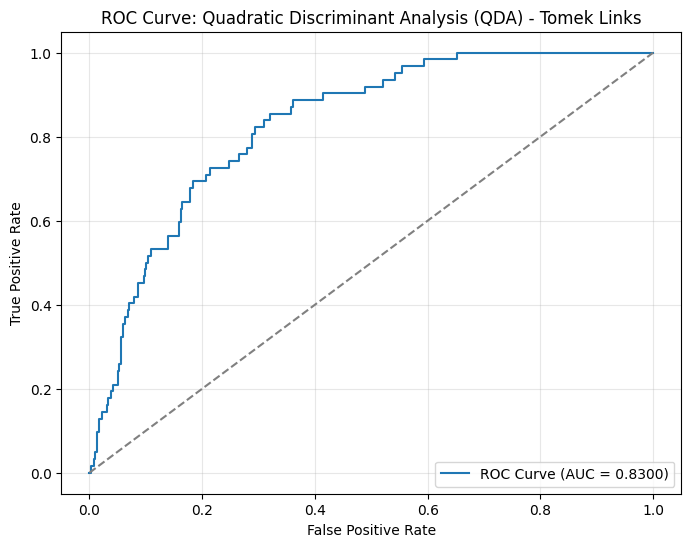


==================== Quadratic Discriminant Analysis (QDA) with Edited Nearest Neighbors (ENN) ====================

Quadratic Discriminant Analysis (QDA) with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.8571
Precision: 0.2200
Recall: 0.5323
F1 Score: 0.3113
ROC-AUC Score: 0.8280

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92       960
           1       0.22      0.53      0.31        62

    accuracy                           0.86      1022
   macro avg       0.59      0.71      0.62      1022
weighted avg       0.92      0.86      0.88      1022


Confusion Matrix:
[[843 117]
 [ 29  33]]


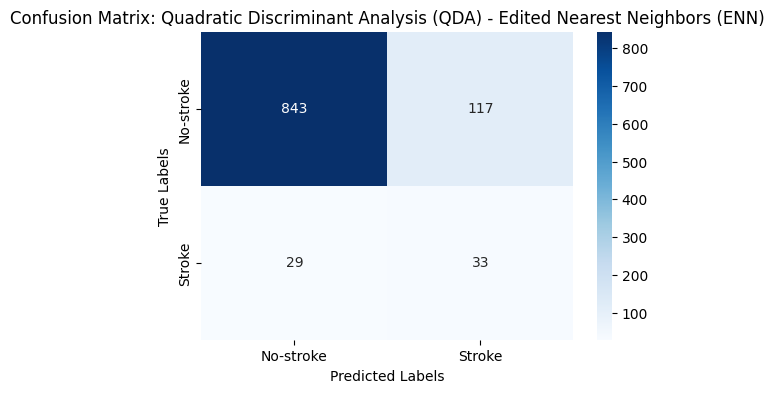

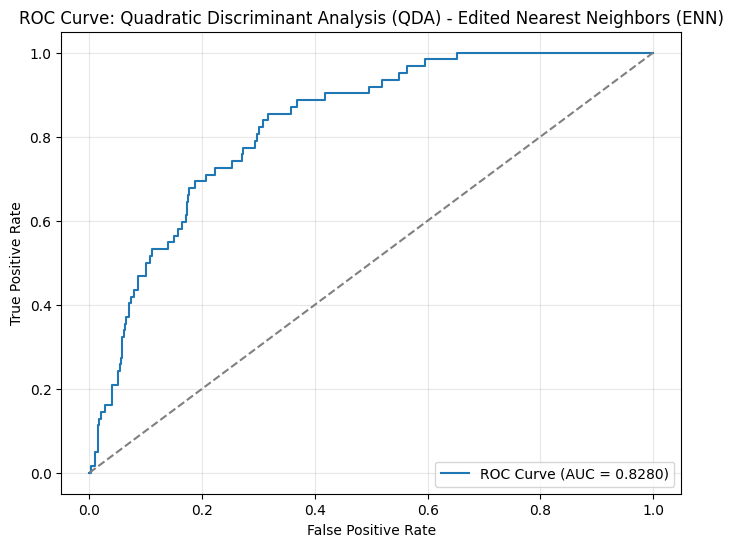


==================== Quadratic Discriminant Analysis (QDA) with Repeated Edited Nearest Neighbors (RENN) ====================

Quadratic Discriminant Analysis (QDA) with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8376
Precision: 0.1977
Recall: 0.5484
F1 Score: 0.2906
ROC-AUC Score: 0.8285

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.86      0.91       960
           1       0.20      0.55      0.29        62

    accuracy                           0.84      1022
   macro avg       0.58      0.70      0.60      1022
weighted avg       0.92      0.84      0.87      1022


Confusion Matrix:
[[822 138]
 [ 28  34]]


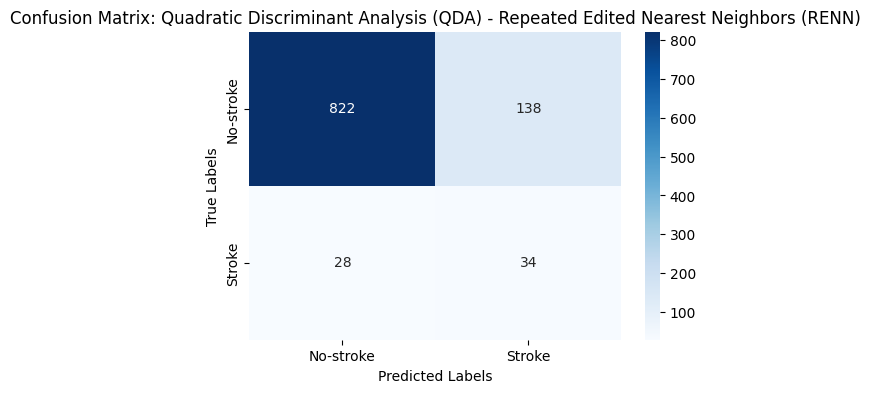

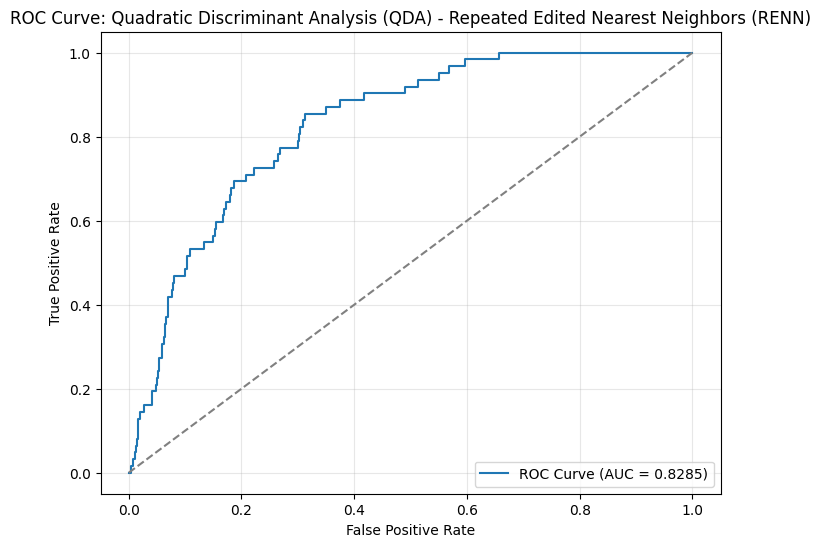


==================== Quadratic Discriminant Analysis (QDA) with All KNN ====================

Quadratic Discriminant Analysis (QDA) with All KNN Evaluation Metrics:
Accuracy: 0.8464
Precision: 0.2050
Recall: 0.5323
F1 Score: 0.2960
ROC-AUC Score: 0.8283

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.87      0.91       960
           1       0.20      0.53      0.30        62

    accuracy                           0.85      1022
   macro avg       0.59      0.70      0.60      1022
weighted avg       0.92      0.85      0.88      1022


Confusion Matrix:
[[832 128]
 [ 29  33]]


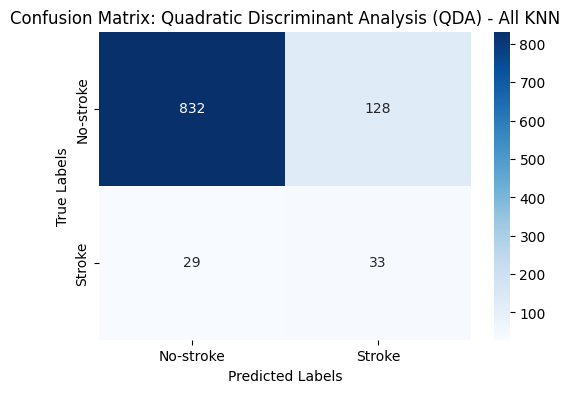

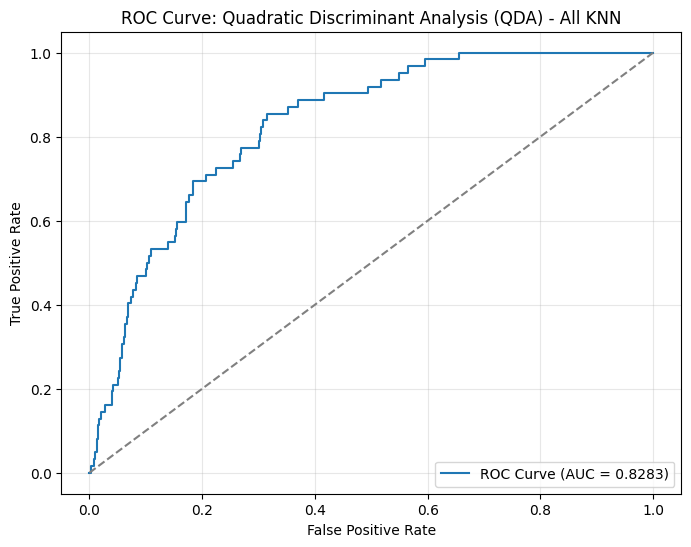


==================== Quadratic Discriminant Analysis (QDA) with Condensed Nearest Neighbor (CNN) ====================

Quadratic Discriminant Analysis (QDA) with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9198
Precision: 0.2917
Recall: 0.2258
F1 Score: 0.2545
ROC-AUC Score: 0.8174

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.29      0.23      0.25        62

    accuracy                           0.92      1022
   macro avg       0.62      0.60      0.61      1022
weighted avg       0.91      0.92      0.91      1022


Confusion Matrix:
[[926  34]
 [ 48  14]]


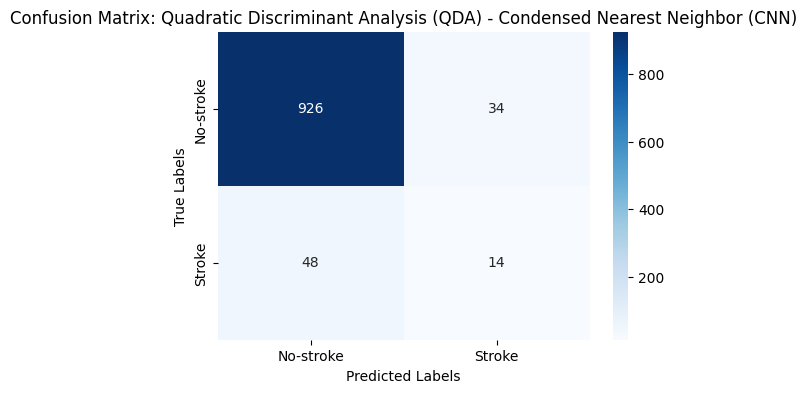

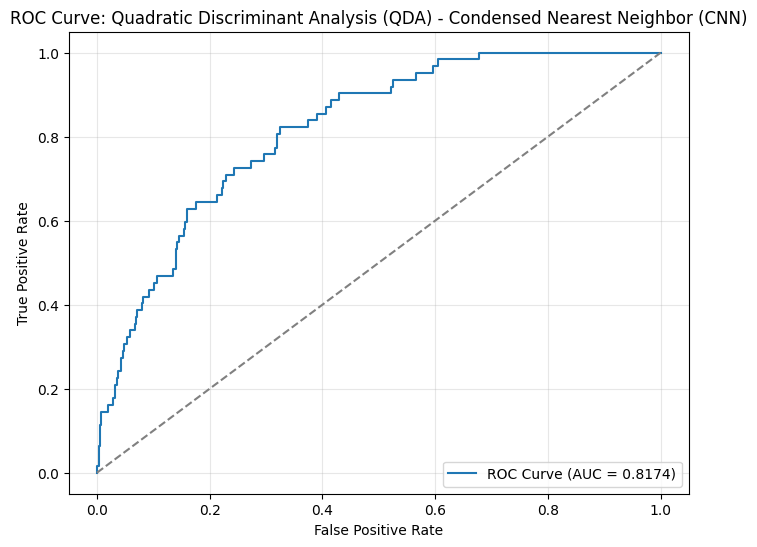


==================== Quadratic Discriminant Analysis (QDA) with One-Sided Selection (OSS) ====================

Quadratic Discriminant Analysis (QDA) with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.8757
Precision: 0.2400
Recall: 0.4839
F1 Score: 0.3209
ROC-AUC Score: 0.8298

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       960
           1       0.24      0.48      0.32        62

    accuracy                           0.88      1022
   macro avg       0.60      0.69      0.63      1022
weighted avg       0.92      0.88      0.89      1022


Confusion Matrix:
[[865  95]
 [ 32  30]]


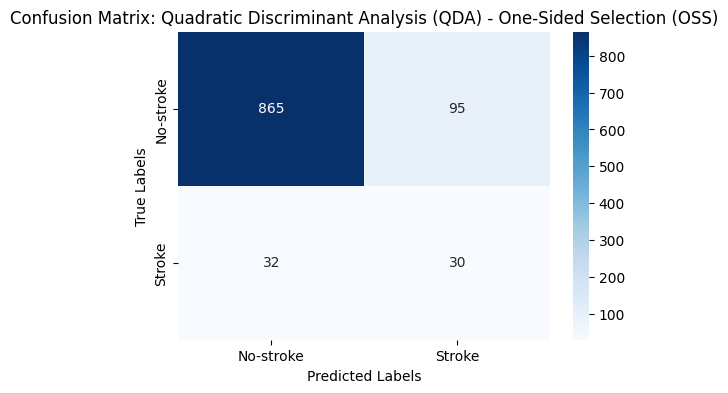

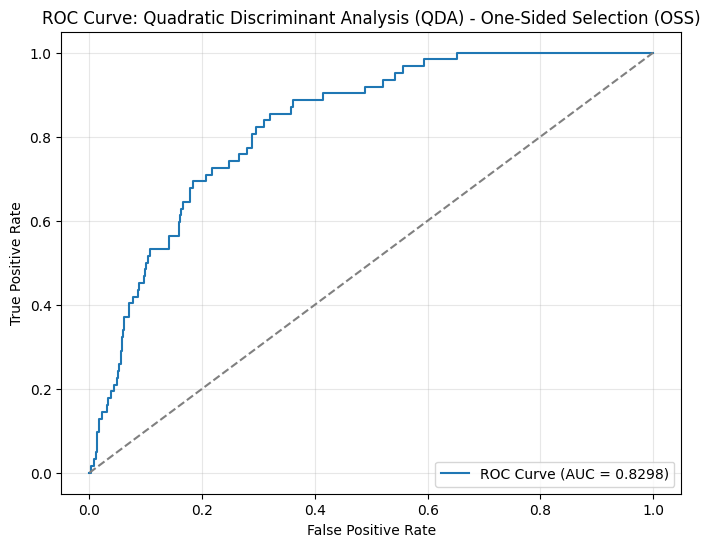


==================== Quadratic Discriminant Analysis (QDA) with Neighborhood Cleaning Rule (NCR) ====================

Quadratic Discriminant Analysis (QDA) with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8699
Precision: 0.2409
Recall: 0.5323
F1 Score: 0.3317
ROC-AUC Score: 0.8293

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.89      0.93       960
           1       0.24      0.53      0.33        62

    accuracy                           0.87      1022
   macro avg       0.60      0.71      0.63      1022
weighted avg       0.92      0.87      0.89      1022


Confusion Matrix:
[[856 104]
 [ 29  33]]


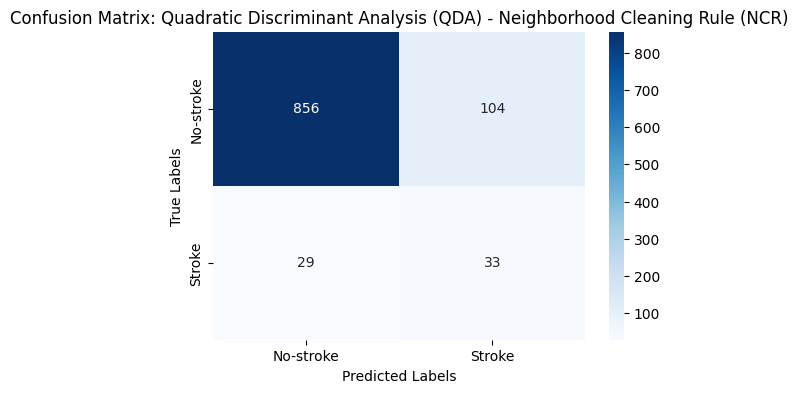

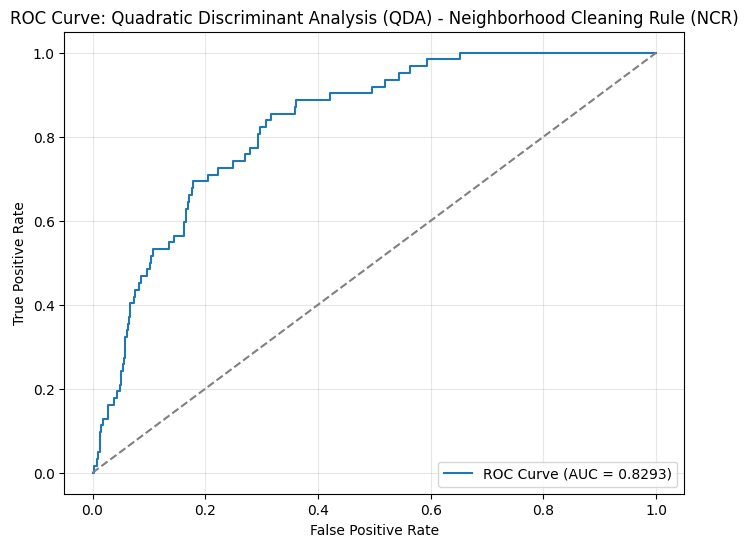


==================== Quadratic Discriminant Analysis (QDA) with Instance Hardness Threshold ====================

Quadratic Discriminant Analysis (QDA) with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7485
Precision: 0.1579
Recall: 0.7258
F1 Score: 0.2594
ROC-AUC Score: 0.8102

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.73      0.26        62

    accuracy                           0.75      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[720 240]
 [ 17  45]]


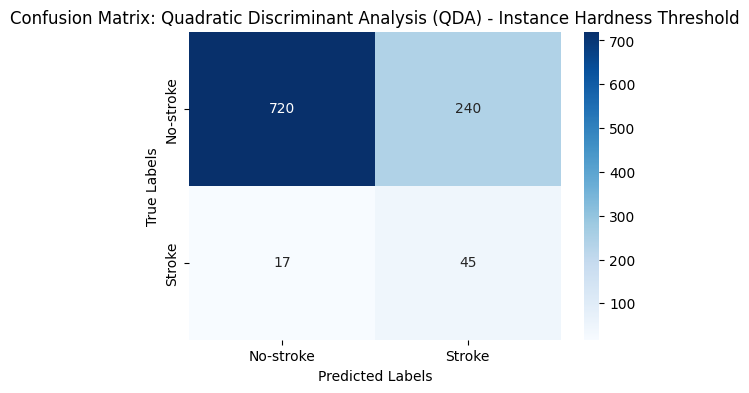

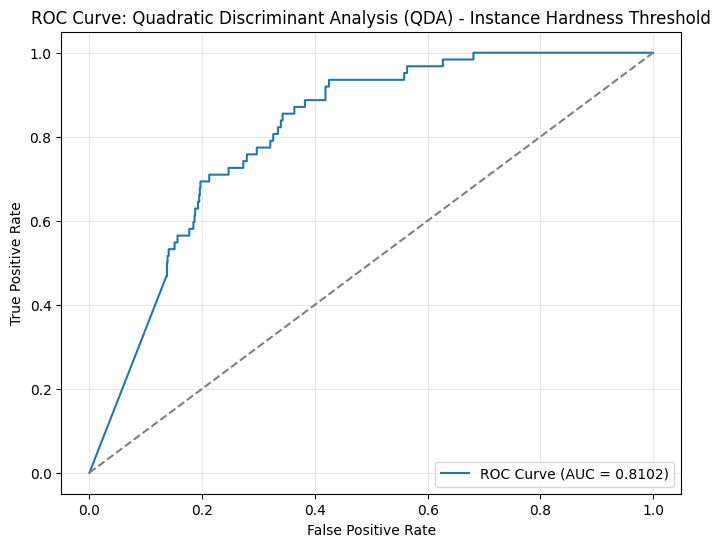


==================== AdaBoost with None ====================

AdaBoost with None Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8387

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


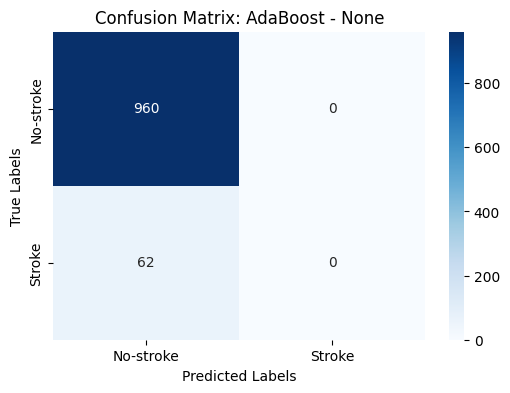

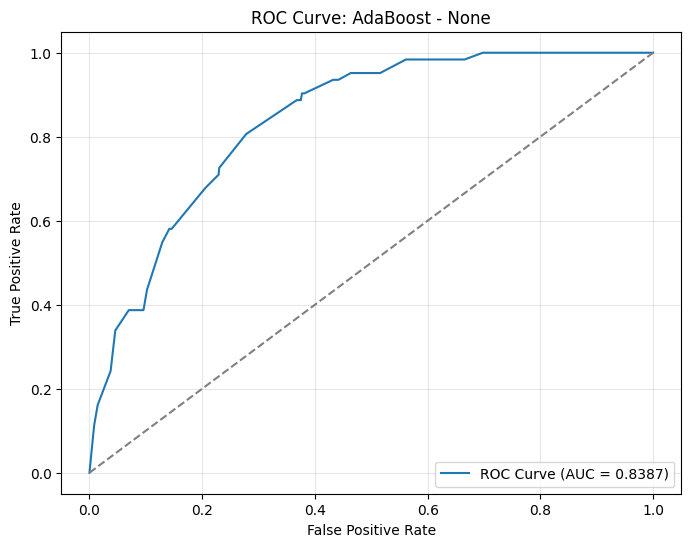


==================== AdaBoost with SMOTE ====================

AdaBoost with SMOTE Evaluation Metrics:
Accuracy: 0.7524
Precision: 0.1476
Recall: 0.6452
F1 Score: 0.2402
ROC-AUC Score: 0.8082

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.76      0.85       960
           1       0.15      0.65      0.24        62

    accuracy                           0.75      1022
   macro avg       0.56      0.70      0.55      1022
weighted avg       0.92      0.75      0.82      1022


Confusion Matrix:
[[729 231]
 [ 22  40]]


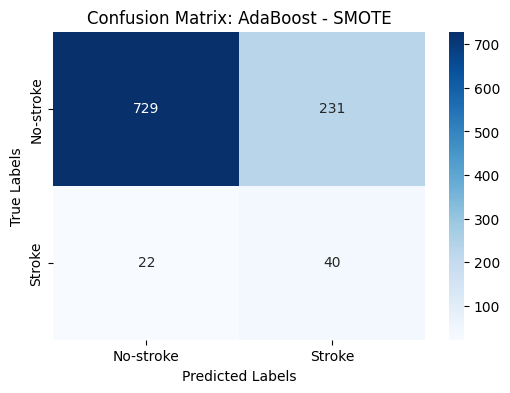

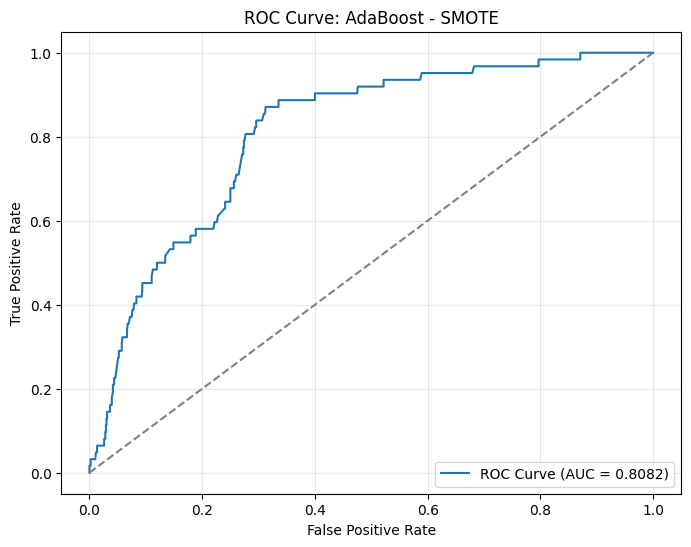


==================== AdaBoost with ClusterCentroids ====================

AdaBoost with ClusterCentroids Evaluation Metrics:
Accuracy: 0.2818
Precision: 0.0779
Recall: 1.0000
F1 Score: 0.1445
ROC-AUC Score: 0.7105

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.24      0.38       960
           1       0.08      1.00      0.14        62

    accuracy                           0.28      1022
   macro avg       0.54      0.62      0.26      1022
weighted avg       0.94      0.28      0.37      1022


Confusion Matrix:
[[226 734]
 [  0  62]]


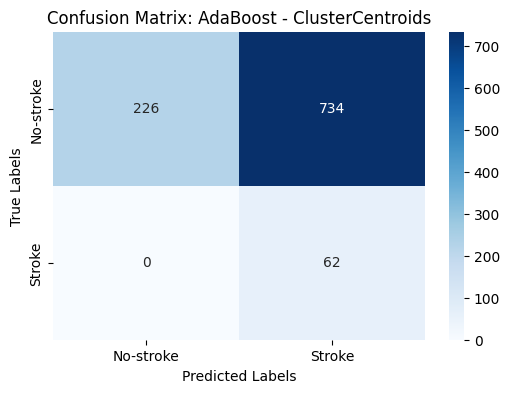

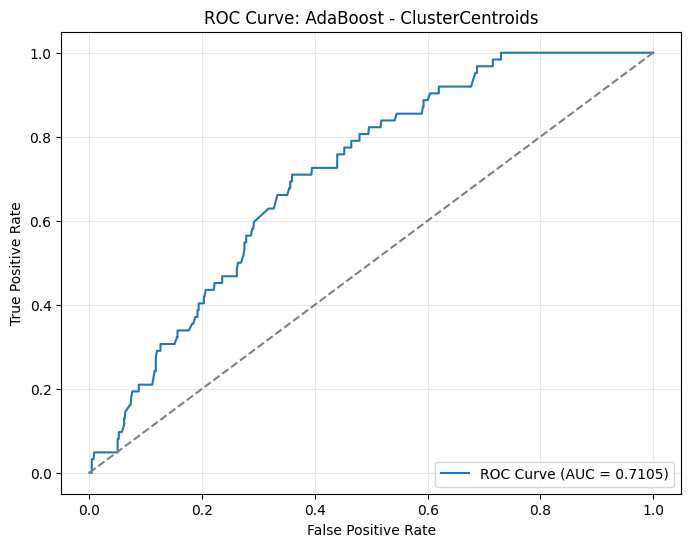


==================== AdaBoost with Random Undersampling ====================

AdaBoost with Random Undersampling Evaluation Metrics:
Accuracy: 0.6468
Precision: 0.1327
Recall: 0.8710
F1 Score: 0.2303
ROC-AUC Score: 0.8424

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.63      0.77       960
           1       0.13      0.87      0.23        62

    accuracy                           0.65      1022
   macro avg       0.56      0.75      0.50      1022
weighted avg       0.94      0.65      0.74      1022


Confusion Matrix:
[[607 353]
 [  8  54]]


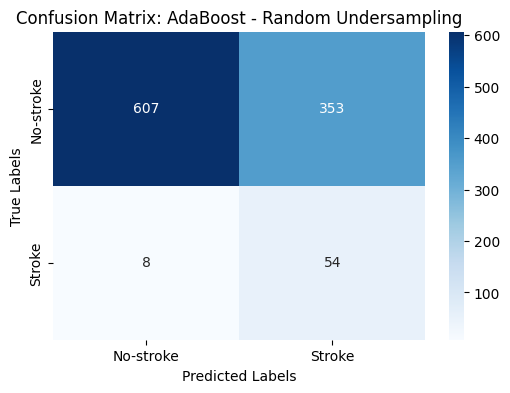

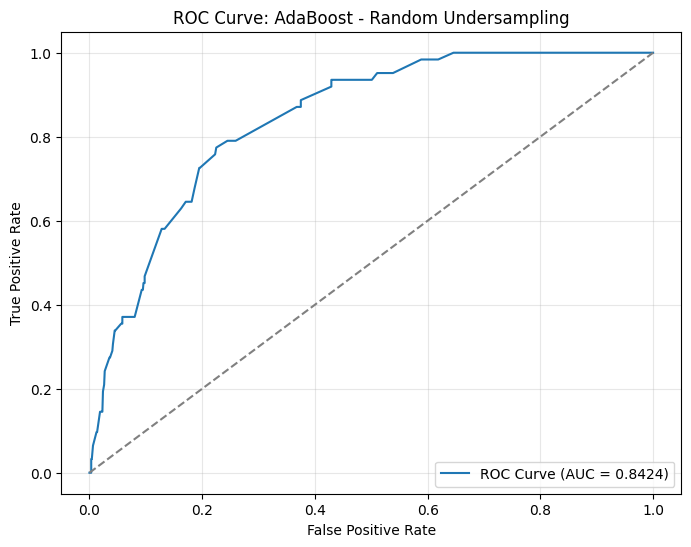


==================== AdaBoost with NearMiss-1 ====================

AdaBoost with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2290
Precision: 0.0428
Recall: 0.5484
F1 Score: 0.0794
ROC-AUC Score: 0.3299

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.21      0.34       960
           1       0.04      0.55      0.08        62

    accuracy                           0.23      1022
   macro avg       0.46      0.38      0.21      1022
weighted avg       0.83      0.23      0.32      1022


Confusion Matrix:
[[200 760]
 [ 28  34]]


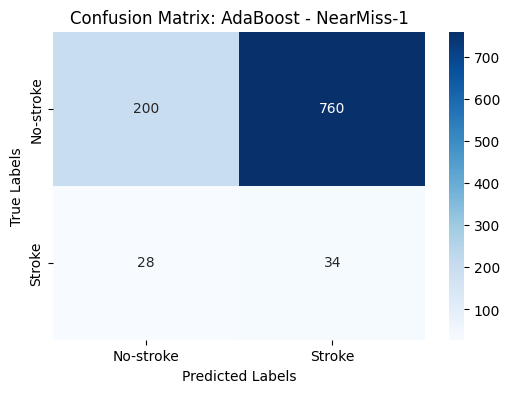

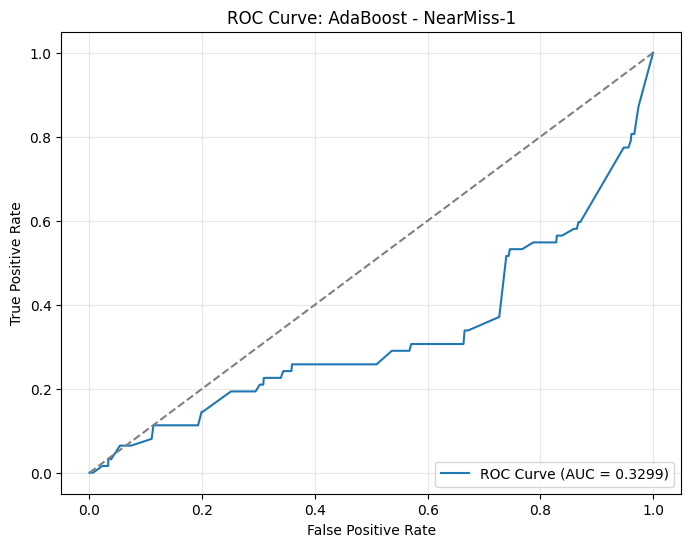


==================== AdaBoost with NearMiss-2 ====================

AdaBoost with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1135
Precision: 0.0631
Recall: 0.9839
F1 Score: 0.1187
ROC-AUC Score: 0.7818

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.06      0.11       960
           1       0.06      0.98      0.12        62

    accuracy                           0.11      1022
   macro avg       0.52      0.52      0.11      1022
weighted avg       0.93      0.11      0.11      1022


Confusion Matrix:
[[ 55 905]
 [  1  61]]


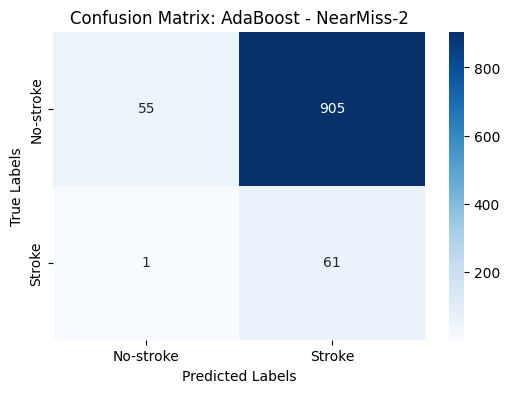

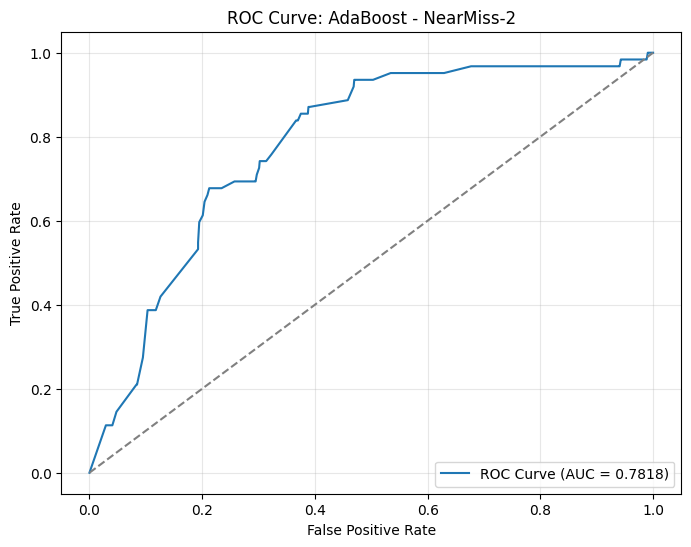


==================== AdaBoost with NearMiss-3 ====================

AdaBoost with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7045
Precision: 0.1273
Recall: 0.6613
F1 Score: 0.2135
ROC-AUC Score: 0.7476

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.71      0.82       960
           1       0.13      0.66      0.21        62

    accuracy                           0.70      1022
   macro avg       0.55      0.68      0.52      1022
weighted avg       0.92      0.70      0.78      1022


Confusion Matrix:
[[679 281]
 [ 21  41]]


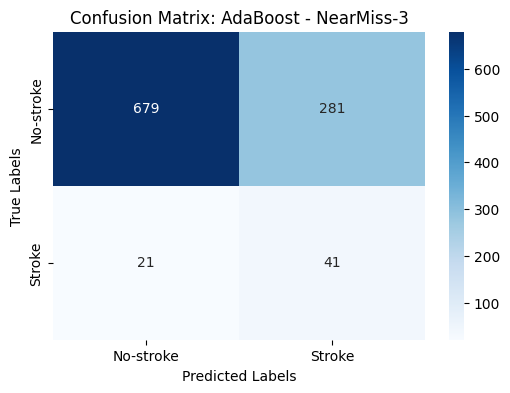

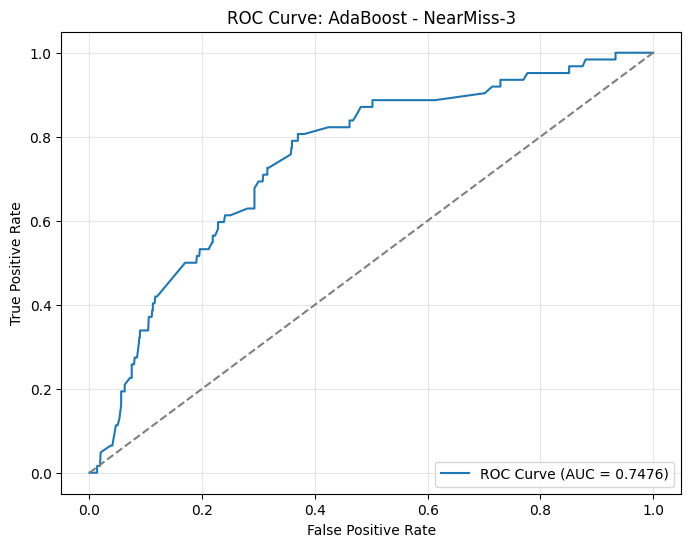


==================== AdaBoost with Tomek Links ====================

AdaBoost with Tomek Links Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8541

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


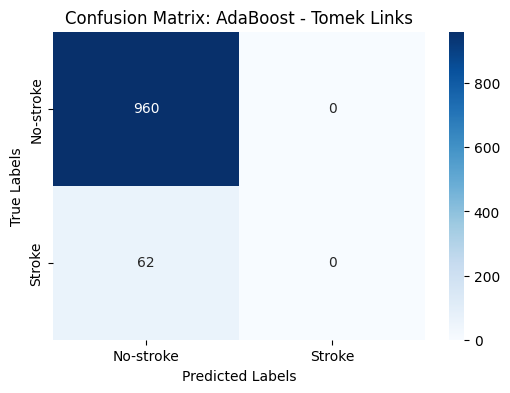

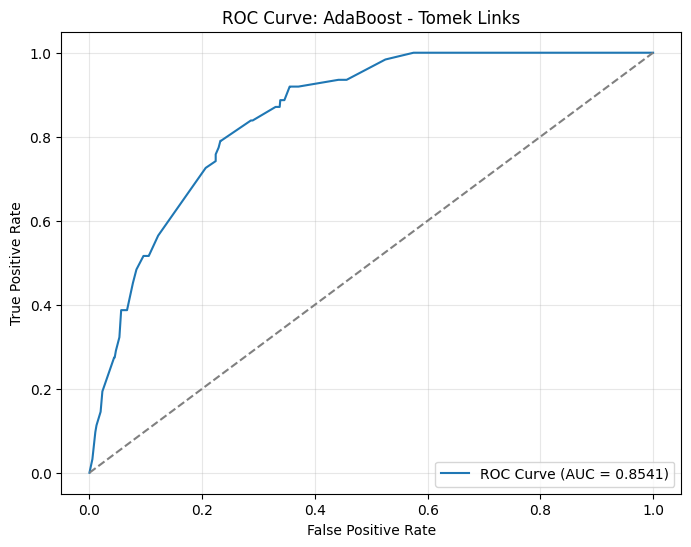


==================== AdaBoost with Edited Nearest Neighbors (ENN) ====================

AdaBoost with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9354
Precision: 0.3000
Recall: 0.0484
F1 Score: 0.0833
ROC-AUC Score: 0.8566

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.30      0.05      0.08        62

    accuracy                           0.94      1022
   macro avg       0.62      0.52      0.52      1022
weighted avg       0.90      0.94      0.91      1022


Confusion Matrix:
[[953   7]
 [ 59   3]]


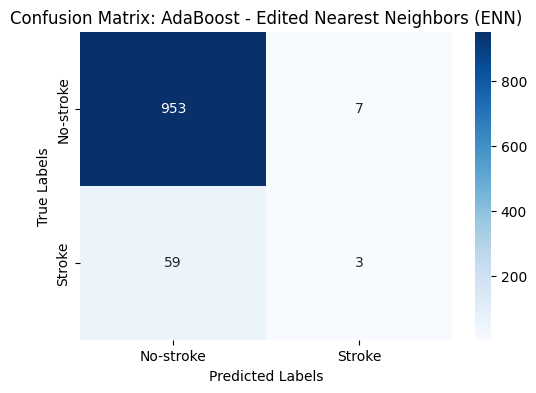

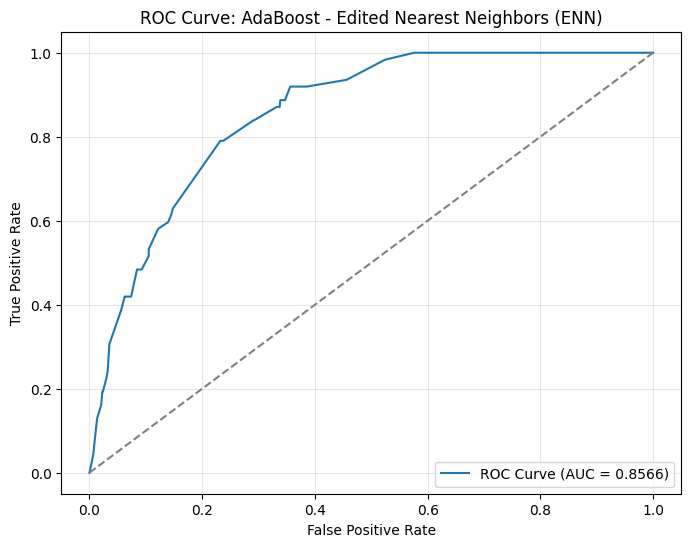


==================== AdaBoost with Repeated Edited Nearest Neighbors (RENN) ====================

AdaBoost with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9286
Precision: 0.3659
Recall: 0.2419
F1 Score: 0.2913
ROC-AUC Score: 0.8558

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.37      0.24      0.29        62

    accuracy                           0.93      1022
   macro avg       0.66      0.61      0.63      1022
weighted avg       0.92      0.93      0.92      1022


Confusion Matrix:
[[934  26]
 [ 47  15]]


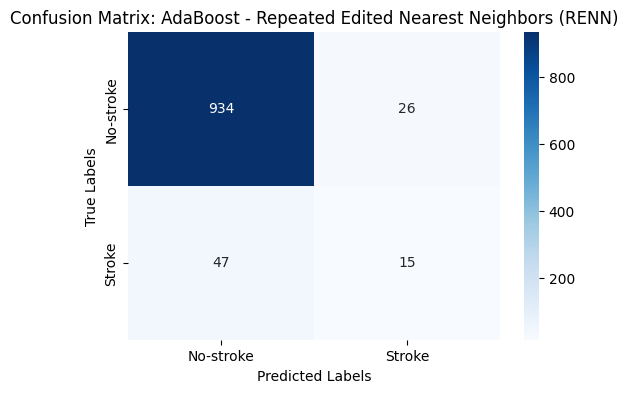

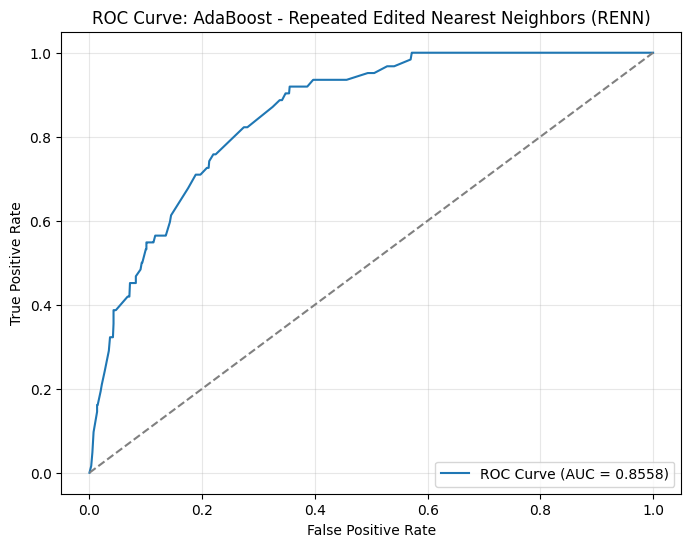


==================== AdaBoost with All KNN ====================

AdaBoost with All KNN Evaluation Metrics:
Accuracy: 0.9295
Precision: 0.3333
Recall: 0.1613
F1 Score: 0.2174
ROC-AUC Score: 0.8547

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.33      0.16      0.22        62

    accuracy                           0.93      1022
   macro avg       0.64      0.57      0.59      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[940  20]
 [ 52  10]]


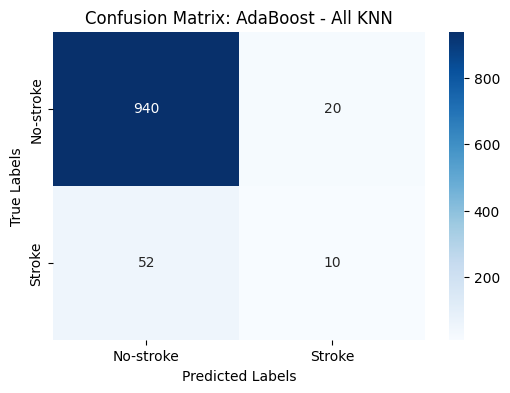

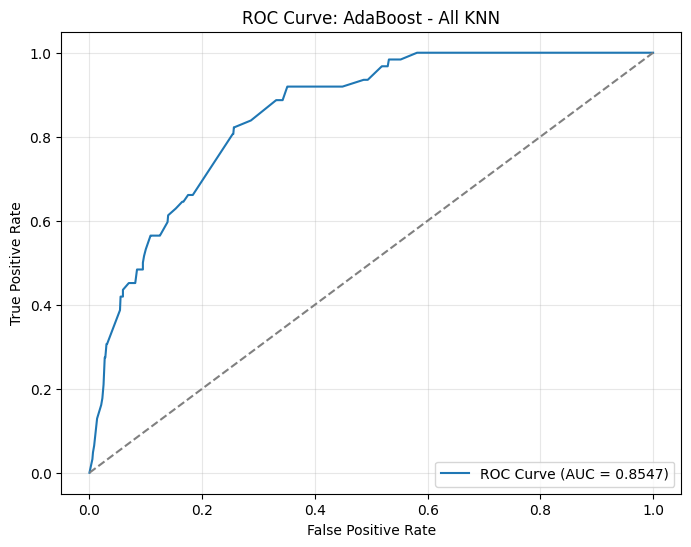


==================== AdaBoost with Condensed Nearest Neighbor (CNN) ====================

AdaBoost with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.7873

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


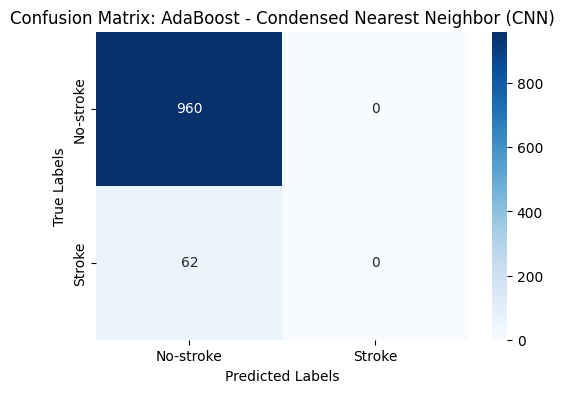

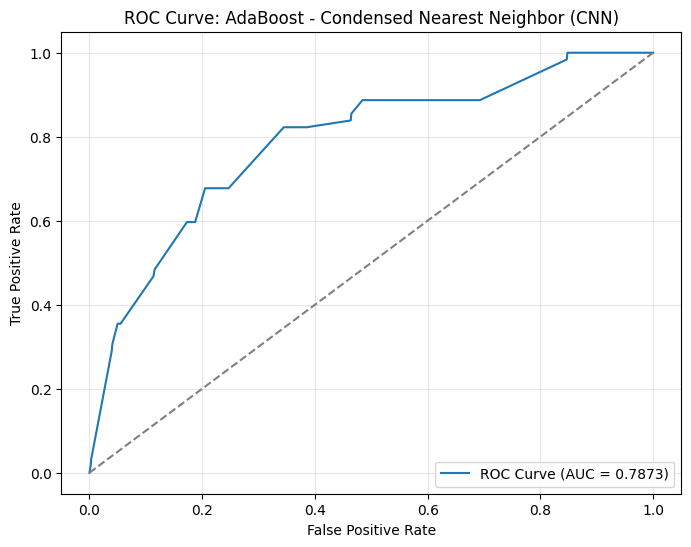


==================== AdaBoost with One-Sided Selection (OSS) ====================

AdaBoost with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8519

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


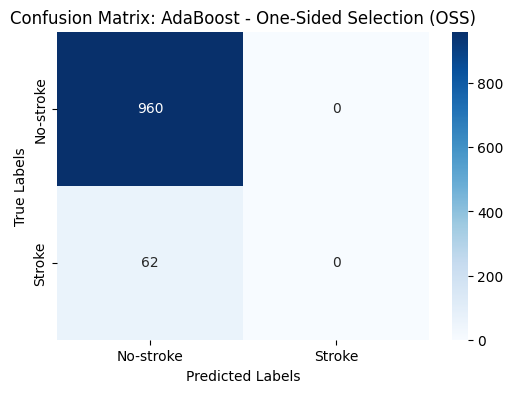

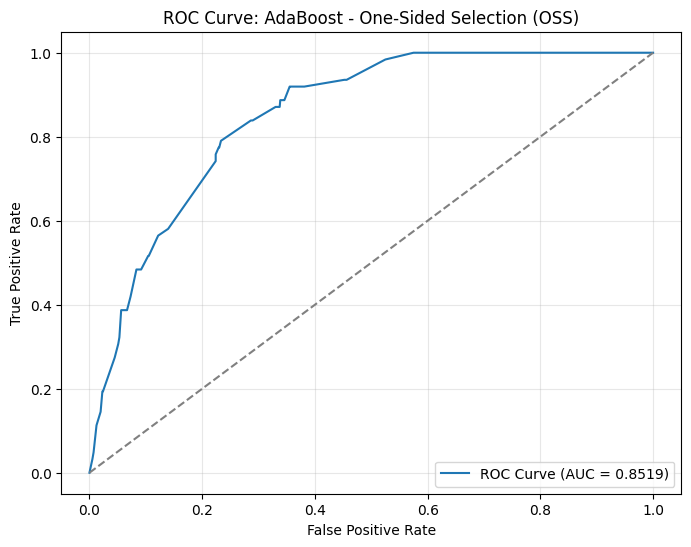


==================== AdaBoost with Neighborhood Cleaning Rule (NCR) ====================

AdaBoost with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9364
Precision: 0.2857
Recall: 0.0323
F1 Score: 0.0580
ROC-AUC Score: 0.8561

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.29      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.61      0.51      0.51      1022
weighted avg       0.90      0.94      0.91      1022


Confusion Matrix:
[[955   5]
 [ 60   2]]


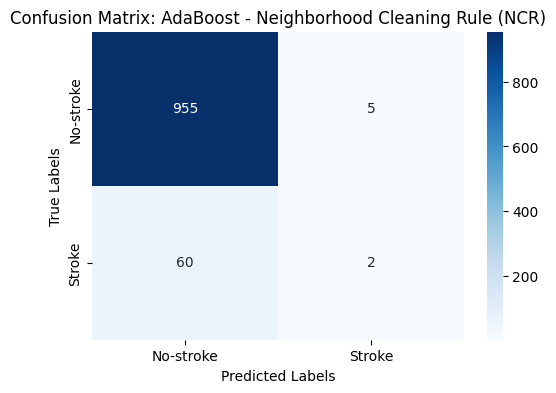

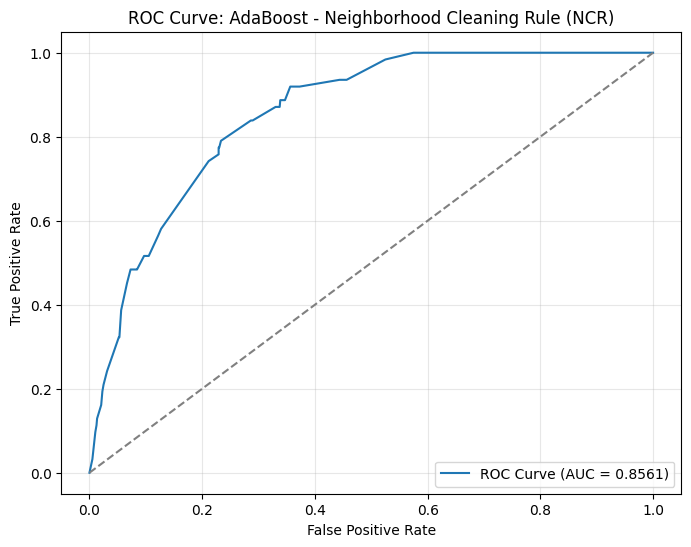


==================== AdaBoost with Instance Hardness Threshold ====================

AdaBoost with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7671
Precision: 0.1692
Recall: 0.7258
F1 Score: 0.2744
ROC-AUC Score: 0.8424

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       960
           1       0.17      0.73      0.27        62

    accuracy                           0.77      1022
   macro avg       0.57      0.75      0.57      1022
weighted avg       0.93      0.77      0.83      1022


Confusion Matrix:
[[739 221]
 [ 17  45]]


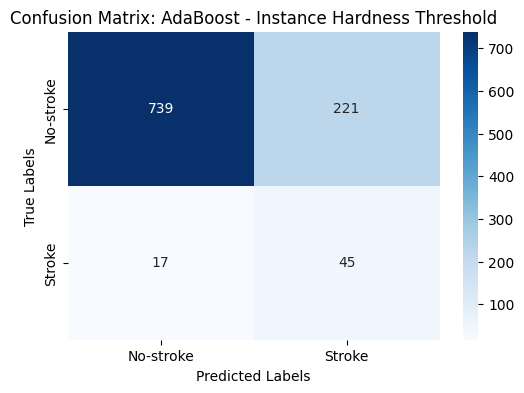

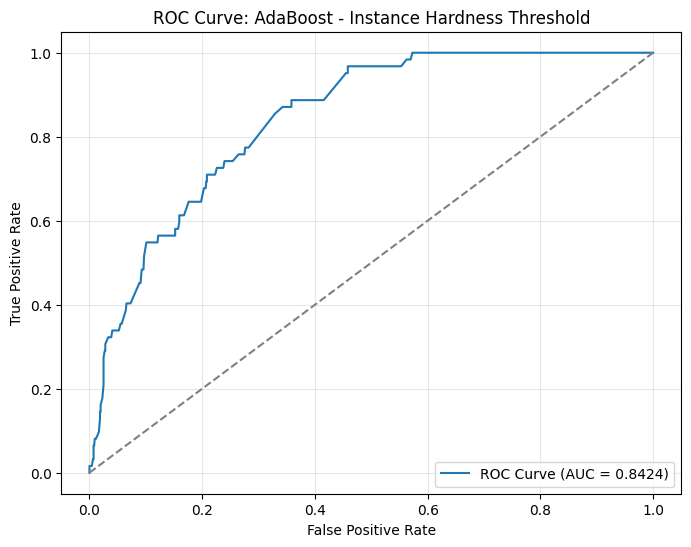

In [142]:
# Loop through models and resampling techniques
for model_name, model in models.items():
    for method_name, method in methods.items():
        print(f"\n{'='*20} {model_name} with {method_name} {'='*20}")

        # Apply resampling if necessary
        if method_name == 'None':
            X_resampled, y_resampled = X_train, y_train  # No resampling
        else:
            X_resampled, y_resampled = method.fit_resample(X_train, y_train)

        # Standardize resampled features
        scaler = StandardScaler()
        X_resampled_scaled = scaler.fit_transform(X_resampled)
        X_test_scaled = scaler.transform(X_test)

        # Train model
        model.fit(X_resampled_scaled, y_resampled)

        # Make predictions
        y_pred = model.predict(X_test_scaled)
        y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]

        # Store predictions for each model and resampling method
        predictions_dict[f'Y_pred_{model_name}_{method_name}'] = y_pred.tolist()

        # Evaluate model
        evaluate_model(y_test, y_pred, y_pred_proba, model_name, method_name)

In [143]:
# Convert evaluation results to DataFrame
# Set display all rows and columns
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None)  # Adjust width to fit screen
pd.set_option('display.max_colwidth', None)  # Show full content in each cell
df_results = pd.DataFrame(evaluation_results)
df_results

,Model,Method,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,Random Forest,None,0.939335,0.000000,0.000000,0.000000,0.810064
1,Random Forest,SMOTE,0.901174,0.169492,0.161290,0.165289,0.783795
2,Random Forest,ClusterCentroids,0.234834,0.073460,1.000000,0.136865,0.730192
3,Random Forest,Random Undersampling,0.730920,0.164038,0.838710,0.274406,0.828889
4,Random Forest,NearMiss-1,0.189824,0.045131,0.612903,0.084071,0.335559
5,Random Forest,NearMiss-2,0.119374,0.062630,0.967742,0.117647,0.679872
6,Random Forest,NearMiss-3,0.674168,0.107246,0.596774,0.181818,0.665197
7,Random Forest,Tomek Links,0.940313,1.000000,0.016129,0.031746,0.818389
8,Random Forest,Edited Nearest Neighbors (ENN),0.942270,0.800000,0.064516,0.119403,0.835761
9,Random Forest,Repeated Edited Nearest Neighbors (RENN),0.925636,0.294118,0.161290,0.208333,0.815037


In [144]:
# Convert predictions to DataFrame
df_predictions = pd.DataFrame(predictions_dict)

In [145]:
# Save results to an Excel file
with pd.ExcelWriter('model_results.xlsx', engine='openpyxl') as writer:
    df_results.to_excel(writer, sheet_name='Evaluation_Metrics', index=False)
    df_predictions.to_excel(writer, sheet_name='Predictions', index=False)

print("Results successfully saved to 'model_results.xlsx'")

Results successfully saved to 'model_results.xlsx'


### Perform Pair T-test